# 1. DATA COLLECTION

In [1]:
# required Libraries....
import pandas as pd
import numpy as np
import math
import os
import seaborn as sns
import time
import copy
import matplotlib.pyplot as plt
import warnings
import torch
import torch.nn as nn
import torch.optim as optim
import lightgbm as lgb

from torch.utils.data import TensorDataset, DataLoader, Subset

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_val_predict, StratifiedKFold
from sklearn.multiclass import OneVsRestClassifier
from sklearn.pipeline import Pipeline
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.model_selection import GridSearchCV
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.utils import resample
from sklearn.multiclass import OneVsRestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.kernel_approximation import RBFSampler
from sklearn.metrics import (
    balanced_accuracy_score,
    make_scorer,
    balanced_accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    log_loss,
    roc_auc_score,
    classification_report,
    ConfusionMatrixDisplay,
    confusion_matrix,
    roc_curve,
    auc
)
from imblearn.pipeline import Pipeline as ImbPipeline  
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
# Classifiers
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from kan import KAN

# Suppress the specific PerformanceWarning
from pandas.errors import PerformanceWarning
warnings.simplefilter(action='ignore', category=PerformanceWarning)

Kindly download file from https://www.cdc.gov/brfss/annual_data/annual_2023.html

In [4]:
# Ready our dataset from your PC directory after conversion from SAS format and saving it into your PC
datasets = pd.read_csv("LLCP2023.csv")
#datasets

In [5]:
# Remove rows with invalid DIABETE4 values from the training set
# Create a test set by filtering invalid entries (e.g., 7, 9 or blank)
datasets = datasets[~datasets['DIABETE4'].isin([2])].copy()

# Keep only the valid classes: 1 = Diabetes, 3 = No Diabetes, 4 = Pre-diabetes
df1 = datasets[datasets['DIABETE4'].isin([1, 3, 4])].copy()

# Create a test set by filtering invalid entries (e.g., 7, 9 or blank)
df2 = datasets[~datasets['DIABETE4'].isin([1, 3, 4])].copy()


# 2. DATA PREPROCESSING

✅ Goal: Clean, structure, and prepare data for model input.



In [6]:
print(df1.shape)
print(df2.shape)

(429086, 350)
(984, 350)


In [7]:
# Select numeric columns
numeric_features = df1.select_dtypes(include=[np.number]).columns.tolist()

# Print the list
print("Numeric features:")
for feature in numeric_features:
    print("-", feature)

Numeric features:
- _STATE
- FMONTH
- IDATE
- IMONTH
- IDAY
- IYEAR
- DISPCODE
- SEQNO
- _PSU
- CTELENM1
- PVTRESD1
- COLGHOUS
- STATERE1
- CELPHON1
- LADULT1
- NUMADULT
- RESPSLC1
- LANDSEX2
- LNDSXBRT
- SAFETIME
- CTELNUM1
- CELLFON5
- CADULT1
- CELLSEX2
- CELSXBRT
- PVTRESD3
- CCLGHOUS
- CSTATE1
- LANDLINE
- HHADULT
- SEXVAR
- GENHLTH
- PHYSHLTH
- MENTHLTH
- POORHLTH
- PRIMINS1
- PERSDOC3
- MEDCOST1
- CHECKUP1
- EXERANY2
- EXRACT12
- EXEROFT1
- EXERHMM1
- EXRACT22
- EXEROFT2
- EXERHMM2
- STRENGTH
- BPHIGH6
- BPMEDS1
- CHOLCHK3
- TOLDHI3
- CHOLMED3
- CVDINFR4
- CVDCRHD4
- CVDSTRK3
- ASTHMA3
- ASTHNOW
- CHCSCNC1
- CHCOCNC1
- CHCCOPD3
- ADDEPEV3
- CHCKDNY2
- HAVARTH4
- DIABETE4
- DIABAGE4
- MARITAL
- EDUCA
- RENTHOM1
- NUMHHOL4
- NUMPHON4
- CPDEMO1C
- VETERAN3
- EMPLOY1
- CHILDREN
- INCOME3
- PREGNANT
- WEIGHT2
- HEIGHT3
- DEAF
- BLIND
- DECIDE
- DIFFWALK
- DIFFDRES
- DIFFALON
- FALL12MN
- FALLINJ5
- SMOKE100
- SMOKDAY2
- USENOW3
- ECIGNOW2
- ALCDAY4
- AVEDRNK3
- DRNK3GE5
- MAXDRNKS
- 

In [9]:
# Set display option to show all columns
pd.set_option('display.max_columns', 350)
# Preview the first few rows of the dataset
df1.head()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENM1,PVTRESD1,COLGHOUS,STATERE1,CELPHON1,LADULT1,NUMADULT,RESPSLC1,LANDSEX2,LNDSXBRT,SAFETIME,CTELNUM1,CELLFON5,CADULT1,CELLSEX2,CELSXBRT,PVTRESD3,CCLGHOUS,CSTATE1,LANDLINE,HHADULT,SEXVAR,GENHLTH,PHYSHLTH,MENTHLTH,POORHLTH,PRIMINS1,PERSDOC3,MEDCOST1,CHECKUP1,EXERANY2,EXRACT12,EXEROFT1,EXERHMM1,EXRACT22,EXEROFT2,EXERHMM2,STRENGTH,BPHIGH6,BPMEDS1,CHOLCHK3,TOLDHI3,CHOLMED3,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,ASTHNOW,CHCSCNC1,CHCOCNC1,CHCCOPD3,ADDEPEV3,CHCKDNY2,HAVARTH4,DIABETE4,DIABAGE4,MARITAL,EDUCA,RENTHOM1,NUMHHOL4,NUMPHON4,CPDEMO1C,VETERAN3,EMPLOY1,CHILDREN,INCOME3,PREGNANT,WEIGHT2,HEIGHT3,DEAF,BLIND,DECIDE,DIFFWALK,DIFFDRES,DIFFALON,FALL12MN,FALLINJ5,SMOKE100,SMOKDAY2,USENOW3,ECIGNOW2,ALCDAY4,AVEDRNK3,DRNK3GE5,MAXDRNKS,FLUSHOT7,FLSHTMY3,PNEUVAC4,SHINGLE2,HIVTST7,HIVTSTD3,SEATBELT,DRNKDRI2,COVIDPO1,COVIDSM1,COVIDACT,PDIABTS1,PREDIAB2,DIABTYPE,INSULIN1,CHKHEMO3,EYEEXAM1,DIABEYE1,DIABEDU1,FEETSORE,ARTHEXER,ARTHEDU,LMTJOIN3,ARTHDIS2,JOINPAI2,LCSFIRST,LCSLAST,LCSNUMCG,LCSCTSC1,LCSSCNCR,LCSCTWHN,HADMAM,HOWLONG,CERVSCRN,CRVCLCNC,CRVCLPAP,CRVCLHPV,HADHYST2,PSATEST1,PSATIME1,PCPSARS2,PSASUGS1,PCSTALK2,HADSIGM4,COLNSIGM,COLNTES1,SIGMTES1,LASTSIG4,COLNCNCR,VIRCOLO1,VCLNTES2,SMALSTOL,STOLTEST,STOOLDN2,BLDSTFIT,SDNATES1,CNCRDIFF,CNCRAGE,CNCRTYP2,CSRVTRT3,CSRVDOC1,CSRVSUM,CSRVRTRN,CSRVINST,CSRVINSR,CSRVDEIN,CSRVCLIN,CSRVPAIN,CSRVCTL2,INDORTAN,NUMBURN3,SUNPRTCT,WKDAYOUT,WKENDOUT,CIMEMLO1,CDWORRY,CDDISCU1,CDHOUS1,CDSOCIA1,CAREGIV1,CRGVREL4,CRGVLNG1,CRGVHRS1,CRGVPRB3,CRGVALZD,CRGVPER1,CRGVHOU1,CRGVEXPT,LASTSMK2,STOPSMK2,MENTCIGS,MENTECIG,HEATTBCO,FIREARM5,GUNLOAD,LOADULK2,HASYMP1,HASYMP2,HASYMP3,HASYMP4,HASYMP5,HASYMP6,STRSYMP1,STRSYMP2,STRSYMP3,STRSYMP4,STRSYMP5,STRSYMP6,FIRSTAID,ASPIRIN,BIRTHSEX,SOMALE,SOFEMALE,TRNSGNDR,MARIJAN1,MARJSMOK,MARJEAT,MARJVAPE,MARJDAB,MARJOTHR,USEMRJN4,ACEDEPRS,ACEDRINK,ACEDRUGS,ACEPRISN,ACEDIVRC,ACEPUNCH,ACEHURT1,ACESWEAR,ACETOUCH,ACETTHEM,ACEHVSEX,ACEADSAF,ACEADNED,IMFVPLA4,HPVADVC4,HPVADSHT,TETANUS1,COVIDVA1,COVACGE1,COVIDNU2,LSATISFY,EMTSUPRT,SDLONELY,SDHEMPLY,FOODSTMP,SDHFOOD1,SDHBILLS,SDHUTILS,SDHTRNSP,SDHSTRE1,RRCLASS3,RRCOGNT2,RRTREAT,RRATWRK2,RRHCARE4,RRPHYSM2,RCSGEND1,RCSXBRTH,RCSRLTN2,CASTHDX2,CASTHNO2,QSTVER,QSTLANG,_METSTAT,_URBSTAT,MSCODE,_STSTR,_STRWT,_RAWRAKE,_WT2RAKE,_IMPRACE,_CHISPNC,_CRACE1,CAGEG,_CLLCPWT,_DUALUSE,_DUALCOR,_LLCPWT2,_LLCPWT,_RFHLTH,_PHYS14D,_MENT14D,_HLTHPL1,_HCVU653,_TOTINDA,METVL12_,METVL22_,MAXVO21_,FC601_,ACTIN13_,ACTIN23_,PADUR1_,PADUR2_,PAFREQ1_,PAFREQ2_,_MINAC12,_MINAC22,STRFREQ_,PAMISS3_,PAMIN13_,PAMIN23_,PA3MIN_,PAVIG13_,PAVIG23_,PA3VIGM_,_PACAT3,_PAINDX3,_PA150R4,_PA300R4,_PA30023,_PASTRNG,_PAREC3,_PASTAE3,_RFHYPE6,_CHOLCH3,_RFCHOL3,_MICHD,_LTASTH1,_CASTHM1,_ASTHMS1,_DRDXAR2,_MRACE1,_HISPANC,_RACE,_RACEG21,_RACEGR3,_RACEPRV,_SEX,_AGEG5YR,_AGE65YR,_AGE80,_AGE_G,HTIN4,HTM4,WTKG3,_BMI5,_BMI5CAT,_RFBMI5,_CHLDCNT,_EDUCAG,_INCOMG1,_SMOKER3,_RFSMOK3,_CURECI2,DRNKANY6,DROCDY4_,_RFBING6,_DRNKWK2,_RFDRHV8,_FLSHOT7,_PNEUMO3,_AIDTST4,_RFSEAT2,_RFSEAT3,_DRNKDRV
0,1.0,1.0,3012023,3,1,2023,1100.0,2023000001,2.023000e+09,1.0,1.0,NaN,1.0,2.0,1.0,2.0,1.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,88.0,88.0,NaN,3.0,1.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,888.0,1.0,1.0,3.0,2.0,2.0,2.0,2.0,2.0,2.0,NaN,2.0,2.0,2.0,2.0,2.0,2.0,1.0,57.0,1.0,5.0,1.0,2.0,NaN,1.0,2.0,7.0,88.0,99.0,NaN,172.0,503.0,2.0,2.0,2.0,1.0,2.0,2.0,88.0,NaN,2.0,NaN,3.0,1.0,888.0,NaN,NaN,NaN,2.0,NaN,2.0,2.0,2.0,NaN,1.0,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2

# Common LLCP2023 / BRFSS Variable Definitions
# Variable	 & Meaning

AGE:	Respondent's age in years (often grouped; sometimes AGE_G used).

SEX:	Biological sex: 1 = Male, 2 = Female

INCOME2:	Annual household income (grouped)

SMOKER3:	Smoking status: current, former, never

EDUCA:	Education level (e.g., less than high school, college graduate)

HLTHPLN1:	Has any kind of health insurance coverage?

GENHLTH:	Self-reported general health (excellent to poor)

EXERANY2:	Participated in physical activity in past 30 days?

DIABETE4:	Ever told you have diabetes? (with codes for pregnancy, prediabetes)

BMI5:	Body Mass Index × 100 (e.g., 2750 means BMI of 27.5)

PHYSHLTH:	Number of days physical health was "not good" in past 30 days

MENTHLTH:	Same as above, but for mental health

The full documentation for these codes is available in the BRFSS Codebook provided by the CDC.

In [10]:
df1.describe()

,_STATE,FMONTH,IDATE,IMONTH,IDAY,IYEAR,DISPCODE,SEQNO,_PSU,CTELENM1,PVTRESD1,COLGHOUS,STATERE1,CELPHON1,LADULT1,NUMADULT,RESPSLC1,LANDSEX2,LNDSXBRT,SAFETIME,CTELNUM1,CELLFON5,CADULT1,CELLSEX2,CELSXBRT,PVTRESD3,CCLGHOUS,CSTATE1,LANDLINE,HHADULT,SEXVAR,GENHLTH,PHYSHLTH,MENTHLTH,POORHLTH,PRIMINS1,PERSDOC3,MEDCOST1,CHECKUP1,EXERANY2,EXRACT12,EXEROFT1,EXERHMM1,EXRACT22,EXEROFT2,EXERHMM2,STRENGTH,BPHIGH6,BPMEDS1,CHOLCHK3,TOLDHI3,CHOLMED3,CVDINFR4,CVDCRHD4,CVDSTRK3,ASTHMA3,ASTHNOW,CHCSCNC1,CHCOCNC1,CHCCOPD3,ADDEPEV3,CHCKDNY2,HAVARTH4,DIABETE4,DIABAGE4,MARITAL,EDUCA,RENTHOM1,NUMHHOL4,NUMPHON4,CPDEMO1C,VETERAN3,EMPLOY1,CHILDREN,INCOME3,PREGNANT,WEIGHT2,HEIGHT3,DEAF,BLIND,DECIDE,DIFFWALK,DIFFDRES,DIFFALON,FALL12MN,FALLINJ5,SMOKE100,SMOKDAY2,USENOW3,ECIGNOW2,ALCDAY4,AVEDRNK3,DRNK3GE5,MAXDRNKS,FLUSHOT7,FLSHTMY3,PNEUVAC4,SHINGLE2,HIVTST7,HIVTSTD3,SEATBELT,DRNKDRI2,COVIDPO1,COVIDSM1,COVIDACT,PDIABTS1,PREDIAB2,DIABTYPE,INSULIN1,CHKHEMO3,EYEEXAM1,DIABEYE1,DIABEDU1,FEETSORE,ARTHEXER,ARTHEDU,LMTJOIN3,ARTHDIS2,JOINPAI2,LCSFIRST,LCSLAST,LCSNUMCG,LCSCTSC1,LCSSCNCR,LCSCTWHN,HADMAM,HOWLONG,CERVSCRN,CRVCLCNC,CRVCLPAP,CRVCLHPV,HADHYST2,PSATEST1,PSATIME1,PCPSARS2,PSASUGS1,PCSTALK2,HADSIGM4,COLNSIGM,COLNTES1,SIGMTES1,LASTSIG4,COLNCNCR,VIRCOLO1,VCLNTES2,SMALSTOL,STOLTEST,STOOLDN2,BLDSTFIT,SDNATES1,CNCRDIFF,CNCRAGE,CNCRTYP2,CSRVTRT3,CSRVDOC1,CSRVSUM,CSRVRTRN,CSRVINST,CSRVINSR,CSRVDEIN,CSRVCLIN,CSRVPAIN,CSRVCTL2,INDORTAN,NUMBURN3,SUNPRTCT,WKDAYOUT,WKENDOUT,CIMEMLO1,CDWORRY,CDDISCU1,CDHOUS1,CDSOCIA1,CAREGIV1,CRGVREL4,CRGVLNG1,CRGVHRS1,CRGVPRB3,CRGVALZD,CRGVPER1,CRGVHOU1,CRGVEXPT,LASTSMK2,STOPSMK2,MENTCIGS,MENTECIG,HEATTBCO,FIREARM5,GUNLOAD,LOADULK2,HASYMP1,HASYMP2,HASYMP3,HASYMP4,HASYMP5,HASYMP6,STRSYMP1,STRSYMP2,STRSYMP3,STRSYMP4,STRSYMP5,STRSYMP6,FIRSTAID,ASPIRIN,BIRTHSEX,SOMALE,SOFEMALE,TRNSGNDR,MARIJAN1,MARJSMOK,MARJEAT,MARJVAPE,MARJDAB,MARJOTHR,USEMRJN4,ACEDEPRS,ACEDRINK,ACEDRUGS,ACEPRISN,ACEDIVRC,ACEPUNCH,ACEHURT1,ACESWEAR,ACETOUCH,ACETTHEM,ACEHVSEX,ACEADSAF,ACEADNED,IMFVPLA4,HPVADVC4,HPVADSHT,TETANUS1,COVIDVA1,COVACGE1,COVIDNU2,LSATISFY,EMTSUPRT,SDLONELY,SDHEMPLY,FOODSTMP,SDHFOOD1,SDHBILLS,SDHUTILS,SDHTRNSP,SDHSTRE1,RRCLASS3,RRCOGNT2,RRTREAT,RRATWRK2,RRHCARE4,RRPHYSM2,RCSGEND1,RCSXBRTH,RCSRLTN2,CASTHDX2,CASTHNO2,QSTVER,QSTLANG,_METSTAT,_URBSTAT,MSCODE,_STSTR,_STRWT,_RAWRAKE,_WT2RAKE,_IMPRACE,_CHISPNC,_CRACE1,CAGEG,_CLLCPWT,_DUALUSE,_DUALCOR,_LLCPWT2,_LLCPWT,_RFHLTH,_PHYS14D,_MENT14D,_HLTHPL1,_HCVU653,_TOTINDA,METVL12_,METVL22_,MAXVO21_,FC601_,ACTIN13_,ACTIN23_,PADUR1_,PADUR2_,PAFREQ1_,PAFREQ2_,_MINAC12,_MINAC22,STRFREQ_,PAMISS3_,PAMIN13_,PAMIN23_,PA3MIN_,PAVIG13_,PAVIG23_,PA3VIGM_,_PACAT3,_PAINDX3,_PA150R4,_PA300R4,_PA30023,_PASTRNG,_PAREC3,_PASTAE3,_RFHYPE6,_CHOLCH3,_RFCHOL3,_MICHD,_LTASTH1,_CASTHM1,_ASTHMS1,_DRDXAR2,_MRACE1,_HISPANC,_RACE,_RACEG21,_RACEGR3,_RACEPRV,_SEX,_AGEG5YR,_AGE65YR,_AGE80,_AGE_G,HTIN4,HTM4,WTKG3,_BMI5,_BMI5CAT,_RFBMI5,_CHLDCNT,_EDUCAG,_INCOMG1,_SMOKER3,_RFSMOK3,_CURECI2,DRNKANY6,DROCDY4_,_RFBING6,_DRNKWK2,_RFDRHV8,_FLSHOT7,_PNEUMO3,_AIDTST4,_RFSEAT2,_RFSEAT3,_DRNKDRV
count,429086.000000,429086.000000,4.290860e+05,429086.000000,429086.000000,429086.000000,429086.000000,4.290860e+05,4.290860e+05,87770.0,87770.000000,12.0,87770.000000,87771.000000,87770.000000,87755.000000,52024.000000,69986.000000,165.000000,341316.0,341316.0,341316.0,341316.0,341314.000000,2546.000000,341316.000000,1339.000000,341306.000000,341315.000000,341312.000000,429086.000000,429084.000000,429085.000000,429085.000000,249267.000000,429083.000000,429085.000000,429086.000000,429086.000000,429086.000000,322134.000000,320000.000000,319998.000000,319999.000000,226682.000000,226682.000000,429085.000000,429086.000000,174979.000000,429086.000000,378043.000000,376433.000000,429086.000000,429086.000000,429085.000000,429086.000000,63540.000000,429086.000000,429086.000000,429086.000000,429086.000000,429086.000000,429086.000000,429086.000000,59786.000000,429084.000000,429082.000000,429083.000000,87770.000000,7288.000000,429047.000000,427890.000000,426155.000000,424057

# a. Handle Missing Values

data = data.dropna()  # or use imputation


In [11]:
# PRINTING MISSING VALUES
missing_values = df1.isna().sum().sort_values(ascending=False)
missing_list = [f"{col}: {count}" for col, count in missing_values.items() if count >= 0]
# Print as a long text/sentence
print(", ".join(missing_list))

SUNPRTCT: 429086, NUMBURN3: 429086, WKENDOUT: 429086, INDORTAN: 429086, WKDAYOUT: 429086, COLGHOUS: 429074, LASTSIG4: 428944, LNDSXBRT: 428921, CSRVCTL2: 428865, VCLNTES2: 428746, SDNATES1: 428578, BLDSTFIT: 428577, CRVCLHPV: 428512, CRVCLCNC: 428510, CRVCLPAP: 428510, HOWLONG: 428187, HADHYST2: 428021, CERVSCRN: 428015, HADMAM: 428011, SIGMTES1: 427869, CCLGHOUS: 427747, CSRVINST: 427735, CSRVCLIN: 427305, CSRVDEIN: 427303, CSRVINSR: 427301, CSRVRTRN: 427295, CSRVSUM: 427293, CSRVDOC1: 427292, LCSCTWHN: 427142, STOLTEST: 426943, HPVADSHT: 426830, CELSXBRT: 426540, STOOLDN2: 426519, SMALSTOL: 426511, VIRCOLO1: 426508, RCSXBRTH: 426496, CSRVPAIN: 426327, CSRVTRT3: 425443, IMFVPLA4: 425049, CASTHNO2: 424449, USEMRJN4: 424369, LCSLAST: 422395, NUMPHON4: 421798, COLNTES1: 421685, COLNSIGM: 421481, LCSNUMCG: 420952, LCSFIRST: 420618, HPVADVC4: 420323, CRGVALZD: 419138, LOADULK2: 418998, LCSSCNCR: 418897, FIRSTAID: 418824, STRSYMP6: 418808, STRSYMP5: 418792, STRSYMP4: 418781, STRSYMP3: 41876

In [12]:
keywords2023 = ['dia', 'sex', 'age', 'insu', 'phys', 'bmi', 'income','smoker','hlt','exer','cov','hiv']
diabetes_factors = [col for col in df1.columns if any(keyword in col.lower() for keyword in keywords2023)]
print(diabetes_factors)

['LANDSEX2', 'CELLSEX2', 'SEXVAR', 'GENHLTH', 'PHYSHLTH', 'MENTHLTH', 'POORHLTH', 'EXERANY2', 'EXEROFT1', 'EXERHMM1', 'EXEROFT2', 'EXERHMM2', 'DIABETE4', 'DIABAGE4', 'INCOME3', 'HIVTST7', 'HIVTSTD3', 'COVIDPO1', 'COVIDSM1', 'COVIDACT', 'PDIABTS1', 'PREDIAB2', 'DIABTYPE', 'INSULIN1', 'DIABEYE1', 'DIABEDU1', 'ARTHEXER', 'CNCRAGE', 'BIRTHSEX', 'ACEHVSEX', 'COVIDVA1', 'COVACGE1', 'COVIDNU2', 'RRPHYSM2', 'CAGEG', '_RFHLTH', '_PHYS14D', '_HLTHPL1', '_SEX', '_AGEG5YR', '_AGE65YR', '_AGE80', '_AGE_G', '_BMI5', '_BMI5CAT', '_RFBMI5', '_SMOKER3']


### Keys risk factors for diabetes are :
 • blood pressure
 • cholesterol
 • smoking
 • diabetes
 • obesity
 • age
 • sex
 • race
 • diet
 • exercise
 • alcohol consumption
 • BMI
 • Household Income
 • Marital Status
 • Sleep
 • Time since last checkup
 • Education
 • Health care coverage
 • Mental Healt

In [13]:
# Define the list of columns to select
diabetes_features2023=[
    'DISPCODE','LADULT1','CADULT1','SEXVAR','CHECKUP1','EXEROFT1','EXERHMM1','EXEROFT2','EXERHMM2','STRENGTH','BPHIGH6','BPMEDS1',
    'TOLDHI3','CHOLMED3','CVDINFR4','CVDCRHD4','CVDSTRK3','CHCKDNY2','DIABETE4','DIABAGE4','EDUCA','INCOME3','PREGNANT',
    'WEIGHT2','HEIGHT3','SMOKDAY2','HIVTST7','ALCDAY4','COVIDPO1','COVIDSM1','COVIDACT','PDIABTS1','PREDIAB2','INSULIN1',
    'CHKHEMO3','EYEEXAM1','DIABEYE1', 'DIABEDU1', 'COVIDVA1', 'COVACGE1', 'COVIDNU2', 'FEETSORE','_RFHLTH','PHYSHLTH','_PHYS14D','_MENT14D', '_HLTHPL1','_HCVU653',
    '_TOTINDA','ACTIN13_','ACTIN23_','PAFREQ1_', 'PAFREQ2_','_MINAC12', '_MINAC22','STRFREQ_', 'PAMISS3_', 'PAMIN13_', 
    'PAMIN23_', 'PA3MIN_','PAVIG13_','PAVIG23_','PA3VIGM_','_PACAT3','PADUR1_','_PAINDX3','_PA150R4','_PA300R4','_PA30023','_PAREC3',
    '_RFCHOL3','_SEX','_AGEG5YR','_AGE65YR','_AGE80','_AGE_G','_BMI5','_BMI5CAT','_RFBMI5','_EDUCAG',
    '_INCOMG1','_SMOKER3','_RFSMOK3','DRNKANY6','DROCDY4_','_RFBING6','_DRNKWK2','_RFDRHV8']
# Select the specific columns from the DataFrame
datasets = datasets[diabetes_features2023]

In [14]:
df1 = datasets[datasets['DIABETE4'].isin([1, 3, 4])].copy()
missing_values = df1.isna().sum()
print("Missing Values:")
print(missing_values)

Missing Values:
DISPCODE         0
LADULT1     341316
CADULT1      87770
SEXVAR           0
CHECKUP1         0
             ...  
DRNKANY6         0
DROCDY4_         0
_RFBING6         0
_DRNKWK2         0
_RFDRHV8         0
Length: 88, dtype: int64


In [15]:
df1.shape

(429086, 88)

# a.1. Imputation

In [16]:
# Option 1: Fill with median category
diabetes = datasets.copy()
diabetes['_BMI5CAT'].fillna(diabetes['_BMI5CAT'].median(), inplace=True)


# a.2. data = data.dropna()

In [17]:
# Create a mask for columns with more than 200000 missing values
missing_counts = diabetes.isna().sum()
# Columns to drop: more than 200000 missing and not containing 'dia'
cols_to_drop = [
    col for col in missing_counts.index
    if missing_counts[col] > 270000 and 'dia' not in col.lower() and 'ins' not in col.lower() and 'cov' not in col.lower() 
    and 'eye' not in col.lower()
]
# Drop the selected columns
diabetes.drop(columns=cols_to_drop, inplace=True)

In [18]:
for column in diabetes.columns:
    class_counts = diabetes[column].value_counts()
    print(f"Class distribution for '{column}':")
    print(class_counts.head(10))
    print("\n")

Class distribution for 'DISPCODE':
1100.0    353558
1200.0     76512
Name: DISPCODE, dtype: int64


Class distribution for 'CADULT1':
1.0    342112
Name: CADULT1, dtype: int64


Class distribution for 'SEXVAR':
2.0    226308
1.0    203762
Name: SEXVAR, dtype: int64


Class distribution for 'CHECKUP1':
1.0    345540
2.0     37688
3.0     20778
4.0     17612
7.0      5117
8.0      2726
9.0       607
Name: CHECKUP1, dtype: int64


Class distribution for 'EXEROFT1':
103.0    54528
102.0    36138
105.0    32266
107.0    31575
104.0    30181
230.0    21355
101.0    14474
220.0    11423
106.0    10892
215.0     7805
Name: EXEROFT1, dtype: int64


Class distribution for 'EXERHMM1':
100.0    77761
30.0     68534
45.0     29829
200.0    27173
130.0    17883
20.0     17629
300.0    10854
15.0      8995
40.0      8851
400.0     8376
Name: EXERHMM1, dtype: int64


Class distribution for 'EXEROFT2':
102.0    37936
103.0    32326
101.0    26149
107.0    17085
105.0    14230
104.0    13128
230.0    11

In [19]:
# Define the columns to check for missing values (excluding DIABETE4 and DIABTYPE)
cols_to_check = [col for col in diabetes.columns if col not in ['DIABETE4']]
# Create a mask for rows where DISPCODE == 1200 AND missing values in other columns >= 1
mask_discode = (diabetes['DISPCODE'] == 1200) & (diabetes[cols_to_check].isna().sum(axis=1) >=1)
mask_diabete4 = (diabetes['DIABETE4'] == 3.0) & (diabetes[cols_to_check].isna().sum(axis=1) >=12) # penalize Target Maj for NaN
# Combine both masks
mask = mask_discode | mask_diabete4
# Drop those rows
diabetes = diabetes[~mask].copy()
print("Rows with DISPCODE == 1200 and more than 1 missing values (excluding DIABETE4) have been deleted.")
count_1200 = (diabetes['DISPCODE'] == 1200).sum()
print(f"In total, we remain with {count_1200} rows out of 77062 associated with incomplete interviews for DISPCODE == 1200.")
### 'DISPCODE = 1200' stands for Incomplete Interviews- REMOVE some rows
count_1200 = (diabetes['DISPCODE'] == 1200).sum()
print(f"Number of rows with DISPCODE == 1200: {count_1200}")

Rows with DISPCODE == 1200 and more than 1 missing values (excluding DIABETE4) have been deleted.
In total, we remain with 0 rows out of 77062 associated with incomplete interviews for DISPCODE == 1200.
Number of rows with DISPCODE == 1200: 0


In [20]:
print("Rows with DISPCODE == 1200 and more than 1 missing values (excluding DIABETE4) have been deleted.")
count_3 = (diabetes['DIABETE4'] == 3.0).sum()
print(f"In total, we remain with {count_3} rows out of 77062 associated with incomplete interviews for DISPCODE == 1200.")
count_3 = (diabetes['DIABETE4'] == 3.0).sum()
print(f"Number of rows with DISPCODE == 1200: {count_3}")

Rows with DISPCODE == 1200 and more than 1 missing values (excluding DIABETE4) have been deleted.
In total, we remain with 91777 rows out of 77062 associated with incomplete interviews for DISPCODE == 1200.
Number of rows with DISPCODE == 1200: 91777


# b. Features engineering  

Feature Engineering is the creation, transformation, or extraction of features from raw data to improve model performance. It involves:

# Encode Categorical Features

📌 Scaling or normalizing is done for continuous numeric features, not categorical features.

If ordinal categorical, do not scale it with StandardScaler or MinMaxScaler. Instead, use ordinal encoding, or treat it appropriately based on modeling needs.

In [22]:
diabetes = diabetes[~diabetes['CVDSTRK3'].isin([99, 77])]
diabetes['CVDSTRK3_prob'] = diabetes['CVDSTRK3'].apply(lambda x: 1.0 if x == 1 else 0)
diabetes['COVIDPO1'] = diabetes['COVIDPO1'].apply(lambda x: 1.0 if x == 1 else 0)
diabetes = diabetes.drop('CVDSTRK3',axis=1)
diabetes['_HLTHPL1'] = diabetes['_HLTHPL1'].apply(lambda x: 1.0 if x == 1 else 0) # insurance= 1 or else=0
diabetes['_HCVU653'] = diabetes['_HCVU653'].apply(lambda x: 1.0 if x == 2 else 0) # insurance= 1 or else=0
diabetes['_TOTINDA'] = diabetes['_TOTINDA'].apply(lambda x: 1.0 if x == 2 else 0) # insurance= 1 or else=0
diabetes['_RFBING6'] = diabetes['_RFBING6'].apply(lambda x: 1.0 if x == 2 else 0) # drinker  alcohool
diabetes['_RFHLTH'] = diabetes['_RFHLTH'].apply(lambda x: 1.0 if x == 2 else 0) # healthr  _RFHLTH
diabetes['HIVTST7'] = diabetes['HIVTST7'].apply(lambda x: 1.0 if x == 1 else 0) # HIVTST7  hiv
diabetes = diabetes.assign(Female=lambda df: df['_SEX'].replace({1: 0, 2: 1}))

### Ordinal categorical



In [23]:
# '_BMI5CAT' ,  BMI = WEIGHT/(HEIGHT*HEIGHT) And 1foot = 0.305 meter
# Treating as ordinal scale: 1 → 0.25, 2 → 0.5, 3 → 0.75, 4 → 1.0
bmi_score = {1: 0.25, 2: 0.5, 3: 0.75, 4: 1.0}
diabetes['_BMI5_CAT'] = diabetes['_BMI5CAT'].map(bmi_score)
diabetes = diabetes.drop('_BMI5CAT',axis=1)

In [24]:
def recode_checkup(val):
    if val == 1: return 1  # Frequent
    elif val == 2: return 0.8
    elif val == 3: return 0.5
    elif val == 4: return 0.3
    elif val in [7, 8, 9]: return 0  # Unknown or not applicable
    else: return 0
diabetes['CHECKUP1'] = diabetes['CHECKUP1'].apply(recode_checkup)
def recode_PACAT3(val):
    if val == 4: return 1  # Frequent
    elif val == 3: return 0.8
    elif val == 9: return 0.5 #not sure, let s attribute them= median 
    elif val == 2: return 0.3
    else: return 0
diabetes['_PACAT3'] = diabetes['_PACAT3'].apply(recode_PACAT3)
# page 80
def recode_PACAT3(val):
    if val == 3: return 1  # Frequent
    elif val == 9: return 0.5
    elif val == 2: return 0.1 #not sure, let s attribute them= median 
    else: return 0
diabetes['_PA150R4'] = diabetes['_PA150R4'].apply(recode_PACAT3)

In [25]:
# '_RFCHOL3'  Column
diabetes['CHOL_3'] = diabetes['_RFCHOL3'].apply(lambda x: 1.0 if x == 2 else 0.5 if x == 1 else 0)
diabetes = diabetes.drop('_RFCHOL3',axis=1)
diabetes['PREDIAB2_prob'] = diabetes['PREDIAB2'].apply(lambda x: 1.0 if x == 1 else 0.75 if x == 2 else 0.5)# PREDIAB2
diabetes = diabetes.drop('PREDIAB2',axis=1)
diabetes['_PHYS14D'] = diabetes['_PHYS14D'].apply(lambda x: 1.0 if x == 3 else 0.5 if x == 2 else 0)# _PHYS14D
diabetes['_MENT14D'] = diabetes['_MENT14D'].apply(lambda x: 1.0 if x == 3 else 0.5 if x == 2 else 0)# _MENT14D
diabetes['_PAREC3'] = diabetes['_PAREC3'].apply(
    lambda x: 1.0 if x == 4 else 0.5 if x == 9 else 0.3 if x==3 else 0.1 if x==2 else 0)# _PAREC3
diabetes['_SMOKER3'] = diabetes['_SMOKER3'].apply(
    lambda x: 1.0 if x == 1 else 0.75 if x == 2 else 0.5 if x==9 else 0.25 if x==3 else 0)# _SMOKER3 page 88
#  'BPMEDS1',  Mapping dictionary
diabetes['BPMEDS_1'] = diabetes['BPMEDS1'].apply(lambda x: 1.0 if x == 1 else 0.0 if x == 2 else 0.5)
diabetes = diabetes.drop('BPMEDS1',axis=1)
diabetes['CVDINFR4'] = diabetes['CVDINFR4'].apply(lambda x: 1.0 if x == 1 else 0.0 if x == 2 else 0.5)
diabetes['CHCKDNY2'] = diabetes['CHCKDNY2'].apply(lambda x: 1.0 if x == 1 else 0.0 if x == 2 else 0.5)
diabetes['CVDCRHD4'] = diabetes['CVDCRHD4'].apply(lambda x: 1.0 if x == 1 else 0.0 if x == 2 else 0.5)
diabetes['BPHIGH6'] = diabetes['BPHIGH6'].apply(lambda x: 1.0 if x == 1 else 0.5 if x == 2 else 0 if x==3 else 0.1)
diabetes['_EDUCAG'] = diabetes['_EDUCAG'].apply(lambda x: 1.0 if x == 1 else 2/3 if x == 2 else 1/3 if x==3 else 0)
diabetes = diabetes[diabetes['INCOME3'] != 99]
# 'PHYSHLTH'  Replace 88 with 0  (page 9) Nber of Days Physical HEALTH is BAD
diabetes['PHYSHLTH'] = diabetes['PHYSHLTH'].replace(88, 0)
# Drop rows with 99, 77, or missing (NaN)
diabetes = diabetes[~diabetes['PHYSHLTH'].isin([99, 77])]
diabetes = diabetes.dropna(subset=['PHYSHLTH'])

In [26]:
# 'STRENGTH'  Frequency of physical exercise or activity per week (page 13)
def transform_strength(val):
    try:
        val = int(val)
        if val == 888:
            return 1.0
        elif val == 777:
            return 0.8
        elif val == 999:
            return 0.5
        elif 201 < val < 299:
            return 0.3
        elif 101 < val < 199:
            return 0.1
        else:
            return 0.5
    except:
        return 0.5  # In case of NaNs or unexpected values
# Apply transformation
diabetes['STRENGTH'] = diabetes['STRENGTH'].apply(transform_strength)

In [28]:
    class_counts = diabetes['WEIGHT2'].value_counts()
    print(f"Class distribution for WEIGHT2:")
    print(class_counts.head(50))
    print("\n")

Class distribution for WEIGHT2:
200.0     6685
180.0     5876
160.0     5089
150.0     4853
170.0     4744
190.0     4694
175.0     3845
220.0     3834
165.0     3628
185.0     3575
140.0     3465
210.0     3319
230.0     2818
250.0     2657
155.0     2566
145.0     2557
195.0     2502
240.0     2468
130.0     2462
135.0     2284
9999.0    2141
215.0     2052
225.0     1870
205.0     1857
125.0     1550
260.0     1522
120.0     1450
235.0     1250
7777.0    1107
270.0     1035
300.0     1004
280.0      937
245.0      869
115.0      779
168.0      751
178.0      715
172.0      687
198.0      668
275.0      658
138.0      648
158.0      642
182.0      635
110.0      625
162.0      617
148.0      592
265.0      529
152.0      524
192.0      519
142.0      509
290.0      503
Name: WEIGHT2, dtype: int64




In [29]:
# Drop rows with missing values in both specified columns
diabetes = diabetes[~(diabetes['CHOL_3'].isna() & diabetes['_BMI5_CAT'].isna())]
# Confirm the change
print("Rows with both _RFCHOL3 and _BMI5_CAT missing have been dropped.")

Rows with both _RFCHOL3 and _BMI5_CAT missing have been dropped.


In [30]:
def convert_weight(w):
    if pd.isnull(w):
        return np.nan
    try:
        w = int(float(w))  # Clean string/float to int
    except:
        return np.nan

    if w in (7777, 9999):
        return np.nan
    w_str = str(w)

    if w_str.startswith('9'):
        return int(w_str[1:])
    else:
        return w * 0.453592
diabetes['WEIGHT_2'] = diabetes['WEIGHT2'].apply(convert_weight)
# Fill NaNs with the median of valid values
median_weight = diabetes['WEIGHT_2'].median()
diabetes['WEIGHT_2'].fillna(median_weight, inplace=True)

# c. Features Normalisation/scaling 


In [31]:
# First, drop NaNs if you want to calculate min/max only on valid values
min_weight = diabetes['WEIGHT_2'].min()
max_weight = diabetes['WEIGHT_2'].max()
# Apply min-max normalization
diabetes['WEIGHT_2_NORM'] = (diabetes['WEIGHT_2'] - min_weight) / (max_weight - min_weight)

In [32]:
# INCOME3: Normalize only valid values (1 to 11), set others to median
valid_incomes = np.arange(1, 12)
normalized_values = (valid_incomes - 1) / (11 - 1)
income_map = dict(zip(valid_incomes, normalized_values))
median_value = np.median(list(income_map.values()))
# Apply mapping with a fallback to median
diabetes['INCOME3'] = diabetes['INCOME3'].map(income_map).fillna(median_value)

#_INCOMG1 :Normalize only valid values (1 to 7), set others to median
valid_incomes = np.arange(1, 8)
normalized_values = (valid_incomes - 1) / (7 - 1)
income_map = dict(zip(valid_incomes, normalized_values))
median_value = np.median(list(income_map.values()))
# Apply mapping with a fallback to median
diabetes['_INCOMG1'] = diabetes['_INCOMG1'].map(income_map).fillna(median_value)

# 'EDUCA'  Education level,  Normalize only valid values (1 to 6), set others to median
valid_incomes = np.arange(1, 7)
normalized_values = (valid_incomes - 1) / (6 - 1)
income_map = dict(zip(valid_incomes, normalized_values))
median_value = np.median(list(income_map.values()))
# Apply mapping with a fallback to median
diabetes['EDUCA'] = diabetes['EDUCA'].map(income_map).fillna(median_value)

# Normalize only valid values (1 to 6), set others to median
valid_incomes = np.arange(1, 7)
normalized_values = (valid_incomes - 1) / (6 - 1)
income_map = dict(zip(valid_incomes, normalized_values))
median_value = np.median(list(income_map.values()))
# Apply mapping with a fallback to median
diabetes['_AGE_G'] = diabetes['_AGE_G'].map(income_map).fillna(median_value)

# 'PHYSHLTH': Normalize valid values (1–31 → 0.033 to 1.0)
valid_values = np.arange(1, 31)  # 1 to 30 inclusive
normalized_values = valid_values / 30
value_map = dict(zip(valid_values, normalized_values))
median_value = np.median(list(value_map.values()))
# Apply mapping: everything else gets median
diabetes['PHYSHLTH'] = diabetes['PHYSHLTH'].apply(lambda x: value_map.get(x, median_value))

# d. Features pre -selection

Remove irrelevant, redundant, or noisy features that:

Add no value

Are highly correlated with others (multicollinearity)

Introduce noise or leakage

Cause overfitting

In [33]:
diabetes=diabetes.drop(['CADULT1','_BMI5','_RFBMI5','HEIGHT3','WEIGHT2','WEIGHT_2','_SEX'],axis=1) #removed as only one class CADULT1, '_BMI5CAT' better than ['_BMI5','_RFBMI5']
#Smoking is strongly linked to an increased risk of diabetes, particularly type 2 diabetes, and it also worsens outcomes for people already diagnosed.
diabetes=diabetes.drop(['_RFSMOK3','SEXVAR','DISPCODE','_EDUCAG'],axis=1) #smoker3 Over RFSMOKERS, SMOKDAY2 and sex duplicated
diabetes=diabetes.drop(['_DRNKWK2','DRNKANY6','_RFDRHV8','DROCDY4_','ALCDAY4'],axis=1) #_RFBING6 over _DRNKWK2, DRNKANY6
diabetes=diabetes.drop(['_AGE80','_AGE65YR','_AGEG5YR'],axis=1) #_AGE_G over _DRNKWK2, DRNKANY6
diabetes=diabetes.drop(['EXEROFT1', 'EXERHMM1', 'EXEROFT2','EXERHMM2','_PA30023','_PA300R4','PAFREQ2_','ACTIN23_','PA3MIN_',
                          '_PAINDX3','PA3VIGM_','PAVIG13_','PAMIN13_','PAMISS3_','_MINAC22','PAMIN23_','PAVIG23_','PADUR1_',       
                          '_MINAC12','PAFREQ1_','ACTIN13_','STRFREQ_','_PA150R4'],axis=1) #_AGE_G over _DRNKWK2, DRNKANY6,  PA3MIN_
diabetes=diabetes.drop(['COVIDACT','COVIDSM1','COVACGE1','COVIDNU2','COVIDVA1'],axis=1) #COVIDPO1 Ever diagnosed before
diabetes=diabetes.drop(['DIABEDU1','DIABEYE1','EYEEXAM1','INSULIN1','DIABAGE4','PDIABTS1'],axis=1) #_more than 400000 missing values
diabetes=diabetes.drop(['TOLDHI3','CHOLMED3'],axis=1) # CHOLESTEROL

In [35]:
for column in diabetes.columns:
    class_counts = diabetes[column].value_counts()
    print(f"Class distribution for '{column}':")
    print(class_counts.head(20))
    print("\n")

Class distribution for 'CHECKUP1':
1.0    117156
0.8     10301
0.5      4856
0.3      3132
0.0      1091
Name: CHECKUP1, dtype: int64


Class distribution for 'STRENGTH':
1.0    57344
0.1    44788
0.3    24126
0.5     8037
0.8     2241
Name: STRENGTH, dtype: int64


Class distribution for 'BPHIGH6':
1.0    70619
0.0    63447
0.1     1659
0.5      811
Name: BPHIGH6, dtype: int64


Class distribution for 'CVDINFR4':
0.0    126595
1.0      9301
0.5       640
Name: CVDINFR4, dtype: int64


Class distribution for 'CVDCRHD4':
0.0    125522
1.0      9700
0.5      1314
Name: CVDCRHD4, dtype: int64


Class distribution for 'CHCKDNY2':
0.0    126960
1.0      8948
0.5       628
Name: CHCKDNY2, dtype: int64


Class distribution for 'DIABETE4':
3.0    83695
1.0    44334
4.0     8026
7.0      429
9.0       52
Name: DIABETE4, dtype: int64


Class distribution for 'EDUCA':
1.0    65349
0.8    36494
0.6    28309
0.4     3974
0.2     2061
0.5      181
0.0      168
Name: EDUCA, dtype: int64


Class distr

In [36]:
print("", diabetes.shape)

 (136536, 31)


### DELETE  INCOMPLETE DATA 1200 WITH MORE THAN 3 N/A IN THAT ROWS

In [38]:
# Rename the columns to make them more readable
diabetes = diabetes.rename(columns={
    'CHECKUP1': 'LastCheckUp',
    'BPHIGH6':'HighBP',
    'STRENGTH': 'NoStrenghtExerc', # Does no strenght Exercises
    'CVDINFR4':'HeartAttack',
    'CVDCRHD4':'HeartDisease',
    'CHCKDNY2':'KidneyDis',
    'DIABETE4': 'Diabetes', 
    'EDUCA': 'StudyLevel',
    'INCOME3' : 'Incomes',
    'HIVTST7' : 'had_HIV',
    'COVIDPO1' : 'had_Covid19',
    '_RFHLTH': 'isNotHealthy',
    'PHYSHLTH': 'DaysNotGoodPhysq',
    '_PHYS14D' : 'isWeakPhyscly',
    '_MENT14D' : 'Mental_Hlt',
    '_HLTHPL1' : 'has_Insuranc',
    '_HCVU653' : 'adult_Insuranc',
    '_TOTINDA' : 'do_exercise',
    '_PACAT3'  : 'NoFreq_Phys', # no Frequently doing exercise physique
    '_PAREC3'  : 'Phys_strengthExerc',
    '_AGE_G' : 'Age',
    '_INCOMG1' : 'IncomeCategory',
    '_SMOKER3' : 'SmokerCategory',
    '_RFBING6' : 'DrinkerCategory',
    'CVDSTRK3_prob': 'had_Stroke',
    '_BMI5_CAT' : 'BMI',
    'CHOL_3' : 'hadHighChol',
    'PREDIAB2_prob' : 'EverBeenDiagnosed',
    'BPMEDS_1' : 'UnderBPmedic',
    'WEIGHT_2_NORM' : 'Weight'
})

In [39]:
class_counts = diabetes['Diabetes'].value_counts()
print(f"Class distribution for '{column}':")
print(class_counts.head())
print("\n")

Class distribution for 'WEIGHT_2_NORM':
3.0    83695
1.0    44334
4.0     8026
7.0      429
9.0       52
Name: Diabetes, dtype: int64




# Duplicateds

In [40]:
# Proportion of target classes in the overall dataset
print("Proportion of Target Classes (Overall dataset):")
print(diabetes['Diabetes'].value_counts(normalize=True),"\n")

# Checking for duplicated rows
print("Duplicate rows:", diabetes.duplicated().sum())

# Count of target classes in the duplicated rows
duplicates_diabetics = diabetes[diabetes.duplicated()]
duplicates_diabetics['Diabetes'].value_counts()

Proportion of Target Classes (Overall dataset):
3.0    0.612989
1.0    0.324706
4.0    0.058783
7.0    0.003142
9.0    0.000381
Name: Diabetes, dtype: float64 

Duplicate rows: 622


3.0    538
1.0     83
4.0      1
Name: Diabetes, dtype: int64

In [41]:
# Drop duplicate rows inplace
diabetes.drop_duplicates(inplace=True)
# Print the new shape of diabetes after removing duplicates
diabetes.shape

(135914, 31)

# 3. Exploratory Data Analysis (EDA)

Purpose: Understand the structure and patterns in your dataset before modeling.

In [42]:
diabetes.describe()

,LastCheckUp,NoStrenghtExerc,HighBP,HeartAttack,HeartDisease,KidneyDis,Diabetes,StudyLevel,Incomes,had_HIV,had_Covid19,isNotHealthy,DaysNotGoodPhysq,isWeakPhyscly,Mental_Hlt,has_Insuranc,adult_Insuranc,do_exercise,NoFreq_Phys,Phys_strengthExerc,Age,IncomeCategory,SmokerCategory,DrinkerCategory,had_Stroke,Female,BMI,hadHighChol,EverBeenDiagnosed,UnderBPmedic,Weight
count,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000,135914.000000
mean,0.942856,0.548694,0.521851,0.070706,0.076089,0.068095,2.422804,0.831761,0.615937,0.342231,0.567903,0.201385,0.456201,0.282359,0.264509,0.946054,0.028952,0.148439,0.337243,0.270762,0.732481,0.606786,0.159811,0.126278,0.050694,0.510139,0.774328,0.711759,0.540110,0.674677,0.244537
std,0.167323,0.404461,0.496927,0.254028,0.260546,0.249606,1.045226,0.193487,0.233555,0.474458,0.495370,0.401036,0.244441,0.365265,0.354970,0.225912,0.167673,0.355536,0.385918,0.361445,0.295245,0.254448,0.267571,0.332164,0.219373,0.499899,0.200758,0.280522,0.135104,0.314106,0.062347
min,0.000000,0.100000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.500000,0.000000,0.000000
25%,1.000000,0.100000,0.000000,0.000000,0.000000,0.000000,1.000000,0.600000,0.500000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.600000,0.500000,0.000000,0.000000,0.000000,0.000000,0.500000,0.500000,0.500000,0.500000,0.201299
50%,1.000000,0.300000,1.000000,0.000000,0.000000,0.000000,3.000000,0.800000,0.600000,0.000000,1.000000,0.000000,0.516667,0.000000,0.000000,1.000000,0.000000,0.000000,0.300000,0.100000,0.800000,0.666667,0.000000,0.000000,0.000000,1.000000,0.750000,0.500000,0.500000,0.500000,0.235065
75%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,3.000000,1.000000,0.800000,1.000000,1.000000,0.000000,0.516667,0.500000,0.500000,1.000000,0.000000,0.000000,0.800000,0.300000,1.000000,0.833333,0.250000,0.000000,0.000000,1.000000,1.000000,1.000000,0.500000,1.000000,0.279221
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,9.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


### 3.1. Univariate Analysis

In [43]:
num_cols = diabetes.select_dtypes(include=['int64', 'float64']).columns
cat_cols = diabetes.select_dtypes(include=['object', 'category']).columns


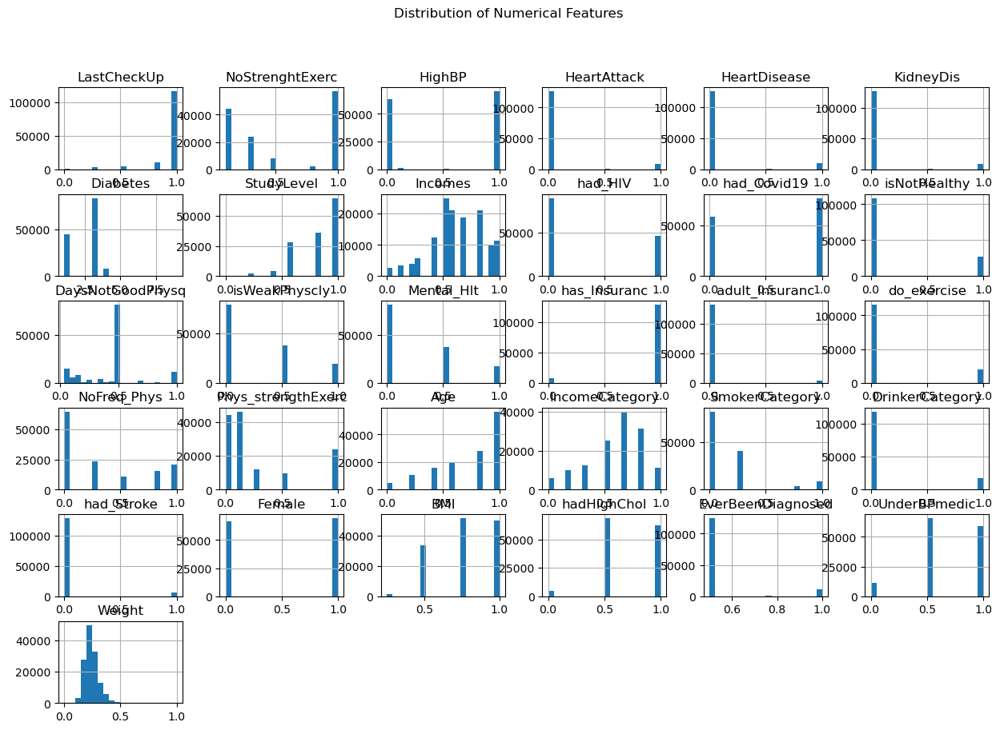

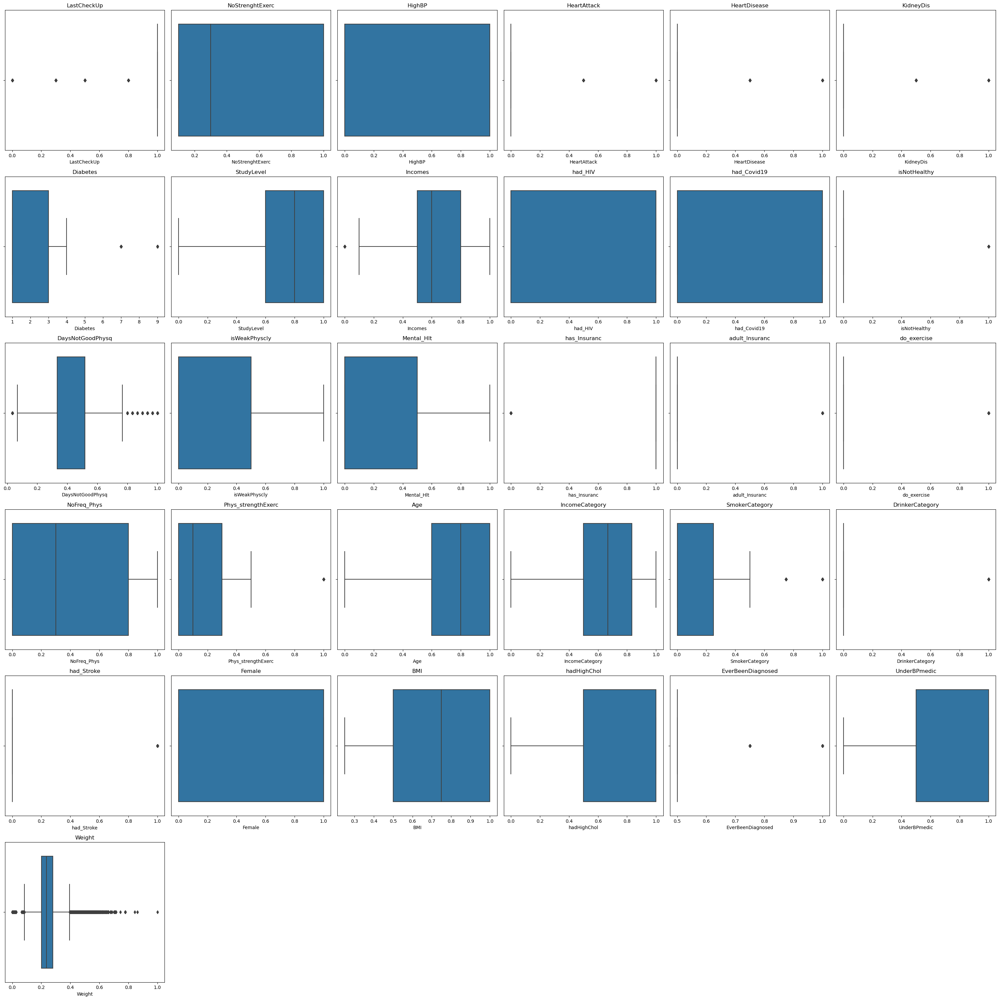

In [44]:
# Numerical+ categorical Features
numerical_cols = diabetes.select_dtypes(include=['int64', 'float64']).columns

# Histogram
diabetes[numerical_cols].hist(bins=20, figsize=(15, 10))
plt.suptitle('Distribution of Numerical Features')
plt.show()

# Boxplots to check for outliers
num_cols = len(numerical_cols)
cols_per_row = 6  
rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))
axes = axes.flatten() 

for i, col in enumerate(numerical_cols):
    sns.boxplot(x=diabetes[col], ax=axes[i])
    axes[i].set_title(f'{col}')

for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

### 3.2. Bivariate Analysis

#### Feature vs Target

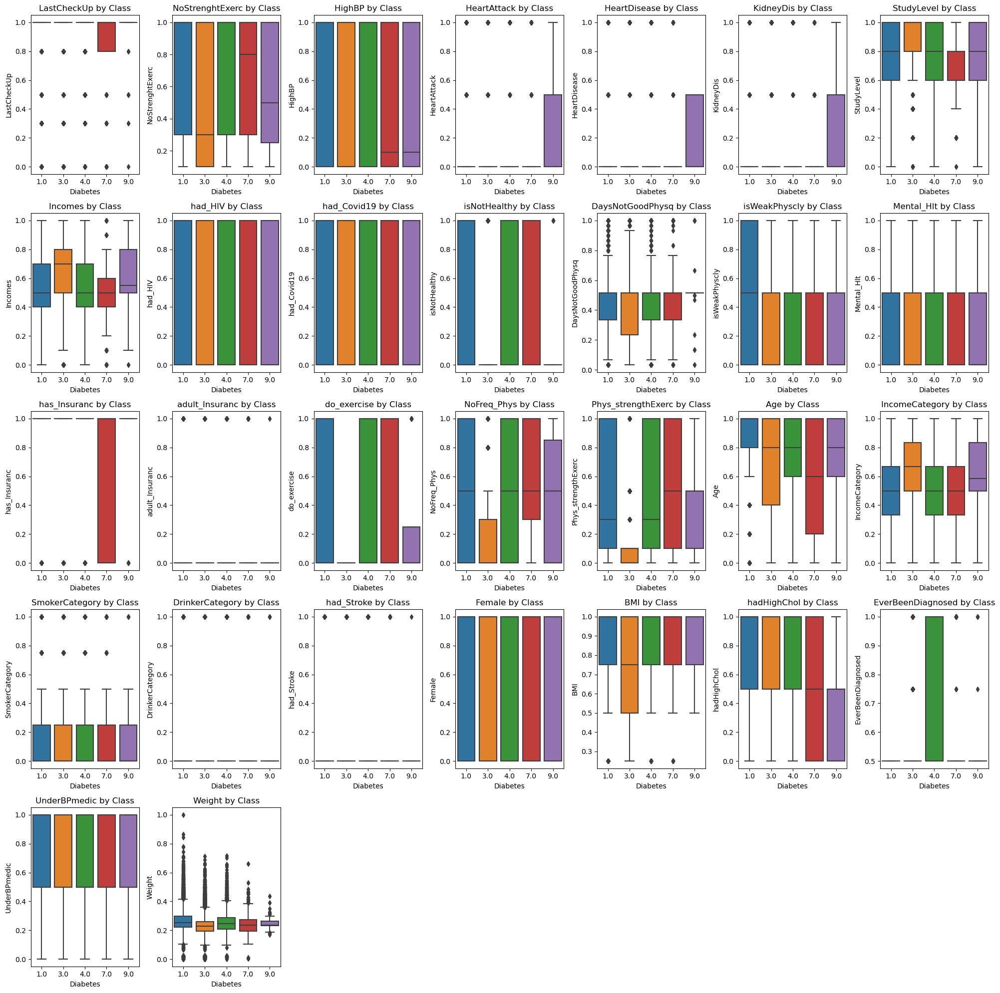

In [45]:
# Ensure Diabetes is in the dataset
assert 'Diabetes' in diabetes.columns, "Target column 'Diabetes' is missing"

# Select numerical features
numerical_cols = diabetes.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_cols = [col for col in numerical_cols if col != 'Diabetes']  # Exclude target from features

# Setup grid
n = len(numerical_cols)
cols = 7
rows = (n // cols) + int(n % cols > 0)

fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes = axes.flatten()

for i, col in enumerate(numerical_cols):
    sns.boxplot(data=diabetes, x='Diabetes', y=col, ax=axes[i])
    axes[i].set_title(f'{col} by Class')

# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [46]:
# Select categorical columns, excluding the target
categorical_cols = diabetes.select_dtypes(include=['object', 'category']).columns
categorical_cols = [col for col in categorical_cols if col != 'Diabetes']

# Handle case with no categorical columns
if len(categorical_cols) == 0:
    print("No categorical features to plot.")
else:
    num_cols = len(categorical_cols)
    cols_per_row = 2
    rows = (num_cols + cols_per_row - 1) // cols_per_row

    fig, axes = plt.subplots(rows, cols_per_row, figsize=(7 * cols_per_row, 5 * rows))
    axes = axes.flatten()

    for i, col in enumerate(categorical_cols):
        # Create normalized crosstab
        ct = pd.crosstab(diabetes[col], diabetes['Diabetes'], normalize='index')
        ct.plot(kind='bar', stacked=True, ax=axes[i], colormap='tab10')
        axes[i].set_title(f'{col} vs Diabetes')
        axes[i].set_ylabel('Proportion')
        axes[i].legend(title='Diabetes', loc='best')

    # Hide unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

No categorical features to plot.


C:\Users\olika\AppData\Local\Temp\ipykernel_22428\858332668.py:12: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=diabetes, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)
C:\Users\olika\AppData\Local\Temp\ipykernel_22428\858332668.py:12: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=diabetes, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)


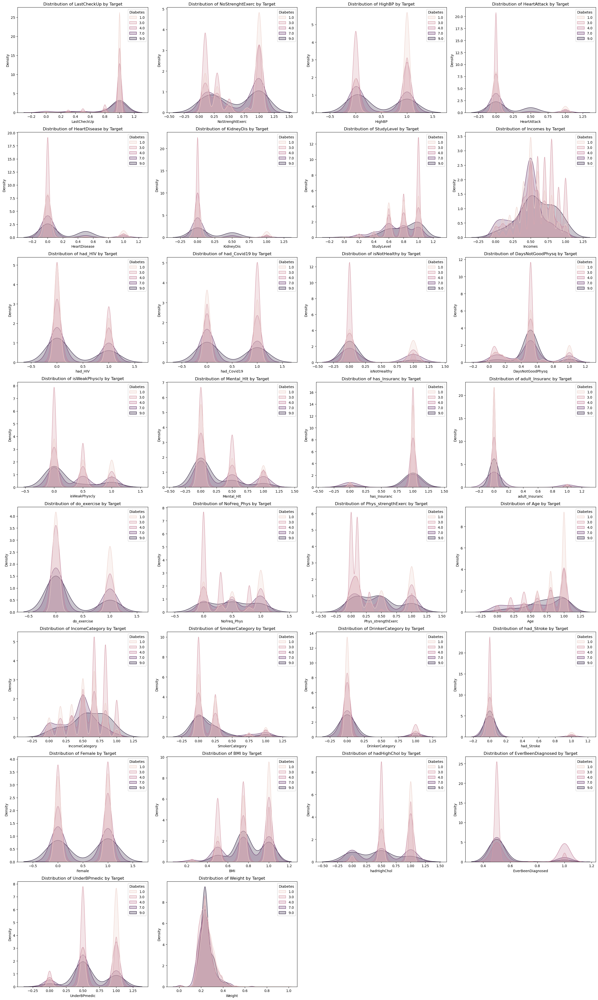

In [47]:
# KDE plot for numerical features by class
num_cols = len(numerical_cols)
cols_per_row = 4
rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(rows, cols_per_row, figsize=(6 * cols_per_row, 5 * rows))
axes = axes.flatten()

plot_idx = 0
for col in numerical_cols:
    if diabetes[col].nunique() > 1: 
        sns.kdeplot(data=diabetes, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)
        axes[plot_idx].set_title(f'Distribution of {col} by Target')
        plot_idx += 1

for j in range(plot_idx, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

### Target Classes selection of 3 out of 7 

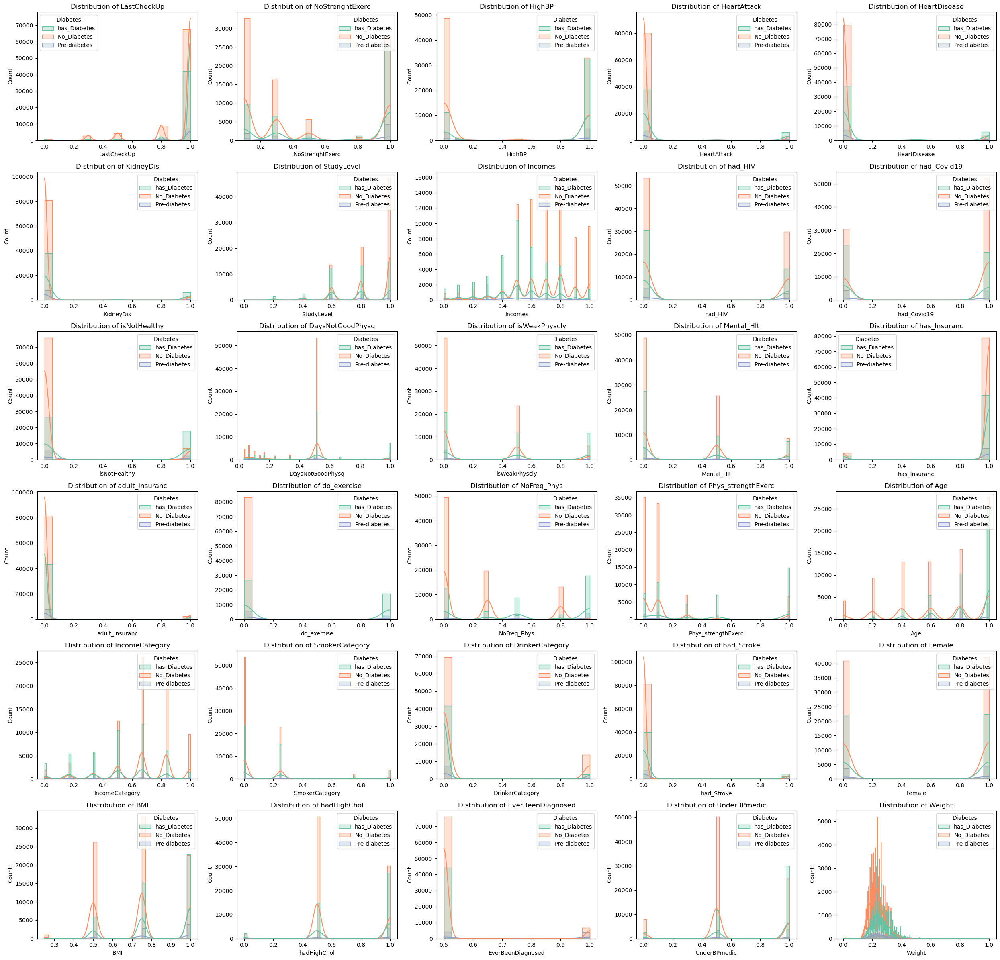

In [48]:
# Filter for valid classes
diabetes1 = diabetes[diabetes['Diabetes'].isin([1, 3, 4])].copy()

# Map to class names
diabetes1['Diabetes'] = diabetes1['Diabetes'].map({
    1: 'has_Diabetes',
    3: 'No_Diabetes',
    4: 'Pre-diabetes'
})
# Select numeric columns
numeric_features = diabetes1.select_dtypes(include=['float64', 'int64']).drop(columns=['Diabetes'], errors='ignore').columns
# Set up the plotting grid
n_cols = 5
n_rows = int(np.ceil(len(numeric_features) / n_cols))
plt.figure(figsize=(5 * n_cols, 4 * n_rows))
for i, col in enumerate(numeric_features, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(data=diabetes1, x=col, hue='Diabetes', kde=True, element="step", palette='Set2')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

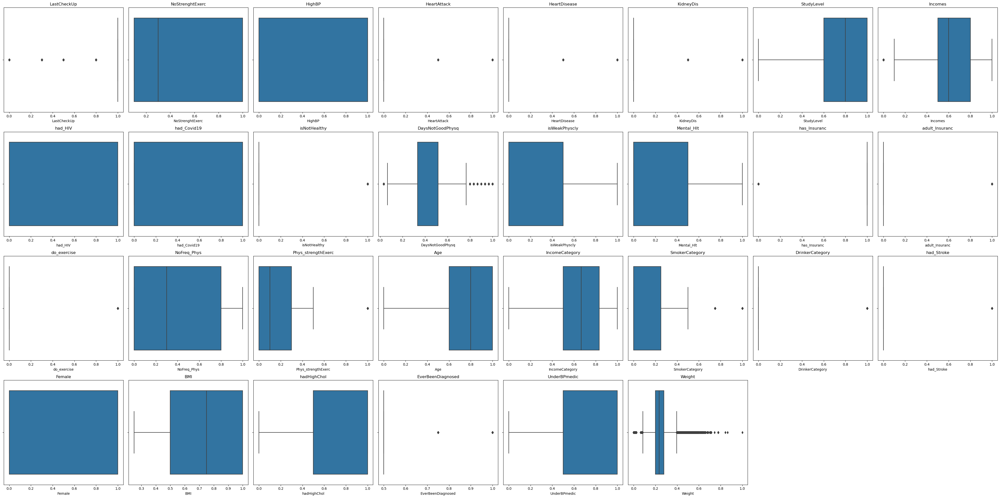

In [49]:
# Boxplots to check for outliers
num_cols = len(numeric_features)
cols_per_row = 8
rows = (num_cols + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(rows, cols_per_row, figsize=(5 * cols_per_row, 5 * rows))
axes = axes.flatten() 
for i, col in enumerate(numeric_features):
    sns.boxplot(x=diabetes1[col], ax=axes[i])
    axes[i].set_title(f'{col}')
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)
plt.tight_layout()
plt.show()

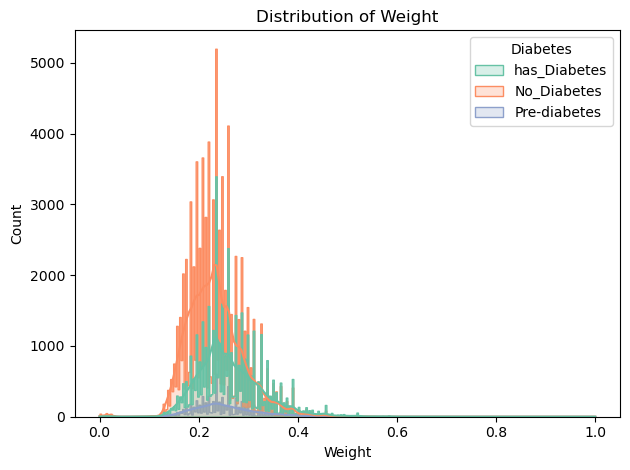

In [50]:
# Filter for valid classes
diabetes5 = diabetes[diabetes['Diabetes'].isin([1, 3, 4])].copy()

# Map to class names
diabetes5['Diabetes'] = diabetes5['Diabetes'].map({
    1: 'has_Diabetes',
    3: 'No_Diabetes',
    4: 'Pre-diabetes'
})
# Set up the plotting grid
sns.histplot(data=diabetes5, x="Weight", hue='Diabetes', kde=True, element="step", palette='Set2')
plt.title(f'Distribution of {col}')
plt.xlabel(col)
plt.ylabel('Count')
plt.tight_layout()
plt.show()

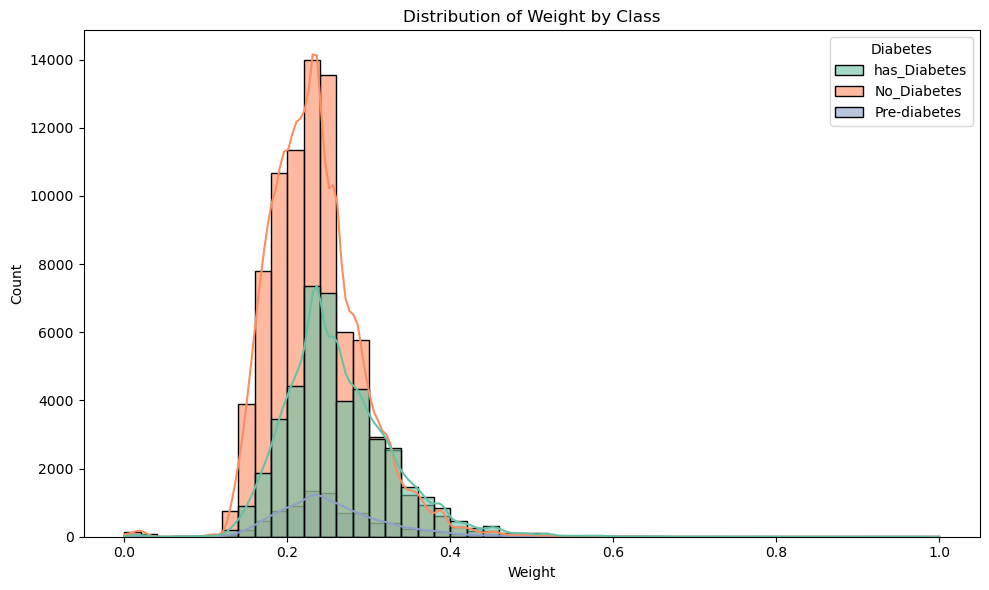

In [51]:
# Distribution of Weight by class
plt.figure(figsize=(10,6))
sns.histplot(
    data=diabetes5,
    x="Weight",
    hue="Diabetes",        # class column
    kde=True,
    bins=50,
    palette="Set2",
    alpha=0.6
)
plt.title("Distribution of Weight by Class")
plt.xlabel("Weight")
plt.ylabel("Count")
#plt.legend(title="Class")
plt.tight_layout()
plt.show()

# 4. Features Pre-selection

### 4.1.  Multicollinearity (Filter)

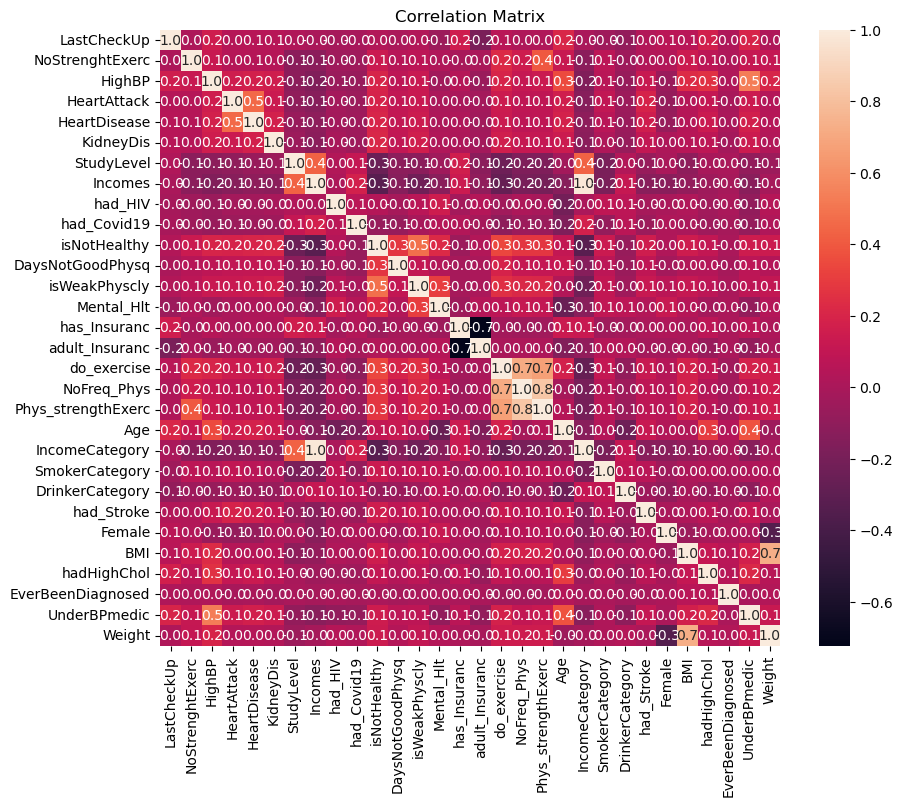

In [52]:
# Correlation Analysis
# Select numerical features
numerical_cols = diabetes.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_cols = [col for col in numerical_cols if col != 'Diabetes']  # Exclude target from features
corr = diabetes[numerical_cols].corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr, annot=True, fmt='.1f')
plt.title('Correlation Matrix')
plt.show()

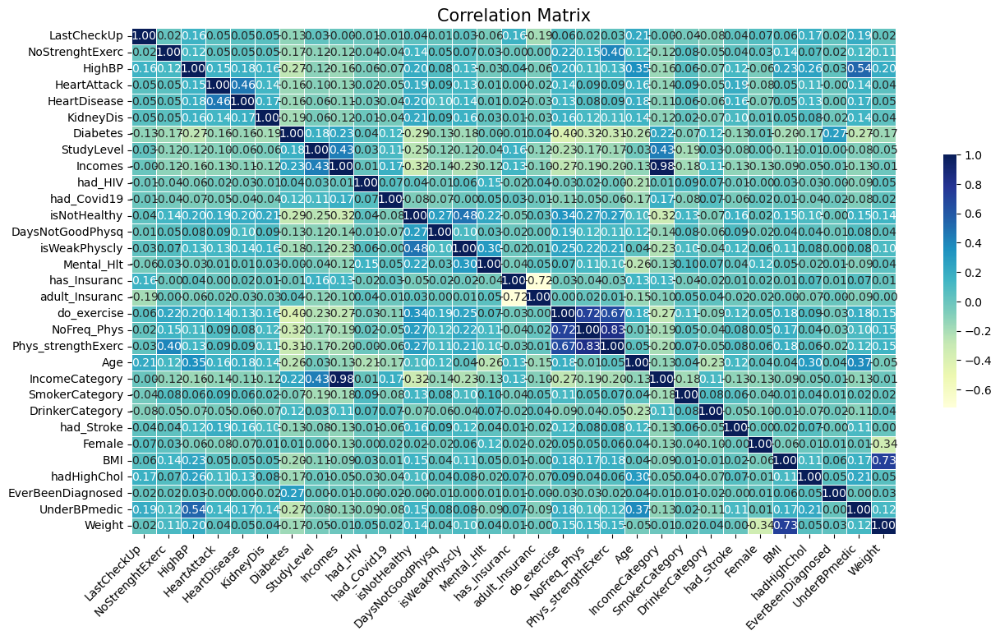

In [53]:
# Plot the correlation matrix heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(diabetes.corr(), annot=True, cmap='YlGnBu', fmt=".2f", linewidths=0.5, cbar_kws={'shrink': 0.5})
plt.title('Correlation Matrix', fontsize=15)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.show()

In [54]:
# Drop one of the high correlated pair of features
diabetes=diabetes.drop(['IncomeCategory','Phys_strengthExerc','do_exercise','adult_Insuranc','Weight'],axis=1) # 
diabetes1=diabetes1.drop(['IncomeCategory','Phys_strengthExerc','do_exercise','adult_Insuranc','Weight'],axis=1) # 

In [55]:
diabetes1.columns

Index(['LastCheckUp', 'NoStrenghtExerc', 'HighBP', 'HeartAttack',
       'HeartDisease', 'KidneyDis', 'Diabetes', 'StudyLevel', 'Incomes',
       'had_HIV', 'had_Covid19', 'isNotHealthy', 'DaysNotGoodPhysq',
       'isWeakPhyscly', 'Mental_Hlt', 'has_Insuranc', 'NoFreq_Phys', 'Age',
       'SmokerCategory', 'DrinkerCategory', 'had_Stroke', 'Female', 'BMI',
       'hadHighChol', 'EverBeenDiagnosed', 'UnderBPmedic'],
      dtype='object')

### 4.2. Correlation (with target)

Correlation of features with target (Diabetes):
 Diabetes             1.000000
NoFreq_Phys          0.423326
isNotHealthy         0.366741
HighBP               0.316033
UnderBPmedic         0.302145
Age                  0.300860
BMI                  0.259303
isWeakPhyscly        0.233320
NoStrenghtExerc      0.230555
KidneyDis            0.212390
HeartAttack          0.190937
hadHighChol          0.190164
HeartDisease         0.184662
DaysNotGoodPhysq     0.162052
had_Stroke           0.149555
LastCheckUp          0.139689
SmokerCategory       0.097147
Mental_Hlt           0.019936
Female               0.001023
has_Insuranc        -0.016800
had_HIV             -0.045723
EverBeenDiagnosed   -0.112829
DrinkerCategory     -0.148515
had_Covid19         -0.159110
StudyLevel          -0.251151
Incomes             -0.312674
Name: Diabetes, dtype: float64


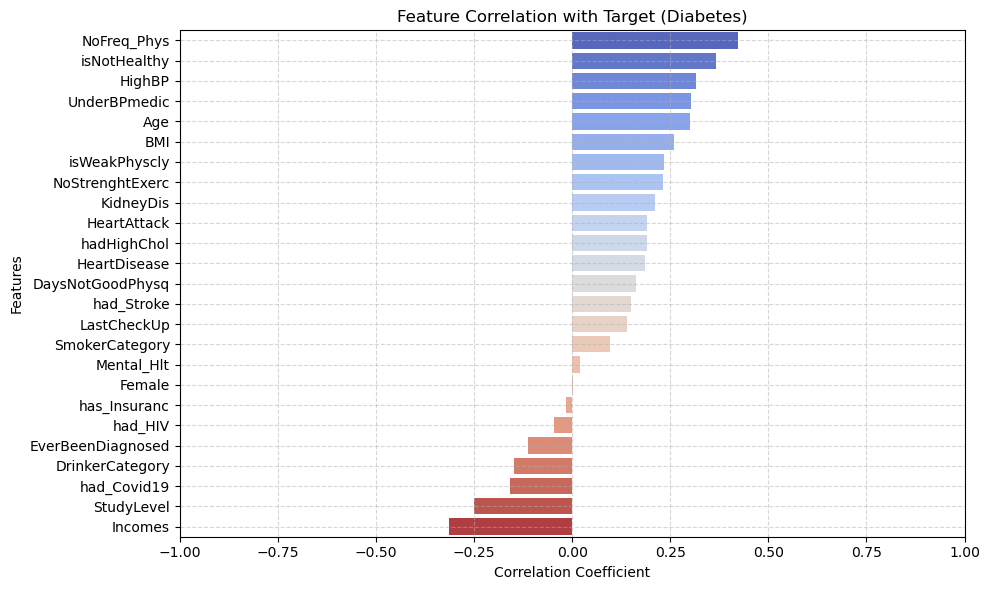

In [56]:
# Copy the dataset to avoid modifying original
df_encoded = diabetes1.copy()

# Encode all object/category columns except the target
label_encoders = {}
for col in df_encoded.select_dtypes(include=['object', 'category']).columns:
    if col != 'Diabetes':
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
        label_encoders[col] = le

# Encode target if it's not already numeric
if df_encoded['Diabetes'].dtype == 'object' or df_encoded['Diabetes'].dtype.name == 'category':
    df_encoded['Diabetes'] = LabelEncoder().fit_transform(df_encoded['Diabetes'].astype(str))

# Compute correlation with target
target_corr = df_encoded.corr(numeric_only=True)['Diabetes'].sort_values(ascending=False)

# Display correlation values
print("Correlation of features with target (Diabetes):\n", target_corr)

# Drop the target itself from the plot
target_corr_filtered = target_corr.drop('Diabetes')

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=target_corr_filtered.values, y=target_corr_filtered.index, palette="coolwarm")

plt.title('Feature Correlation with Target (Diabetes)')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Features')
plt.xlim(-1, 1)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

### 4.3. Domaine knowledge and feature selection

In [58]:
# Drop one of the high correlated pair of features
diabetes=diabetes.drop(['had_Covid19','had_HIV'],axis=1) # 
diabetes1=diabetes1.drop(['had_Covid19','had_HIV'],axis=1) # 

In [59]:
missing_values = diabetes1.isna().sum().sort_values(ascending=False)
print(missing_values)


LastCheckUp          0
NoStrenghtExerc      0
EverBeenDiagnosed    0
hadHighChol          0
BMI                  0
Female               0
had_Stroke           0
DrinkerCategory      0
SmokerCategory       0
Age                  0
NoFreq_Phys          0
has_Insuranc         0
Mental_Hlt           0
isWeakPhyscly        0
DaysNotGoodPhysq     0
isNotHealthy         0
Incomes              0
StudyLevel           0
Diabetes             0
KidneyDis            0
HeartDisease         0
HeartAttack          0
HighBP               0
UnderBPmedic         0
dtype: int64


#  Feature pre-selection with embedded 

C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [13:45:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


📊 Feature Importance from XGBoost:
              Feature  Importance
13        NoFreq_Phys    0.363503
21  EverBeenDiagnosed    0.213350
22       UnderBPmedic    0.113519
8        isNotHealthy    0.087988
14                Age    0.027287
19                BMI    0.023970
20        hadHighChol    0.021575
5           KidneyDis    0.016741
2              HighBP    0.014831
7             Incomes    0.013542
0         LastCheckUp    0.013470
1     NoStrenghtExerc    0.012228
16    DrinkerCategory    0.011752
3         HeartAttack    0.011087
6          StudyLevel    0.009126
18             Female    0.008347
4        HeartDisease    0.006953
10      isWeakPhyscly    0.006426
17         had_Stroke    0.005921
9    DaysNotGoodPhysq    0.004774
15     SmokerCategory    0.004641
12       has_Insuranc    0.004489
11         Mental_Hlt    0.004479

🔹 Selected Features (above threshold):
['NoFreq_Phys', 'EverBeenDiagnosed', 'UnderBPmedic', 'isNotHealthy', 'Age', 'BMI', 'hadHighChol', 'KidneyDis'

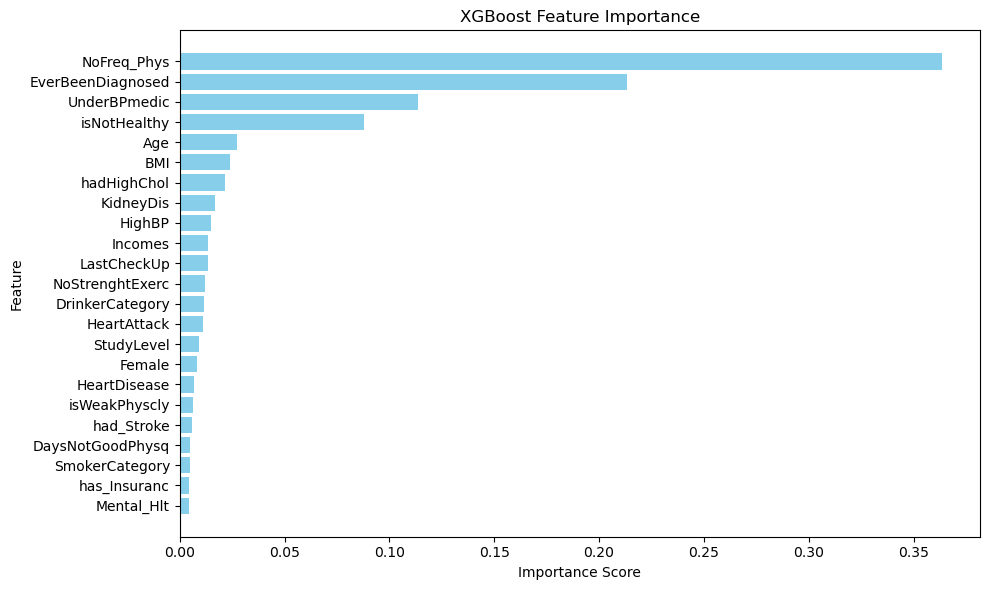


Class mapping: {'No_Diabetes': 0, 'Pre-diabetes': 1, 'has_Diabetes': 2}


In [60]:
# ==== Step 1: Prepare Data ====
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Scale features (keep DataFrame)
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# ==== Step 2: Train XGBoost ====
xgb = XGBClassifier(
    n_estimators=300,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    eval_metric="mlogloss",
    use_label_encoder=False
)

xgb.fit(X_train, y_train)

# ==== Step 3: Feature Importance ====
importance = xgb.feature_importances_

feature_importance = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": importance
}).sort_values(by="Importance", ascending=False)

print("📊 Feature Importance from XGBoost:")
print(feature_importance)

# ==== Step 4: Select important features ====
threshold = 0.01   # adjust threshold as needed
selected_features = feature_importance[feature_importance["Importance"] > threshold]["Feature"]

print("\n🔹 Selected Features (above threshold):")
print(selected_features.tolist())

# ==== Step 5: Plot Feature Importance ====
plt.figure(figsize=(10, 6))
plt.barh(feature_importance["Feature"], feature_importance["Importance"], color="skyblue")
plt.gca().invert_yaxis()  # Highest importance at top
plt.xlabel("Importance Score")
plt.ylabel("Feature")
plt.title("XGBoost Feature Importance")
plt.tight_layout()
plt.show()

# ==== Optional: Class mapping ====
print("\nClass mapping:", dict(zip(le.classes_, le.transform(le.classes_))))

# Mutual Information feature selection
This approach mimics MRMR but does not require a compiler.

In [61]:
from sklearn.feature_selection import mutual_info_classif
# Compute mutual information
mi = mutual_info_classif(X_train, y_train)
mi_df = pd.DataFrame({"Feature": X_train.columns, "MI": mi}).sort_values(by="MI", ascending=False)

# select top 20 features
selected_features = mi_df.head(20)["Feature"].tolist()
print("Selected Features:", selected_features)

Selected Features: ['NoFreq_Phys', 'isNotHealthy', 'EverBeenDiagnosed', 'UnderBPmedic', 'HighBP', 'Age', 'Incomes', 'hadHighChol', 'DaysNotGoodPhysq', 'BMI', 'StudyLevel', 'isWeakPhyscly', 'NoStrenghtExerc', 'KidneyDis', 'LastCheckUp', 'HeartAttack', 'HeartDisease', 'DrinkerCategory', 'Mental_Hlt', 'SmokerCategory']


In [62]:
# Compute mutual information between features and target
mi = mutual_info_classif(X_train, y_train, random_state=42)
# Create a DataFrame of features and their MI scores
mi_df = pd.DataFrame({
    "Feature": X_train.columns,
    "Importance": mi
})
# Sort features by descending importance
mi_df = mi_df.sort_values(by="Importance", ascending=False).reset_index(drop=True)
# Add a rank column
mi_df.insert(0, "Rank", np.arange(1, len(mi_df) + 1))
# Print full table
print(mi_df)
# Optionally: select top 20 features
top_features = mi_df.head(20)
print("\nTop 20 Features:\n", top_features)

    Rank            Feature  Importance
0      1        NoFreq_Phys    0.251415
1      2       isNotHealthy    0.074213
2      3       UnderBPmedic    0.071047
3      4  EverBeenDiagnosed    0.067864
4      5             HighBP    0.061581
5      6            Incomes    0.054896
6      7                Age    0.051252
7      8        hadHighChol    0.044796
8      9                BMI    0.043055
9     10   DaysNotGoodPhysq    0.042099
10    11         StudyLevel    0.039515
11    12    NoStrenghtExerc    0.036483
12    13      isWeakPhyscly    0.035338
13    14          KidneyDis    0.027409
14    15        LastCheckUp    0.023367
15    16       HeartDisease    0.021879
16    17        HeartAttack    0.020257
17    18    DrinkerCategory    0.017280
18    19         Mental_Hlt    0.013482
19    20         had_Stroke    0.012989
20    21     SmokerCategory    0.010581
21    22             Female    0.004975
22    23       has_Insuranc    0.003290

Top 20 Features:
     Rank            F

##### Drop off of 3 high correlated features

In [63]:
# Drop one of the high correlated pair of features
diabetes=diabetes.drop(['has_Insuranc','SmokerCategory','Mental_Hlt'],axis=1) # 
diabetes1=diabetes1.drop(['has_Insuranc','SmokerCategory','Mental_Hlt'],axis=1) # 

### SAVING CLEANED DATASET TO CSV file

In [66]:
# Save cleaned dataset to a CSV file
diabetes1.to_csv('diabetes1.csv', sep=",", index=False)

In [2]:
diabetes1 = pd.read_csv("diabetes1.csv")

# Checking Distributions of Preselected features

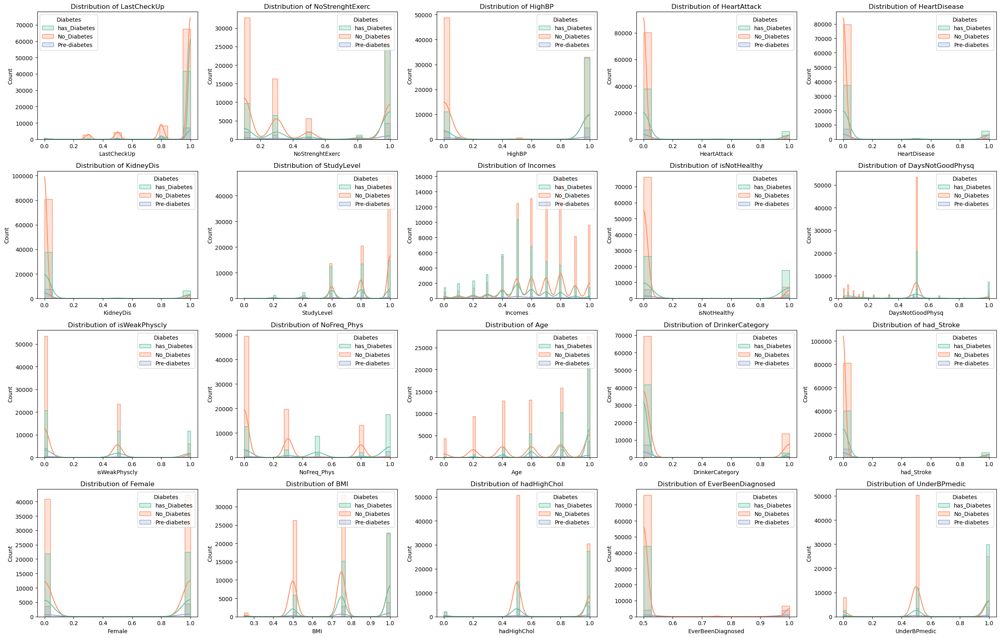

In [3]:
# Select numeric columns
numeric_features = diabetes1.select_dtypes(include=['float64', 'int64']).drop(columns=['Diabetes'], errors='ignore').columns

# Set up the plotting grid
n_cols = 5
n_rows = int(np.ceil(len(numeric_features) / n_cols))
plt.figure(figsize=(5 * n_cols, 4 * n_rows))
for i, col in enumerate(numeric_features, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(data=diabetes1, x=col, hue='Diabetes', kde=True, element="step", palette='Set2')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
plt.tight_layout()
plt.show()

C:\Users\olika\AppData\Local\Temp\ipykernel_10604\1787458902.py:10: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data=diabetes1, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)


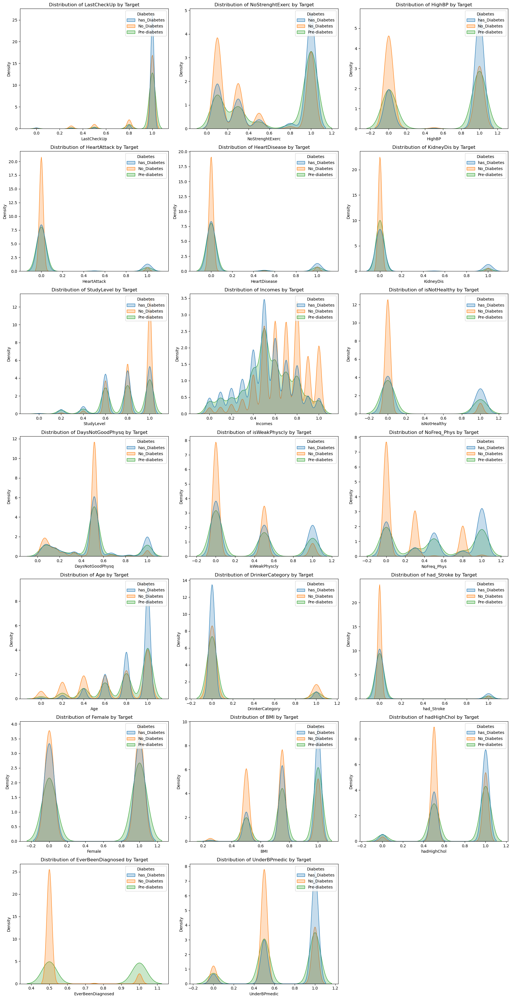

In [5]:
# KDE plot for numerical features by class
num_cols = len(numeric_features)
cols_per_row = 3
rows = (num_cols + cols_per_row - 1) // cols_per_row
fig, axes = plt.subplots(rows, cols_per_row, figsize=(6 * cols_per_row, 5 * rows))
axes = axes.flatten()
plot_idx = 0
for col in numeric_features:
    if diabetes1[col].nunique() > 1: 
        sns.kdeplot(data=diabetes1, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)
        axes[plot_idx].set_title(f'Distribution of {col} by Target')
        plot_idx += 1
for j in range(plot_idx, len(axes)):
    axes[j].set_visible(False)
plt.tight_layout()
plt.show()

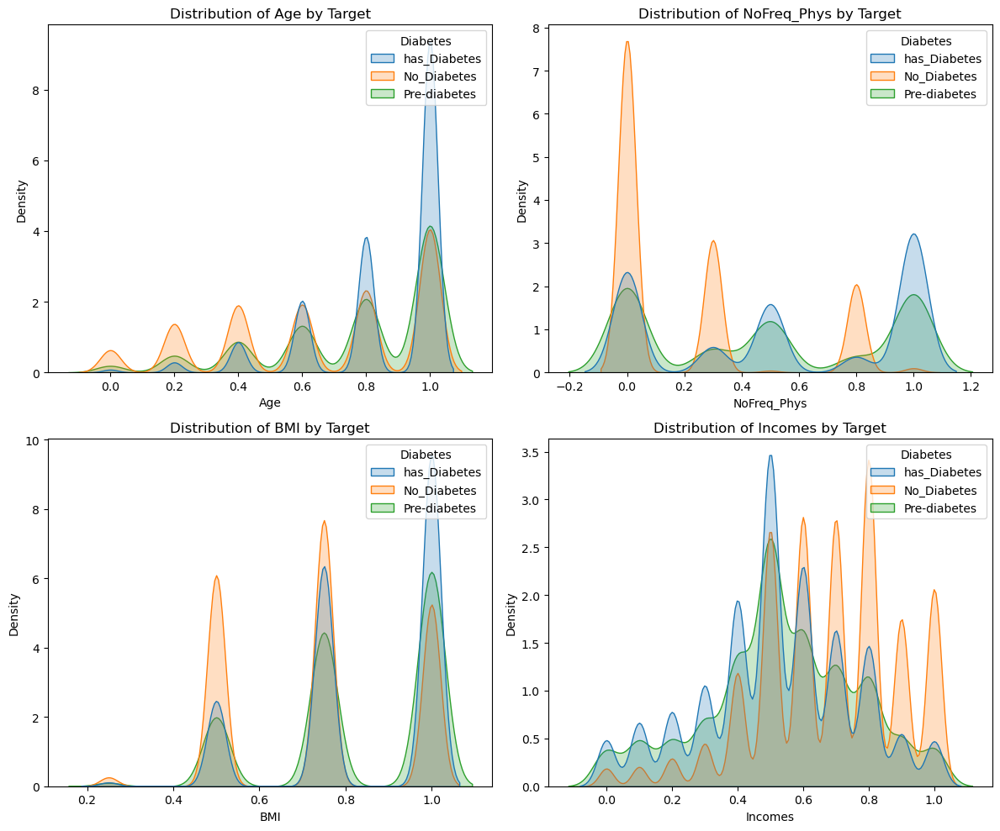

In [6]:
# Selected features to plot
selected_features = ['Age', 'NoFreq_Phys','BMI', 'Incomes']
num_cols = len(selected_features)
cols_per_row = 2
rows = (num_cols + cols_per_row - 1) // cols_per_row
fig, axes = plt.subplots(rows, cols_per_row, figsize=(6 * cols_per_row, 5 * rows))
axes = axes.flatten()
plot_idx = 0
for col in selected_features:
    if diabetes1[col].nunique() > 1: 
        sns.kdeplot(data=diabetes1, x=col, hue='Diabetes', fill=True, ax=axes[plot_idx], common_norm=False)
        axes[plot_idx].set_title(f'Distribution of {col} by Target')
        plot_idx += 1
# Hide unused subplots
for j in range(plot_idx, len(axes)):
    axes[j].set_visible(False)
plt.tight_layout()
plt.show()

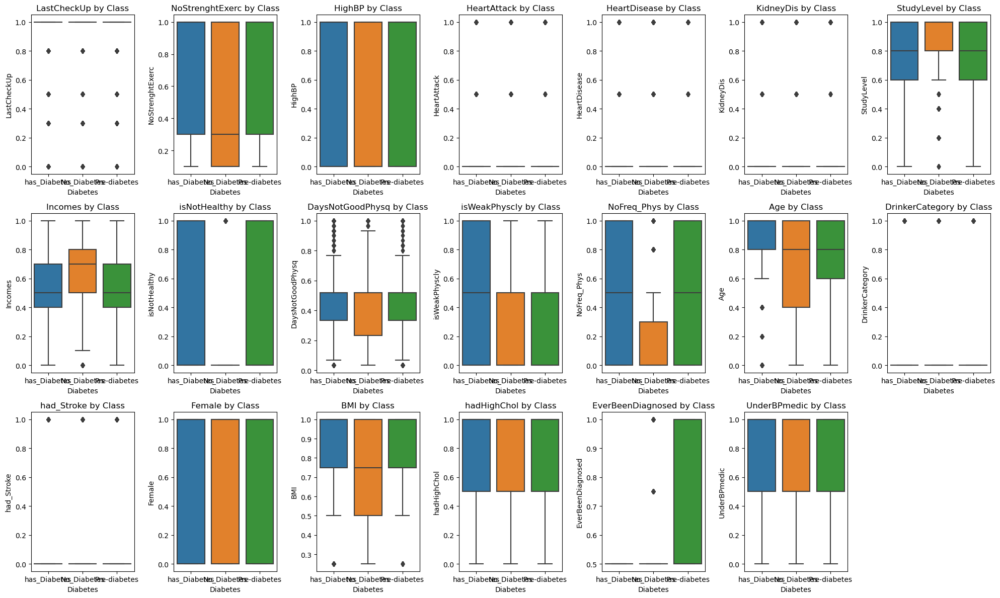

In [7]:
# Setup grid
n = len(numeric_features)
cols = 7
rows = (n // cols) + int(n % cols > 0)
fig, axes = plt.subplots(rows, cols, figsize=(20, 4 * rows))
axes = axes.flatten()
for i, col in enumerate(numeric_features):
    sns.boxplot(data=diabetes1, x='Diabetes', y=col, ax=axes[i])
    axes[i].set_title(f'{col} by Class')
# Remove any unused axes
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])
plt.tight_layout()
plt.show()

### 3.4. Check class imbalance


Class distribution (full dataset):
No_Diabetes     83157
Pre-diabetes     8025
has_Diabetes    44251
dtype: int64

Class distribution (training set):
No_Diabetes     66525
Pre-diabetes     6420
has_Diabetes    35401
dtype: int64

Class distribution (after SMOTE):
No_Diabetes     66525
Pre-diabetes    66525
has_Diabetes    66525
dtype: int64


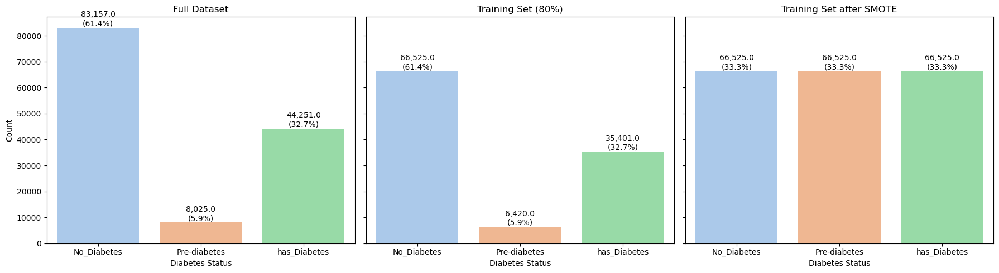

In [8]:
# -----------------------
# Feature/Target
# -----------------------
X = diabetes1.drop(['Diabetes'], axis=1, errors='ignore')
y = diabetes1['Diabetes']
# ========== Encode target ==========
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])   # Encoded labels (0,1,2)
class_names = le.classes_                             # ['No_Diabetes', 'Pre-diabetes', 'has_Diabetes']

# -----------------------
# Train/Test Split
# -----------------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=88
)

# -----------------------
# Apply SMOTE on the training set
# -----------------------
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# -----------------------
# Check distributions
# -----------------------
dist_full = pd.Series(y_encoded).value_counts().sort_index()
dist_train = pd.Series(y_train).value_counts().sort_index()
dist_train_res = pd.Series(y_train_res).value_counts().sort_index()

print("\nClass distribution (full dataset):")
print(dist_full.rename(index=dict(enumerate(class_names))))
print("\nClass distribution (training set):")
print(dist_train.rename(index=dict(enumerate(class_names))))
print("\nClass distribution (after SMOTE):")
print(dist_train_res.rename(index=dict(enumerate(class_names))))

# -----------------------
# Helper function for annotation
# -----------------------
def annotate_bars(ax, total):
    for p in ax.patches:
        count = p.get_height()
        percentage = f'{100 * count / total:.1f}%'
        ax.annotate(f'{count:,}\n({percentage})',
                    (p.get_x() + p.get_width() / 2., count),
                    ha='center', va='bottom')

# -----------------------
# Plot histograms
# -----------------------
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# Full dataset
ax1 = sns.countplot(
    x=y_encoded,
    order=[0, 1, 2],
    palette='pastel',
    ax=axes[0]
)
ax1.set_xticklabels(class_names)
annotate_bars(ax1, len(y_encoded))
ax1.set_title("Full Dataset")
ax1.set_xlabel("Diabetes Status")
ax1.set_ylabel("Count")

# Training set
ax2 = sns.countplot(
    x=y_train,
    order=[0, 1, 2],
    palette='pastel',
    ax=axes[1]
)
ax2.set_xticklabels(class_names)
annotate_bars(ax2, len(y_train))
ax2.set_title("Training Set (80%)")
ax2.set_xlabel("Diabetes Status")
ax2.set_ylabel("")

# Training set after SMOTE
ax3 = sns.countplot(
    x=y_train_res,
    order=[0, 1, 2],
    palette='pastel',
    ax=axes[2]
)
ax3.set_xticklabels(class_names)
annotate_bars(ax3, len(y_train_res))
ax3.set_title("Training Set after SMOTE")
ax3.set_xlabel("Diabetes Status")
ax3.set_ylabel("")

plt.tight_layout()
plt.show()

## g. Train-Test Split


In [9]:
# Print the shapes of the feature set and target variable
print(f"Features shape: {X.shape}")
print(f"Target shape: {y.shape}")

Features shape: (135433, 20)
Target shape: (135433,)


In [10]:
# Print the shapes of the training and test sets
print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

X_train shape: (108346, 20)
X_test shape: (27087, 20)
y_train shape: (108346,)
y_test shape: (27087,)


So now, SMOTE will only work on the training set (80% of 135433)= 108346, not the full dataset.
This is crucial: SMOTE oversamples relative to the majority class in the training split, not in the whole dataset.

In [11]:
# Print the shapes of the feature set and target variable
print(f"Features shape: {X_train_res.shape}")
print(f"Target shape: {y_train_res.shape}")

Features shape: (199575, 20)
Target shape: (199575,)


# 6. Models Selection

### 6.1. BASELINE Model : Logistic Regression
here using SOFTMAX Function, multinomial logistic regression (One vs Rest)  OvR
error function is CROSS ENTROPY

Using simple model first to set a benchmark.

#### USING CROSS-VALIDATION

C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 1 - Accuracy: 0.7939


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 2 - Accuracy: 0.7930


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 3 - Accuracy: 0.7966


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 4 - Accuracy: 0.7931


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 5 - Accuracy: 0.7952

🔹 Average Cross-Validation Metrics:
Accuracy: 0.7944
Precision (macro): 0.7589
Recall (macro): 0.6153
F1 Score (macro): 0.6501
ROC AUC (macro): 0.8595


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



🔹 Test Set Metrics:
Accuracy: 0.7912
              precision    recall  f1-score   support

 No_Diabetes       0.81      0.90      0.85     16632
Pre-diabetes       0.67      0.22      0.34      1605
has_Diabetes       0.76      0.69      0.72      8850

    accuracy                           0.79     27087
   macro avg       0.74      0.61      0.64     27087
weighted avg       0.78      0.79      0.78     27087



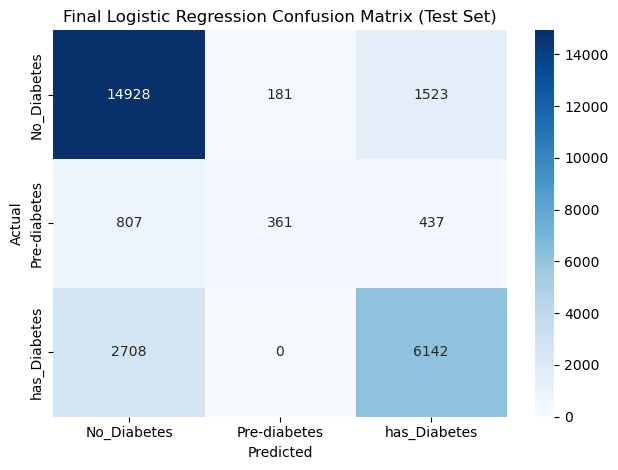

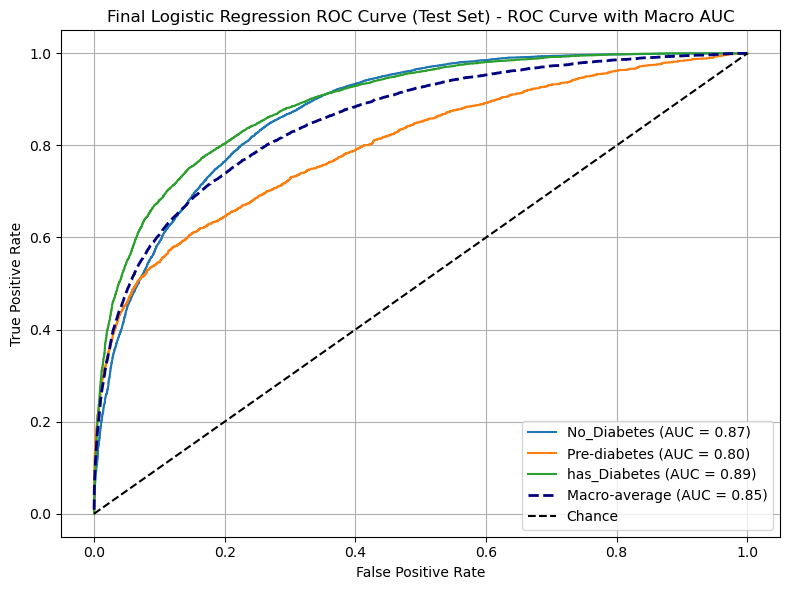

In [12]:
# ========== Functions ==========
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Macro-average ROC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    macro_auc = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")

    plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--',
             label=f"Macro-average (AUC = {macro_auc:.2f})", linewidth=2)

    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.title(f"{model_name} - ROC Curve with Macro AUC")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.tight_layout()
    plt.show()


# ========== Stratified K-Fold CV ==========

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Metrics accumulators
acc_list = []
precision_list = []
recall_list = []
f1_list = []
roc_auc_list = []

y_train = pd.Series(y_train)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    model = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='multinomial')
    model.fit(X_tr, y_tr)

    y_val_pred = model.predict(X_val)
    y_val_score = model.predict_proba(X_val)

    # Compute metrics for this fold
    acc_list.append(accuracy_score(y_val, y_val_pred))
    precision_list.append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
    recall_list.append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
    f1_list.append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))
    roc_auc_list.append(roc_auc_score(y_val, y_val_score, average='macro', multi_class='ovr'))

    print(f"Fold {fold} - Accuracy: {acc_list[-1]:.4f}")

# ========== Average metrics across folds ==========
avg_metrics = {
    "Accuracy": np.mean(acc_list),
    "Precision (macro)": np.mean(precision_list),
    "Recall (macro)": np.mean(recall_list),
    "F1 Score (macro)": np.mean(f1_list),
    "ROC AUC (macro)": np.mean(roc_auc_list)
}

print("\n🔹 Average Cross-Validation Metrics:")
for k, v in avg_metrics.items():
    print(f"{k}: {v:.4f}")

# ========== Retrain on Full Training Set ==========
final_model = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='multinomial')
final_model.fit(X_train, y_train)

y_test_pred = final_model.predict(X_test)
y_test_score = final_model.predict_proba(X_test)

print("\n🔹 Test Set Metrics:")
print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

plot_conf_matrix(y_test, y_test_pred, "Final Logistic Regression Confusion Matrix (Test Set)")
plot_roc_curve(y_test, y_test_score, "Final Logistic Regression ROC Curve (Test Set)")


#### 6.1.b. LR with SMOTE (Classes Oversampling) 

C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 1 - Accuracy: 0.7444


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 2 - Accuracy: 0.7451


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 3 - Accuracy: 0.7518


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 4 - Accuracy: 0.7441


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


Fold 5 - Accuracy: 0.7441

🔹 Average Cross-Validation Metrics (with SMOTE):
Accuracy: 0.7459
Precision (macro): 0.6255
Recall (macro): 0.6772
F1 Score (macro): 0.6436
ROC AUC (macro): 0.8539


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



🔹 Test Set Metrics (SMOTE applied on full training set):
Accuracy: 0.7420
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.74      0.80     16632
Pre-diabetes       0.33      0.48      0.39      1605
has_Diabetes       0.67      0.79      0.73      8850

    accuracy                           0.74     27087
   macro avg       0.62      0.67      0.64     27087
weighted avg       0.77      0.74      0.75     27087



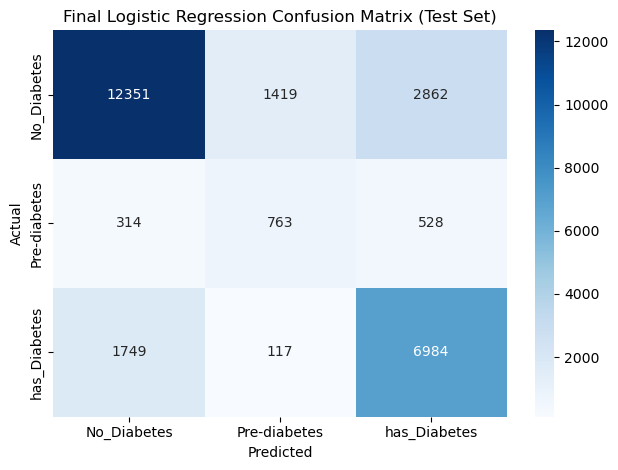

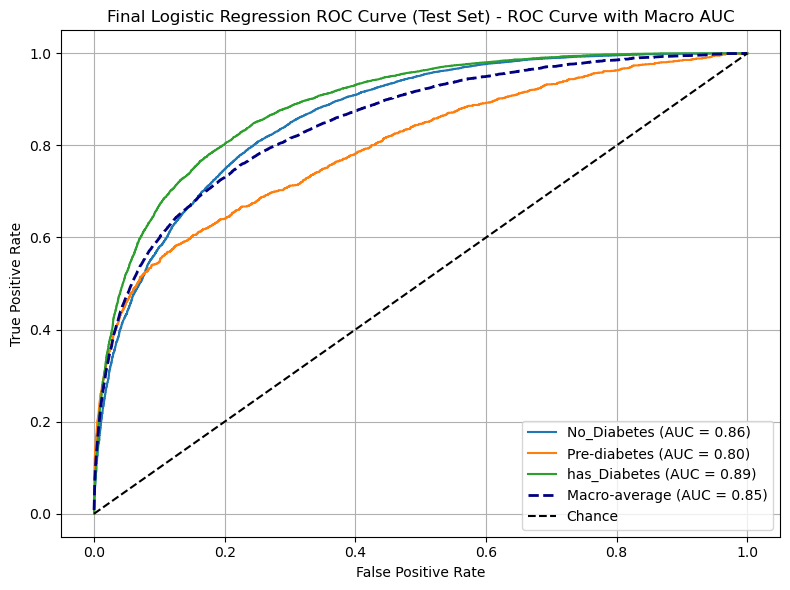

In [13]:
# ========== Functions ==========

def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d',
                xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Compute macro-average ROC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    macro_auc = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8, 6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")

    plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--',
             label=f"Macro-average (AUC = {macro_auc:.2f})", linewidth=2)

    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.title(f"{model_name} - ROC Curve with Macro AUC")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid()
    plt.tight_layout()
    plt.show()


# ========== Stratified K-Fold CV with SMOTE ==========

n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Metrics accumulators
acc_list = []
precision_list = []
recall_list = []
f1_list = []
roc_auc_list = []

smote = SMOTE(random_state=42)

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
    X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
    y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

    # Apply SMOTE on the training fold
    X_tr_res, y_tr_res = smote.fit_resample(X_tr, y_tr)

    model = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='multinomial')
    model.fit(X_tr_res, y_tr_res)

    y_val_pred = model.predict(X_val)
    y_val_score = model.predict_proba(X_val)

    # Compute metrics for this fold
    acc_list.append(accuracy_score(y_val, y_val_pred))
    precision_list.append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
    recall_list.append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
    f1_list.append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))
    roc_auc_list.append(roc_auc_score(y_val, y_val_score, average='macro', multi_class='ovr'))

    print(f"Fold {fold} - Accuracy: {acc_list[-1]:.4f}")

# ========== Average metrics across folds ==========
avg_metrics = {
    "Accuracy": np.mean(acc_list),
    "Precision (macro)": np.mean(precision_list),
    "Recall (macro)": np.mean(recall_list),
    "F1 Score (macro)": np.mean(f1_list),
    "ROC AUC (macro)": np.mean(roc_auc_list)
}

print("\n🔹 Average Cross-Validation Metrics (with SMOTE):")
for k, v in avg_metrics.items():
    print(f"{k}: {v:.4f}")

# ========== Retrain on Full Training Set with SMOTE & Evaluate Test Set ==========
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

final_model = LogisticRegression(max_iter=1000, solver='lbfgs', multi_class='multinomial')
final_model.fit(X_train_res, y_train_res)

y_test_pred = final_model.predict(X_test)
y_test_score = final_model.predict_proba(X_test)

print("\n🔹 Test Set Metrics (SMOTE applied on full training set):")
print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

plot_conf_matrix(y_test, y_test_pred, "Final Logistic Regression Confusion Matrix (Test Set)")
plot_roc_curve(y_test, y_test_score, "Final Logistic Regression ROC Curve (Test Set)")


#### 6.1.c. LR with Balanced resampling

Balanced class distribution:
 0    36115
2    36115
1    36115
dtype: int64


C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in versio

✅ Average metrics across all folds:
Accuracy             0.678998
Precision (macro)    0.701509
Recall (macro)       0.678998
F1 Score (macro)     0.674502
ROC AUC (macro)      0.841414
dtype: float64


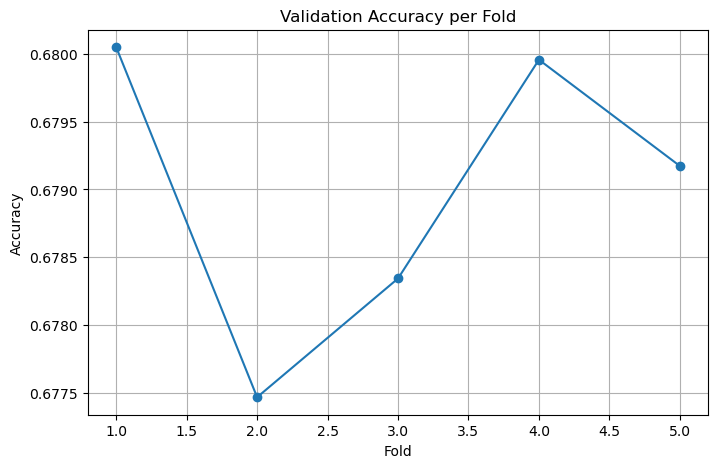

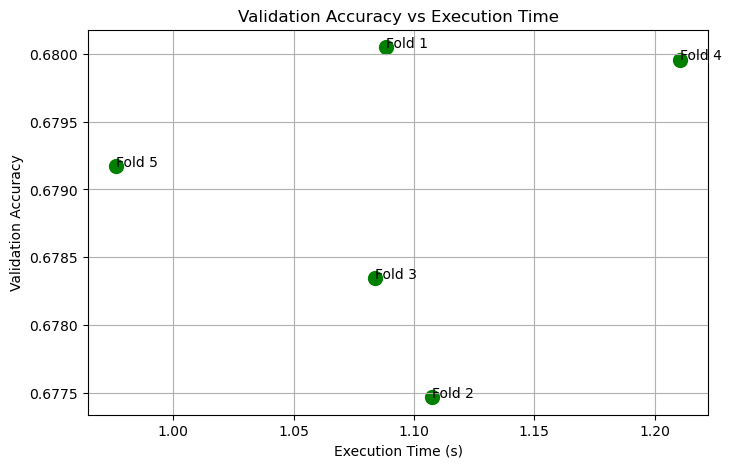

C:\Users\olika\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(



Final Model Metrics (Full Training → Test Set):
Accuracy: 0.7375
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.74      0.79     16632
Pre-diabetes       0.31      0.49      0.38      1605
has_Diabetes       0.68      0.78      0.73      8850

    accuracy                           0.74     27087
   macro avg       0.61      0.67      0.63     27087
weighted avg       0.77      0.74      0.75     27087



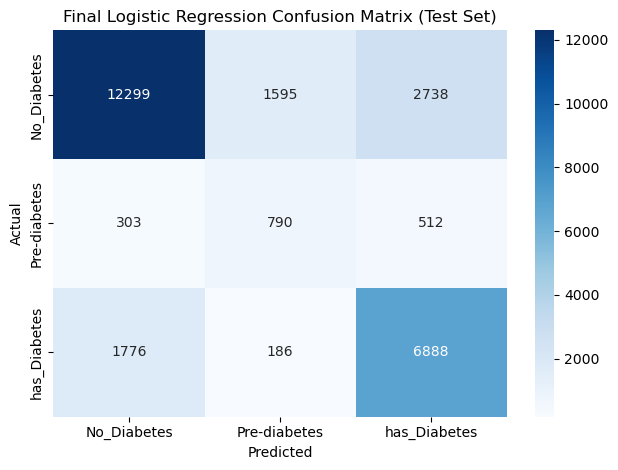

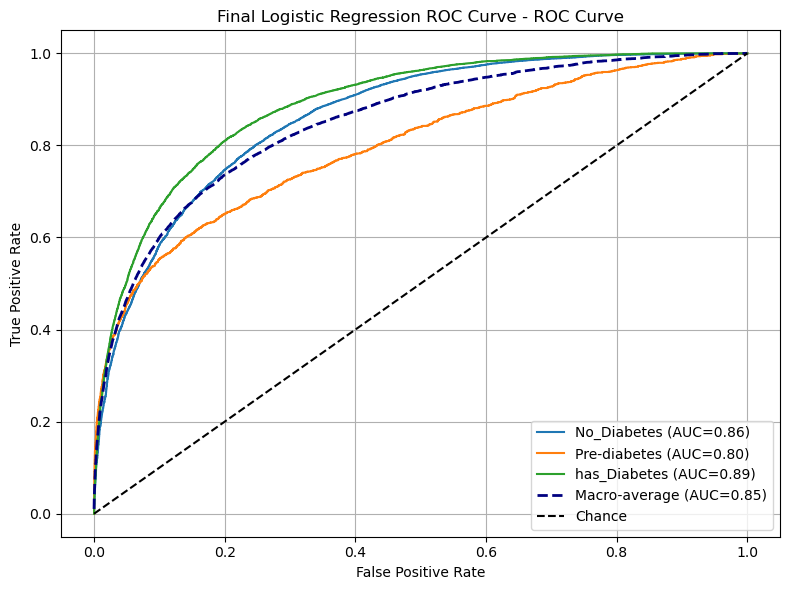

In [14]:
# -----------------------
# Feature matrix and target
# -----------------------
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)
y_train = pd.Series(y_train, index=X_train.index)
y_test = pd.Series(y_test, index=X_test.index)

# -----------------------
# Balance training data (upsample/downsample)
# -----------------------
class_counts = y_train.value_counts()
target_size = int(class_counts.mean())

X_train_balanced, y_train_balanced = [], []

for label in class_counts.index:
    X_class = X_train[y_train == label]
    y_class = y_train[y_train == label]

    if len(X_class) > target_size:
        X_res, y_res = resample(X_class, y_class, replace=False, n_samples=target_size, random_state=42)
    else:
        X_res, y_res = resample(X_class, y_class, replace=True, n_samples=target_size, random_state=42)

    X_train_balanced.append(X_res)
    y_train_balanced.append(y_res)

X_train_balanced = pd.concat(X_train_balanced)
y_train_balanced = pd.concat(y_train_balanced)
print("Balanced class distribution:\n", y_train_balanced.value_counts())

# -----------------------
# Confusion matrix plot function
# -----------------------
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.tight_layout()
    plt.show()

# -----------------------
# ROC curve plot function
# -----------------------
def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes
    macro_auc = auc(all_fpr, mean_tpr)

    plt.figure(figsize=(8,6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC={roc_auc[i]:.2f})")
    plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', linewidth=2, label=f"Macro-average (AUC={macro_auc:.2f})")
    plt.plot([0,1],[0,1],'k--', label='Chance')
    plt.title(f"{model_name} - ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# -----------------------
# Stratified K-Fold CV
# -----------------------
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_times = []  # track execution time per fold

fold_metrics_acc = []
fold_metrics_precision = []
fold_metrics_recall = []
fold_metrics_f1 = []
fold_metrics_auc = []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_balanced, y_train_balanced), 1):
    X_tr, X_val = X_train_balanced.iloc[train_idx], X_train_balanced.iloc[val_idx]
    y_tr, y_val = y_train_balanced.iloc[train_idx], y_train_balanced.iloc[val_idx]

    start_time = time.time()
    model = LogisticRegression(max_iter=1000, multi_class="multinomial")
    model.fit(X_tr, y_tr)
    exec_time = time.time() - start_time

    fold_times.append(exec_time)  # store time per fold

    y_val_pred = model.predict(X_val)
    y_val_score = model.predict_proba(X_val)

    # store per-fold metrics
    fold_metrics_acc.append(accuracy_score(y_val, y_val_pred))
    fold_metrics_precision.append(precision_score(y_val, y_val_pred, average='macro', zero_division=0))
    fold_metrics_recall.append(recall_score(y_val, y_val_pred, average='macro', zero_division=0))
    fold_metrics_f1.append(f1_score(y_val, y_val_pred, average='macro', zero_division=0))
    fold_metrics_auc.append(roc_auc_score(y_val, y_val_score, average='macro', multi_class='ovr'))

# Compute average metrics
avg_metrics = {
    "Accuracy": np.mean(fold_metrics_acc),
    "Precision (macro)": np.mean(fold_metrics_precision),
    "Recall (macro)": np.mean(fold_metrics_recall),
    "F1 Score (macro)": np.mean(fold_metrics_f1),
    "ROC AUC (macro)": np.mean(fold_metrics_auc)
}

print("✅ Average metrics across all folds:")
print(pd.Series(avg_metrics))


# -----------------------
# Plots for CV
# -----------------------
plt.figure(figsize=(8,5))
plt.plot(range(1, n_splits+1), fold_metrics_acc, marker='o')
plt.title("Validation Accuracy per Fold")
plt.xlabel("Fold")
plt.ylabel("Accuracy")
plt.grid(True)
plt.show()


# -----------------------
# Plot Accuracy vs Execution Time
# -----------------------
plt.figure(figsize=(8,5))
plt.scatter(fold_times, fold_metrics_acc, c='green', s=100)
for i, txt in enumerate(range(1, n_splits+1)):
    plt.annotate(f"Fold {txt}", (fold_times[i], fold_metrics_acc[i]))
plt.title("Validation Accuracy vs Execution Time")
plt.xlabel("Execution Time (s)")
plt.ylabel("Validation Accuracy")
plt.grid(True)
plt.show()

# -----------------------
# Retrain final model on full balanced training set
# -----------------------
final_model = LogisticRegression(max_iter=1000, multi_class="multinomial")
final_model.fit(X_train_balanced, y_train_balanced)

# -----------------------
# Evaluate final model on test set
# -----------------------
y_test_pred = final_model.predict(X_test)
y_test_score = final_model.predict_proba(X_test)

print("\nFinal Model Metrics (Full Training → Test Set):")
print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
print(classification_report(y_test, y_test_pred, target_names=le.classes_))

plot_conf_matrix(y_test, y_test_pred, "Final Logistic Regression Confusion Matrix (Test Set)")
plot_roc_curve(y_test, y_test_score, "Final Logistic Regression ROC Curve")


# 6.2. Advanced ML Models


In [15]:
#X_train, y_train = X_train_balanced, y_train_balanced


In [16]:
# ====== Models ======
models = {
    "Logistic Regression": LogisticRegression(max_iter=3000),
    "KNN": KNeighborsClassifier(),
    #"SVM": SVC(probability=True),
    "Random Forest": RandomForestClassifier(),
    "Naive Bayes": GaussianNB(),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', use_label_encoder=False),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0),
    "Decision Tree": DecisionTreeClassifier(random_state=42)
}

# ====== ROC Curve ======
def plot_roc_curve_test(y_true, y_proba, model_name):
    classes = np.unique(y_true)
    y_bin = label_binarize(y_true, classes=classes)

    if y_bin.shape[1] == 1:
        y_bin = np.hstack((1 - y_bin, y_bin))

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f"Class {classes[i]} (AUC = {roc_auc[i]:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Random Guess")
    plt.title(f"ROC Curve - {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()
    
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

# ====== Pipeline ======
def get_pipeline(model, use_oversampling=True):
    if use_oversampling:
        return ImbPipeline([
            ('smote', SMOTE(random_state=42)),
            ('clf', model)
        ])
    else:
        return Pipeline([('clf', model)])
   
def run_model_cv(model_name, use_oversampling=True, n_splits=5):
    print(f"\n📌 Running Model: {model_name} | Oversampling: {use_oversampling} | {n_splits}-Fold CV")

    if model_name not in models:
        print(f"❌ Model '{model_name}' not found.")
        return

    model = models[model_name]
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    fold_acc, fold_loss, fold_times = [], [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        pipe = get_pipeline(model, use_oversampling)

        start_time = time.time()
        pipe.fit(X_tr, y_tr)
        exec_time = time.time() - start_time

        y_val_pred = pipe.predict(X_val)
        y_val_proba = pipe.predict_proba(X_val)

        acc = accuracy_score(y_val, y_val_pred)
        loss = log_loss(y_val, y_val_proba)

        fold_acc.append(acc)
        fold_loss.append(loss)
        fold_times.append(exec_time)

        print(f"Fold {fold}: Val Accuracy={acc:.4f}, Log Loss={loss:.4f}, Time={exec_time:.2f}s")

    # -----------------------
    # Summary of folds
    # -----------------------
    print("\n🔹 Cross-Validation Summary (averaged over folds):")
    print(f"Accuracy: {np.mean(fold_acc):.4f} ± {np.std(fold_acc):.4f}")
    print(f"Log Loss: {np.mean(fold_loss):.4f} ± {np.std(fold_loss):.4f}")

    # -----------------------
    # Plot training metrics per fold
    # -----------------------
    plt.figure(figsize=(8,5))
    plt.plot(range(1, n_splits+1), fold_acc, marker='o', label="Accuracy")
    plt.plot(range(1, n_splits+1), fold_loss, marker='x', label="Log Loss")
    plt.title(f"{model_name} - Fold Accuracy & Loss")
    plt.xlabel("Fold")
    plt.ylabel("Value")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    plt.figure(figsize=(8,5))
    plt.scatter(fold_times, fold_acc, c='green', s=100)
    for i, txt in enumerate(range(1, n_splits+1)):
        plt.annotate(f"Fold {txt}", (fold_times[i], fold_acc[i]))
    plt.title(f"{model_name} - Accuracy vs Execution Time")
    plt.xlabel("Execution Time (s)")
    plt.ylabel("Validation Accuracy")
    plt.grid(True)
    plt.tight_layout()
    plt.show()

    # -----------------------
    # Retrain final model on full training set
    # -----------------------
    final_pipe = get_pipeline(model, use_oversampling)
    final_pipe.fit(X_train, y_train)

    y_test_pred = final_pipe.predict(X_test)
    y_test_proba = final_pipe.predict_proba(X_test)
    
    # 🔹 Evaluate on training set
    y_train_pred = final_pipe.predict(X_train)
    print("\n🔹 Final Model Metrics on Training Set:")
    print(f"Accuracy: {accuracy_score(y_train, y_train_pred):.4f}")
    print(classification_report(y_train, y_train_pred, target_names=le.classes_))

    print("\n🔹 Final Model Metrics on Test Set:")
    print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))

    print("\n🧾 Test Set Confusion Matrix:")
    plot_conf_matrix(y_test, y_test_pred, f"{model_name} - Final Test Set")

    print("\n📈 Test Set ROC Curve:")
    plot_roc_curve_test(y_test, y_test_proba, f"{model_name} - Final Test Set")



📌 Running Model: Logistic Regression | Oversampling: True | 5-Fold CV
Fold 1: Val Accuracy=0.7449, Log Loss=0.6906, Time=2.57s
Fold 2: Val Accuracy=0.7457, Log Loss=0.6864, Time=2.28s
Fold 3: Val Accuracy=0.7400, Log Loss=0.6911, Time=2.64s
Fold 4: Val Accuracy=0.7454, Log Loss=0.6874, Time=2.88s
Fold 5: Val Accuracy=0.7496, Log Loss=0.6850, Time=2.61s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.7451 ± 0.0030
Log Loss: 0.6881 ± 0.0024


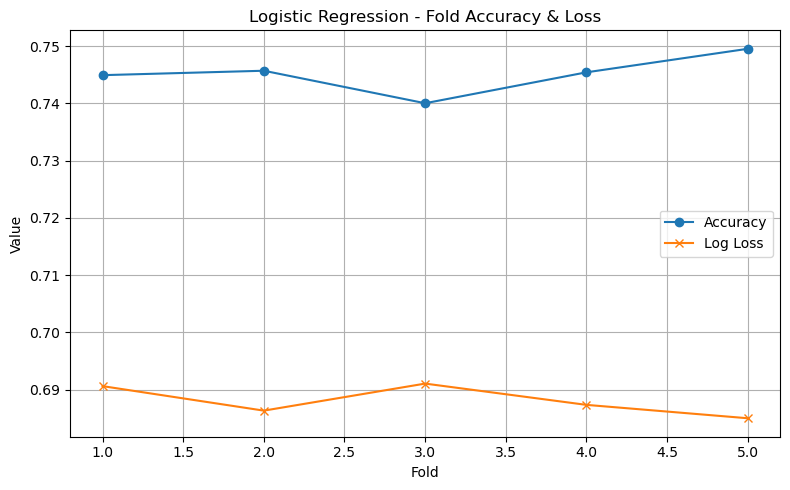

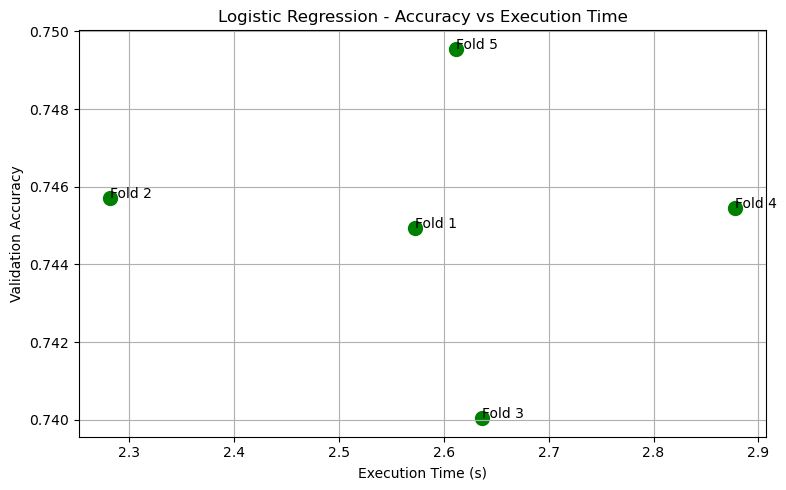


🔹 Final Model Metrics on Training Set:
Accuracy: 0.7454
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.75      0.80     66525
Pre-diabetes       0.33      0.50      0.40      6420
has_Diabetes       0.68      0.79      0.73     35401

    accuracy                           0.75    108346
   macro avg       0.62      0.68      0.64    108346
weighted avg       0.77      0.75      0.75    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.7391
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.74      0.79     16632
Pre-diabetes       0.32      0.48      0.38      1605
has_Diabetes       0.67      0.79      0.73      8850

    accuracy                           0.74     27087
   macro avg       0.62      0.67      0.63     27087
weighted avg       0.76      0.74      0.75     27087


🧾 Test Set Confusion Matrix:


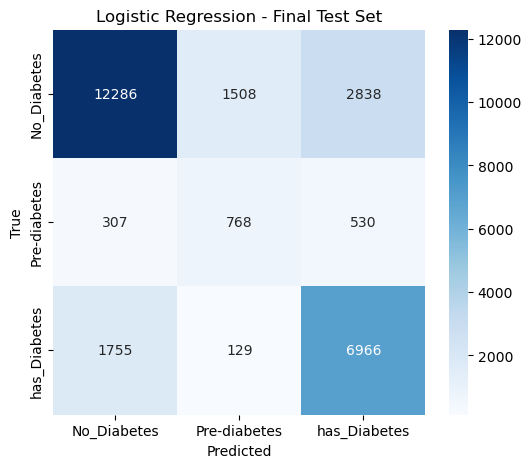


📈 Test Set ROC Curve:


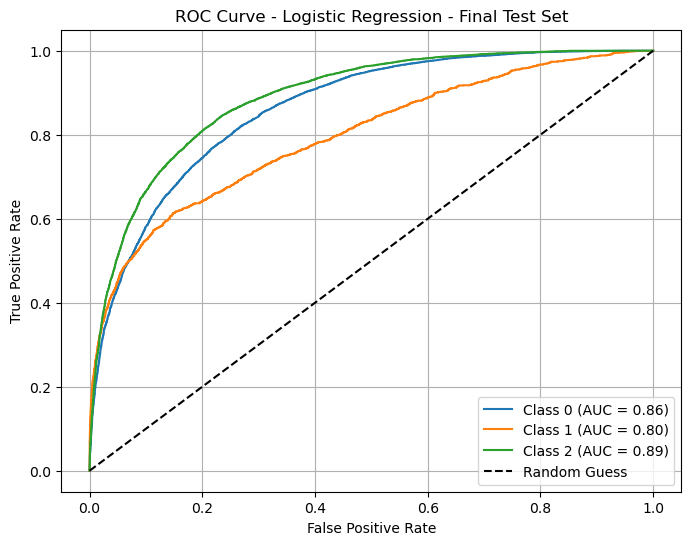

In [17]:
run_model_cv("Logistic Regression", use_oversampling=True)

### 6.2.1. KNN  (non-parametric algorithm, a non fitting try model, intuitive,) supervised machine learning
it is CALCULATING THE DISTANCE from one point to the rest
A TYPE of LAZY learning algo, it does not do TRAINING, nor Learning parameters from data, BUT USING Training data directly.
distance is another hyperparameters


📌 Running Model: KNN | Oversampling: True | 5-Fold CV
Fold 1: Val Accuracy=0.6901, Log Loss=4.4234, Time=0.52s
Fold 2: Val Accuracy=0.6934, Log Loss=4.3304, Time=0.52s
Fold 3: Val Accuracy=0.6944, Log Loss=4.4213, Time=0.62s
Fold 4: Val Accuracy=0.6968, Log Loss=4.3523, Time=0.51s
Fold 5: Val Accuracy=0.6920, Log Loss=4.4585, Time=0.50s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.6934 ± 0.0023
Log Loss: 4.3972 ± 0.0480


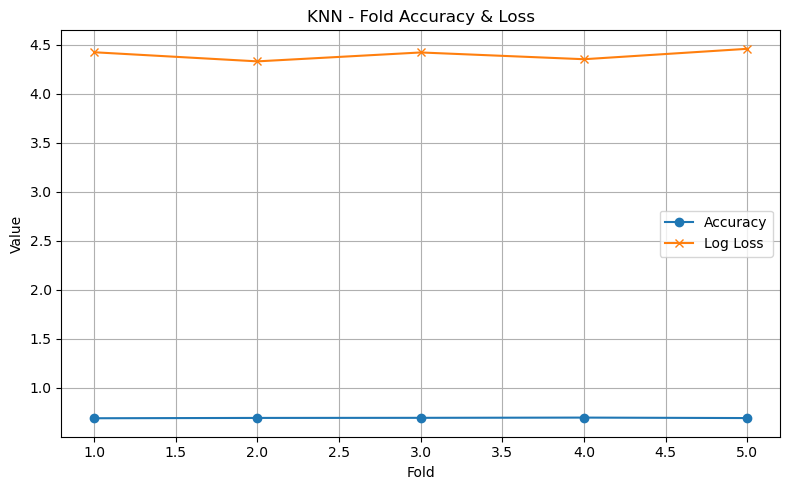

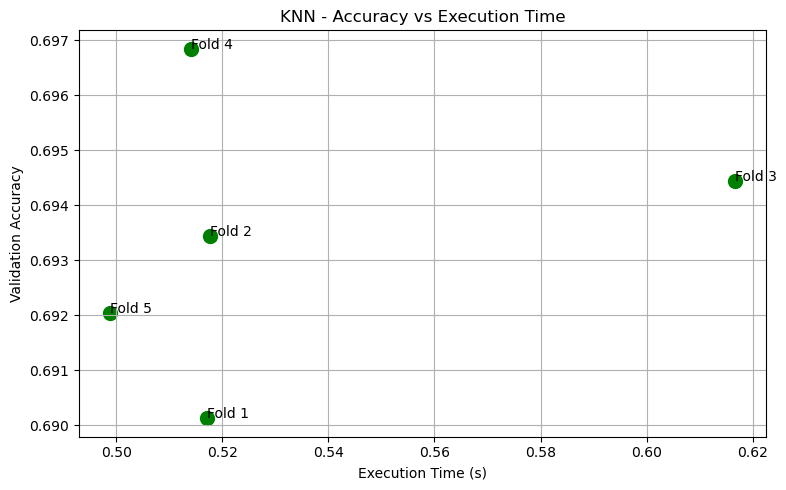


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8238
              precision    recall  f1-score   support

 No_Diabetes       0.92      0.82      0.87     66525
Pre-diabetes       0.46      0.94      0.62      6420
has_Diabetes       0.80      0.82      0.81     35401

    accuracy                           0.82    108346
   macro avg       0.73      0.86      0.76    108346
weighted avg       0.85      0.82      0.83    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.6923
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.74      0.78     16632
Pre-diabetes       0.19      0.42      0.26      1605
has_Diabetes       0.65      0.66      0.66      8850

    accuracy                           0.69     27087
   macro avg       0.56      0.60      0.57     27087
weighted avg       0.74      0.69      0.71     27087


🧾 Test Set Confusion Matrix:


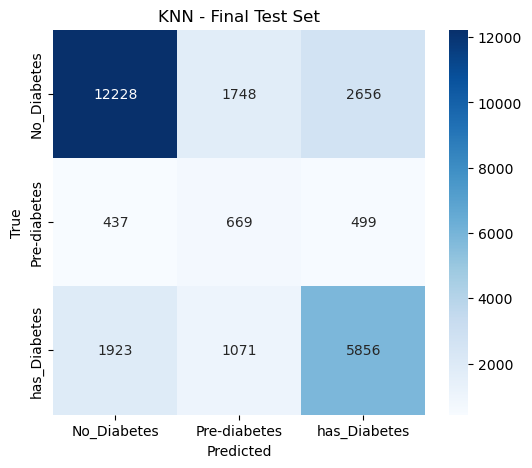


📈 Test Set ROC Curve:


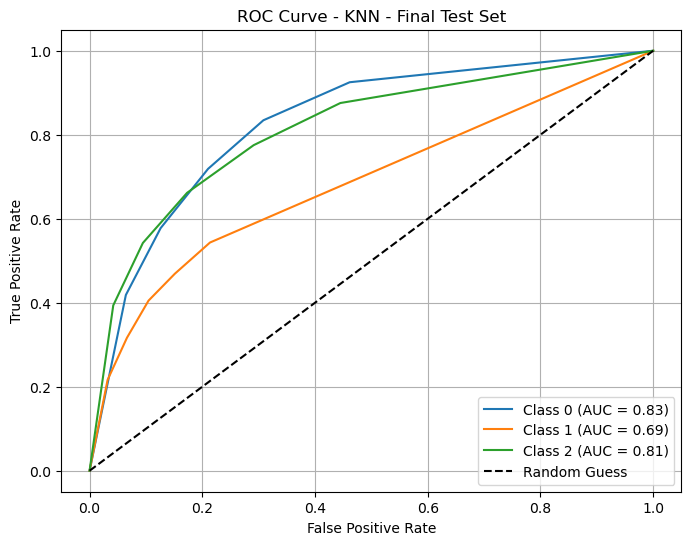

In [82]:
run_model_cv("KNN", use_oversampling=True)


### 6.2.b. NAIVE BAYES
Bayes theorem, simply multiplying probabilities (Features INDEPENDENCE = NAIVE) False assumption that different probabilities are INDEPENDENT from each others, which give this Classifier to be called NAIVE... making it very computationally efficient while still being a good approximation


📌 Running Model: Naive Bayes | Oversampling: False | 5-Fold CV
Fold 1: Val Accuracy=0.5506, Log Loss=3.0685, Time=0.02s
Fold 2: Val Accuracy=0.5507, Log Loss=3.0427, Time=0.02s
Fold 3: Val Accuracy=0.5479, Log Loss=3.0822, Time=0.02s
Fold 4: Val Accuracy=0.5484, Log Loss=3.0139, Time=0.02s
Fold 5: Val Accuracy=0.5454, Log Loss=3.0993, Time=0.02s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.5486 ± 0.0020
Log Loss: 3.0613 ± 0.0301


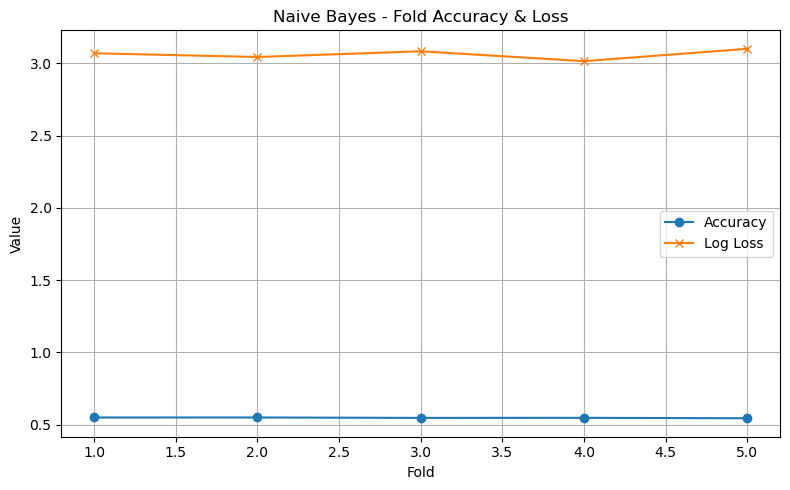

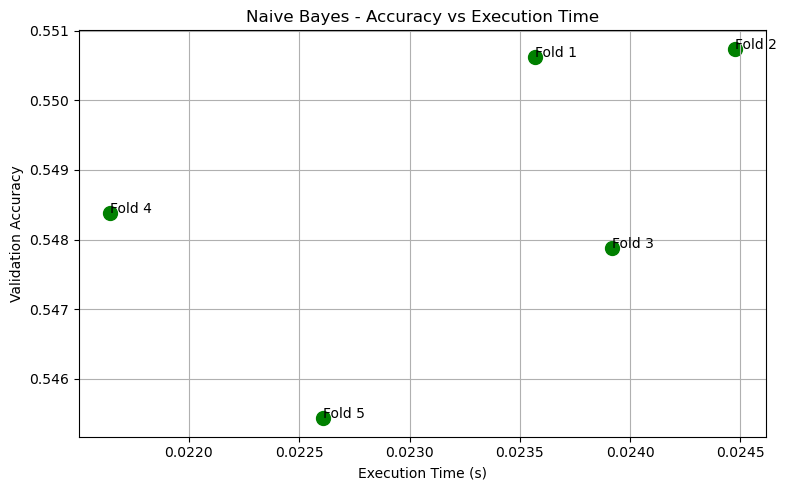


🔹 Final Model Metrics on Training Set:
Accuracy: 0.5487
              precision    recall  f1-score   support

 No_Diabetes       0.92      0.34      0.50     66525
Pre-diabetes       0.46      0.37      0.41      6420
has_Diabetes       0.44      0.97      0.60     35401

    accuracy                           0.55    108346
   macro avg       0.61      0.56      0.50    108346
weighted avg       0.73      0.55      0.53    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.5473
              precision    recall  f1-score   support

 No_Diabetes       0.92      0.34      0.50     16632
Pre-diabetes       0.46      0.37      0.41      1605
has_Diabetes       0.44      0.97      0.60      8850

    accuracy                           0.55     27087
   macro avg       0.60      0.56      0.50     27087
weighted avg       0.73      0.55      0.53     27087


🧾 Test Set Confusion Matrix:


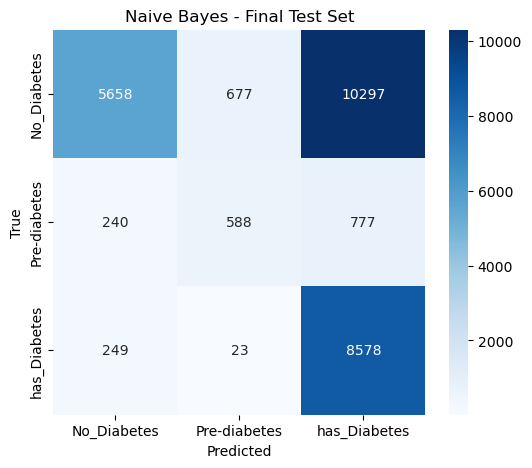


📈 Test Set ROC Curve:


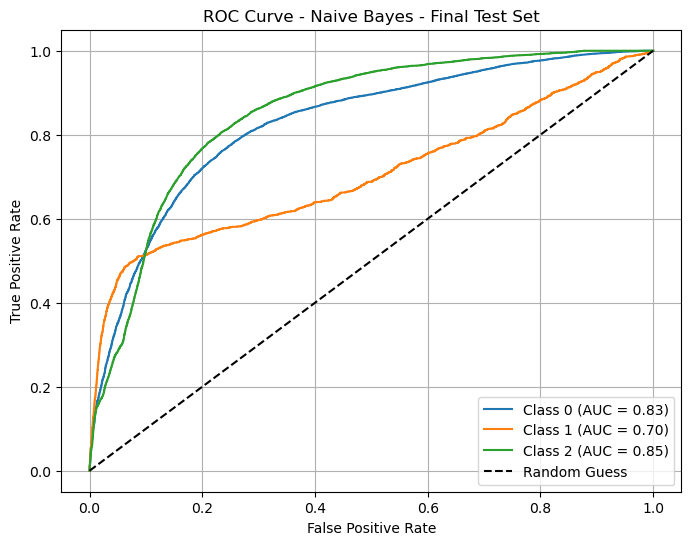

In [83]:
run_model_cv("Naive Bayes", use_oversampling=False)


### 6.2.c. Run the Decision Tree model (basis of a number of more complex supervised learning algo)
it is basically a series of YES/NO questions... leaf, and goes to high dimension


📌 Running Model: Decision Tree | Oversampling: True | 5-Fold CV
Fold 1: Val Accuracy=0.7524, Log Loss=7.9698, Time=1.36s
Fold 2: Val Accuracy=0.7479, Log Loss=8.1316, Time=1.32s
Fold 3: Val Accuracy=0.7496, Log Loss=8.0927, Time=1.30s
Fold 4: Val Accuracy=0.7544, Log Loss=7.8924, Time=1.37s
Fold 5: Val Accuracy=0.7489, Log Loss=8.1206, Time=1.30s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.7507 ± 0.0024
Log Loss: 8.0414 ± 0.0942


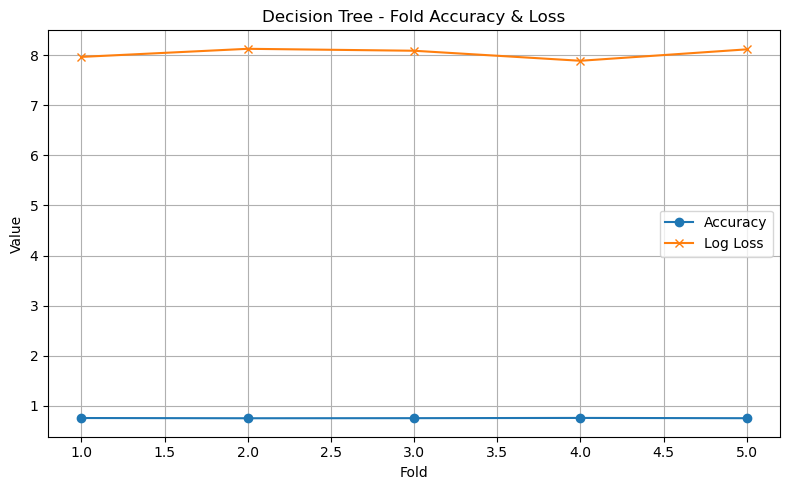

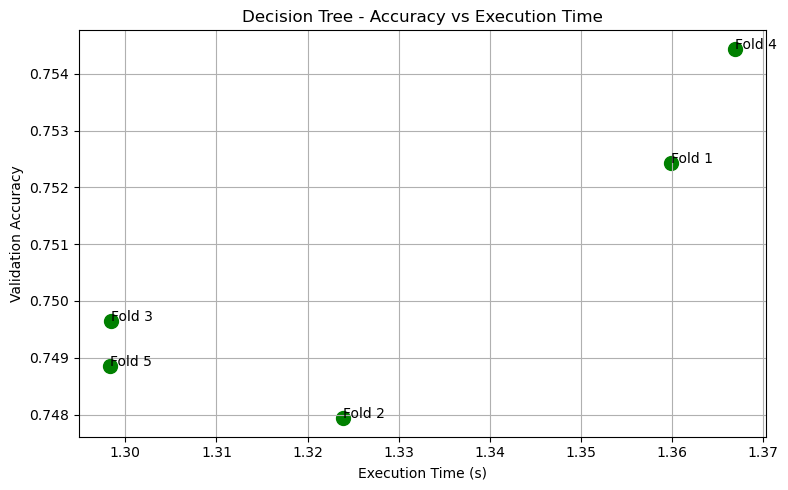


🔹 Final Model Metrics on Training Set:
Accuracy: 0.9608
              precision    recall  f1-score   support

 No_Diabetes       0.95      0.99      0.97     66525
Pre-diabetes       0.96      0.90      0.93      6420
has_Diabetes       0.97      0.92      0.95     35401

    accuracy                           0.96    108346
   macro avg       0.96      0.94      0.95    108346
weighted avg       0.96      0.96      0.96    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.7487
              precision    recall  f1-score   support

 No_Diabetes       0.82      0.84      0.83     16632
Pre-diabetes       0.30      0.34      0.32      1605
has_Diabetes       0.69      0.66      0.68      8850

    accuracy                           0.75     27087
   macro avg       0.61      0.61      0.61     27087
weighted avg       0.75      0.75      0.75     27087


🧾 Test Set Confusion Matrix:


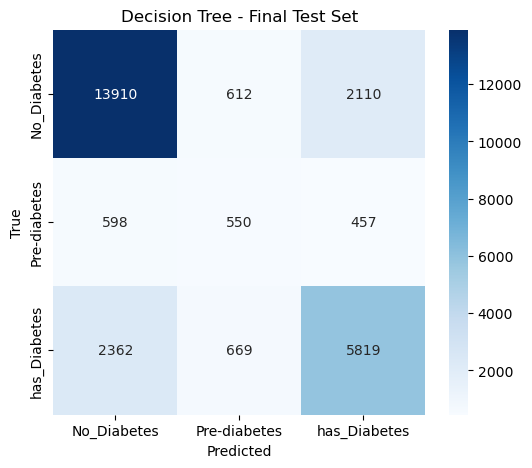


📈 Test Set ROC Curve:


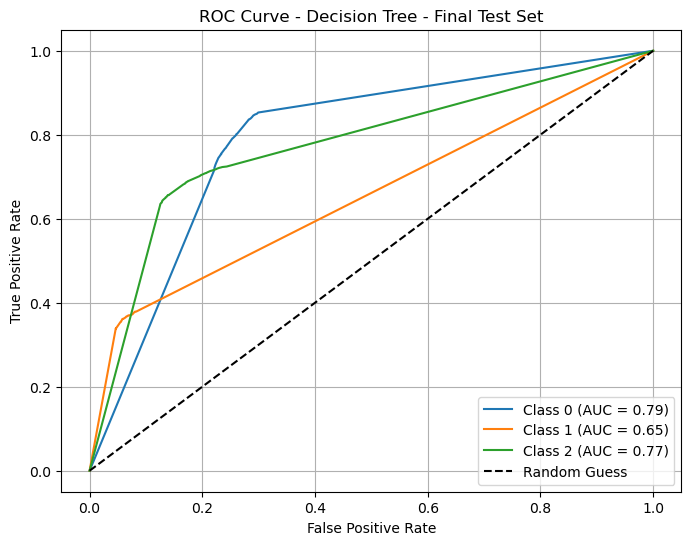

In [84]:
# ========== Run the Decision Tree model ======
run_model_cv("Decision Tree", use_oversampling=True)

### 6.2.d. LightGBM


📌 Running Model: LightGBM | Oversampling: False | 5-Fold CV
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002513 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 86676, number of used features: 20
[LightGBM] [Info] Start training from score -0.487743
[LightGBM] [Info] Start training from score -2.825902
[LightGBM] [Info] Start training from score -1.118609
Fold 1: Val Accuracy=0.8352, Log Loss=0.4316, Time=0.44s
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002224 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 86677, number of used features: 20
[LightGBM] [Info

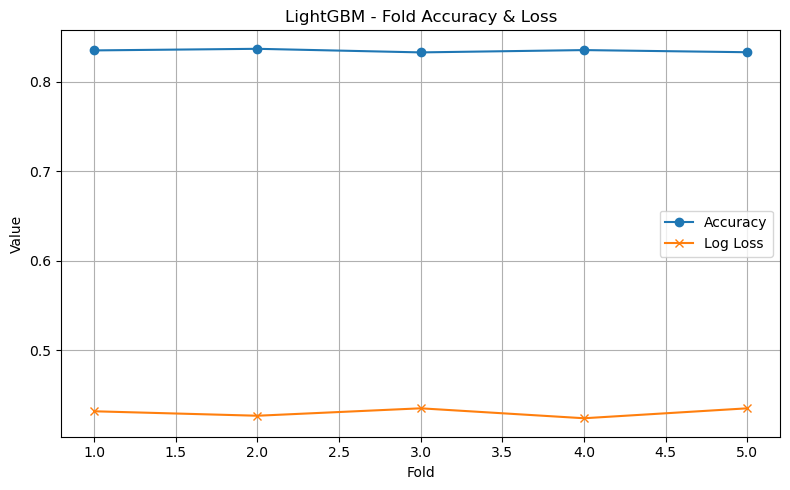

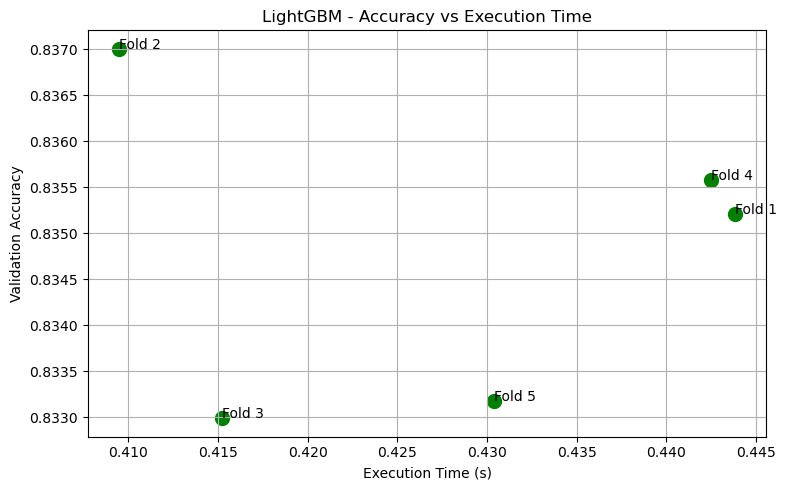

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002608 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 108346, number of used features: 20
[LightGBM] [Info] Start training from score -0.487752
[LightGBM] [Info] Start training from score -2.825912
[LightGBM] [Info] Start training from score -1.118590

🔹 Final Model Metrics on Training Set:
Accuracy: 0.8406
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.96      0.89     66525
Pre-diabetes       0.94      0.29      0.44      6420
has_Diabetes       0.84      0.72      0.78     35401

    accuracy                           0.84    108346
   macro avg       0.87      0.66      0.70    108346
weighted avg       0.85      0.84      0.83    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0

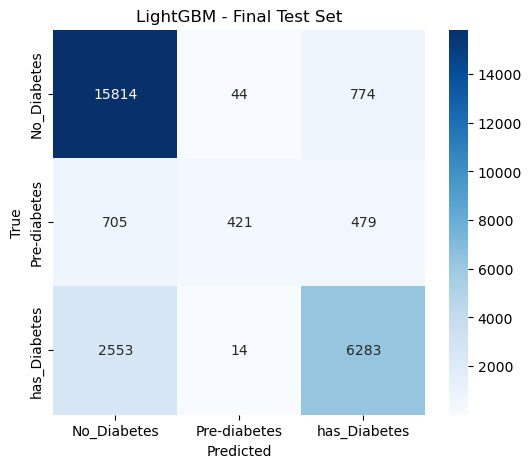


📈 Test Set ROC Curve:


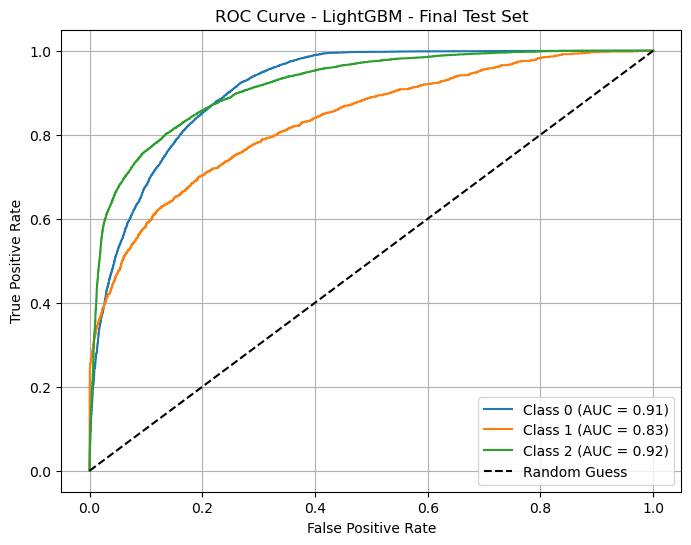

In [85]:
run_model_cv("LightGBM", use_oversampling=False)


### 6.2.e. CatBoost


📌 Running Model: CatBoost | Oversampling: False | 5-Fold CV
Fold 1: Val Accuracy=0.8335, Log Loss=0.4371, Time=9.05s
Fold 2: Val Accuracy=0.8349, Log Loss=0.4306, Time=8.95s
Fold 3: Val Accuracy=0.8328, Log Loss=0.4386, Time=9.18s
Fold 4: Val Accuracy=0.8349, Log Loss=0.4288, Time=9.30s
Fold 5: Val Accuracy=0.8316, Log Loss=0.4404, Time=8.87s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8335 ± 0.0013
Log Loss: 0.4351 ± 0.0046


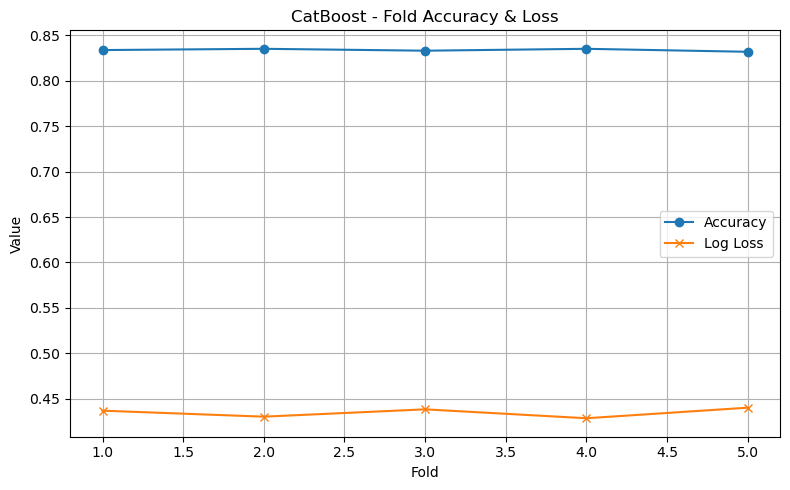

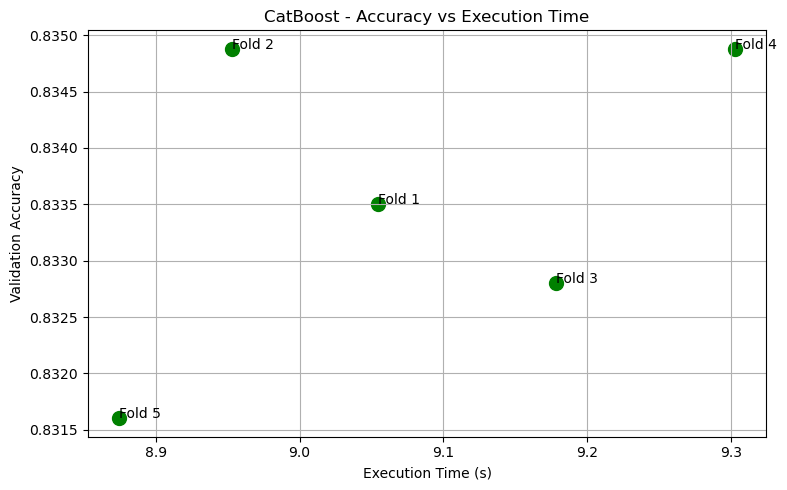


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8508
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.96      0.90     66525
Pre-diabetes       0.96      0.32      0.48      6420
has_Diabetes       0.86      0.74      0.79     35401

    accuracy                           0.85    108346
   macro avg       0.89      0.67      0.72    108346
weighted avg       0.86      0.85      0.84    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8317
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.88      0.26      0.41      1605
has_Diabetes       0.83      0.71      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.64      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


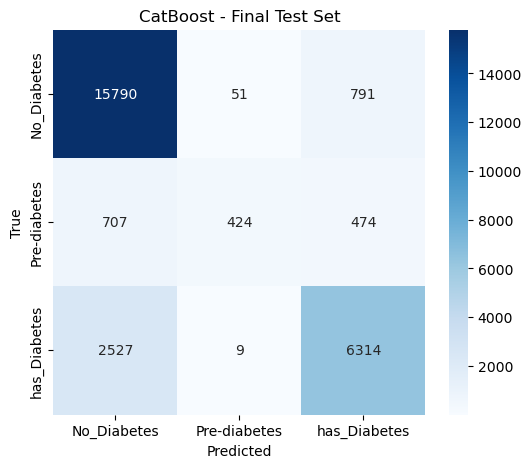


📈 Test Set ROC Curve:


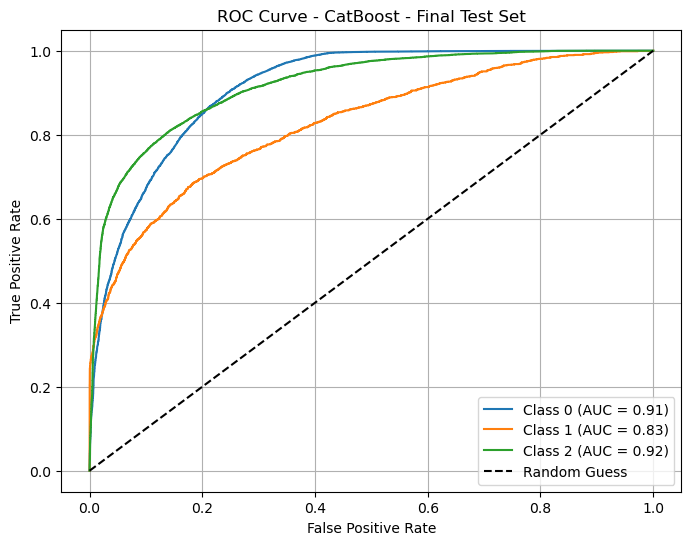

In [86]:
run_model_cv("CatBoost", use_oversampling=False)



📌 Running Model: CatBoost | Oversampling: True | 5-Fold CV
Fold 1: Val Accuracy=0.8329, Log Loss=0.4437, Time=21.46s
Fold 2: Val Accuracy=0.8360, Log Loss=0.4382, Time=22.15s
Fold 3: Val Accuracy=0.8300, Log Loss=0.4439, Time=22.49s
Fold 4: Val Accuracy=0.8323, Log Loss=0.4352, Time=22.06s
Fold 5: Val Accuracy=0.8310, Log Loss=0.4466, Time=21.53s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8325 ± 0.0021
Log Loss: 0.4415 ± 0.0042


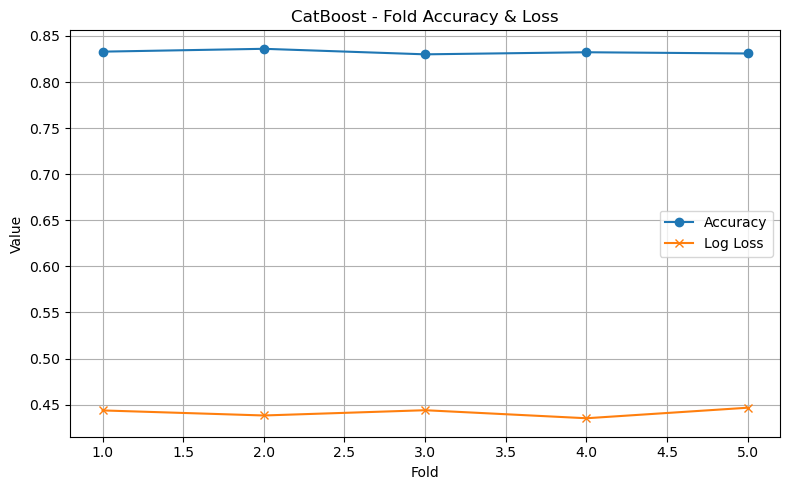

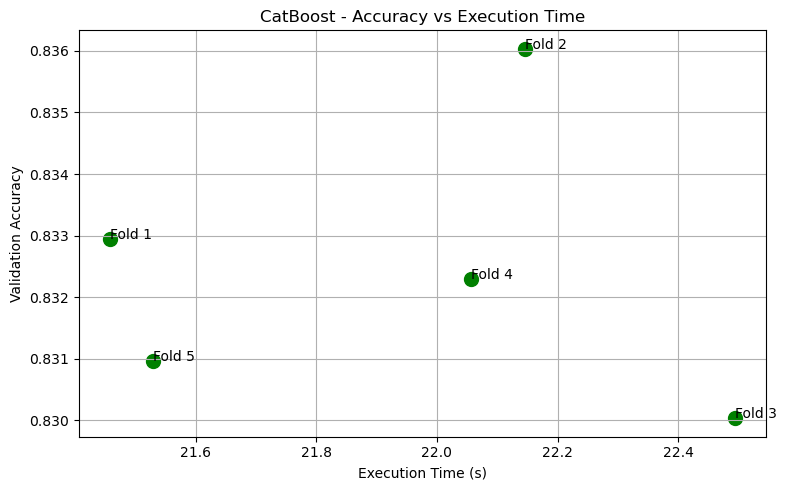


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8429
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.95      0.89     66525
Pre-diabetes       0.91      0.30      0.46      6420
has_Diabetes       0.83      0.75      0.79     35401

    accuracy                           0.84    108346
   macro avg       0.86      0.67      0.71    108346
weighted avg       0.84      0.84      0.83    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8303
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.88     16632
Pre-diabetes       0.82      0.27      0.41      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.82      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


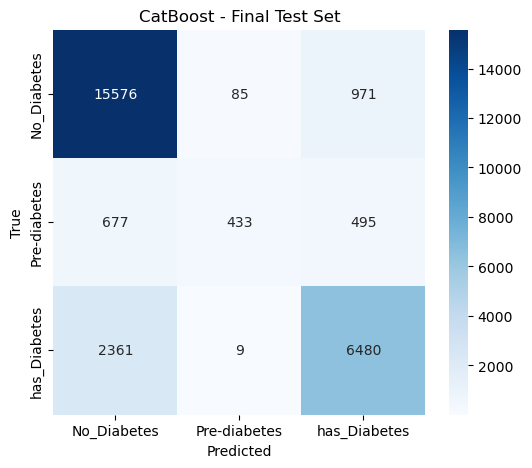


📈 Test Set ROC Curve:


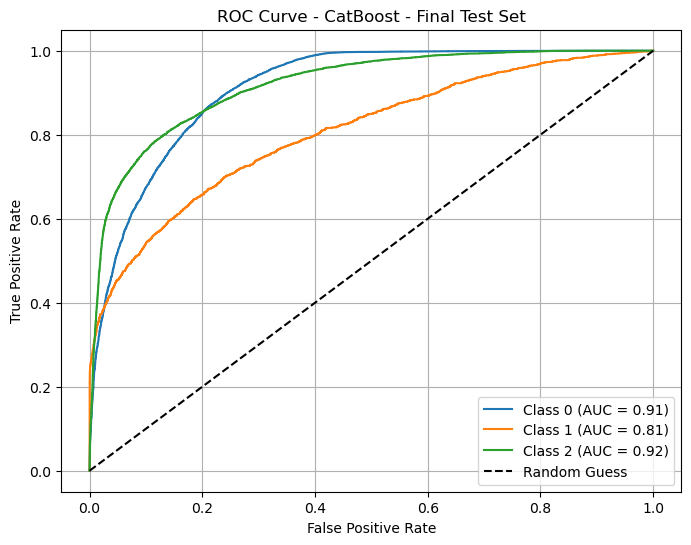

In [87]:
run_model_cv("CatBoost", use_oversampling=True)

### 6.2.f. XGBoost (Ensemble algorithm = combining many single Decision Tree into a more complex model)
ONE form of Ensembling is BAGGING where we train multiple models on different subsets of the training data using method called BOOTSTRAP, a famous version of this idea is BOOSTING,...
HERE We train models in SEQUENCE where each focus on fixing the errors made by the previous model, then combine a series of weak models in sequence thus becoming a strong model bcoz each sequential model tries to fix the errors of the previous model.

Boosted trees often get to higher accuracies than Random Forests but are also more prone to overfitting its sequential nature makes it slower to train than random forest.

OTHERS EXAMPLES OF BOOSTED TREES: Ada boost, gradient boosting, and XGBoost


📌 Running Model: XGBoost | Oversampling: False | 5-Fold CV


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 1: Val Accuracy=0.8343, Log Loss=0.4373, Time=0.49s


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:20] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 2: Val Accuracy=0.8364, Log Loss=0.4313, Time=0.52s


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:21] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 3: Val Accuracy=0.8320, Log Loss=0.4398, Time=0.57s


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 4: Val Accuracy=0.8345, Log Loss=0.4294, Time=0.55s


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:22] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


Fold 5: Val Accuracy=0.8320, Log Loss=0.4428, Time=0.60s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8338 ± 0.0017
Log Loss: 0.4361 ± 0.0051


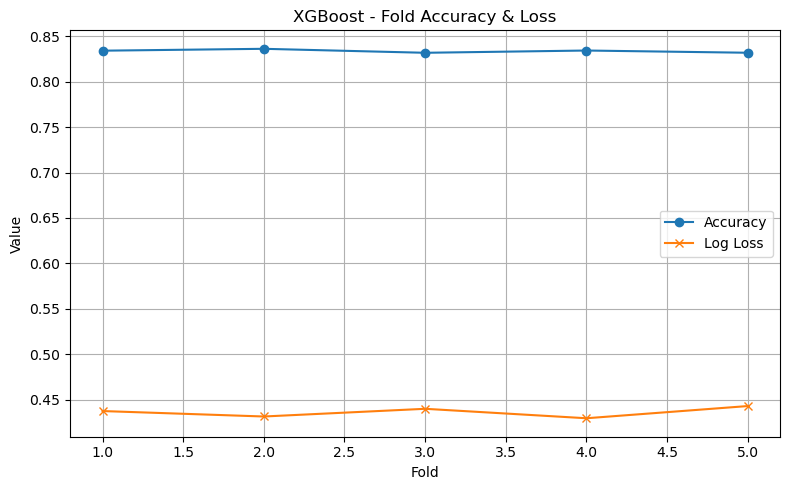

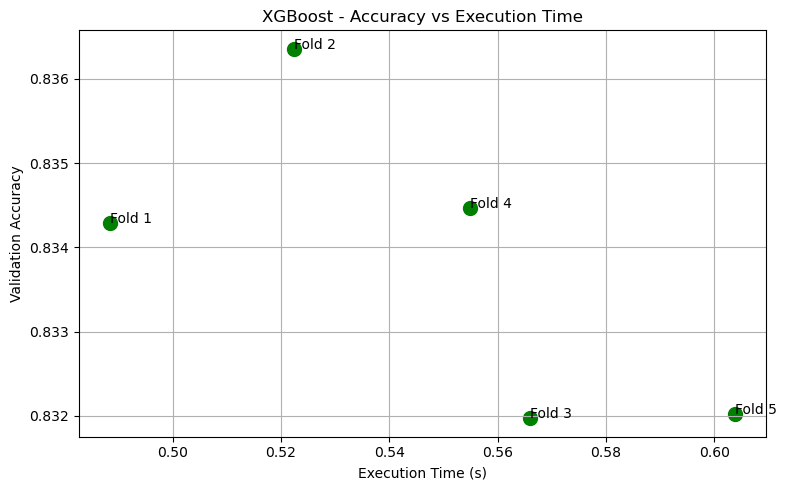

C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [14:37:23] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



🔹 Final Model Metrics on Training Set:
Accuracy: 0.8492
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.96      0.90     66525
Pre-diabetes       0.96      0.33      0.49      6420
has_Diabetes       0.86      0.73      0.79     35401

    accuracy                           0.85    108346
   macro avg       0.89      0.67      0.73    108346
weighted avg       0.85      0.85      0.84    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8314
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.85      0.27      0.41      1605
has_Diabetes       0.83      0.71      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.84      0.64      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


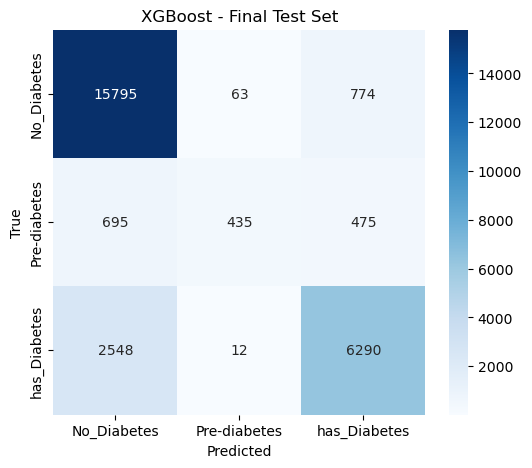


📈 Test Set ROC Curve:


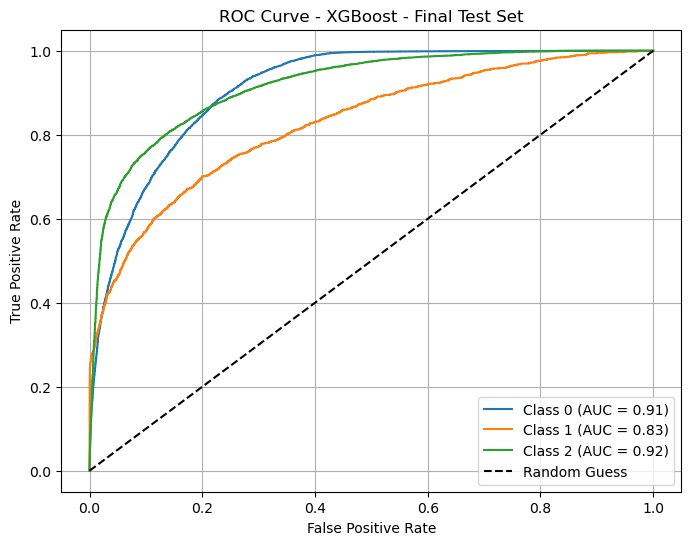

In [90]:
# Example runs
#run_model_cv_score("Logistic Regression", use_oversampling=True)
run_model_cv("XGBoost", use_oversampling=False)


### 6.2.g. Random Forest (Ensemble algorithm = combining many single Decision Tree into a more complex model)
ONE form of Ensembling is BAGGING where we train multiple models on different subsets of the training data using method called BOOTSTRAP, a famous version of this idea is Random Forest(trees vote by majority), 
HERE many DECISISON TREES are ran in PARALLEL
RANDOMNESS comes by randomly excluding features for different trees in the forest which prevents overfitting and makes it much more robust bcoz remove correlation between trees. 


📌 Running Model: Random Forest | Oversampling: True | 5-Fold CV
Fold 1: Val Accuracy=0.8084, Log Loss=0.8526, Time=15.01s
Fold 2: Val Accuracy=0.8090, Log Loss=0.8270, Time=14.65s
Fold 3: Val Accuracy=0.8053, Log Loss=0.8244, Time=14.56s
Fold 4: Val Accuracy=0.8091, Log Loss=0.8651, Time=14.80s
Fold 5: Val Accuracy=0.8055, Log Loss=0.8921, Time=14.94s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8075 ± 0.0017
Log Loss: 0.8522 ± 0.0252


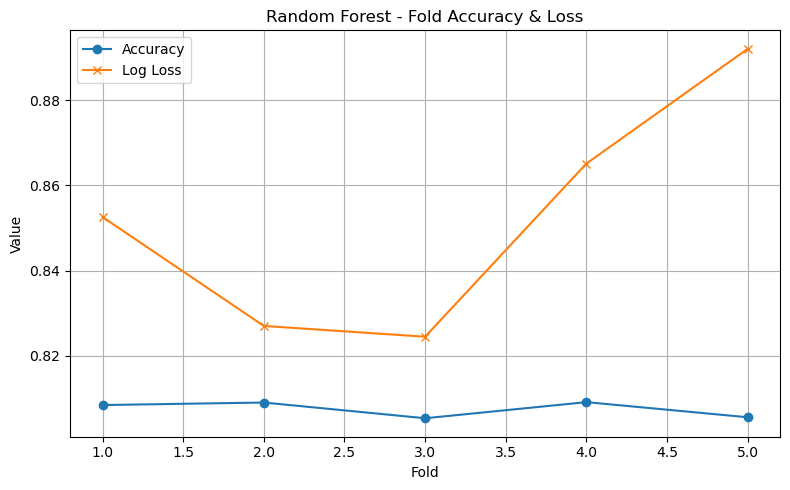

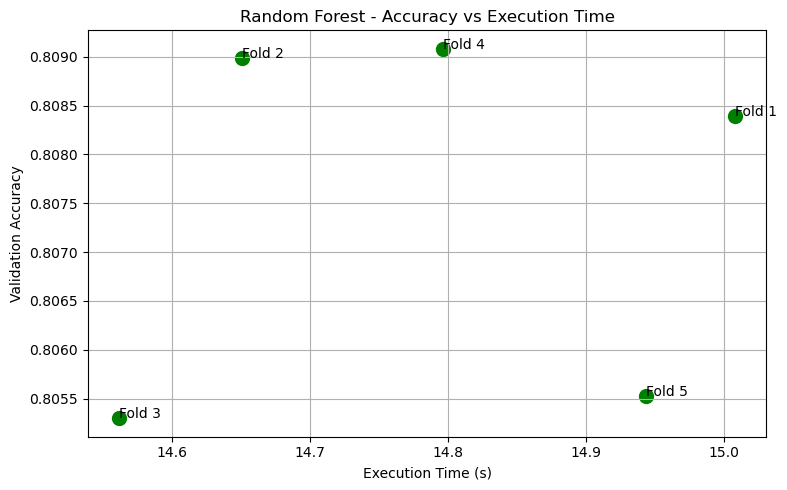


🔹 Final Model Metrics on Training Set:
Accuracy: 0.9605
              precision    recall  f1-score   support

 No_Diabetes       0.96      0.98      0.97     66525
Pre-diabetes       0.97      0.89      0.93      6420
has_Diabetes       0.96      0.94      0.95     35401

    accuracy                           0.96    108346
   macro avg       0.96      0.94      0.95    108346
weighted avg       0.96      0.96      0.96    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8062
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.90      0.87     16632
Pre-diabetes       0.58      0.30      0.40      1605
has_Diabetes       0.76      0.73      0.75      8850

    accuracy                           0.81     27087
   macro avg       0.73      0.64      0.67     27087
weighted avg       0.80      0.81      0.80     27087


🧾 Test Set Confusion Matrix:


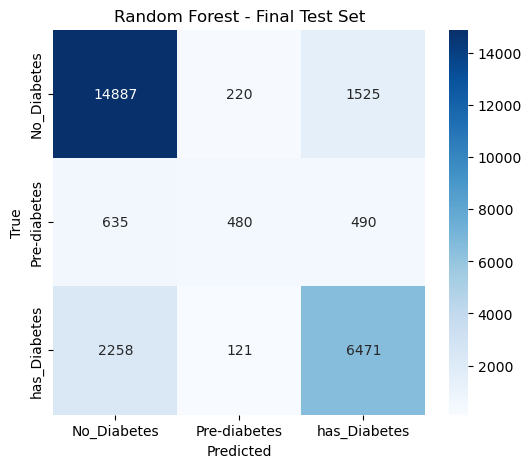


📈 Test Set ROC Curve:


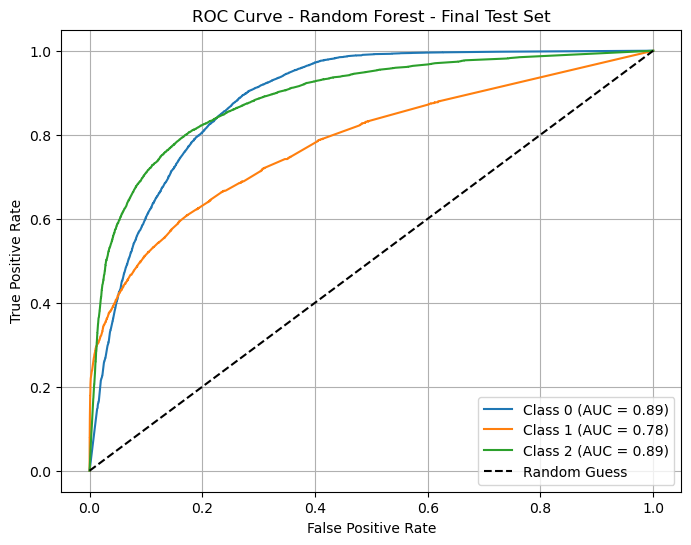

In [91]:
# ========== Run the Decision Tree model ==========
run_model_cv("Random Forest", use_oversampling=True)

### 6.2.h. KOLMOGOROV KAN

🔥 Using device: cuda
checkpoint directory created: ./model
saving model version 0.0
Epoch [25/600] | Train Loss: 1.0674, Train Acc: 0.4948 | Val Loss: 1.0659, Val Acc: 0.4955
Epoch [50/600] | Train Loss: 1.0159, Train Acc: 0.5517 | Val Loss: 1.0143, Val Acc: 0.5494
Epoch [75/600] | Train Loss: 0.9492, Train Acc: 0.5880 | Val Loss: 0.9477, Val Acc: 0.5849
Epoch [100/600] | Train Loss: 0.8853, Train Acc: 0.6252 | Val Loss: 0.8848, Val Acc: 0.6231
Epoch [125/600] | Train Loss: 0.8347, Train Acc: 0.6532 | Val Loss: 0.8355, Val Acc: 0.6487
Epoch [150/600] | Train Loss: 0.7946, Train Acc: 0.6710 | Val Loss: 0.7964, Val Acc: 0.6665
Epoch [175/600] | Train Loss: 0.7645, Train Acc: 0.6804 | Val Loss: 0.7671, Val Acc: 0.6763
Epoch [200/600] | Train Loss: 0.7446, Train Acc: 0.6847 | Val Loss: 0.7476, Val Acc: 0.6819
Epoch [225/600] | Train Loss: 0.7318, Train Acc: 0.6869 | Val Loss: 0.7348, Val Acc: 0.6844
Epoch [250/600] | Train Loss: 0.7224, Train Acc: 0.6886 | Val Loss: 0.7253, Val Acc: 0.6857

C:\Users\olika\AppData\Local\Temp\ipykernel_10604\2585960917.py:122: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12,5))


Epoch [550/600] | Train Loss: 0.6544, Train Acc: 0.7085 | Val Loss: 0.6583, Val Acc: 0.7051
Epoch [575/600] | Train Loss: 0.6523, Train Acc: 0.7088 | Val Loss: 0.6564, Val Acc: 0.7046
Epoch [600/600] | Train Loss: 0.6506, Train Acc: 0.7091 | Val Loss: 0.6550, Val Acc: 0.7050


<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

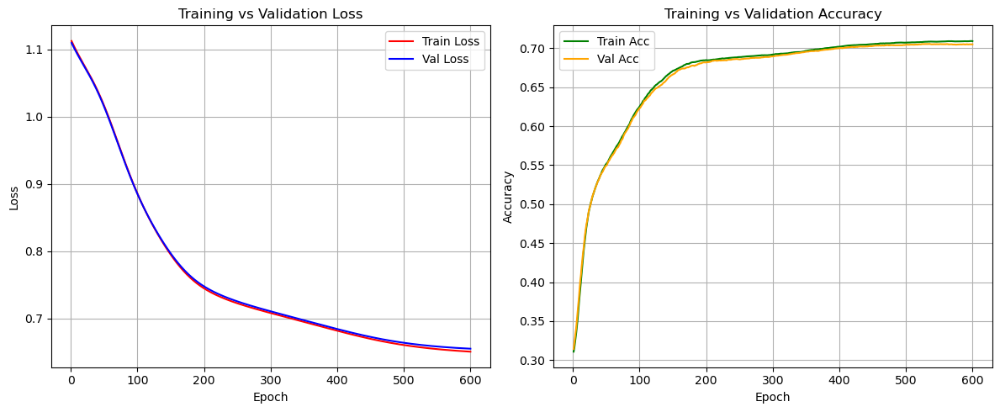

🔥 Overfitting percentage (Train vs Val): 0.58%

🔹 Training Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.70      0.80      0.75     28892
Pre-diabetes       0.81      0.55      0.66     28892
has_Diabetes       0.65      0.77      0.71     28892

    accuracy                           0.71     86676
   macro avg       0.72      0.71      0.71     86676
weighted avg       0.72      0.71      0.71     86676


🔹 Test Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.87      0.79      0.83     16632
Pre-diabetes       0.31      0.53      0.39      1605
has_Diabetes       0.74      0.77      0.75      8850

    accuracy                           0.77     27087
   macro avg       0.64      0.70      0.66     27087
weighted avg       0.79      0.77      0.78     27087



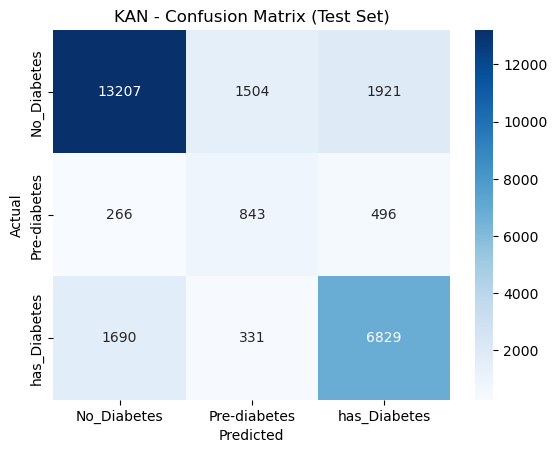

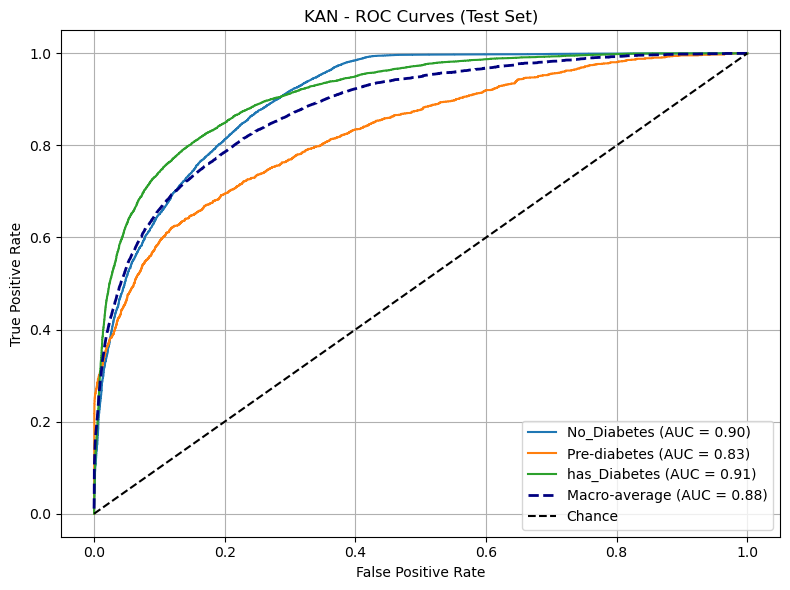

In [27]:
# ===================== Imports =====================
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder, label_binarize, StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
from sklearn.metrics import (classification_report, accuracy_score,
                             confusion_matrix, roc_curve, auc)
import matplotlib.pyplot as plt
import seaborn as sns
from kan import KAN

# ===================== Device =====================
device = torch.device("cuda" if torch.cuda.is_available()
                      else "mps" if torch.backends.mps.is_available()
                      else "cpu")
print(f"🔥 Using device: {device}")

# ===================== Prepare Data =====================
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Initial train-test split
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Balance training set
y_train_full = pd.Series(y_train_full, index=X_train_full.index)
class_counts = y_train_full.value_counts()
target_size = int(class_counts.mean())

X_train_balanced, y_train_balanced = [], []
for label in class_counts.index:
    X_class = X_train_full[y_train_full == label]
    y_class = y_train_full[y_train_full == label]
    if len(X_class) > target_size:
        X_res, y_res = resample(X_class, y_class,
                                replace=False, n_samples=target_size, random_state=42)
    else:
        X_res, y_res = resample(X_class, y_class,
                                replace=True, n_samples=target_size, random_state=42)
    X_train_balanced.append(X_res)
    y_train_balanced.append(y_res)

X_train_balanced = pd.concat(X_train_balanced)
y_train_balanced = pd.concat(y_train_balanced)

# Train-validation split
X_train, X_val, y_train, y_val = train_test_split(
    X_train_balanced, y_train_balanced, test_size=0.2, stratify=y_train_balanced, random_state=42
)

# Standardize features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Convert to tensors
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
X_val_tensor = torch.tensor(X_val_scaled, dtype=torch.float32).to(device)
y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)  # <-- fix here


# ===================== KAN Model =====================
input_size = X_train_tensor.shape[1]
hidden_size = 10
output_size = len(le.classes_)

kan = KAN(width=[input_size, hidden_size, output_size], grid=3, k=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(kan.parameters(), lr=0.001)



epochs = 600
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []

for epoch in range(epochs):
    # ======= Training =======
    kan.train()
    optimizer.zero_grad()
    outputs = kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

    # Training metrics
    _, train_preds = torch.max(outputs, 1)
    train_acc = (train_preds == y_train_tensor).float().mean().item()

    # ======= Validation =======
    kan.eval()
    with torch.no_grad():
        val_outputs = kan(X_val_tensor)
        val_loss = criterion(val_outputs, y_val_tensor).item()
        _, val_preds = torch.max(val_outputs, 1)
        val_acc = (val_preds == y_val_tensor).float().mean().item()

    # Store metrics
    train_losses.append(loss.item())
    val_losses.append(val_loss)
    train_accuracies.append(train_acc)
    val_accuracies.append(val_acc)

    if (epoch + 1) % 25 == 0:
        print(f"Epoch [{epoch+1}/{epochs}] | "
              f"Train Loss: {loss.item():.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

        
        
        plt.figure(figsize=(12,5))

# Loss
plt.subplot(1,2,1)
plt.plot(range(1, epochs+1), train_losses, label='Train Loss', color='red')
plt.plot(range(1, epochs+1), val_losses, label='Val Loss', color='blue')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# Accuracy
plt.subplot(1,2,2)
plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc', color='green')
plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc', color='orange')
plt.title("Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Overfitting percentage
overfit_pct = ((train_accuracies[-1] - val_accuracies[-1]) / train_accuracies[-1]) * 100
print(f"🔥 Overfitting percentage (Train vs Val): {overfit_pct:.2f}%")


# ===================== Evaluation =====================
kan.eval()

# ---- Training report ----
with torch.no_grad():
    train_outputs = kan(X_train_tensor)
    y_pred_train = torch.argmax(train_outputs, 1).cpu().numpy()

print("\n🔹 Training Classification Report:")
print(classification_report(y_train, y_pred_train, target_names=le.classes_))

# ---- Test report ----
with torch.no_grad():
    test_outputs = kan(X_test_tensor)
    y_pred_test = torch.argmax(test_outputs, 1).cpu().numpy()
    y_score_test = torch.softmax(test_outputs, dim=1).cpu().numpy()

print("\n🔹 Test Classification Report:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))


# Confusion matrix
cm = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
plt.title("KAN - Confusion Matrix (Test Set)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC curves
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]
fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_test[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Macro-average
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
macro_auc = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', label=f"Macro-average (AUC = {macro_auc:.2f})", linewidth=2)
plt.plot([0,1],[0,1],'k--', label='Chance')
plt.title("KAN - ROC Curves (Test Set)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid()
plt.tight_layout()
plt.show()


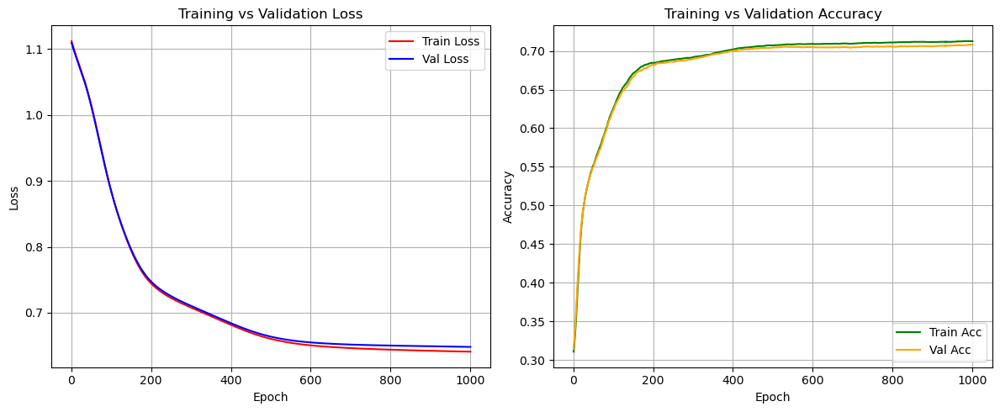

🔥 Overfitting percentage (Train vs Val): 0.65%


In [23]:
plt.figure(figsize=(12,5))

# Loss
plt.subplot(1,2,1)
plt.plot(range(1, epochs+1), train_losses, label='Train Loss', color='red')
plt.plot(range(1, epochs+1), val_losses, label='Val Loss', color='blue')
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

# Accuracy
plt.subplot(1,2,2)
plt.plot(range(1, epochs+1), train_accuracies, label='Train Acc', color='green')
plt.plot(range(1, epochs+1), val_accuracies, label='Val Acc', color='orange')
plt.title("Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Overfitting percentage
overfit_pct = ((train_accuracies[-1] - val_accuracies[-1]) / train_accuracies[-1]) * 100
print(f"🔥 Overfitting percentage (Train vs Val): {overfit_pct:.2f}%")




In [25]:
#############  With BALANCED classed Algorithm for KAN ##################
# ===================== Device =====================
device = torch.device("cuda" if torch.cuda.is_available()
                      else "mps" if torch.backends.mps.is_available()
                      else "cpu")
print(f"🔥 Using device: {device}")

# ===================== Prepare Data =====================
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Initial train-test split
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Balance training set
y_train_full = pd.Series(y_train_full, index=X_train_full.index)
class_counts = y_train_full.value_counts()
target_size = int(class_counts.mean())

X_train_balanced, y_train_balanced = [], []
for label in class_counts.index:
    X_class = X_train_full[y_train_full == label]
    y_class = y_train_full[y_train_full == label]
    if len(X_class) > target_size:
        X_res, y_res = resample(X_class, y_class,
                                replace=False, n_samples=target_size, random_state=42)
    else:
        X_res, y_res = resample(X_class, y_class,
                                replace=True, n_samples=target_size, random_state=42)
    X_train_balanced.append(X_res)
    y_train_balanced.append(y_res)

X_train_balanced = pd.concat(X_train_balanced)
y_train_balanced = pd.concat(y_train_balanced)


# ========== Cross-Validation ==========
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_train_acc, fold_val_acc = [], []
fold_reports, fold_losses = [], []

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_balanced, y_train_balanced), 1):
    print(f"\n📌 Fold {fold}/{n_splits}")

    # Split data
    X_tr, X_val = X_train_balanced.iloc[train_idx], X_train_balanced.iloc[val_idx]
    y_tr, y_val = y_train_balanced.iloc[train_idx], y_train_balanced.iloc[val_idx]

    # Scale
    scaler = StandardScaler()
    X_tr_scaled = scaler.fit_transform(X_tr)
    X_val_scaled = scaler.transform(X_val)

    # Tensors
    X_tr_tensor = torch.tensor(X_tr_scaled, dtype=torch.float32).to(device)
    y_tr_tensor = torch.tensor(y_tr.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val_scaled, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)

    # ===================== FIX: Define inside loop =====================
    input_size = X_tr_tensor.shape[1]
    hidden_size = 10
    output_size = len(le.classes_)

    # Model init for each fold
    kan = KAN(width=[input_size, hidden_size, output_size], grid=3, k=3).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(kan.parameters(), lr=0.001)
    # ================================================================

    # Train loop for this fold ...

    # Train loop
    epochs = 500
    for epoch in range(epochs):
        kan.train()
        optimizer.zero_grad()
        outputs = kan(X_tr_tensor)
        loss = criterion(outputs, y_tr_tensor)
        loss.backward()
        optimizer.step()

    # Evaluate fold
    kan.eval()
    with torch.no_grad():
        train_outputs = kan(X_tr_tensor)
        val_outputs = kan(X_val_tensor)

        train_preds = torch.argmax(train_outputs, 1).cpu().numpy()
        val_preds = torch.argmax(val_outputs, 1).cpu().numpy()

        train_acc = accuracy_score(y_tr, train_preds)
        val_acc = accuracy_score(y_val, val_preds)

        fold_train_acc.append(train_acc)
        fold_val_acc.append(val_acc)

        # Classification report for validation
        fold_reports.append(classification_report(y_val, val_preds, target_names=le.classes_, output_dict=True))

    print(f"✅ Fold {fold}: Train Acc={train_acc:.4f}, Val Acc={val_acc:.4f}")

# ========== Aggregate Results ==========
print("\n📊 Average CV Results:")
print(f"Train Accuracy: {np.mean(fold_train_acc):.4f} ± {np.std(fold_train_acc):.4f}")
print(f"Val Accuracy:   {np.mean(fold_val_acc):.4f} ± {np.std(fold_val_acc):.4f}")

# Average classification report
avg_report = {}
for label in le.classes_:
    precision = np.mean([r[label]['precision'] for r in fold_reports])
    recall = np.mean([r[label]['recall'] for r in fold_reports])
    f1 = np.mean([r[label]['f1-score'] for r in fold_reports])
    support = np.mean([r[label]['support'] for r in fold_reports])
    avg_report[label] = {"precision": precision, "recall": recall, "f1": f1, "support": support}

print("\n🔹 Average Classification Report across folds:")
for label, metrics in avg_report.items():
    print(f"{label}: Precision={metrics['precision']:.3f}, Recall={metrics['recall']:.3f}, F1={metrics['f1']:.3f}")

# ========== Final Training on Full Training Set ==========
print("\n🚀 Retraining on full training set and evaluating on test set...")

kan = KAN(width=[input_size, hidden_size, output_size], grid=3, k=3).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(kan.parameters(), lr=0.001)

X_train_scaled = scaler.fit_transform(X_train_balanced)
X_test_scaled = scaler.transform(X_test)

X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_balanced.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)


for epoch in range(epochs):
    kan.train()
    optimizer.zero_grad()
    outputs = kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

# Test evaluation
kan.eval()
with torch.no_grad():
    test_outputs = kan(X_test_tensor)
    y_pred_test = torch.argmax(test_outputs, 1).cpu().numpy()
    y_score_test = torch.softmax(test_outputs, dim=1).cpu().numpy()

print("\n🔹 Final Test Classification Report:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))


🔥 Using device: cuda

📌 Fold 1/5
checkpoint directory created: ./model
saving model version 0.0
✅ Fold 1: Train Acc=0.7068, Val Acc=0.7069

📌 Fold 2/5
checkpoint directory created: ./model
saving model version 0.0
✅ Fold 2: Train Acc=0.7072, Val Acc=0.7052

📌 Fold 3/5
checkpoint directory created: ./model
saving model version 0.0
✅ Fold 3: Train Acc=0.7069, Val Acc=0.7069

📌 Fold 4/5
checkpoint directory created: ./model
saving model version 0.0
✅ Fold 4: Train Acc=0.7082, Val Acc=0.7054

📌 Fold 5/5
checkpoint directory created: ./model
saving model version 0.0
✅ Fold 5: Train Acc=0.7066, Val Acc=0.7074

📊 Average CV Results:
Train Accuracy: 0.7071 ± 0.0005
Val Accuracy:   0.7063 ± 0.0009

🔹 Average Classification Report across folds:
No_Diabetes: Precision=0.702, Recall=0.797, F1=0.746
Pre-diabetes: Precision=0.817, Recall=0.544, F1=0.653
has_Diabetes: Precision=0.649, Recall=0.778, F1=0.708

🚀 Retraining on full training set and evaluating on test set...
checkpoint directory created:


===== Fold 1 =====
checkpoint directory created: ./model
saving model version 0.0

===== Fold 2 =====
checkpoint directory created: ./model
saving model version 0.0

===== Fold 3 =====
checkpoint directory created: ./model
saving model version 0.0

===== Fold 4 =====
checkpoint directory created: ./model
saving model version 0.0

===== Fold 5 =====
checkpoint directory created: ./model
saving model version 0.0

🔥 Retraining best model on full balanced set...
checkpoint directory created: ./model
saving model version 0.0

🔹 Training Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.70      0.80      0.75     36115
Pre-diabetes       0.81      0.55      0.66     36115
has_Diabetes       0.65      0.77      0.71     36115

    accuracy                           0.71    108345
   macro avg       0.72      0.71      0.71    108345
weighted avg       0.72      0.71      0.71    108345


🔹 Test Classification Report:
              precision   

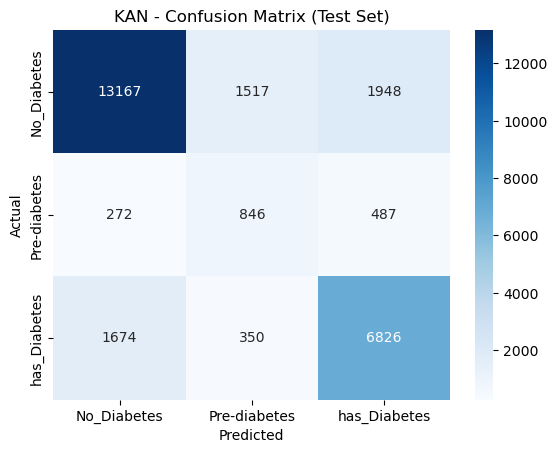

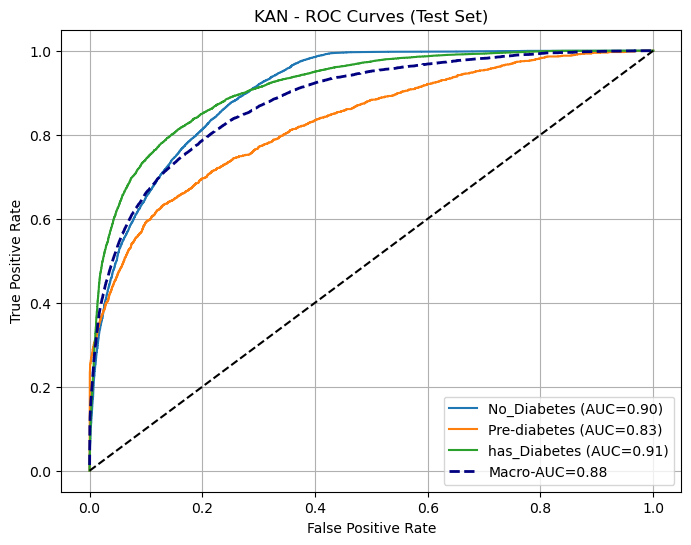

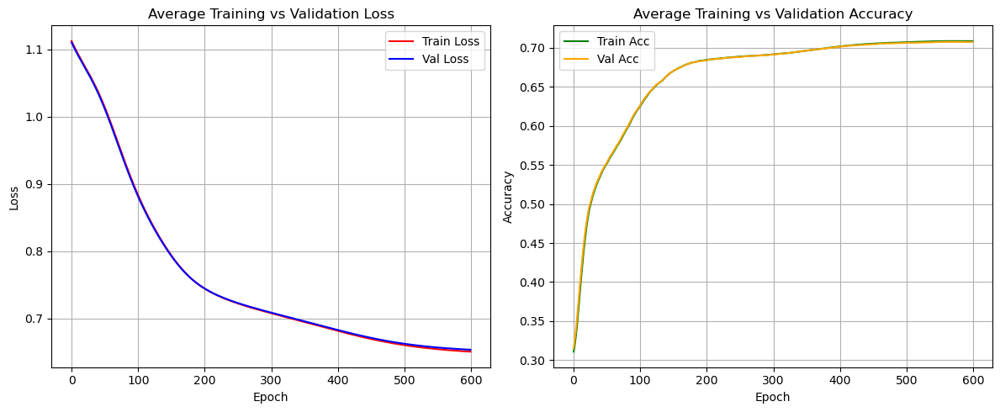

In [28]:
from sklearn.model_selection import StratifiedKFold
from imblearn.over_sampling import SMOTE
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize

# ================== Cross Validation Setup ==================
skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold_train_losses, fold_val_losses = [], []
fold_train_accs, fold_val_accs = [], []

best_val_loss = np.inf
best_model_state = None

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train_balanced, y_train_balanced), 1):
    print(f"\n===== Fold {fold} =====")
    
    # Train/val split from CV
    X_tr, X_val = X_train_balanced.iloc[train_idx], X_train_balanced.iloc[val_idx]
    y_tr, y_val = y_train_balanced.iloc[train_idx], y_train_balanced.iloc[val_idx]
    
    # Apply SMOTE
    sm = SMOTE(random_state=42)
    X_tr, y_tr = sm.fit_resample(X_tr, y_tr)

    # Standardize
    scaler = StandardScaler()
    X_tr = scaler.fit_transform(X_tr)
    X_val = scaler.transform(X_val)
    
    # To tensors
    X_tr_tensor = torch.tensor(X_tr, dtype=torch.float32).to(device)
    y_tr_tensor = torch.tensor(y_tr.values, dtype=torch.long).to(device)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
    y_val_tensor = torch.tensor(y_val.values, dtype=torch.long).to(device)

    # Model
    input_size = X_tr_tensor.shape[1]
    hidden_size = 10
    output_size = len(le.classes_)
    kan = KAN(width=[input_size, hidden_size, output_size], grid=3, k=3).to(device)
    
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(kan.parameters(), lr=0.001)
    
    epochs = 600
    train_losses, val_losses = [], []
    train_accs, val_accs = [], []

    # ===== Training loop =====
    for epoch in range(epochs):
        kan.train()
        optimizer.zero_grad()
        outputs = kan(X_tr_tensor)
        loss = criterion(outputs, y_tr_tensor)
        loss.backward()
        optimizer.step()

        # Training metrics
        _, train_preds = torch.max(outputs, 1)
        train_acc = (train_preds == y_tr_tensor).float().mean().item()

        # Validation
        kan.eval()
        with torch.no_grad():
            val_outputs = kan(X_val_tensor)
            val_loss = criterion(val_outputs, y_val_tensor).item()
            _, val_preds = torch.max(val_outputs, 1)
            val_acc = (val_preds == y_val_tensor).float().mean().item()

        train_losses.append(loss.item())
        val_losses.append(val_loss)
        train_accs.append(train_acc)
        val_accs.append(val_acc)

    # Save fold metrics
    fold_train_losses.append(train_losses)
    fold_val_losses.append(val_losses)
    fold_train_accs.append(train_accs)
    fold_val_accs.append(val_accs)

    # Track best model (lowest final val loss)
    if val_losses[-1] < best_val_loss:
        best_val_loss = val_losses[-1]
        best_model_state = kan.state_dict()
        best_scaler = scaler

# ================== Retrain best model on full training set ==================
print("\n🔥 Retraining best model on full balanced set...")
X_train_final, y_train_final = SMOTE(random_state=42).fit_resample(X_train_balanced, y_train_balanced)
X_train_final = best_scaler.fit_transform(X_train_final)
X_test_final = best_scaler.transform(X_test)

X_train_tensor = torch.tensor(X_train_final, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_final.values, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test_final, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

kan = KAN(width=[X_train_tensor.shape[1], 10, len(le.classes_)], grid=3, k=3).to(device)
kan.load_state_dict(best_model_state)
kan.eval()

# Predict on train & test
with torch.no_grad():
    train_outputs = kan(X_train_tensor)
    y_pred_train = torch.argmax(train_outputs, 1).cpu().numpy()
    
    test_outputs = kan(X_test_tensor)
    y_pred_test = torch.argmax(test_outputs, 1).cpu().numpy()
    y_score_test = torch.softmax(test_outputs, dim=1).cpu().numpy()

# ================== Reports ==================
print("\n🔹 Training Classification Report:")
print(classification_report(y_train_final, y_pred_train, target_names=le.classes_))

print("\n🔹 Test Classification Report:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_test)
sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
plt.title("KAN - Confusion Matrix (Test Set)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

# ROC Curves
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]
fpr, tpr, roc_auc = {}, {}, {}
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score_test[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= n_classes
macro_auc = auc(all_fpr, mean_tpr)

plt.figure(figsize=(8,6))
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC={roc_auc[i]:.2f})")
plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--', label=f"Macro-AUC={macro_auc:.2f}", linewidth=2)
plt.plot([0,1],[0,1],'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("KAN - ROC Curves (Test Set)")
plt.legend(loc="lower right")
plt.grid()
plt.show()

# ================== Average CV Plots ==================
avg_train_losses = np.mean(fold_train_losses, axis=0)
avg_val_losses = np.mean(fold_val_losses, axis=0)
avg_train_accs = np.mean(fold_train_accs, axis=0)
avg_val_accs = np.mean(fold_val_accs, axis=0)

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(avg_train_losses, label="Train Loss", color="red")
plt.plot(avg_val_losses, label="Val Loss", color="blue")
plt.title("Average Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True)

plt.subplot(1,2,2)
plt.plot(avg_train_accs, label="Train Acc", color="green")
plt.plot(avg_val_accs, label="Val Acc", color="orange")
plt.title("Average Training vs Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()


# 6.2.h  Neural Networks model


Using device: cuda
Fold 1: Val Accuracy=0.8250, Loss=0.4601, Time=653.68s
Fold 2: Val Accuracy=0.8308, Loss=0.4524, Time=643.97s
Fold 3: Val Accuracy=0.8252, Loss=0.4589, Time=653.21s
Fold 4: Val Accuracy=0.8242, Loss=0.4560, Time=656.44s
Fold 5: Val Accuracy=0.8298, Loss=0.4606, Time=773.30s

Test Accuracy: 0.8261
              precision    recall  f1-score   support

           0       0.83      0.94      0.88     16632
           1       0.91      0.24      0.38      1605
           2       0.81      0.72      0.76      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.63      0.68     27087
weighted avg       0.83      0.83      0.81     27087



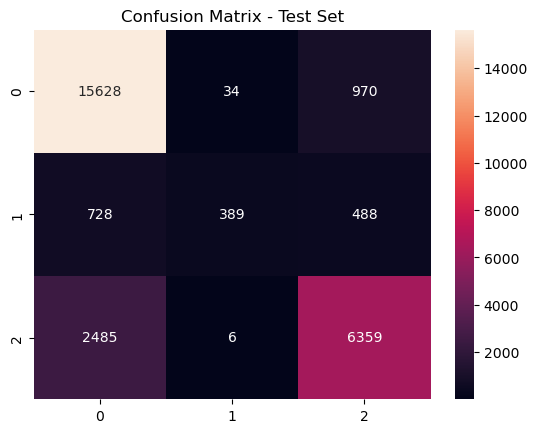

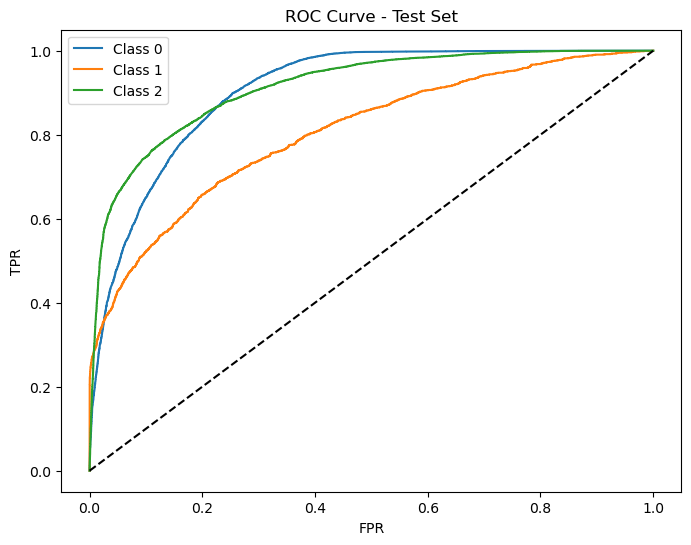

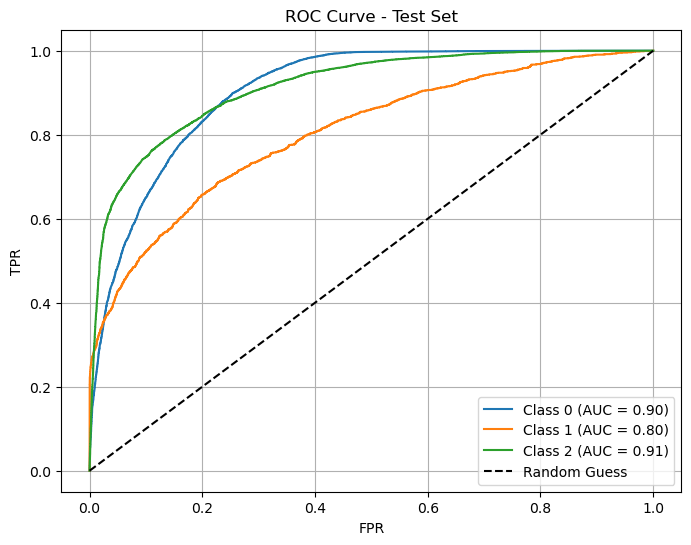

In [29]:

# -----------------------
# Device (GPU if available)
# -----------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# -----------------------
# Prepare data
# -----------------------
X = diabetes1.drop(columns=['Diabetes'], errors='ignore').values.astype(np.float32)
y = LabelEncoder().fit_transform(diabetes1['Diabetes'])

scaler = StandardScaler()
X = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

X_train = torch.tensor(X_train).to(device)
#y_train = torch.tensor(y_train).to(device)
X_test = torch.tensor(X_test).to(device)
#y_test = torch.tensor(y_test).to(device)


# Convert to long tensor for CrossEntropyLoss
y_train = torch.tensor(y_train, dtype=torch.long).to(device)
y_test = torch.tensor(y_test, dtype=torch.long).to(device)


n_classes = len(np.unique(y))
input_dim = X_train.shape[1]

# -----------------------
# PyTorch model
# -----------------------
class MultiClassNN(nn.Module):
    def __init__(self, input_dim, n_classes):
        super(MultiClassNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(128, n_classes)
    
    def forward(self, x):
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        return x  # logits

# -----------------------
# Stratified K-Fold CV
# -----------------------
n_splits = 5
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

fold_acc = []
fold_loss = []
fold_times = []

best_fold_acc = 0
best_model_state = None

for fold, (train_idx, val_idx) in enumerate(skf.split(X_train.cpu().numpy(), y_train.cpu().numpy()), 1):
    X_tr, X_val = X_train[train_idx], X_train[val_idx]
    y_tr, y_val = y_train[train_idx], y_train[val_idx]

    train_dataset = TensorDataset(X_tr, y_tr)
    val_dataset = TensorDataset(X_val, y_val)

    train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=128)

    model = MultiClassNN(input_dim, n_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    epochs = 500
    start_time = time.time()

    for epoch in range(epochs):
        model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            logits = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

    exec_time = time.time() - start_time

    # Validation
    model.eval()
    with torch.no_grad():
        logits_val = model(X_val)
        val_loss = criterion(logits_val, y_val).item()
        y_val_pred = torch.argmax(logits_val, dim=1)
        val_acc = (y_val_pred == y_val).float().mean().item()

    fold_acc.append(val_acc)
    fold_loss.append(val_loss)
    fold_times.append(exec_time)

    print(f"Fold {fold}: Val Accuracy={val_acc:.4f}, Loss={val_loss:.4f}, Time={exec_time:.2f}s")

    if val_acc > best_fold_acc:
        best_fold_acc = val_acc
        best_model_state = model.state_dict()

# -----------------------
# Retrain on full training set
# -----------------------
full_dataset = TensorDataset(X_train, y_train)
full_loader = DataLoader(full_dataset, batch_size=128, shuffle=True)

final_model = MultiClassNN(input_dim, n_classes).to(device)
final_model.load_state_dict(best_model_state)  # Initialize from best fold
optimizer = optim.Adam(final_model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()

# Optional: train a few more epochs on full set
for epoch in range(20):
    final_model.train()
    for xb, yb in full_loader:
        optimizer.zero_grad()
        logits = final_model(xb)
        loss = criterion(logits, yb)
        loss.backward()
        optimizer.step()

# -----------------------
# Test evaluation
# -----------------------
final_model.eval()
with torch.no_grad():
    logits_test = final_model(X_test)
    y_test_pred = torch.argmax(logits_test, dim=1)
    y_test_proba = torch.softmax(logits_test, dim=1).cpu().numpy()

print(f"\nTest Accuracy: {(y_test_pred==y_test).float().mean().item():.4f}")
print(classification_report(y_test.cpu().numpy(), y_test_pred.cpu().numpy()))

# Confusion matrix
cm = confusion_matrix(y_test.cpu().numpy(), y_test_pred.cpu().numpy())
sns.heatmap(cm, annot=True, fmt='d', xticklabels=np.unique(y), yticklabels=np.unique(y))
plt.title("Confusion Matrix - Test Set")
plt.show()

# ROC Curve
y_test_bin = label_binarize(y_test.cpu().numpy(), classes=np.arange(n_classes))
plt.figure(figsize=(8,6))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_proba[:, i])
    plt.plot(fpr, tpr, label=f"Class {i}")
plt.plot([0,1],[0,1],'k--')
plt.title("ROC Curve - Test Set")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.legend()
plt.show()


# ROC Curve with AUC
y_test_bin = label_binarize(y_test.cpu().numpy(), classes=np.arange(n_classes))
plt.figure(figsize=(8,6))

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_test_proba[:, i])
    auc_val = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Class {i} (AUC = {auc_val:.2f})")

plt.plot([0,1],[0,1],'k--', label='Random Guess')
plt.title("ROC Curve - Test Set")
plt.xlabel("FPR")
plt.ylabel("TPR")
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


# 7. HYBRID Models

### 7.1.  KAN + CatBoost models

In [30]:
# ==================== Imports ====================


# ==================== Load Data ====================
diabetes1 = pd.read_csv("diabetes1.csv")

# Features & Target
X = diabetes1.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Balance with SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Scale
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_test = scaler.transform(X_test)

# Binarize labels for ROC
classes = np.unique(y_encoded)
y_test_bin = label_binarize(y_test, classes=classes)

# ==================== PyTorch KAN ====================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

# Simple KAN-like network (MLP with bottleneck hidden layer)
class KAN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(KAN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        h = torch.relu(self.fc1(x))
        out = self.fc2(h)
        return out
    
    # Extract hidden features (for CatBoost input)
    def hidden_forward(self, x):
        return torch.relu(self.fc1(x))

input_dim = X_train_res.shape[1]
hidden_dim = 16
output_dim = len(classes)

kan = KAN(input_dim, hidden_dim, output_dim).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(kan.parameters(), lr=0.001)

X_train_tensor = torch.tensor(X_train_res, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_res, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

# Train KAN
epochs = 1000
for epoch in range(epochs):
    kan.train()
    optimizer.zero_grad()
    outputs = kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

    if (epoch+1) % 50 == 0:
        _, preds = torch.max(outputs, 1)
        acc = (preds == y_train_tensor).float().mean().item()
        print(f"Epoch {epoch+1}/{epochs} - Loss: {loss.item():.4f} - Train Acc: {acc:.4f}")

# ==================== Step 2: Extract Features ====================
kan.eval()
with torch.no_grad():
    hidden_train = kan.hidden_forward(X_train_tensor).cpu().numpy()
    hidden_test = kan.hidden_forward(X_test_tensor).cpu().numpy()

# ==================== Step 3: Train CatBoost on KAN Features ====================
cat = CatBoostClassifier(iterations=200, depth=6, learning_rate=0.1, verbose=0)
cat.fit(hidden_train, y_train_res)

y_pred_cat = cat.predict(hidden_test)
y_proba_cat = cat.predict_proba(hidden_test)

print("\n=== CatBoost (on KAN features) ===")
print(classification_report(y_test, y_pred_cat, target_names=le.classes_))

# ==================== Step 4: Evaluate KAN ====================
kan.eval()
with torch.no_grad():
    outputs_test = kan(X_test_tensor)
    y_proba_kan = torch.softmax(outputs_test, dim=1).cpu().numpy()
    y_pred_kan = np.argmax(y_proba_kan, axis=1)

print("\n=== KAN (direct) ===")
print(classification_report(y_test, y_pred_kan, target_names=le.classes_))

# ==================== Step 5: Hybrid Ensemble ====================
hybrid_probs = (y_proba_kan + y_proba_cat) / 2
hybrid_preds = np.argmax(hybrid_probs, axis=1)

print("\n=== Hybrid KAN + CatBoost ===")
print(classification_report(y_test, hybrid_preds, target_names=le.classes_))

# ==================== ROC AUC for All ====================
print("\nROC AUC Scores:")

kan_auc = roc_auc_score(y_test_bin, y_proba_kan, average="macro", multi_class="ovr")
cat_auc = roc_auc_score(y_test_bin, y_proba_cat, average="macro", multi_class="ovr")
hybrid_auc = roc_auc_score(y_test_bin, hybrid_probs, average="macro", multi_class="ovr")

print(f"KAN Macro AUC: {kan_auc:.4f}")
print(f"CatBoost (on KAN features) Macro AUC: {cat_auc:.4f}")
print(f"Hybrid KAN+CatBoost Macro AUC: {hybrid_auc:.4f}")


Using device: cuda
Epoch 50/1000 - Loss: 0.9229 - Train Acc: 0.5984
Epoch 100/1000 - Loss: 0.8280 - Train Acc: 0.6440
Epoch 150/1000 - Loss: 0.7757 - Train Acc: 0.6716
Epoch 200/1000 - Loss: 0.7408 - Train Acc: 0.6908
Epoch 250/1000 - Loss: 0.7195 - Train Acc: 0.6985
Epoch 300/1000 - Loss: 0.7070 - Train Acc: 0.7019
Epoch 350/1000 - Loss: 0.6992 - Train Acc: 0.7036
Epoch 400/1000 - Loss: 0.6934 - Train Acc: 0.7047
Epoch 450/1000 - Loss: 0.6888 - Train Acc: 0.7056
Epoch 500/1000 - Loss: 0.6849 - Train Acc: 0.7064
Epoch 550/1000 - Loss: 0.6815 - Train Acc: 0.7071
Epoch 600/1000 - Loss: 0.6783 - Train Acc: 0.7078
Epoch 650/1000 - Loss: 0.6754 - Train Acc: 0.7082
Epoch 700/1000 - Loss: 0.6727 - Train Acc: 0.7094
Epoch 750/1000 - Loss: 0.6701 - Train Acc: 0.7103
Epoch 800/1000 - Loss: 0.6675 - Train Acc: 0.7112
Epoch 850/1000 - Loss: 0.6651 - Train Acc: 0.7119
Epoch 900/1000 - Loss: 0.6630 - Train Acc: 0.7126
Epoch 950/1000 - Loss: 0.6611 - Train Acc: 0.7132
Epoch 1000/1000 - Loss: 0.6592 -

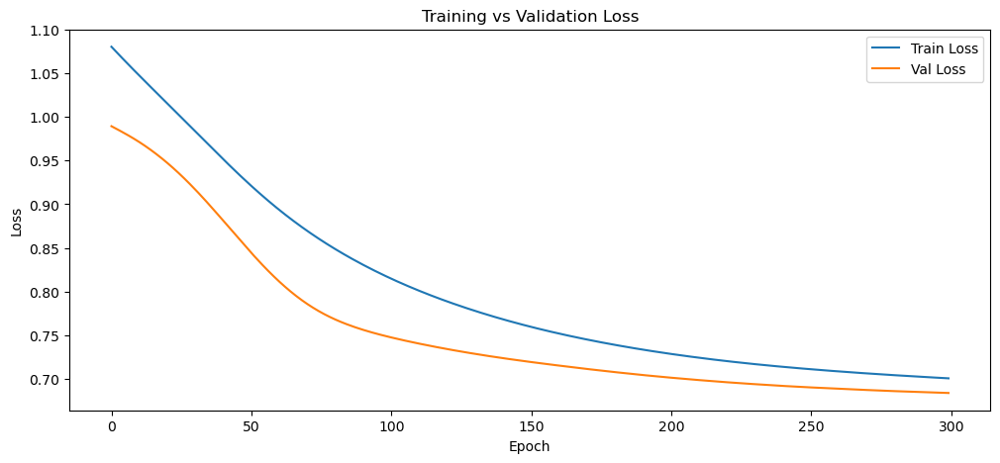

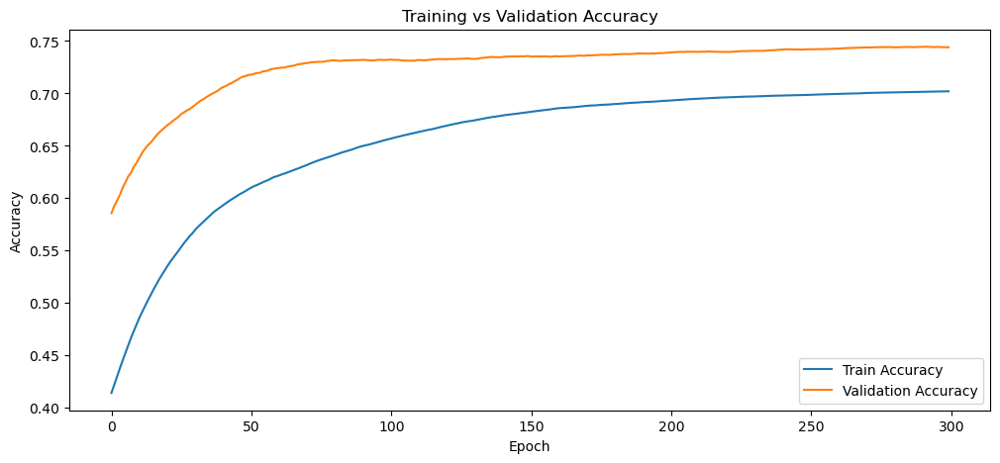


Overfitting Gap (final epoch): -4.20%


In [31]:
# ==================== Step 7: Plots ====================

# Plot Loss
plt.figure(figsize=(12,5))
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()

# Plot Accuracy
plt.figure(figsize=(12,5))
plt.plot(history["train_acc"], label="Train Accuracy")
plt.plot(history["val_acc"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.show()

# Overfitting percentage (gap at final epoch)
final_gap = (history["train_acc"][-1] - history["val_acc"][-1]) * 100
print(f"\nOverfitting Gap (final epoch): {final_gap:.2f}%")


Using device: cuda
Epoch 50/300 | Train Loss: 0.9238, Train Acc: 0.6087 | Val Loss: 0.8477, Val Acc: 0.7178
Epoch 100/300 | Train Loss: 0.8161, Train Acc: 0.6564 | Val Loss: 0.7480, Val Acc: 0.7322
Epoch 150/300 | Train Loss: 0.7601, Train Acc: 0.6822 | Val Loss: 0.7195, Val Acc: 0.7357
Epoch 200/300 | Train Loss: 0.7288, Train Acc: 0.6931 | Val Loss: 0.7014, Val Acc: 0.7389
Epoch 250/300 | Train Loss: 0.7111, Train Acc: 0.6986 | Val Loss: 0.6901, Val Acc: 0.7422
Epoch 300/300 | Train Loss: 0.7004, Train Acc: 0.7020 | Val Loss: 0.6836, Val Acc: 0.7441

=== CatBoost (on KAN features) ===
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.74      0.79     16632
Pre-diabetes       0.29      0.52      0.37      1605
has_Diabetes       0.69      0.78      0.73      8856

    accuracy                           0.74     27093
   macro avg       0.61      0.68      0.63     27093
weighted avg       0.77      0.74      0.75     27093


=== KAN (direct) ===
   

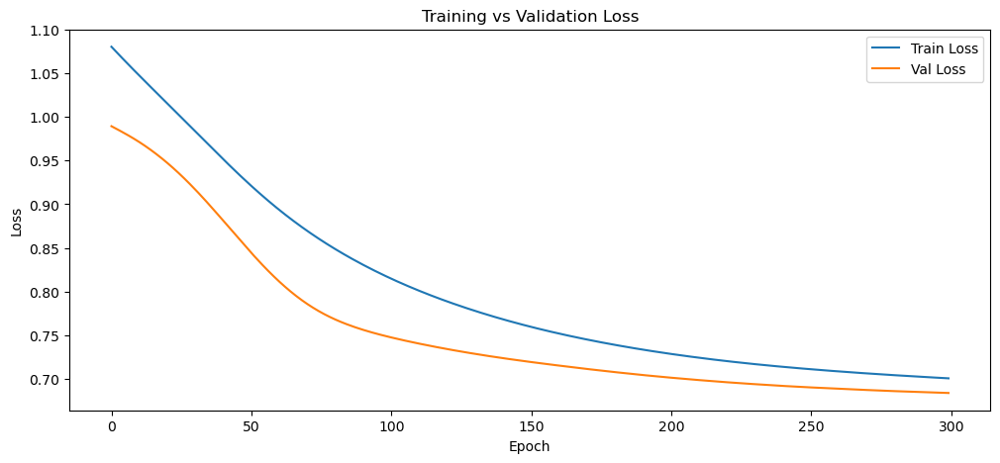

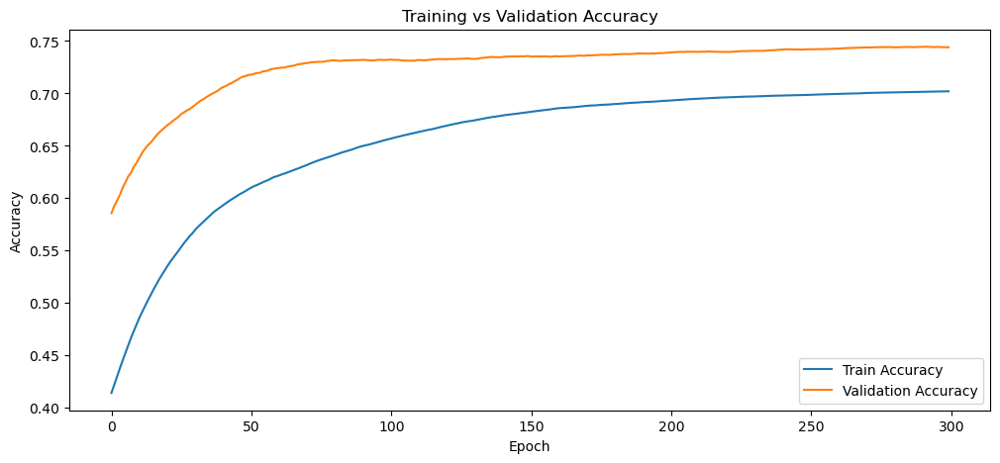


Overfitting Gap (final epoch): -4.20%


In [29]:
# ==================== HYBRID KAN+CatBoost ====================

# ==================== Load Data ====================
diabetes1 = pd.read_csv("diabetes1.csv")

# Features & Target
X = diabetes1.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Train/Val/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.2, stratify=y_train, random_state=42
)

# Balance with SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Scale
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

# Binarize labels for ROC
classes = np.unique(y_encoded)
y_test_bin = label_binarize(y_test, classes=classes)

# ==================== PyTorch KAN ====================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

class KAN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(KAN, self).__init__()
        self.fc1 = nn.Linear(input_dim, hidden_dim)
        self.fc2 = nn.Linear(hidden_dim, output_dim)

    def forward(self, x):
        h = torch.relu(self.fc1(x))
        return self.fc2(h)
    
    def hidden_forward(self, x):
        return torch.relu(self.fc1(x))

input_dim = X_train_res.shape[1]
hidden_dim = 16
output_dim = len(classes)

kan = KAN(input_dim, hidden_dim, output_dim).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(kan.parameters(), lr=0.001)

# Convert to tensors
X_train_tensor = torch.tensor(X_train_res, dtype=torch.float32).to(device)
y_train_tensor = torch.tensor(y_train_res, dtype=torch.long).to(device)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
y_val_tensor = torch.tensor(y_val, dtype=torch.long).to(device)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32).to(device)
y_test_tensor = torch.tensor(y_test, dtype=torch.long).to(device)

# ==================== Training Loop with Logging ====================
epochs = 300
history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

for epoch in range(epochs):
    kan.train()
    optimizer.zero_grad()
    outputs = kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()

    # Train metrics
    _, train_preds = torch.max(outputs, 1)
    train_acc = (train_preds == y_train_tensor).float().mean().item()

    # Validation metrics
    kan.eval()
    with torch.no_grad():
        val_outputs = kan(X_val_tensor)
        val_loss = criterion(val_outputs, y_val_tensor).item()
        _, val_preds = torch.max(val_outputs, 1)
        val_acc = (val_preds == y_val_tensor).float().mean().item()

    # Store history
    history["train_loss"].append(loss.item())
    history["val_loss"].append(val_loss)
    history["train_acc"].append(train_acc)
    history["val_acc"].append(val_acc)

    if (epoch+1) % 50 == 0:
        print(f"Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {loss.item():.4f}, Train Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

# ==================== Step 2: Extract Features ====================
kan.eval()
with torch.no_grad():
    hidden_train = kan.hidden_forward(X_train_tensor).cpu().numpy()
    hidden_test = kan.hidden_forward(X_test_tensor).cpu().numpy()

# ==================== Step 3: Train CatBoost on KAN Features ====================
cat = CatBoostClassifier(iterations=200, depth=6, learning_rate=0.1, verbose=0)
cat.fit(hidden_train, y_train_res)

y_pred_cat = cat.predict(hidden_test)
y_proba_cat = cat.predict_proba(hidden_test)

print("\n=== CatBoost (on KAN features) ===")
print(classification_report(y_test, y_pred_cat, target_names=le.classes_))

# ==================== Step 4: Evaluate KAN ====================
kan.eval()
with torch.no_grad():
    outputs_test = kan(X_test_tensor)
    y_proba_kan = torch.softmax(outputs_test, dim=1).cpu().numpy()
    y_pred_kan = np.argmax(y_proba_kan, axis=1)

print("\n=== KAN (direct) ===")
print(classification_report(y_test, y_pred_kan, target_names=le.classes_))

# ==================== Step 5: Hybrid Ensemble ====================
hybrid_probs = (y_proba_kan + y_proba_cat) / 2
hybrid_preds = np.argmax(hybrid_probs, axis=1)

print("\n=== Hybrid KAN + CatBoost ===")
print(classification_report(y_test, hybrid_preds, target_names=le.classes_))

# ==================== Step 6: ROC AUC ====================
kan_auc = roc_auc_score(y_test_bin, y_proba_kan, average="macro", multi_class="ovr")
cat_auc = roc_auc_score(y_test_bin, y_proba_cat, average="macro", multi_class="ovr")
hybrid_auc = roc_auc_score(y_test_bin, hybrid_probs, average="macro", multi_class="ovr")

print("\nROC AUC Scores:")
print(f"KAN Macro AUC: {kan_auc:.4f}")
print(f"CatBoost (on KAN features) Macro AUC: {cat_auc:.4f}")
print(f"Hybrid KAN+CatBoost Macro AUC: {hybrid_auc:.4f}")

# ==================== Step 7: Plots ====================

# Plot Loss
plt.figure(figsize=(12,5))
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()

# Plot Accuracy
plt.figure(figsize=(12,5))
plt.plot(history["train_acc"], label="Train Accuracy")
plt.plot(history["val_acc"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.show()

# Overfitting percentage (gap at final epoch)
final_gap = (history["train_acc"][-1] - history["val_acc"][-1]) * 100
print(f"\nOverfitting Gap (final epoch): {final_gap:.2f}%")


### 7.2. Hybrid CatBoost + NN

In [23]:
# -----------------------
# Feature matrix and target
# -----------------------
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)
y_train = pd.Series(y_train, index=X_train.index)
y_test = pd.Series(y_test, index=X_test.index)


#### A) no Oversampling Catb and NN


📌 Running Model: CatBoost | Oversampling: False | 5-Fold CV
Fold 1: Val Accuracy=0.8328, Log Loss=0.4380, Time=9.62s
Fold 2: Val Accuracy=0.8350, Log Loss=0.4308, Time=8.65s
Fold 3: Val Accuracy=0.8315, Log Loss=0.4388, Time=8.94s
Fold 4: Val Accuracy=0.8351, Log Loss=0.4277, Time=8.57s
Fold 5: Val Accuracy=0.8310, Log Loss=0.4405, Time=9.07s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8331 ± 0.0017
Log Loss: 0.4351 ± 0.0050


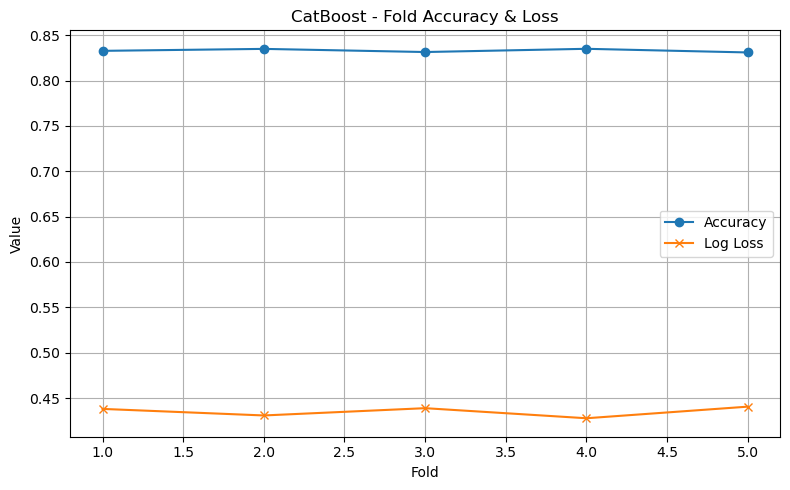

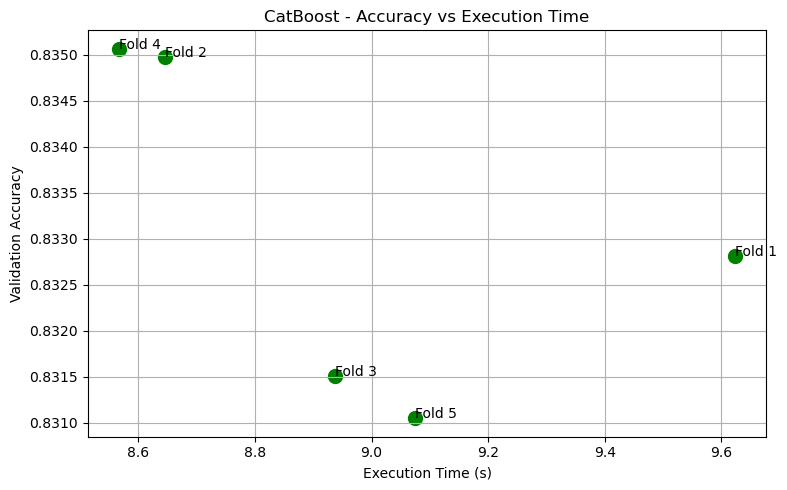


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8504
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.96      0.90     66525
Pre-diabetes       0.96      0.32      0.48      6420
has_Diabetes       0.86      0.74      0.79     35401

    accuracy                           0.85    108346
   macro avg       0.89      0.67      0.72    108346
weighted avg       0.86      0.85      0.84    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8319
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.88      0.26      0.40      1605
has_Diabetes       0.83      0.72      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.64      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


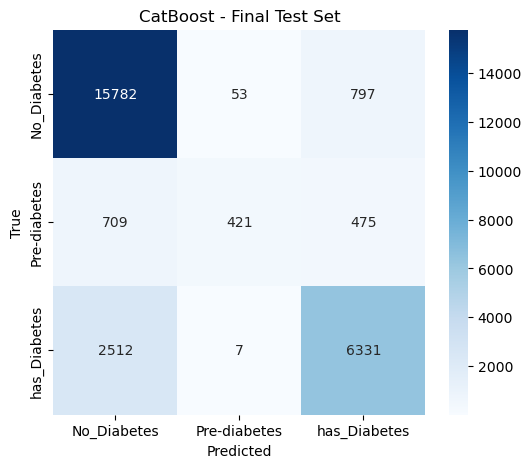


📈 Test Set ROC Curve:


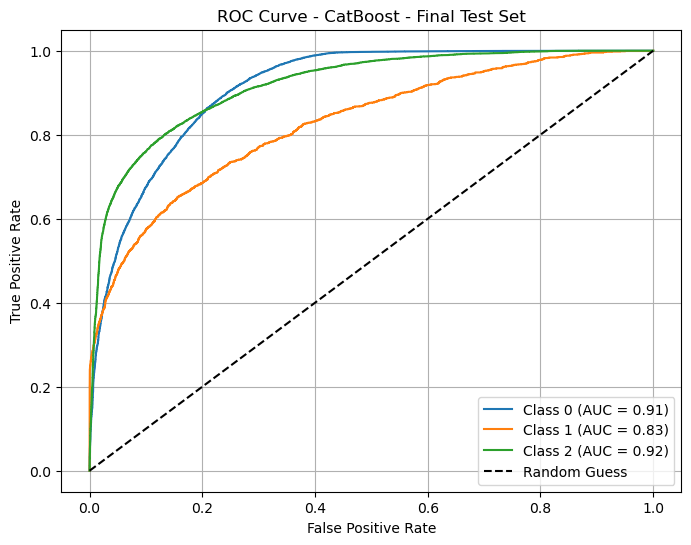


📌 Running Model: NeuralNet | Oversampling: False | 5-Fold CV
Fold 1: Val Accuracy=0.8168, Log Loss=0.5522, Time=171.65s
Fold 2: Val Accuracy=0.8196, Log Loss=0.5312, Time=183.36s
Fold 3: Val Accuracy=0.8150, Log Loss=0.5383, Time=175.29s
Fold 4: Val Accuracy=0.8176, Log Loss=0.5148, Time=163.14s
Fold 5: Val Accuracy=0.8175, Log Loss=0.5275, Time=149.43s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8173 ± 0.0015
Log Loss: 0.5328 ± 0.0123


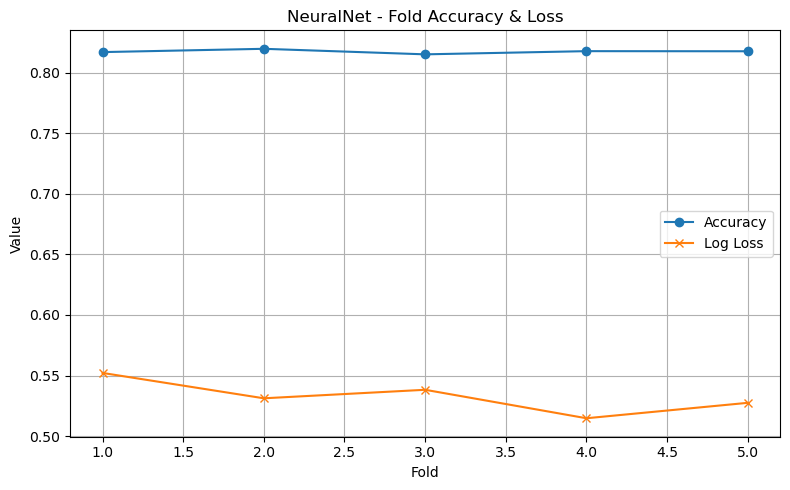

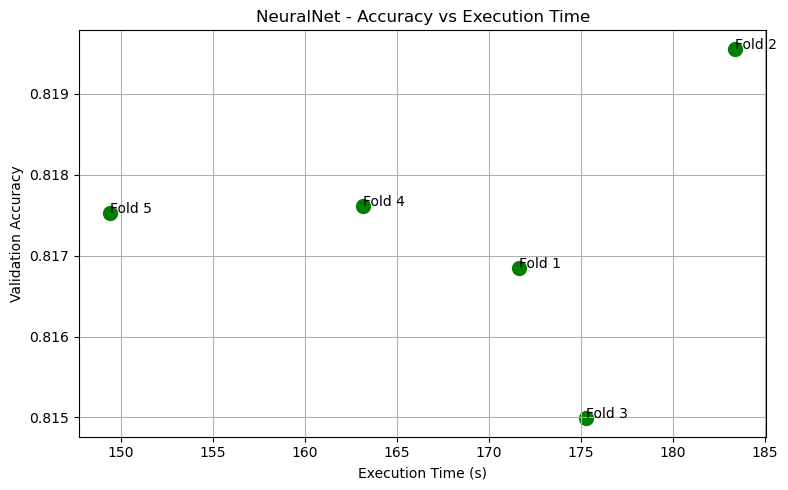


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8563
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.96      0.90     66525
Pre-diabetes       0.87      0.40      0.55      6420
has_Diabetes       0.87      0.75      0.80     35401

    accuracy                           0.86    108346
   macro avg       0.86      0.70      0.75    108346
weighted avg       0.86      0.86      0.85    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8187
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.93      0.88     16632
Pre-diabetes       0.62      0.29      0.39      1605
has_Diabetes       0.82      0.70      0.75      8850

    accuracy                           0.82     27087
   macro avg       0.76      0.64      0.67     27087
weighted avg       0.81      0.82      0.81     27087


🧾 Test Set Confusion Matrix:


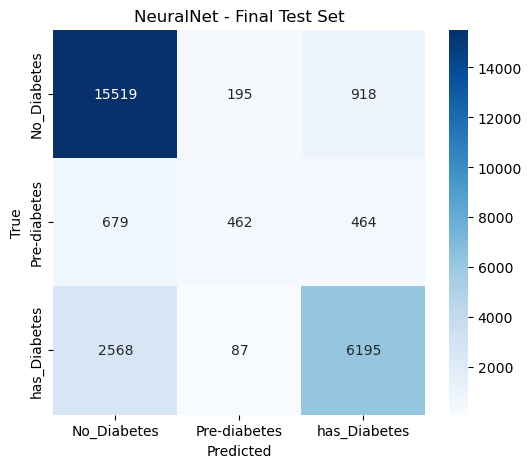


📈 Test Set ROC Curve:


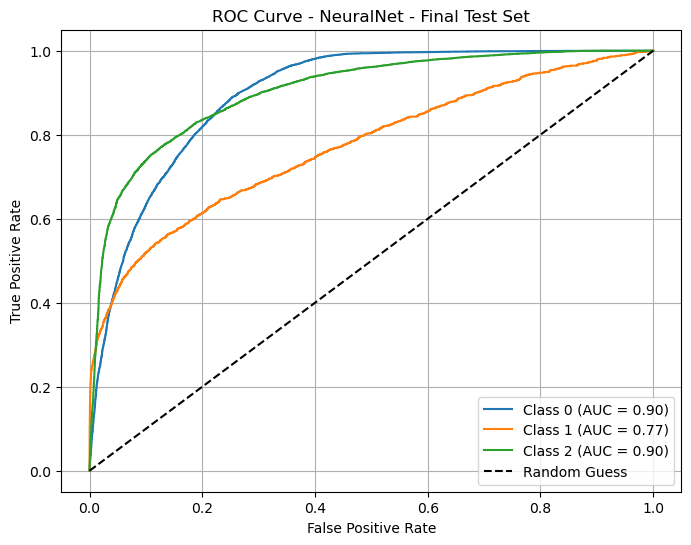


📌 Running Model: CatBoost+NN | Oversampling: False | 5-Fold CV
Fold 1: Val Accuracy=0.8278, Log Loss=0.4506, Time=179.98s
Fold 2: Val Accuracy=0.8305, Log Loss=0.4439, Time=190.28s
Fold 3: Val Accuracy=0.8256, Log Loss=0.4521, Time=173.57s
Fold 4: Val Accuracy=0.8309, Log Loss=0.4410, Time=173.18s
Fold 5: Val Accuracy=0.8292, Log Loss=0.4521, Time=155.56s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8288 ± 0.0019
Log Loss: 0.4480 ± 0.0046


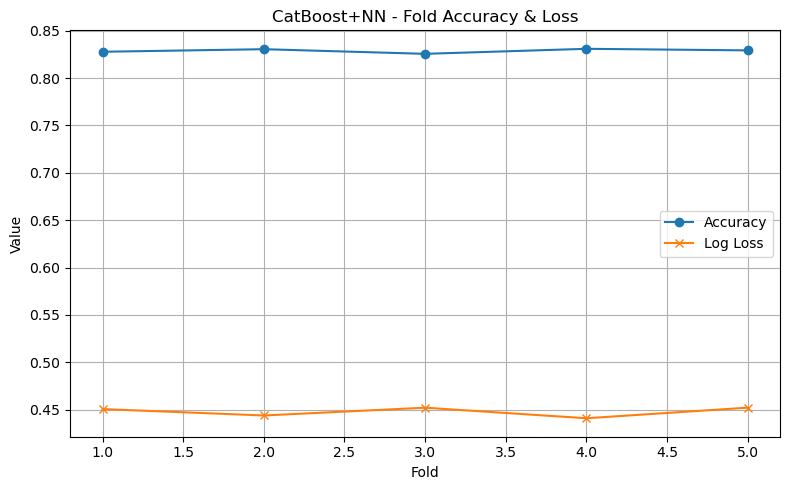

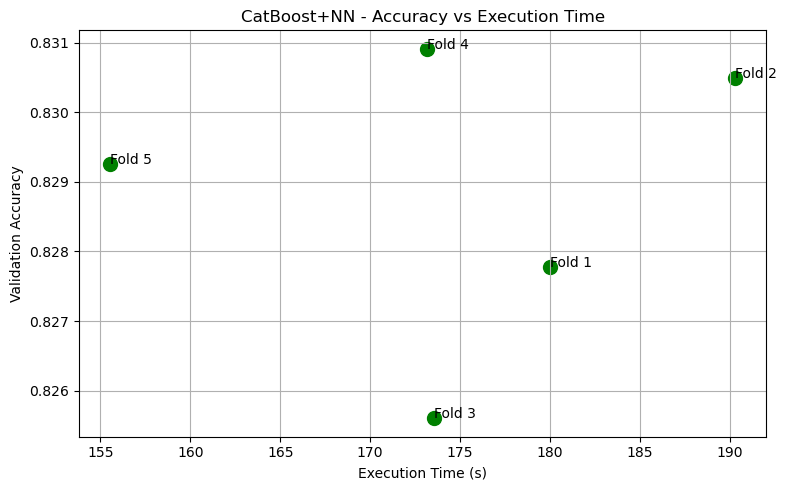


🔹 Final Model Metrics on Training Set:
Accuracy: 0.8569
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.96      0.90     66525
Pre-diabetes       0.95      0.36      0.52      6420
has_Diabetes       0.87      0.74      0.80     35401

    accuracy                           0.86    108346
   macro avg       0.89      0.69      0.74    108346
weighted avg       0.86      0.86      0.85    108346


🔹 Final Model Metrics on Test Set:
Accuracy: 0.8289
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.88     16632
Pre-diabetes       0.78      0.27      0.40      1605
has_Diabetes       0.83      0.71      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.81      0.64      0.68     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


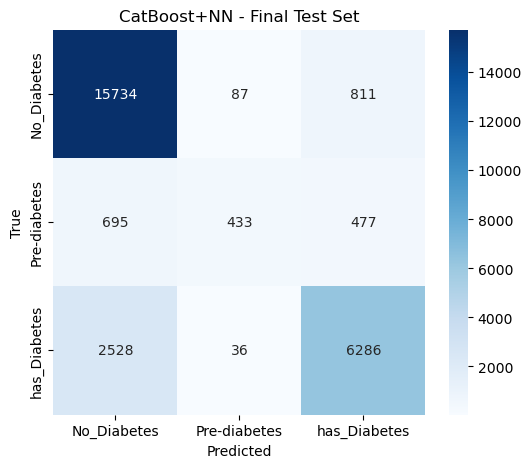


📈 Test Set ROC Curve:


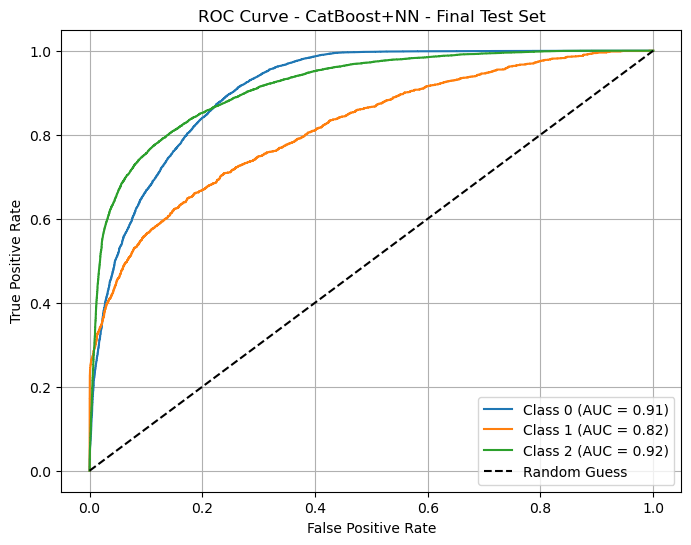

In [14]:

# ====== Models ======
models = {
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "NeuralNet": MLPClassifier(hidden_layer_sizes=(128, 64), 
                               activation='relu', 
                               solver='adam', 
                               max_iter=500, 
                               random_state=42)
}

# 🔹 CatBoost + Neural Network Ensemble (Soft Voting)
models["CatBoost+NN"] = VotingClassifier(
    estimators=[("cat", models["CatBoost"]), ("nn", models["NeuralNet"])],
    voting="soft"
)

# ====== Pipeline ======
def get_pipeline(model, use_oversampling=False):  # force False
    return Pipeline([('clf', model)])

# ====== Run Model CV ======
# (re-use your existing run_model_cv function, just set use_oversampling=False)

# Example run:
run_model_cv("CatBoost", use_oversampling=False, n_splits=5)
run_model_cv("NeuralNet", use_oversampling=False, n_splits=5)
run_model_cv("CatBoost+NN", use_oversampling=False, n_splits=5)


#### b) NN with class weight

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.pipeline import Pipeline
from sklearn.utils.class_weight import compute_class_weight
import numpy as np

# ====== Compute class weights for NN ======
classes = np.unique(y_train)
class_weights = compute_class_weight(class_weight="balanced", classes=classes, y=y_train)
class_weight_dict = dict(zip(classes, class_weights))

# ====== Models ======
models = {
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),

    # Neural Net with class weighting
    "NeuralNet": MLPClassifier(
        hidden_layer_sizes=(128, 64),
        activation="relu",
        solver="adam",
        max_iter=500,
        random_state=42,
        class_weight=class_weight_dict  # handles imbalance
    )
}

# 🔹 CatBoost + NeuralNet Ensemble (Soft Voting)
models["CatBoost+NN"] = VotingClassifier(
    estimators=[("cat", models["CatBoost"]), ("nn", models["NeuralNet"])],
    voting="soft"
)

# ====== Pipeline (oversampling always False) ======
def get_pipeline(model, use_oversampling=False):
    return Pipeline([("clf", model)])

# ====== Run Models ======
run_model_cv("CatBoost", use_oversampling=True, n_splits=5)
run_model_cv("NeuralNet", use_oversampling=False, n_splits=5)
run_model_cv("CatBoost+NN", use_oversampling=False, n_splits=5)



📌 Running Model: CatBoost | 5-Fold CV
Fold 1: Val Accuracy=0.8328, Log Loss=0.4380, Time=9.29s
Fold 2: Val Accuracy=0.8350, Log Loss=0.4308, Time=9.25s
Fold 3: Val Accuracy=0.8315, Log Loss=0.4388, Time=9.41s
Fold 4: Val Accuracy=0.8351, Log Loss=0.4277, Time=9.03s
Fold 5: Val Accuracy=0.8310, Log Loss=0.4405, Time=9.64s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.8331 ± 0.0017
Log Loss: 0.4351 ± 0.0050

🏁 Training Final Model: CatBoost

🔹 Final Model Metrics on Test Set:
Accuracy: 0.8319
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.88      0.26      0.40      1605
has_Diabetes       0.83      0.72      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.64      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🧾 Test Set Confusion Matrix:


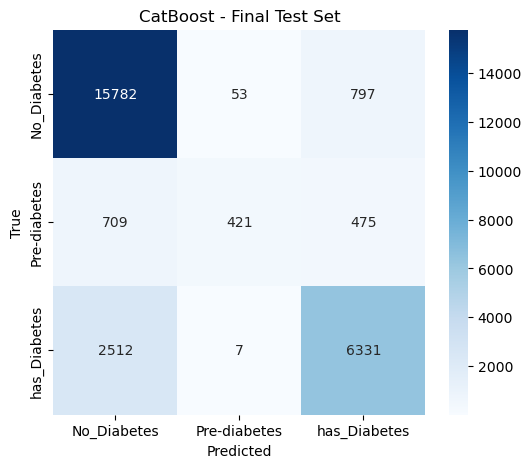


📈 Test Set ROC Curve:


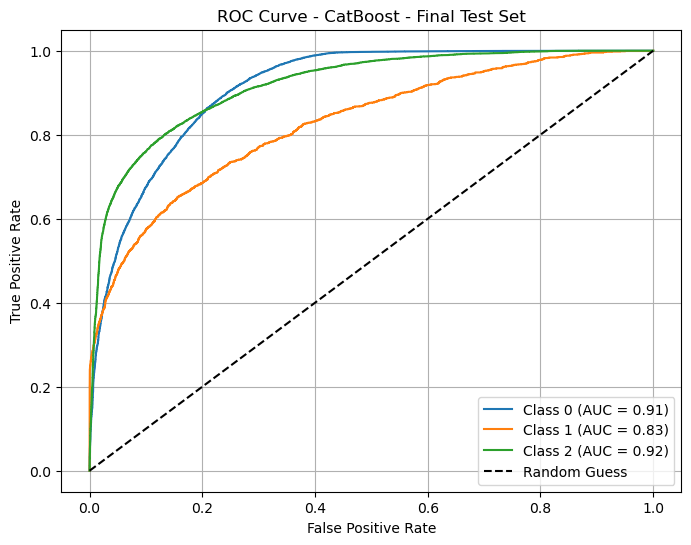


📌 Running Model: Neural Network | 5-Fold CV


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 1: Val Accuracy=0.7692, Log Loss=0.6275, Time=124.02s


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 2: Val Accuracy=0.7394, Log Loss=0.6632, Time=123.12s


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 3: Val Accuracy=0.7428, Log Loss=0.6730, Time=126.80s


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 4: Val Accuracy=0.7601, Log Loss=0.6300, Time=125.56s


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


Fold 5: Val Accuracy=0.7372, Log Loss=0.6799, Time=125.27s

🔹 Cross-Validation Summary (averaged over folds):
Accuracy: 0.7497 ± 0.0126
Log Loss: 0.6547 ± 0.0219

🏁 Training Final Model: Neural Network

🔹 Final Model Metrics on Test Set:
Accuracy: 0.7494
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.82      0.84     16632
Pre-diabetes       0.23      0.49      0.31      1605
has_Diabetes       0.75      0.66      0.70      8850

    accuracy                           0.75     27087
   macro avg       0.61      0.66      0.62     27087
weighted avg       0.79      0.75      0.76     27087


🧾 Test Set Confusion Matrix:


C:\Users\olika\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(


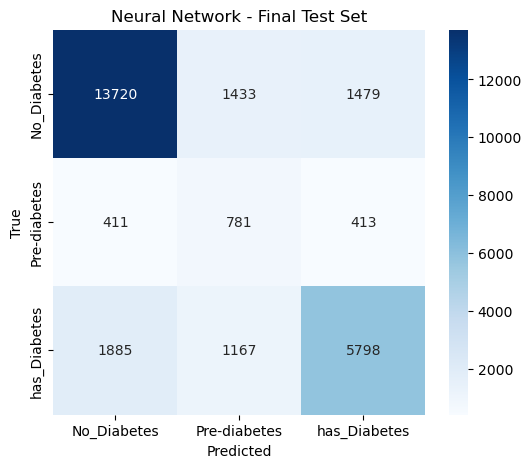


📈 Test Set ROC Curve:


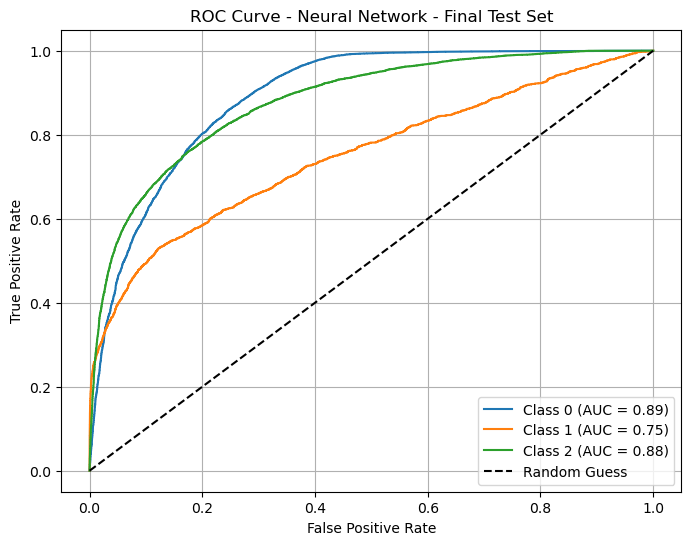

,hidden_layer_sizes,"(128, ...)"
,activation,'relu'
,solver,'adam'
,alpha,0.0001
,batch_size,'auto'
,learning_rate,'constant'
,learning_rate_init,0.001
,power_t,0.5
,max_iter,300
,shuffle,True
,random_state,42


In [17]:
from sklearn.neural_network import MLPClassifier
from sklearn.utils.class_weight import compute_class_weight

# ====== Models ======
models = {
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42),
    "Neural Network": "NN"   # placeholder handled separately
}
def get_pipeline(model_name):
    """Return pipeline without oversampling for CatBoost. 
       NN handled separately."""
    if model_name == "CatBoost":
        return Pipeline([('clf', models[model_name])])
    elif model_name == "Neural Network":
        return None  # handled differently
def run_model_cv(model_name, n_splits=5):
    print(f"\n📌 Running Model: {model_name} | {n_splits}-Fold CV")

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    fold_acc, fold_loss, fold_times = [], [], []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        start_time = time.time()

        if model_name == "Neural Network":
            # compute class weights
            classes = np.unique(y_tr)
            weights = compute_class_weight("balanced", classes=classes, y=y_tr)
            class_weights = dict(zip(classes, weights))

            model = MLPClassifier(hidden_layer_sizes=(128, 64),
                                  max_iter=300,
                                  activation='relu',
                                  solver='adam',
                                  random_state=42)
            model.fit(X_tr, y_tr, sample_weight=[class_weights[c] for c in y_tr])

        else:  # CatBoost
            pipe = get_pipeline(model_name)
            model = pipe.fit(X_tr, y_tr)

        exec_time = time.time() - start_time

        y_val_pred = model.predict(X_val)
        y_val_proba = model.predict_proba(X_val)

        acc = accuracy_score(y_val, y_val_pred)
        loss = log_loss(y_val, y_val_proba)

        fold_acc.append(acc)
        fold_loss.append(loss)
        fold_times.append(exec_time)

        print(f"Fold {fold}: Val Accuracy={acc:.4f}, Log Loss={loss:.4f}, Time={exec_time:.2f}s")

    # 🔹 Summary
    print("\n🔹 Cross-Validation Summary (averaged over folds):")
    print(f"Accuracy: {np.mean(fold_acc):.4f} ± {np.std(fold_acc):.4f}")
    print(f"Log Loss: {np.mean(fold_loss):.4f} ± {np.std(fold_loss):.4f}")
def train_final_model(model_name):
    print(f"\n🏁 Training Final Model: {model_name}")

    if model_name == "Neural Network":
        classes = np.unique(y_train)
        weights = compute_class_weight("balanced", classes=classes, y=y_train)
        class_weights = dict(zip(classes, weights))

        model = MLPClassifier(hidden_layer_sizes=(128, 64),
                              max_iter=300,
                              activation='relu',
                              solver='adam',
                              random_state=42)
        model.fit(X_train, y_train, sample_weight=[class_weights[c] for c in y_train])

    else:  # CatBoost
        pipe = get_pipeline(model_name)
        model = pipe.fit(X_train, y_train)

    # Test evaluation
    y_test_pred = model.predict(X_test)
    y_test_proba = model.predict_proba(X_test)

    print("\n🔹 Final Model Metrics on Test Set:")
    print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))

    print("\n🧾 Test Set Confusion Matrix:")
    plot_conf_matrix(y_test, y_test_pred, f"{model_name} - Final Test Set")

    print("\n📈 Test Set ROC Curve:")
    plot_roc_curve_test(y_test, y_test_proba, f"{model_name} - Final Test Set")

    return model
run_model_cv("CatBoost")
train_final_model("CatBoost")

run_model_cv("Neural Network")
train_final_model("Neural Network")


#### c) Very good, using NN weight, Cat smote, and GPU

✅ Using device: cuda

📌 Running CatBoost with SMOTE | 5-Fold CV
Fold 1: Val Accuracy=0.8335
Fold 2: Val Accuracy=0.8360
Fold 3: Val Accuracy=0.8307
Fold 4: Val Accuracy=0.8339
Fold 5: Val Accuracy=0.8331

🔹 Final CatBoost Metrics (Test):
Accuracy: 0.8302
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.88     16632
Pre-diabetes       0.82      0.27      0.41      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.82      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



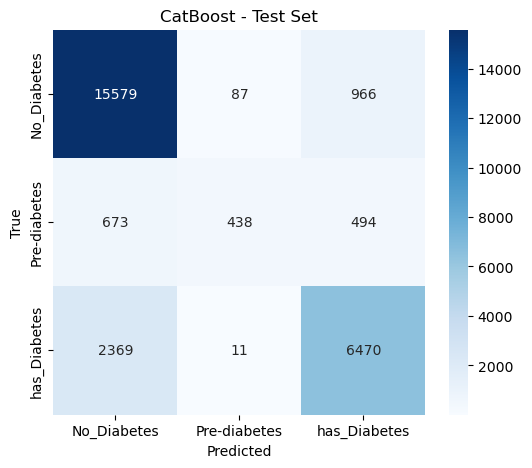

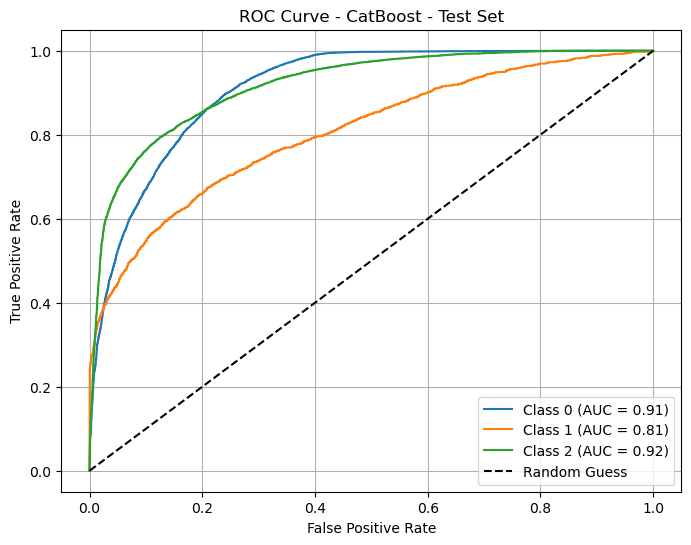


📌 Running Neural Net (PyTorch + GPU) | 5-Fold CV
Fold 1: Val Accuracy=0.7612
Fold 2: Val Accuracy=0.7556
Fold 3: Val Accuracy=0.7356
Fold 4: Val Accuracy=0.7518
Fold 5: Val Accuracy=0.7637

🔹 Final NN Metrics (Test):
Accuracy: 0.7525
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.78      0.81     16632
Pre-diabetes       0.30      0.50      0.38      1605
has_Diabetes       0.72      0.75      0.73      8850

    accuracy                           0.75     27087
   macro avg       0.62      0.68      0.64     27087
weighted avg       0.78      0.75      0.76     27087



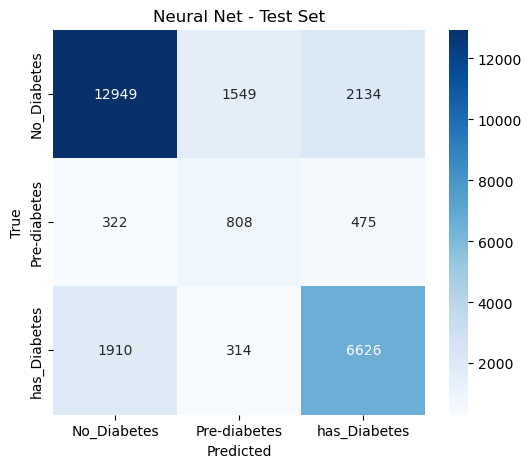

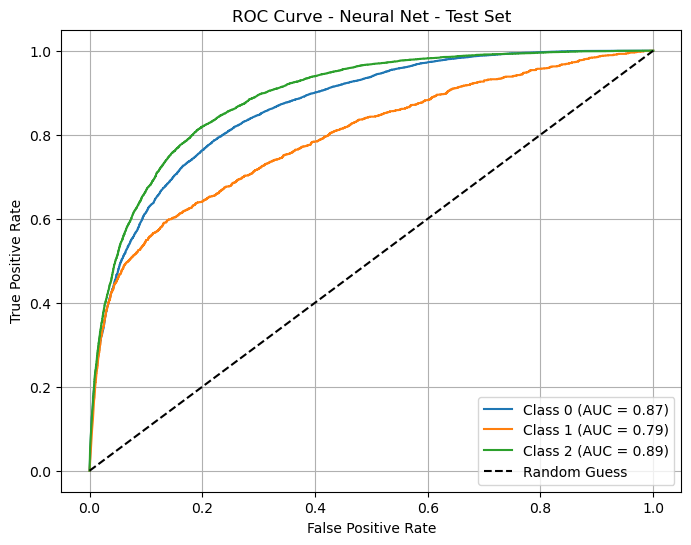


🤝 Combining CatBoost + Neural Net (Hybrid)

🔹 Hybrid Metrics (Test):
Accuracy: 0.7799
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.82      0.84     16632
Pre-diabetes       0.36      0.47      0.41      1605
has_Diabetes       0.75      0.76      0.76      8850

    accuracy                           0.78     27087
   macro avg       0.65      0.68      0.67     27087
weighted avg       0.79      0.78      0.78     27087



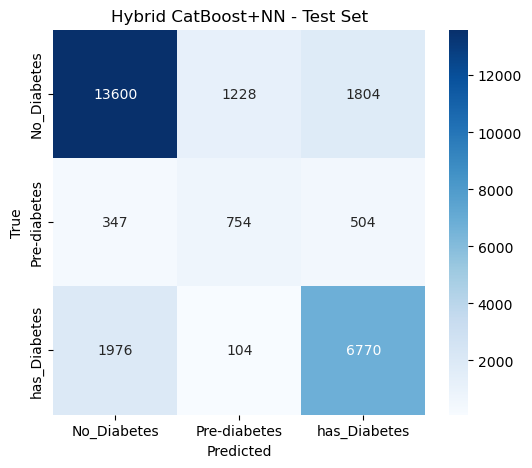

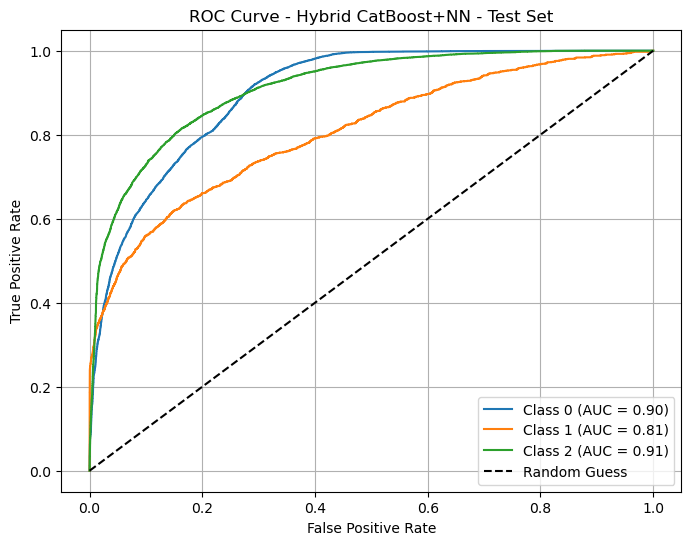

In [18]:
from torch.utils.data import TensorDataset, DataLoader
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Using device:", device)

# ====== ROC Curve ======
def plot_roc_curve_test(y_true, y_proba, model_name):
    classes = np.unique(y_true)
    y_bin = label_binarize(y_true, classes=classes)

    if y_bin.shape[1] == 1:
        y_bin = np.hstack((1 - y_bin, y_bin))

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_bin[:, i], y_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(8, 6))
    for i in range(len(classes)):
        plt.plot(fpr[i], tpr[i], label=f"Class {classes[i]} (AUC = {roc_auc[i]:.2f})")

    plt.plot([0, 1], [0, 1], "k--", label="Random Guess")
    plt.title(f"ROC Curve - {model_name}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=le.classes_,
                yticklabels=le.classes_)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

# ====== CatBoost with SMOTE ======
def run_catboost_cv(n_splits=5):
    print(f"\n📌 Running CatBoost with SMOTE | {n_splits}-Fold CV")

    model = CatBoostClassifier(verbose=0, random_state=42)
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    fold_acc = []
    for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
        X_tr, X_val = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_tr, y_val = y_train.iloc[train_idx], y_train.iloc[val_idx]

        pipe = ImbPipeline([
            ('smote', SMOTE(random_state=42)),
            ('clf', model)
        ])

        pipe.fit(X_tr, y_tr)
        y_val_pred = pipe.predict(X_val)
        acc = accuracy_score(y_val, y_val_pred)
        fold_acc.append(acc)
        print(f"Fold {fold}: Val Accuracy={acc:.4f}")

    final_pipe = ImbPipeline([
        ('smote', SMOTE(random_state=42)),
        ('clf', model)
    ])
    final_pipe.fit(X_train, y_train)
    y_test_pred = final_pipe.predict(X_test)
    y_test_proba = final_pipe.predict_proba(X_test)

    print("\n🔹 Final CatBoost Metrics (Test):")
    print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    plot_conf_matrix(y_test, y_test_pred, "CatBoost - Test Set")
    plot_roc_curve_test(y_test, y_test_proba, "CatBoost - Test Set")

    return final_pipe, y_test_proba

# ====== PyTorch Neural Net with Class Weights ======
class SimpleNN(nn.Module):
    def __init__(self, input_dim, n_classes):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_dim, 128)
        self.drop1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(128, 64)
        self.fc3 = nn.Linear(64, n_classes)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.drop1(x)
        x = torch.relu(self.fc2(x))
        return torch.softmax(self.fc3(x), dim=1)

def run_nn_cv(n_splits=5, epochs=20, batch_size=64, lr=0.001):
    print(f"\n📌 Running Neural Net (PyTorch + GPU) | {n_splits}-Fold CV")

    n_classes = len(np.unique(y_train))
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    fold_acc = []
    for fold, (train_idx, val_idx) in enumerate(skf.split(X_train, y_train), 1):
        X_tr, X_val = X_train.iloc[train_idx].values, X_train.iloc[val_idx].values
        y_tr, y_val = y_train.iloc[train_idx].values, y_train.iloc[val_idx].values

        # class weights
        class_weights = compute_class_weight("balanced", classes=np.unique(y_tr), y=y_tr)
        class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

        # convert to tensors
        X_tr_tensor = torch.tensor(X_tr, dtype=torch.float32).to(device)
        y_tr_tensor = torch.tensor(y_tr, dtype=torch.long).to(device)
        X_val_tensor = torch.tensor(X_val, dtype=torch.float32).to(device)
        y_val_tensor = torch.tensor(y_val, dtype=torch.long).to(device)

        train_loader = DataLoader(TensorDataset(X_tr_tensor, y_tr_tensor), batch_size=batch_size, shuffle=True)

        model = SimpleNN(X_tr.shape[1], n_classes).to(device)
        criterion = nn.CrossEntropyLoss(weight=class_weights)
        optimizer = optim.Adam(model.parameters(), lr=lr)

        # training loop
        for epoch in range(epochs):
            model.train()
            for xb, yb in train_loader:
                optimizer.zero_grad()
                outputs = model(xb)
                loss = criterion(outputs, yb)
                loss.backward()
                optimizer.step()

        # validation
        model.eval()
        with torch.no_grad():
            y_val_proba = model(X_val_tensor).cpu().numpy()
            y_val_pred = np.argmax(y_val_proba, axis=1)

        acc = accuracy_score(y_val, y_val_pred)
        fold_acc.append(acc)
        print(f"Fold {fold}: Val Accuracy={acc:.4f}")

    # retrain final model
    X_train_tensor = torch.tensor(X_train.values, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train.values, dtype=torch.long).to(device)
    X_test_tensor = torch.tensor(X_test.values, dtype=torch.float32).to(device)

    final_class_weights = compute_class_weight("balanced", classes=np.unique(y_train), y=y_train)
    final_class_weights = torch.tensor(final_class_weights, dtype=torch.float32).to(device)

    final_model = SimpleNN(X_train.shape[1], n_classes).to(device)
    criterion = nn.CrossEntropyLoss(weight=final_class_weights)
    optimizer = optim.Adam(final_model.parameters(), lr=lr)

    train_loader = DataLoader(TensorDataset(X_train_tensor, y_train_tensor), batch_size=batch_size, shuffle=True)
    for epoch in range(epochs):
        final_model.train()
        for xb, yb in train_loader:
            optimizer.zero_grad()
            outputs = final_model(xb)
            loss = criterion(outputs, yb)
            loss.backward()
            optimizer.step()

    final_model.eval()
    with torch.no_grad():
        y_test_proba = final_model(X_test_tensor).cpu().numpy()
        y_test_pred = np.argmax(y_test_proba, axis=1)

    print("\n🔹 Final NN Metrics (Test):")
    print(f"Accuracy: {accuracy_score(y_test, y_test_pred):.4f}")
    print(classification_report(y_test, y_test_pred, target_names=le.classes_))
    plot_conf_matrix(y_test, y_test_pred, "Neural Net - Test Set")
    plot_roc_curve_test(y_test, y_test_proba, "Neural Net - Test Set")

    return final_model, y_test_proba

# ====== Hybrid CatBoost + NN ======
def run_hybrid(cat_proba, nn_proba):
    print("\n🤝 Combining CatBoost + Neural Net (Hybrid)")
    avg_proba = (cat_proba + nn_proba) / 2
    y_pred = np.argmax(avg_proba, axis=1)

    print("\n🔹 Hybrid Metrics (Test):")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(classification_report(y_test, y_pred, target_names=le.classes_))
    plot_conf_matrix(y_test, y_pred, "Hybrid CatBoost+NN - Test Set")
    plot_roc_curve_test(y_test, avg_proba, "Hybrid CatBoost+NN - Test Set")

# ====== Run All ======
cat_model, cat_proba = run_catboost_cv(n_splits=5)
nn_model, nn_proba = run_nn_cv(n_splits=5, epochs=30, batch_size=64)
run_hybrid(cat_proba, nn_proba)


### 7.3. Stacking NN + CatBoost

In [31]:
# ==========================
# 1. Neural Network Definition
# ==========================
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, x):
        return self.layers(x)

# ==========================
# 2. NN Training Function
# ==========================
def train_nn(model, X_train, y_train, X_val, y_val, epochs=30, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    # Convert Pandas/NumPy to torch tensors
    X_train = torch.tensor(X_train.values if hasattr(X_train, "values") else X_train, dtype=torch.float32).to(device)
    y_train = torch.tensor(y_train.values if hasattr(y_train, "values") else y_train, dtype=torch.long).to(device)
    X_val   = torch.tensor(X_val.values   if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val   = torch.tensor(y_val.values   if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

        if (epoch+1) % 10 == 0:
            model.eval()
            with torch.no_grad():
                val_preds = model(X_val).argmax(dim=1)
                acc = (val_preds == y_val).float().mean().item()
                print(f"Epoch {epoch+1}/{epochs} - Loss: {loss.item():.4f}, Val Acc: {acc:.4f}")

    return model

# ==========================
# 3. Hybrid Stacking Function
# ==========================
def hybrid_stacking(X, y, test_size=0.2, device="cuda", nn_epochs=30):
    # ----- Encode target labels -----
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    # ----- Split train/test -----
    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, test_size=test_size, stratify=y_encoded, random_state=42
    )

    # ----- CatBoost Base Learner -----
    cat = CatBoostClassifier(
        iterations=300,
        depth=8,
        learning_rate=0.05,
        loss_function='MultiClass',
        eval_metric='MultiClass',
        custom_metric=['F1'],
        verbose=0,
        random_state=42
    )
    cat.fit(X_train, y_train)

    # ----- PyTorch NN Base Learner -----
    nn_model = SimpleNN(input_dim=X_train.shape[1], output_dim=len(np.unique(y_encoded)))
    nn_model = train_nn(nn_model, X_train, y_train, X_test, y_test, epochs=nn_epochs, device=device)

    # ----- Base Learner Predictions -----
    cat_train_pred = cat.predict_proba(X_train)
    cat_test_pred  = cat.predict_proba(X_test)

    nn_model.eval()
    with torch.no_grad():
        nn_train_pred = nn_model(torch.tensor(X_train.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()
        nn_test_pred  = nn_model(torch.tensor(X_test.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()

    # ----- Stack Base Learner Predictions -----
    stack_train = np.hstack([cat_train_pred, nn_train_pred])
    stack_test  = np.hstack([cat_test_pred, nn_test_pred])

    # ----- Meta-Classifier -----
    meta_clf = LogisticRegression(max_iter=500)
    meta_clf.fit(stack_train, y_train)
    final_pred = meta_clf.predict(stack_test)

    # ----- Evaluation -----
    print("\n📊 Classification Report (Hybrid Stacking):")
    print(classification_report(y_test, final_pred, digits=4))

    macro_f1 = f1_score(y_test, final_pred, average="macro")
    print(f"🏆 Hybrid Stacking Macro F1: {macro_f1:.4f}")

    return meta_clf, cat, nn_model, le

# ==========================
# 4. Example Usage
# ==========================
# X = your features DataFrame, y = target series
meta_clf, cat_model, nn_model, le = hybrid_stacking(X, diabetes1['Diabetes'], device="cuda", nn_epochs=30)


Epoch 10/30 - Loss: 1.0063, Val Acc: 0.6637
Epoch 20/30 - Loss: 0.8753, Val Acc: 0.6596
Epoch 30/30 - Loss: 0.7674, Val Acc: 0.7057

📊 Classification Report (Hybrid Stacking):
              precision    recall  f1-score   support

           0     0.8396    0.9331    0.8839     16632
           1     0.7512    0.2953    0.4240      1605
           2     0.8127    0.7319    0.7702      8850

    accuracy                         0.8296     27087
   macro avg     0.8011    0.6534    0.6927     27087
weighted avg     0.8255    0.8296    0.8195     27087

🏆 Hybrid Stacking Macro F1: 0.6927


In [32]:
# ==========================
# 1. Neural Network
# ==========================
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )

    def forward(self, x):
        return self.layers(x)

# ==========================
# 2. NN Training Helper
# ==========================
def train_nn(model, X_train, y_train, X_val, y_val, epochs=30, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    # Convert Pandas / NumPy to torch tensors
    X_train = torch.tensor(X_train.values if hasattr(X_train, "values") else X_train, dtype=torch.float32).to(device)
    y_train = torch.tensor(y_train.values if hasattr(y_train, "values") else y_train, dtype=torch.long).to(device)
    X_val   = torch.tensor(X_val.values   if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val   = torch.tensor(y_val.values   if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()

    return model

# ==========================
# 3. Hybrid Stacking with K-Fold CV
# ==========================
def hybrid_stacking_cv(X, y, n_splits=5, device="cuda", nn_epochs=30):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    oof_preds = np.zeros((X.shape[0], 0))  # Placeholder for stacking features
    y_oof = np.zeros(X.shape[0], dtype=int)

    cat_models = []
    nn_models = []

    print(f"\n📌 Starting {n_splits}-Fold Hybrid Stacking CV...")

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y_encoded), 1):
        print(f"\n🔹 Fold {fold}/{n_splits}")
        X_tr, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_tr, y_val = y_encoded[train_idx], y_encoded[val_idx]

        # ----- CatBoost Base Learner -----
        cat = CatBoostClassifier(
            iterations=300,
            depth=8,
            learning_rate=0.05,
            loss_function='MultiClass',
            eval_metric='MultiClass',
            custom_metric=['F1'],
            verbose=0,
            random_state=42
        )
        cat.fit(X_tr, y_tr)

        # ----- NN Base Learner -----
        nn_model = SimpleNN(input_dim=X.shape[1], output_dim=len(np.unique(y_encoded)))
        nn_model = train_nn(nn_model, X_tr, y_tr, X_val, y_val, epochs=nn_epochs, device=device)

        # ----- Base Learner Predictions -----
        cat_val_pred = cat.predict_proba(X_val)
        nn_model.eval()
        with torch.no_grad():
            nn_val_pred = nn_model(torch.tensor(X_val.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()

        # ----- Stack Predictions -----
        fold_stack = np.hstack([cat_val_pred, nn_val_pred])
        if oof_preds.shape[1] == 0:
            oof_preds = np.zeros((X.shape[0], fold_stack.shape[1]))
        oof_preds[val_idx, :] = fold_stack
        y_oof[val_idx] = y_val

        cat_models.append(cat)
        nn_models.append(nn_model)

        fold_macro_f1 = f1_score(y_val, fold_stack.argmax(axis=1), average='macro')
        print(f"Fold {fold} Macro F1: {fold_macro_f1:.4f}")

    # ----- Meta-Classifier -----
    meta_clf = LogisticRegression(max_iter=500)
    meta_clf.fit(oof_preds, y_oof)
    final_pred = meta_clf.predict(oof_preds)

    print("\n📊 Final Meta-Classifier Performance (OOF predictions):")
    print(classification_report(y_oof, final_pred, digits=4))

    macro_f1 = f1_score(y_oof, final_pred, average='macro')
    print(f"🏆 Overall Hybrid Stacking Macro F1: {macro_f1:.4f}")

    return meta_clf, cat_models, nn_models, le

# ==========================
# 4. Example Usage
# ==========================
# X = features DataFrame, y = target Series
meta_clf, cat_models, nn_models, le = hybrid_stacking_cv(X, diabetes1['Diabetes'], n_splits=5, device="cuda", nn_epochs=30)



📌 Starting 5-Fold Hybrid Stacking CV...

🔹 Fold 1/5
Fold 1 Macro F1: 0.4072

🔹 Fold 2/5
Fold 2 Macro F1: 0.5184

🔹 Fold 3/5
Fold 3 Macro F1: 0.5057

🔹 Fold 4/5
Fold 4 Macro F1: 0.5163

🔹 Fold 5/5
Fold 5 Macro F1: 0.4066

📊 Final Meta-Classifier Performance (OOF predictions):
              precision    recall  f1-score   support

           0     0.8401    0.9393    0.8869     83157
           1     0.8451    0.2849    0.4261      8025
           2     0.8179    0.7347    0.7741     44251

    accuracy                         0.8337    135433
   macro avg     0.8344    0.6530    0.6957    135433
weighted avg     0.8331    0.8337    0.8227    135433

🏆 Overall Hybrid Stacking Macro F1: 0.6957


----- CatBoost Evaluation -----

📌 CatBoost Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.93      0.26      0.40      1605
has_Diabetes       0.83      0.72      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.86      0.64      0.69     27087
weighted avg       0.84      0.83      0.82     27087



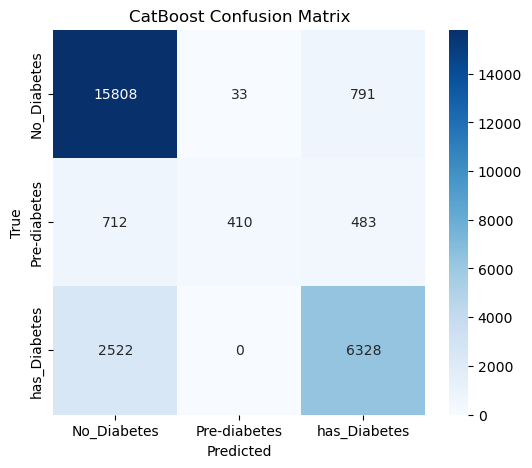

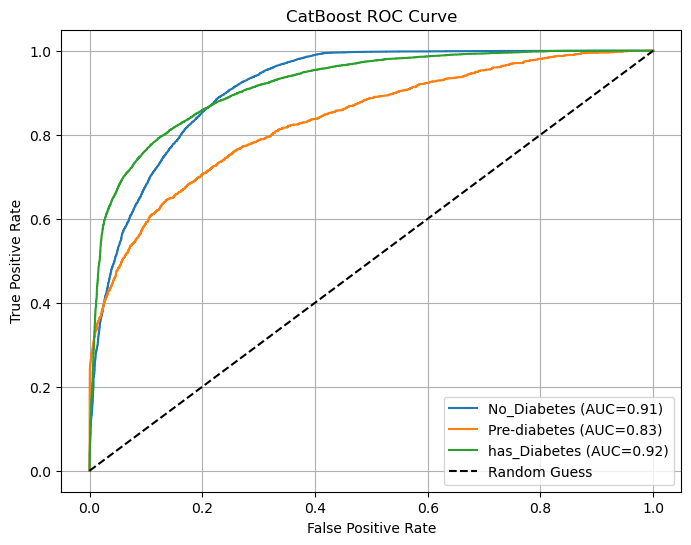

----- Neural Network Evaluation -----

📌 Neural Network Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.85      0.73      0.79     16632
Pre-diabetes       0.20      0.44      0.27      1605
has_Diabetes       0.65      0.68      0.67      8850

    accuracy                           0.70     27087
   macro avg       0.57      0.62      0.58     27087
weighted avg       0.75      0.70      0.72     27087



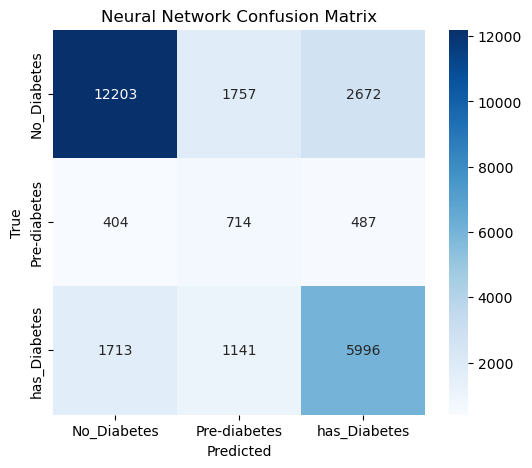

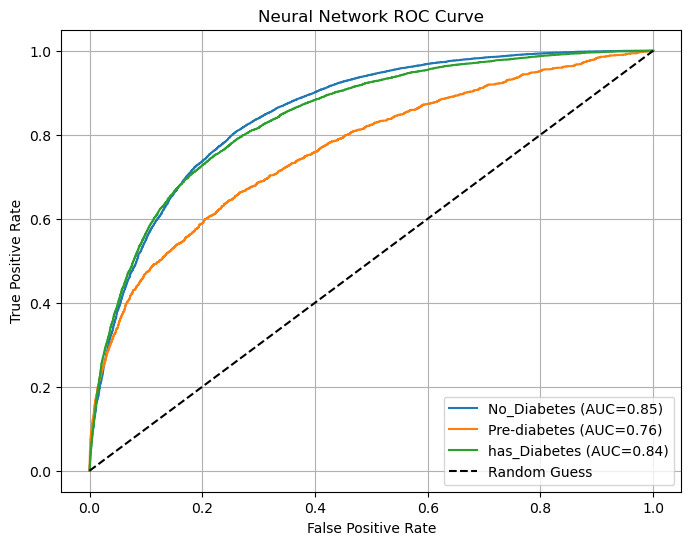

----- Hybrid Stacked Model Evaluation -----

📌 Stacked Model Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.88     16632
Pre-diabetes       0.75      0.29      0.42      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.80      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



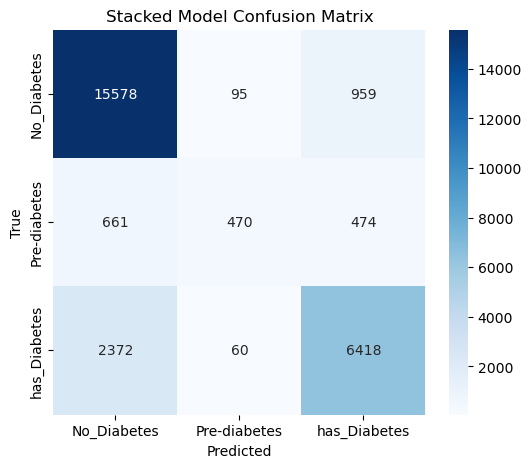

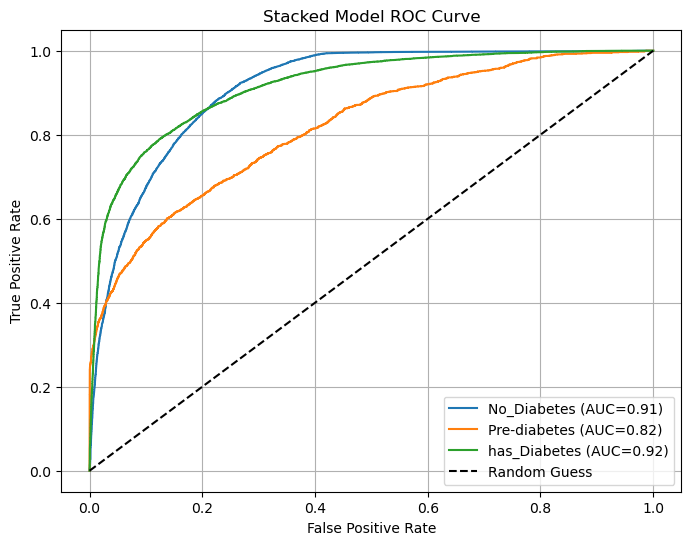


🏆 Macro F1 Scores:
CatBoost: 0.6853, NN: 0.5761, Stacked: 0.6914


In [37]:

from sklearn.utils.class_weight import compute_class_weight

# ==========================
# 1. Neural Network
# ==========================
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )
    def forward(self, x):
        return self.layers(x)



# ==========================
# 2. NN Training with Class Weights
# ==========================
def train_nn_oversample(model, X_train, y_train, X_val, y_val, epochs=50, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    # Apply SMOTE to oversample minority classes
    smote = SMOTE(random_state=42)
    X_train_os, y_train_os = smote.fit_resample(X_train, y_train)

    # Convert to torch tensors
    X_train_tensor = torch.tensor(X_train_os.values if hasattr(X_train_os, "values") else X_train_os, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train_os.values if hasattr(y_train_os, "values") else y_train_os, dtype=torch.long).to(device)
    X_val_tensor   = torch.tensor(X_val.values if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val_tensor   = torch.tensor(y_val.values if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()

    return model




# ==========================
# 3. Evaluation Helpers
# ==========================
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

def plot_roc(y_true, y_proba, classes, title):
    y_bin = np.eye(len(classes))[y_true]
    plt.figure(figsize=(8,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
        plt.plot(fpr, tpr, label=f"{cls} (AUC={auc(fpr,tpr):.2f})")
    plt.plot([0,1],[0,1],"k--", label="Random Guess")
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True)
    plt.show()

# ==========================
# 4. Hybrid Stacking with Full Evaluation
# ==========================
def hybrid_stacking_oversample(X, y, test_size=0.2, device="cuda", nn_epochs=50):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    X_train, X_test, y_train, y_test = train_test_split(
        X, y_encoded, test_size=test_size, stratify=y_encoded, random_state=42
    )

    # ---- CatBoost ----
    cat = CatBoostClassifier(
        iterations=300,
        depth=8,
        learning_rate=0.05,
        loss_function='MultiClass',
        eval_metric='MultiClass',
        custom_metric=['F1'],
        verbose=0,
        random_state=42
    )
    cat.fit(X_train, y_train)
    cat_train_proba = cat.predict_proba(X_train)
    cat_test_proba  = cat.predict_proba(X_test)

    # ---- Neural Network with Oversampling ----
    nn_model = SimpleNN(input_dim=X_train.shape[1], output_dim=len(classes))
    nn_model = train_nn_oversample(nn_model, X_train, y_train, X_test, y_test, epochs=nn_epochs, device=device)
    nn_model.eval()

    with torch.no_grad():
        nn_train_proba = nn_model(torch.tensor(X_train.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()
        nn_test_proba  = nn_model(torch.tensor(X_test.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()

    # ---- Stack Predictions ----
    stack_train = np.hstack([cat_train_proba, nn_train_proba])
    stack_test  = np.hstack([cat_test_proba, nn_test_proba])

    meta_clf = LogisticRegression(max_iter=500)
    meta_clf.fit(stack_train, y_train)
    final_pred = meta_clf.predict(stack_test)
    final_proba = meta_clf.predict_proba(stack_test)

    # ---- Evaluation Function
    def evaluate(y_true, y_pred, y_proba, title):
        print(f"\n📌 {title} Classification Report:")
        print(classification_report(y_true, y_pred, target_names=classes))
        plot_conf_matrix(y_true, y_pred, classes, f"{title} Confusion Matrix")
        plot_roc(y_true, y_proba, classes, f"{title} ROC Curve")
        return f1_score(y_true, y_pred, average="macro")

    print("----- CatBoost Evaluation -----")
    cat_pred = cat.predict(X_test)
    macro_f1_cat = evaluate(y_test, cat_pred, cat_test_proba, "CatBoost")

    print("----- Neural Network Evaluation -----")
    nn_pred = nn_test_proba.argmax(axis=1)
    macro_f1_nn = evaluate(y_test, nn_pred, nn_test_proba, "Neural Network")

    print("----- Hybrid Stacked Model Evaluation -----")
    macro_f1_stack = evaluate(y_test, final_pred, final_proba, "Stacked Model")

    print(f"\n🏆 Macro F1 Scores:\nCatBoost: {macro_f1_cat:.4f}, NN: {macro_f1_nn:.4f}, Stacked: {macro_f1_stack:.4f}")

    return meta_clf, cat, nn_model, le




# Run hybrid stacking with GPU (PyTorch) and full evaluation
meta_clf, cat_model, nn_model, label_encoder = hybrid_stacking_oversample(
    X, y, test_size=0.2, device="cuda", nn_epochs=50
)

### Hybrid Stacked CV Function for KAN


🔹 Fold 1/5
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.75      0.30      0.43      1605
has_Diabetes       0.82      0.73      0.77      8851

    accuracy                           0.83     27087
   macro avg       0.80      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



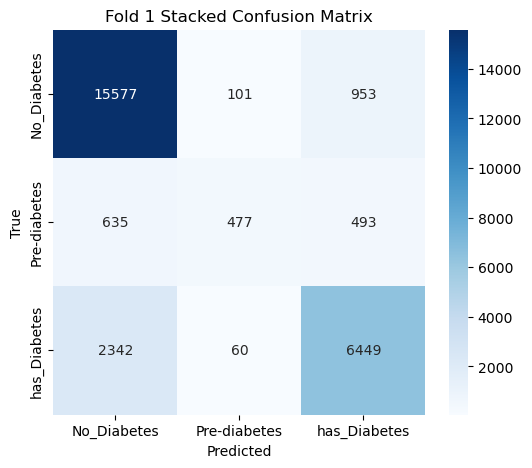


🔹 Fold 2/5
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16632
Pre-diabetes       0.76      0.33      0.46      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.81      0.67      0.71     27087
weighted avg       0.83      0.83      0.82     27087



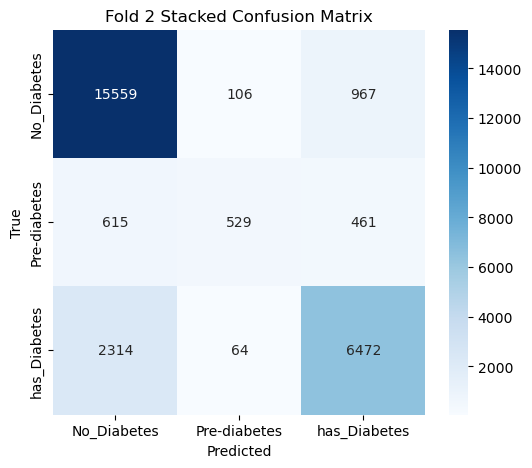


🔹 Fold 3/5
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16632
Pre-diabetes       0.76      0.28      0.41      1605
has_Diabetes       0.81      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.81      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



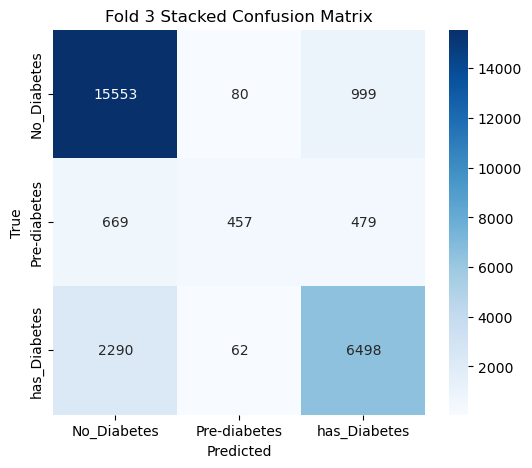


🔹 Fold 4/5
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.76      0.30      0.43      1605
has_Diabetes       0.82      0.74      0.78      8850

    accuracy                           0.84     27086
   macro avg       0.81      0.66      0.70     27086
weighted avg       0.83      0.84      0.82     27086



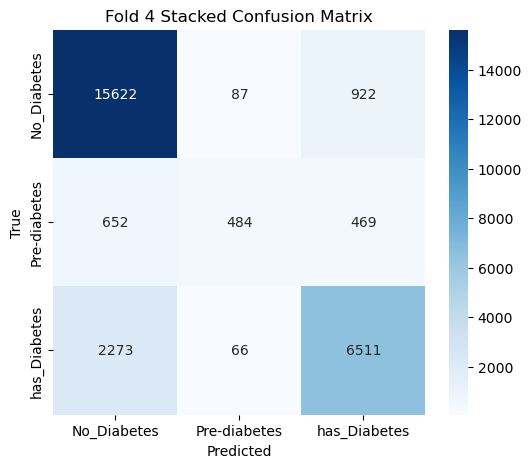


🔹 Fold 5/5
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.76      0.30      0.43      1605
has_Diabetes       0.81      0.72      0.77      8850

    accuracy                           0.83     27086
   macro avg       0.80      0.65      0.69     27086
weighted avg       0.83      0.83      0.82     27086



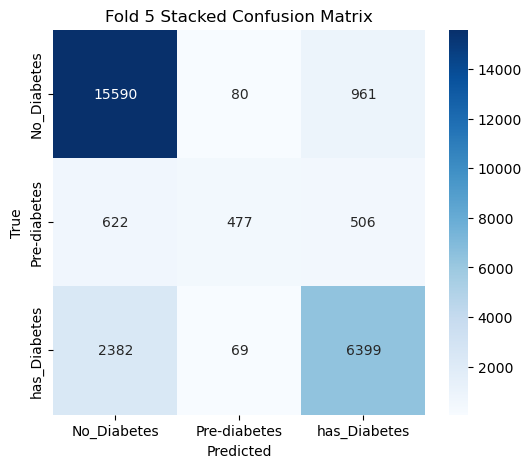


🏆 Overall Hybrid Stacked Macro F1: 0.6965

🏆 Average CatBoost Feature Importances:
              feature  importance
11        NoFreq_Phys   40.141554
18  EverBeenDiagnosed   19.877295
12                Age    5.107085
16                BMI    4.112200
17        hadHighChol    3.716051
7             Incomes    3.687445
19       UnderBPmedic    3.239789
1     NoStrenghtExerc    3.179573
8        isNotHealthy    2.744346
6          StudyLevel    2.244240
0         LastCheckUp    2.086880
15             Female    1.793301
2              HighBP    1.471631
9    DaysNotGoodPhysq    1.342062
13    DrinkerCategory    1.110114
5           KidneyDis    1.063211
10      isWeakPhyscly    1.043117
3         HeartAttack    0.830657
4        HeartDisease    0.746703
14         had_Stroke    0.462746


In [52]:
# ---------------------------
# 1. KAN Model (simple feed-forward KAN variant)
# ---------------------------
class SimpleKAN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleKAN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim, output_dim)
        )
    def forward(self, x):
        return self.layers(x)

# ---------------------------
# 2. Training function with SMOTE
# ---------------------------
def train_kan_oversample(model, X_train, y_train, X_val, y_val, epochs=50, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    # SMOTE oversampling
    smote = SMOTE(random_state=42)
    X_train_os, y_train_os = smote.fit_resample(X_train, y_train)

    X_train_tensor = torch.tensor(X_train_os.values if hasattr(X_train_os, "values") else X_train_os, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train_os.values if hasattr(y_train_os, "values") else y_train_os, dtype=torch.long).to(device)
    X_val_tensor   = torch.tensor(X_val.values if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val_tensor   = torch.tensor(y_val.values if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()
    return model

# ---------------------------
# 3. Evaluation helpers
# ---------------------------
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

# ---------------------------
# 4. Hybrid Stacked CV Function
# ---------------------------
def hybrid_catboost_kan_cv(X, y, n_splits=5, device="cuda", kan_epochs=50):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    all_preds_stack = np.zeros(len(y_encoded), dtype=int)
    fold = 0
    feature_importances_cat = np.zeros(X.shape[1])

    for train_idx, test_idx in skf.split(X, y_encoded):
        fold += 1
        print(f"\n🔹 Fold {fold}/{n_splits}")
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

        # ---- CatBoost ----
        cat = CatBoostClassifier(
            iterations=300, depth=8, learning_rate=0.05,
            loss_function='MultiClass', eval_metric='MultiClass',
            verbose=0, random_state=42
        )
        cat.fit(X_train, y_train)
        feature_importances_cat += cat.feature_importances_ / n_splits
        cat_train_proba = cat.predict_proba(X_train)
        cat_test_proba  = cat.predict_proba(X_test)

        # ---- KAN with oversampling ----
        kan_model = SimpleKAN(input_dim=X_train.shape[1], output_dim=len(classes))
        kan_model = train_kan_oversample(kan_model, X_train, y_train, X_test, y_test,
                                         epochs=kan_epochs, device=device)
        kan_model.eval()
        with torch.no_grad():
            kan_train_proba = kan_model(torch.tensor(X_train.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()
            kan_test_proba  = kan_model(torch.tensor(X_test.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()

        # ---- Stacked predictions ----
        stack_train = np.hstack([cat_train_proba, kan_train_proba])
        stack_test  = np.hstack([cat_test_proba, kan_test_proba])
        meta_clf = LogisticRegression(max_iter=500)
        meta_clf.fit(stack_train, y_train)
        final_pred = meta_clf.predict(stack_test)
        all_preds_stack[test_idx] = final_pred

        # Fold evaluation
        print(classification_report(y_test, final_pred, target_names=classes))
        plot_conf_matrix(y_test, final_pred, classes, f"Fold {fold} Stacked Confusion Matrix")

    # Overall macro F1
    overall_f1 = f1_score(y_encoded, all_preds_stack, average="macro")
    print(f"\n🏆 Overall Hybrid Stacked Macro F1: {overall_f1:.4f}")

    fi_df = pd.DataFrame({"feature": X.columns, "importance": feature_importances_cat}).sort_values(by="importance", ascending=False)
    print("\n🏆 Average CatBoost Feature Importances:")
    print(fi_df)

    return cat, kan_model, meta_clf, fi_df, le

# ---------------------------
# Example usage
# ---------------------------
cat_model, kan_model, meta_model, feature_importance_df, label_encoder = hybrid_catboost_kan_cv(X, y, n_splits=5, device="cuda", kan_epochs=50)


#### PyTorch KAN + NN


📌 Hybrid CatBoost + KAN Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.92      0.88     83157
Pre-diabetes       0.81      0.29      0.43      8025
has_Diabetes       0.80      0.75      0.77     44251

    accuracy                           0.83    135433
   macro avg       0.82      0.65      0.69    135433
weighted avg       0.83      0.83      0.82    135433



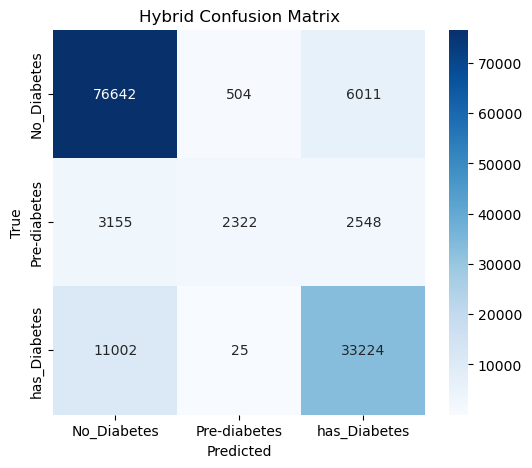

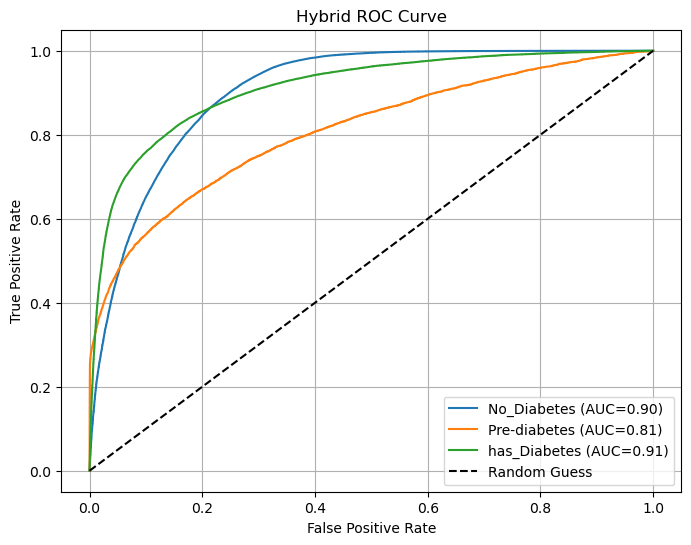


🏆 Hybrid Macro F1: 0.6935


In [54]:


# ==========================
# 1. Define PyTorch KAN + NN
# ==========================
class KAN(nn.Module):
    """Simple Kolmogorov–Arnold Network (KAN) style fully connected network"""
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(KAN, self).__init__()
        self.layer1 = nn.Linear(input_dim, hidden_dim)
        self.layer2 = nn.Linear(hidden_dim, hidden_dim)
        self.output = nn.Linear(hidden_dim, output_dim)
        self.activation = nn.ReLU()

    def forward(self, x):
        x = self.activation(self.layer1(x))
        x = self.activation(self.layer2(x))
        return self.output(x)

# ==========================
# 2. Train PyTorch model with oversampling
# ==========================
def train_nn(model, X_train, y_train, X_val, y_val, epochs=50, lr=1e-3, device='cuda'):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    # Oversample minority classes with SMOTE
    smote = SMOTE(random_state=42)
    X_train_os, y_train_os = smote.fit_resample(X_train, y_train)

    # Convert to torch tensors
    X_train_tensor = torch.tensor(X_train_os.values if hasattr(X_train_os, "values") else X_train_os, dtype=torch.float32).to(device)
    y_train_tensor = torch.tensor(y_train_os.values if hasattr(y_train_os, "values") else y_train_os, dtype=torch.long).to(device)
    X_val_tensor   = torch.tensor(X_val.values if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val_tensor   = torch.tensor(y_val.values if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train_tensor)
        loss = criterion(outputs, y_train_tensor)
        loss.backward()
        optimizer.step()

    return model


# ==========================
# 3. Evaluation Helpers
# ==========================
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted'); plt.ylabel('True'); plt.title(title); plt.show()

def plot_roc(y_true, y_proba, classes, title):
    y_bin = np.eye(len(classes))[y_true]
    plt.figure(figsize=(8,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
        plt.plot(fpr, tpr, label=f"{cls} (AUC={auc(fpr,tpr):.2f})")
    plt.plot([0,1],[0,1],"k--", label="Random Guess")
    plt.xlabel("False Positive Rate"); plt.ylabel("True Positive Rate"); plt.title(title)
    plt.legend(); plt.grid(True); plt.show()

# ==========================
# 4. Hybrid CatBoost + KAN Cross-Validation
# ==========================
def hybrid_catboost_kan_cv(X, y, n_splits=5, device='cuda', nn_epochs=50):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    # Store predictions
    cat_preds = np.zeros((len(y_encoded), len(classes)))
    nn_preds  = np.zeros((len(y_encoded), len(classes)))

    for train_idx, val_idx in skf.split(X, y_encoded):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y_encoded[train_idx], y_encoded[val_idx]

        # ---- CatBoost ----
        cat = CatBoostClassifier(
            iterations=300, depth=8, learning_rate=0.05,
            loss_function='MultiClass', eval_metric='MultiClass', verbose=0, random_state=42
        )
        cat.fit(X_train, y_train)
        cat_preds[val_idx] = cat.predict_proba(X_val)

        # ---- KAN ----
        nn_model = KAN(input_dim=X.shape[1], output_dim=len(classes))
        nn_model = train_nn(nn_model, X_train, y_train, X_val, y_val, epochs=nn_epochs, device=device)
        nn_model.eval()
        with torch.no_grad():
            nn_preds[val_idx] = nn_model(torch.tensor(X_val.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()

    # ---- Combine Probabilities (Average) ----
    hybrid_probs = (cat_preds + nn_preds) / 2
    hybrid_pred  = hybrid_probs.argmax(axis=1)

    # ---- Evaluation ----
    print("\n📌 Hybrid CatBoost + KAN Classification Report:")
    print(classification_report(y_encoded, hybrid_pred, target_names=classes))
    plot_conf_matrix(y_encoded, hybrid_pred, classes, "Hybrid Confusion Matrix")
    plot_roc(y_encoded, hybrid_probs, classes, "Hybrid ROC Curve")

    macro_f1 = f1_score(y_encoded, hybrid_pred, average='macro')
    print(f"\n🏆 Hybrid Macro F1: {macro_f1:.4f}")

    return cat, nn_model, hybrid_probs, le

# ==========================
# 5. Example Usage
# ==========================
X = diabetes1.drop(columns=['Diabetes'])
y = diabetes1['Diabetes']
cat_model, nn_model, hybrid_probs, label_encoder = hybrid_catboost_kan_cv(X, y, n_splits=5, device='cuda', nn_epochs=50)


### 7.4. KNN + CatBoost 


🔹 Fold 1/5
Fold 1 Macro F1: 0.6701

🔹 Fold 2/5
Fold 2 Macro F1: 0.6862

🔹 Fold 3/5
Fold 3 Macro F1: 0.6721

🔹 Fold 4/5
Fold 4 Macro F1: 0.6816

🔹 Fold 5/5
Fold 5 Macro F1: 0.6695

===== Final Hybrid Evaluation =====
              precision    recall  f1-score   support

           0       0.83      0.94      0.88     83157
           1       0.92      0.25      0.39      8025
           2       0.81      0.72      0.76     44251

    accuracy                           0.82    135433
   macro avg       0.85      0.63      0.68    135433
weighted avg       0.83      0.82      0.81    135433



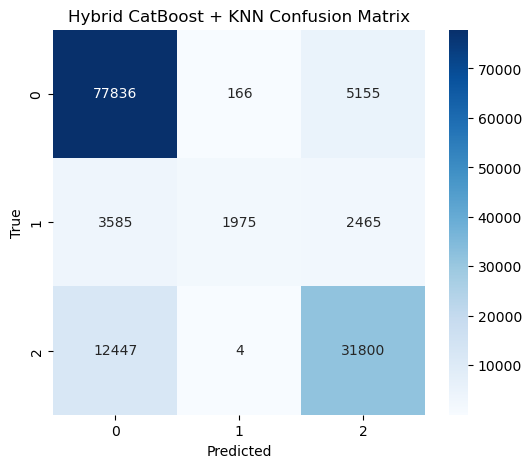

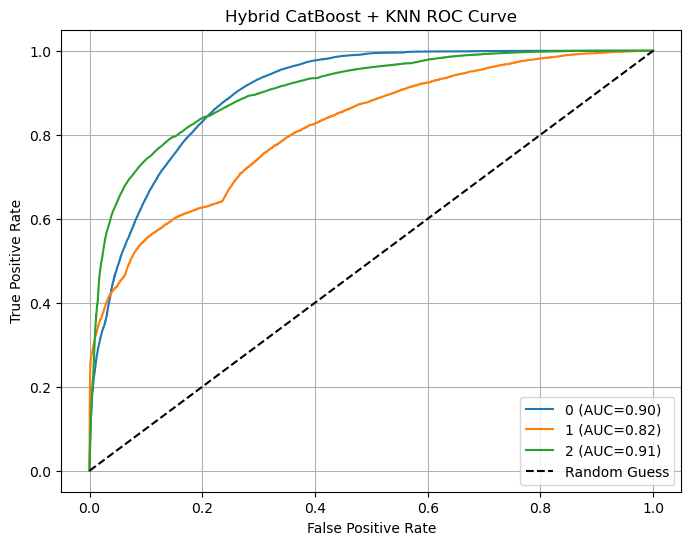


Average Macro F1 across folds: 0.6759


In [61]:


# ==========================
# Helpers for Evaluation
# ==========================
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(title)
    plt.show()

def plot_roc(y_true, y_proba, classes, title):
    y_bin = np.eye(len(classes))[y_true]
    plt.figure(figsize=(8,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
        plt.plot(fpr, tpr, label=f"{cls} (AUC={auc(fpr,tpr):.2f})")
    plt.plot([0,1],[0,1],"k--", label="Random Guess")
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True)
    plt.show()

# ==========================
# Hybrid CatBoost + KNN
# ==========================
def hybrid_catboost_knn_cv(X, y, n_splits=5):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    all_true, all_pred, all_proba = [], [], []
    fold_scores = []

    for fold, (train_idx, val_idx) in enumerate(skf.split(X, y_encoded), 1):
        print(f"\n🔹 Fold {fold}/{n_splits}")
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y_encoded[train_idx], y_encoded[val_idx]

        # --- CatBoost ---
        cat = CatBoostClassifier(
            iterations=200,
            depth=6,
            learning_rate=0.05,
            loss_function="MultiClass",
            eval_metric="MultiClass",
            verbose=0,
            random_state=42
        )
        cat.fit(X_train, y_train)
        cat_proba = cat.predict_proba(X_val)

        # --- KNN ---
        knn = KNeighborsClassifier(n_neighbors=7)
        knn.fit(X_train, y_train)
        knn_proba = knn.predict_proba(X_val)

        # --- Hybrid (average of probabilities) ---
        hybrid_proba = (cat_proba + knn_proba) / 2
        hybrid_pred = hybrid_proba.argmax(axis=1)

        # Store results
        all_true.extend(y_val)
        all_pred.extend(hybrid_pred)
        all_proba.extend(hybrid_proba)

        fold_f1 = f1_score(y_val, hybrid_pred, average="macro")
        fold_scores.append(fold_f1)
        print(f"Fold {fold} Macro F1: {fold_f1:.4f}")

    # Convert to numpy
    all_true = np.array(all_true)
    all_pred = np.array(all_pred)
    all_proba = np.array(all_proba)
    
        # Final evaluation
    print("\n===== Final Hybrid Evaluation =====")
    class_names = [str(c) for c in classes]   # ensure string names
    print(classification_report(all_true, all_pred, target_names=class_names))
    plot_conf_matrix(all_true, all_pred, class_names, "Hybrid CatBoost + KNN Confusion Matrix")
    plot_roc(all_true, all_proba, class_names, "Hybrid CatBoost + KNN ROC Curve")

    print(f"\nAverage Macro F1 across folds: {np.mean(fold_scores):.4f}")

    return cat, knn, le


cat_model, knn_model, label_encoder = hybrid_catboost_knn_cv(X, y, n_splits=5)


# 8. Feature Importance


===== Fold 1 =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.84      0.27      0.41      1605
has_Diabetes       0.82      0.73      0.77      8851

    accuracy                           0.83     27087
   macro avg       0.83      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



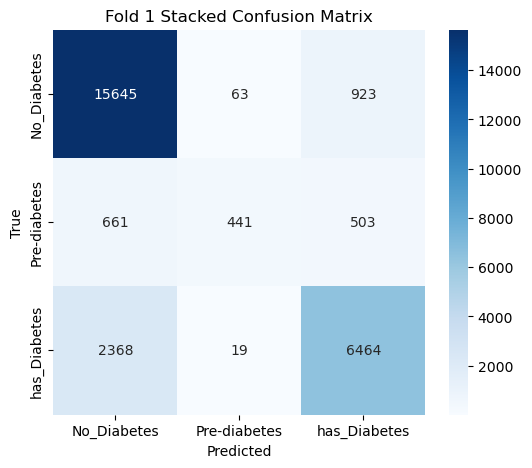


===== Fold 2 =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16632
Pre-diabetes       0.88      0.30      0.45      1605
has_Diabetes       0.82      0.74      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.66      0.70     27087
weighted avg       0.84      0.83      0.82     27087



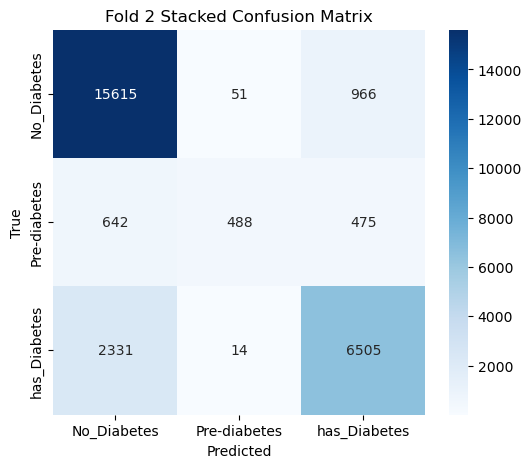


===== Fold 3 =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16632
Pre-diabetes       0.87      0.27      0.41      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.84      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087



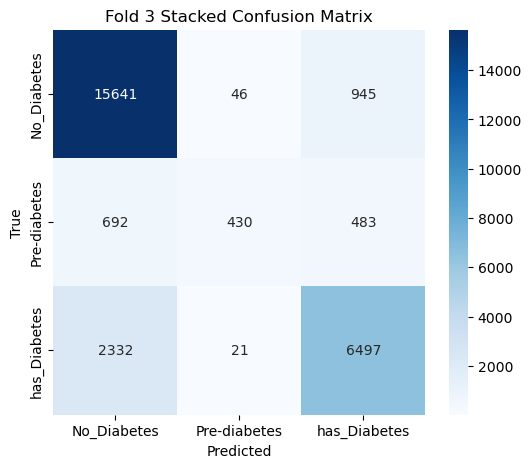


===== Fold 4 =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.88      0.28      0.42      1605
has_Diabetes       0.83      0.74      0.78      8850

    accuracy                           0.84     27086
   macro avg       0.85      0.65      0.70     27086
weighted avg       0.84      0.84      0.83     27086



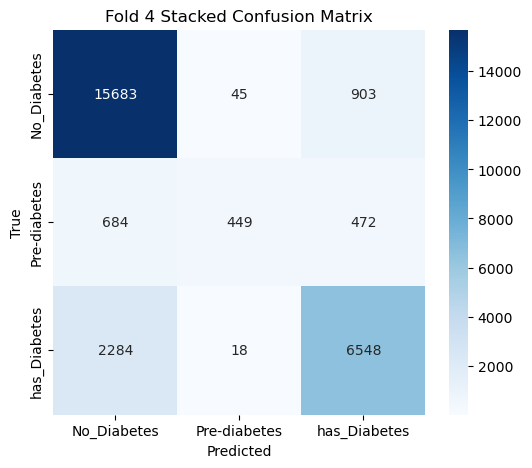


===== Fold 5 =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16631
Pre-diabetes       0.84      0.27      0.41      1605
has_Diabetes       0.81      0.73      0.77      8850

    accuracy                           0.83     27086
   macro avg       0.83      0.65      0.69     27086
weighted avg       0.83      0.83      0.82     27086



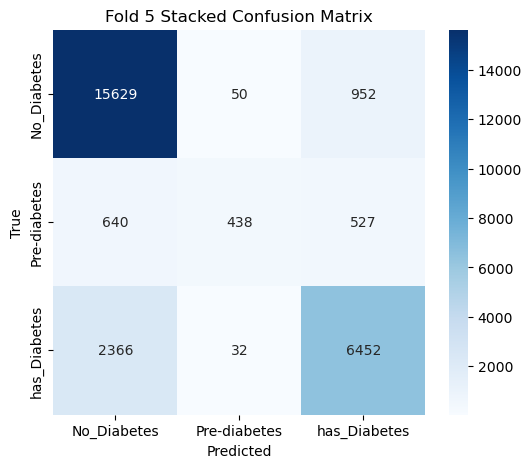


===== Overall Stacked Model Performance =====
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     83157
Pre-diabetes       0.86      0.28      0.42      8025
has_Diabetes       0.82      0.73      0.77     44251

    accuracy                           0.83    135433
   macro avg       0.84      0.65      0.69    135433
weighted avg       0.83      0.83      0.82    135433


CatBoost Feature Importance:
            Feature Id  Importances
0         NoFreq_Phys    45.425470
1   EverBeenDiagnosed    23.087335
2                 Age     4.668905
3                 BMI     3.452848
4        UnderBPmedic     3.439999
5         hadHighChol     3.085454
6             Incomes     2.720807
7        isNotHealthy     2.529281
8     NoStrenghtExerc     2.242895
9         LastCheckUp     1.872500
10         StudyLevel     1.609859
11             HighBP     1.037615
12             Female     1.011216
13          KidneyDis     0.913214
14    DrinkerCat

InvalidParameterError: The 'estimator' parameter of permutation_importance must be an object implementing 'fit'. Got <function hybrid_catboost_nn_cv.<locals>.<lambda> at 0x00000292418F09D0> instead.

In [50]:
from sklearn.inspection import permutation_importance

# ==========================
# 1. Neural Network
# ==========================
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )
    def forward(self, x):
        return self.layers(x)

def train_nn(model, X_train, y_train, X_val, y_val, epochs=30, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    # class weighting for imbalanced classes
    classes, counts = np.unique(y_train, return_counts=True)
    weights = torch.tensor([1.0 / c for c in counts], dtype=torch.float32).to(device)
    class_weights = weights / weights.sum() * len(classes)
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    
    X_train = torch.tensor(X_train.values if hasattr(X_train, "values") else X_train, dtype=torch.float32).to(device)
    y_train = torch.tensor(y_train.values if hasattr(y_train, "values") else y_train, dtype=torch.long).to(device)
    X_val   = torch.tensor(X_val.values if hasattr(X_val, "values") else X_val, dtype=torch.float32).to(device)
    y_val   = torch.tensor(y_val.values if hasattr(y_val, "values") else y_val, dtype=torch.long).to(device)
    
    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()
        
    return model

# ==========================
# 2. Helpers
# ==========================
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

def plot_roc(y_true, y_proba, classes, title):
    y_bin = np.eye(len(classes))[y_true]
    plt.figure(figsize=(8,6))
    for i, cls in enumerate(classes):
        fpr, tpr, _ = roc_curve(y_bin[:, i], y_proba[:, i])
        plt.plot(fpr, tpr, label=f"{cls} (AUC={auc(fpr,tpr):.2f})")
    plt.plot([0,1],[0,1],"k--", label="Random Guess")
    plt.title(title)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid(True)
    plt.show()

# ==========================
# 3. Hybrid CatBoost + NN with CV and XAI
# ==========================
def hybrid_catboost_nn_cv(X, y, n_splits=5, device="cuda", nn_epochs=30):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    
    all_preds = []
    all_y = []

    fold_num = 1
    for train_idx, val_idx in skf.split(X, y_encoded):
        print(f"\n===== Fold {fold_num} =====")
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y_encoded[train_idx], y_encoded[val_idx]
        
        # ---- CatBoost ----
        cat = CatBoostClassifier(
            iterations=300,
            depth=6,
            learning_rate=0.05,
            loss_function='MultiClass',
            verbose=0,
            random_state=42
        )
        cat.fit(X_train, y_train)
        cat_val_pred = cat.predict_proba(X_val)
        
        # ---- Neural Net ----
        nn_model = SimpleNN(input_dim=X_train.shape[1], output_dim=len(classes))
        nn_model = train_nn(nn_model, X_train, y_train, X_val, y_val, epochs=nn_epochs, device=device)
        nn_model.eval()
        with torch.no_grad():
            nn_val_pred = nn_model(torch.tensor(X_val.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()
        
        # ---- Stack predictions for meta-classifier ----
        stack_val = np.hstack([cat_val_pred, nn_val_pred])
        meta_clf = LogisticRegression(max_iter=500)
        meta_clf.fit(stack_val, y_val)  # simple fold-level stacking
        final_pred = meta_clf.predict(stack_val)
        
        print(classification_report(y_val, final_pred, target_names=classes))
        plot_conf_matrix(y_val, final_pred, classes, f"Fold {fold_num} Stacked Confusion Matrix")
        
        all_preds.append(final_pred)
        all_y.append(y_val)
        fold_num += 1
        
    # ---- Overall evaluation ----
    all_preds = np.concatenate(all_preds)
    all_y = np.concatenate(all_y)
    print("\n===== Overall Stacked Model Performance =====")
    print(classification_report(all_y, all_preds, target_names=classes))
    
    # ---- CatBoost Feature Importance ----
    fi = cat.get_feature_importance(prettified=True)
    print("\nCatBoost Feature Importance:\n", fi)
    
    # ---- NN Permutation Importance ----
    # Approximate XAI: train NN on full data for permutation importance
    nn_model_full = SimpleNN(input_dim=X.shape[1], output_dim=len(classes))
    nn_model_full = train_nn(nn_model_full, X, y_encoded, X, y_encoded, epochs=nn_epochs, device=device)
    
    def nn_predict(X_input):
        nn_model_full.eval()
        with torch.no_grad():
            return nn_model_full(torch.tensor(X_input.values, dtype=torch.float32).to(device)).softmax(dim=1).cpu().numpy()
    
    perm_importance = permutation_importance(lambda Xi: nn_predict(Xi).argmax(axis=1), X, y_encoded, n_repeats=5, random_state=42)
    nn_importances = pd.DataFrame({"feature": X.columns, "importance": perm_importance.importances_mean}).sort_values(by="importance", ascending=False)
    print("\nNeural Net Permutation Importance:\n", nn_importances)

    return cat, nn_model_full, meta_clf, le

# ==========================
# Example usage
# ==========================
# Feature matrix
X = diabetes1.drop(columns=['Diabetes'], errors='ignore')

# Target
y = diabetes1['Diabetes']
cat_model, nn_model, meta_model, label_encoder = hybrid_catboost_nn_cv(X, y, n_splits=5, device="cuda", nn_epochs=30)


pip install numpy==1.26.4 --upgrade --force-reinstall



In [48]:

from sklearn.inspection import permutation_importance

# ----------------------------
# 1. Define NN
# ----------------------------
class SimpleNN(nn.Module):
    def __init__(self, input_dim, hidden_dim=64, output_dim=3):
        super(SimpleNN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(hidden_dim, output_dim)
        )
    def forward(self, x):
        return self.layers(x)

# ----------------------------
# 2. Train NN
# ----------------------------
def train_nn(model, X_train, y_train, X_val, y_val, epochs=30, lr=1e-3, device="cuda"):
    model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.CrossEntropyLoss()

    X_train = torch.tensor(X_train.values if hasattr(X_train,"values") else X_train, dtype=torch.float32).to(device)
    y_train = torch.tensor(y_train.values if hasattr(y_train,"values") else y_train, dtype=torch.long).to(device)
    X_val = torch.tensor(X_val.values if hasattr(X_val,"values") else X_val, dtype=torch.float32).to(device)
    y_val = torch.tensor(y_val.values if hasattr(y_val,"values") else y_val, dtype=torch.long).to(device)

    for epoch in range(epochs):
        model.train()
        optimizer.zero_grad()
        outputs = model(X_train)
        loss = criterion(outputs, y_train)
        loss.backward()
        optimizer.step()
    return model

# ----------------------------
# 3. Confusion matrix plot
# ----------------------------
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

# ----------------------------
# 4. NN Wrapper for sklearn
# ----------------------------
from sklearn.base import BaseEstimator, ClassifierMixin
class NNWrapper(BaseEstimator, ClassifierMixin):
    def __init__(self, model, device="cuda"):
        self.model = model
        self.device = device
    def fit(self, X, y=None):
        return self  # already trained
    def predict(self, X):
        self.model.eval()
        with torch.no_grad():
            X_tensor = torch.tensor(X.values if hasattr(X,"values") else X, dtype=torch.float32).to(self.device)
            preds = self.model(X_tensor).softmax(dim=1).cpu().numpy()
            return preds.argmax(axis=1)
    def predict_proba(self, X):
        self.model.eval()
        with torch.no_grad():
            X_tensor = torch.tensor(X.values if hasattr(X,"values") else X, dtype=torch.float32).to(self.device)
            return self.model(X_tensor).softmax(dim=1).cpu().numpy()

# ----------------------------
# 5. Hybrid CatBoost + NN with CV
# ----------------------------
def hybrid_catboost_nn_cv(X, y, n_splits=5, device="cuda", nn_epochs=30):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    all_preds = []
    fold = 0

    # Store feature importances
    cat_importances = np.zeros(X.shape[1])
    nn_importances = np.zeros(X.shape[1])

    for train_idx, test_idx in skf.split(X, y_encoded):
        fold += 1
        print(f"\n🔹 Fold {fold}/{n_splits}")

        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

        # ---- CatBoost ----
        cat = CatBoostClassifier(
            iterations=300,
            depth=8,
            learning_rate=0.05,
            loss_function='MultiClass',
            eval_metric='MultiClass',
            verbose=0,
            random_state=42
        )
        cat.fit(X_train, y_train)
        cat_importances += cat.get_feature_importance() / n_splits

        # ---- NN ----
        nn_model = SimpleNN(input_dim=X.shape[1], output_dim=len(classes))
        nn_model = train_nn(nn_model, X_train, y_train, X_test, y_test, epochs=nn_epochs, device=device)
        nn_wrapper = NNWrapper(nn_model, device=device)

        # Permutation importance for NN (on this fold)
        perm = permutation_importance(nn_wrapper, X_test, y_test, n_repeats=3, random_state=42)
        nn_importances += perm.importances_mean / n_splits

        # ---- Stacking ----
        cat_train_proba = cat.predict_proba(X_train)
        nn_train_proba  = nn_wrapper.predict_proba(X_train)
        stack_train = np.hstack([cat_train_proba, nn_train_proba])

        cat_test_proba = cat.predict_proba(X_test)
        nn_test_proba  = nn_wrapper.predict_proba(X_test)
        stack_test = np.hstack([cat_test_proba, nn_test_proba])

        meta_clf = LogisticRegression(max_iter=500)
        meta_clf.fit(stack_train, y_train)
        final_pred = meta_clf.predict(stack_test)
        all_preds.extend(final_pred)

        print("Fold Classification Report:")
        print(classification_report(y_test, final_pred, target_names=classes))

    print("\n🏆 Average Feature Importance (CatBoost):")
    cat_df = pd.DataFrame({"feature": X.columns, "importance": cat_importances}).sort_values(by="importance", ascending=False)
    print(cat_df)

    print("\n🏆 Average Feature Importance (NN Permutation):")
    nn_df = pd.DataFrame({"feature": X.columns, "importance": nn_importances}).sort_values(by="importance", ascending=False)
    print(nn_df)

    return cat, nn_model, meta_clf, le

# ----------------------------
# 6. Example Usage
# ----------------------------
# X = your feature dataframe, y = your target series
cat_model, nn_model, meta_model, label_encoder = hybrid_catboost_nn_cv(X, y, n_splits=5, device="cuda", nn_epochs=30)



🔹 Fold 1/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.93      0.88     16631
Pre-diabetes       0.76      0.29      0.42      1605
has_Diabetes       0.81      0.73      0.77      8851

    accuracy                           0.83     27087
   macro avg       0.80      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087


🔹 Fold 2/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.89     16632
Pre-diabetes       0.76      0.33      0.46      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.81      0.67      0.71     27087
weighted avg       0.83      0.83      0.82     27087


🔹 Fold 3/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.93      0.88     16632
Pre-diabe


🔹 Fold 1/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16631
Pre-diabetes       0.93      0.25      0.40      1605
has_Diabetes       0.83      0.71      0.77      8851

    accuracy                           0.83     27087
   macro avg       0.86      0.64      0.69     27087
weighted avg       0.84      0.83      0.82     27087



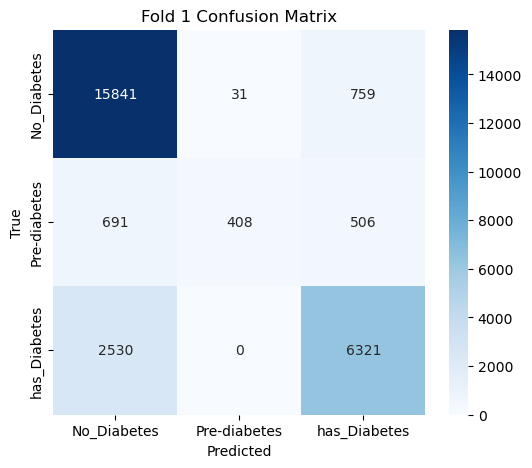


🔹 Fold 2/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.93      0.29      0.45      1605
has_Diabetes       0.84      0.72      0.77      8850

    accuracy                           0.84     27087
   macro avg       0.87      0.65      0.70     27087
weighted avg       0.84      0.84      0.82     27087



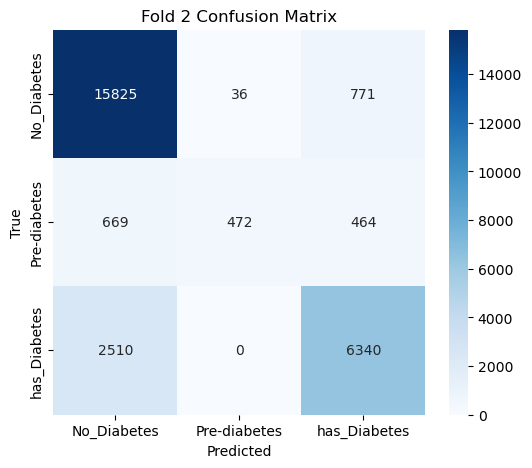


🔹 Fold 3/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16632
Pre-diabetes       0.94      0.25      0.40      1605
has_Diabetes       0.84      0.72      0.77      8850

    accuracy                           0.84     27087
   macro avg       0.87      0.64      0.69     27087
weighted avg       0.84      0.84      0.82     27087



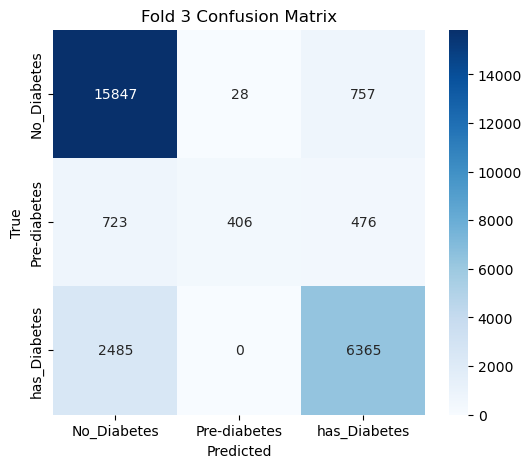


🔹 Fold 4/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.96      0.89     16631
Pre-diabetes       0.95      0.27      0.42      1605
has_Diabetes       0.84      0.72      0.78      8850

    accuracy                           0.84     27086
   macro avg       0.87      0.65      0.70     27086
weighted avg       0.84      0.84      0.83     27086



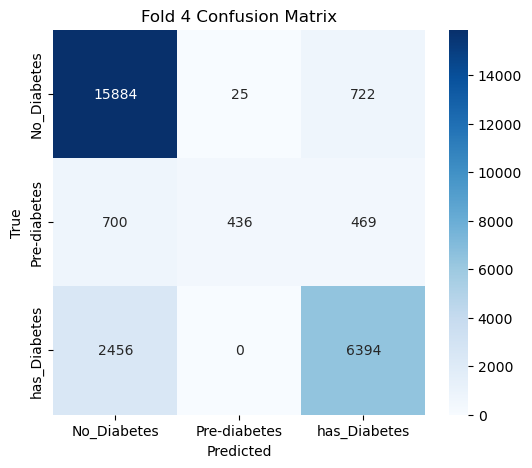


🔹 Fold 5/5
Fold Classification Report:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     16631
Pre-diabetes       0.94      0.25      0.40      1605
has_Diabetes       0.83      0.71      0.77      8850

    accuracy                           0.83     27086
   macro avg       0.87      0.64      0.69     27086
weighted avg       0.84      0.83      0.82     27086



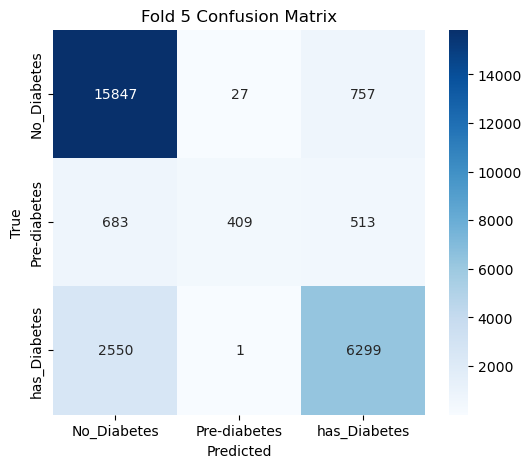


🏆 Average Feature Importance (Permutation):
              feature  importance
11        NoFreq_Phys    0.163628
18  EverBeenDiagnosed    0.035551
8        isNotHealthy    0.008472
16                BMI    0.006574
17        hadHighChol    0.004777
12                Age    0.003627
7             Incomes    0.003326
5           KidneyDis    0.002482
19       UnderBPmedic    0.002323
1     NoStrenghtExerc    0.001551
0         LastCheckUp    0.001427
6          StudyLevel    0.001041
13    DrinkerCategory    0.000991
15             Female    0.000650
3         HeartAttack    0.000359
14         had_Stroke    0.000359
9    DaysNotGoodPhysq    0.000028
2              HighBP    0.000015
4        HeartDisease   -0.000010
10      isWeakPhyscly   -0.000027

🏆 Overall Macro F1: 0.3291


In [49]:

from sklearn.inspection import permutation_importance

# ----------------------------
# 1. Confusion matrix plot
# ----------------------------
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=classes, yticklabels=classes)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(title)
    plt.show()

# ----------------------------
# 2. CatBoost CV with Permutation Importance
# ----------------------------
def catboost_cv_xai(X, y, n_splits=5):
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    classes = le.classes_

    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

    all_preds = []
    fold = 0
    feature_importances = np.zeros(X.shape[1])

    for train_idx, test_idx in skf.split(X, y_encoded):
        fold += 1
        print(f"\n🔹 Fold {fold}/{n_splits}")

        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y_encoded[train_idx], y_encoded[test_idx]

        # ---- CatBoost ----
        cat = CatBoostClassifier(
            iterations=300,
            depth=8,
            learning_rate=0.05,
            loss_function='MultiClass',
            eval_metric='MultiClass',
            verbose=0,
            random_state=42
        )
        cat.fit(X_train, y_train)

        # Predictions
        y_pred = cat.predict(X_test)
        all_preds.extend(y_pred)

        # Classification report
        print("Fold Classification Report:")
        print(classification_report(y_test, y_pred, target_names=classes))

        # Confusion matrix
        plot_conf_matrix(y_test, y_pred, classes, f"Fold {fold} Confusion Matrix")

        # Permutation importance
        perm = permutation_importance(cat, X_test, y_test, n_repeats=5, random_state=42)
        feature_importances += perm.importances_mean / n_splits

    # Aggregate permutation importance
    fi_df = pd.DataFrame({"feature": X.columns, "importance": feature_importances}).sort_values(by="importance", ascending=False)
    print("\n🏆 Average Feature Importance (Permutation):")
    print(fi_df)

    # Overall macro F1
    overall_f1 = f1_score(y_encoded, all_preds, average='macro')
    print(f"\n🏆 Overall Macro F1: {overall_f1:.4f}")

    return cat, fi_df, le

# ----------------------------
# 3. Example Usage
# ----------------------------
# X = your feature dataframe, y = your target series
cat_model, feature_importance_df, label_encoder = catboost_cv_xai(X, y, n_splits=5)


# BOOTSTRAP resampling approach TEST  or  DELONG's TEST

In [15]:
# ========================================
# 📌 Complete Script: Multiclass AUC Comparison (Bootstrap)
# ========================================
import numpy as np
import pandas as pd
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize, LabelEncoder
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# ========================================
# STEP 1: Train Models and Get Probabilities
# ========================================

# Assume you already have:
# X_train, X_test, y_train, y_test defined

# Encode labels
le = LabelEncoder()
y_train = le.fit_transform(y_train)
y_test = le.transform(y_test)
classes = le.classes_

# Train models
xgb = XGBClassifier(eval_metric="mlogloss", use_label_encoder=False, random_state=42)
lgb = LGBMClassifier(random_state=42)
cat = CatBoostClassifier(verbose=0, random_state=42)

xgb.fit(X_train, y_train)
lgb.fit(X_train, y_train)
cat.fit(X_train, y_train)

# Predict probabilities
y_test_proba_xgb = xgb.predict_proba(X_test)
y_test_proba_lgb = lgb.predict_proba(X_test)
y_test_proba_cat = cat.predict_proba(X_test)

model_probs = {
    "XGBoost": y_test_proba_xgb,
    "LightGBM": y_test_proba_lgb,
    "CatBoost": y_test_proba_cat
}
model_names = list(model_probs.keys())

# ========================================
# STEP 2: Macro-Averaged AUC
# ========================================

def compute_macro_auc(y_true, y_proba, classes):
    """Compute macro-average AUC for multiclass."""
    y_bin = label_binarize(y_true, classes=range(len(classes)))
    return roc_auc_score(y_bin, y_proba, average="macro", multi_class="ovr")

# Baseline AUCs
base_aucs = {m: compute_macro_auc(y_test, proba, classes) for m, proba in model_probs.items()}
print("\n🔹 Macro AUCs:")
print(base_aucs)

# ========================================
# STEP 3: Bootstrap Pairwise Comparisons
# ========================================

def bootstrap_auc_test(y_true, model_probs, model_names, classes, n_bootstrap=1000, seed=42):
    """Pairwise bootstrap test for macro AUC differences."""
    rng = np.random.RandomState(seed)
    results = []

    for i in range(len(model_names)):
        for j in range(i + 1, len(model_names)):
            m1, m2 = model_names[i], model_names[j]

            diffs = []
            for _ in range(n_bootstrap):
                # sample with replacement
                idx = rng.choice(len(y_true), size=len(y_true), replace=True)
                y_resampled = y_true[idx]
                proba1 = model_probs[m1][idx]
                proba2 = model_probs[m2][idx]

                auc1 = compute_macro_auc(y_resampled, proba1, classes)
                auc2 = compute_macro_auc(y_resampled, proba2, classes)
                diffs.append(auc1 - auc2)

            diffs = np.array(diffs)
            diff_mean = diffs.mean()
            ci_low, ci_high = np.percentile(diffs, [2.5, 97.5])
            p_value = np.mean(diffs <= 0) if diff_mean > 0 else np.mean(diffs >= 0)

            results.append({
                "Model1": m1,
                "Model2": m2,
                "AUC1": base_aucs[m1],
                "AUC2": base_aucs[m2],
                "Diff": diff_mean,
                "95% CI": (ci_low, ci_high),
                "p-value": p_value
            })

    return pd.DataFrame(results)

# Run bootstrap test
df_bootstrap = bootstrap_auc_test(y_test, model_probs, model_names, classes, n_bootstrap=1000)

print("\n🔹 Bootstrap Results (Macro-Averaged AUC Comparison):")
print(df_bootstrap)


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [15:12:15] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002930 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 111
[LightGBM] [Info] Number of data points in the train set: 108346, number of used features: 20
[LightGBM] [Info] Start training from score -0.487752
[LightGBM] [Info] Start training from score -2.825912
[LightGBM] [Info] Start training from score -1.118590

🔹 Macro AUCs:
{'XGBoost': 0.8853220605843157, 'LightGBM': 0.8878401977367303, 'CatBoost': 0.8853195487876334}

🔹 Bootstrap Results (Macro-Averaged AUC Comparison):
     Model1    Model2      AUC1     AUC2          Diff  \
0   XGBoost  LightGBM  0.885322  0.88784 -2.525925e-03   
1   XGBoost  CatBoost  0.885322  0.88532  9.539154e-07   
2  LightGBM  CatBoost  0.887840  0.88532  2.471487e-03   

                                             95% CI  p-value  
0  (-0.00375415841878688

# 9. Model training & Hyperparameter Tuning

### a) hybrid KAN + PSO + Adam script with the CPU/GPU

2025-09-05 18:28:42,196 - pyswarms.single.global_best - INFO - Optimize for 50 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}


Using device: cuda


pyswarms.single.global_best: 100%|██████████|50/50, best_cost=0.972
2025-09-05 18:28:53,597 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.9719497561454773, best pos: [ 1.59520333e-01  4.99049792e-03  4.28759800e-01 -1.23610392e+00
  1.78817382e-01 -6.95434860e-02  1.98549212e-02 -1.69262386e-01
 -1.04651024e+00  6.70108871e-02 -3.57969189e-01 -4.70988229e-01
 -2.19595244e-01 -3.95571202e-01 -2.32824443e-01 -5.62884049e-02
 -2.67102482e-01 -1.79222733e-01 -6.11626673e-02 -6.98326165e-02
 -2.62984234e-01  5.93780366e-02 -8.63337576e-01 -1.31114052e-01
 -1.04543638e+00  6.16095899e-01 -3.77078546e-01 -1.79914431e-01
 -3.18688745e-01 -9.38521030e-01 -9.31864355e-01 -6.22527576e-01
 -7.64293990e-01 -8.92698394e-01 -1.14822559e-01 -5.79858552e-01
 -4.91397032e-01 -7.51342941e-02 -3.64978130e-01 -5.93062945e-01
  3.53288517e-01 -2.23758693e-01  2.15648159e-01  5.88402655e-01
 -6.99474458e-01 -1.28056383e+00 -1.84999695e-01  4.09671065e-02
 -1.28656614e-01 -6.1716


Classification Report (Test):
              precision    recall  f1-score   support

 No_Diabetes       0.88      0.70      0.78     16632
Pre-diabetes       0.31      0.51      0.39      1605
has_Diabetes       0.65      0.82      0.72      8856

    accuracy                           0.73     27093
   macro avg       0.61      0.68      0.63     27093
weighted avg       0.77      0.73      0.74     27093



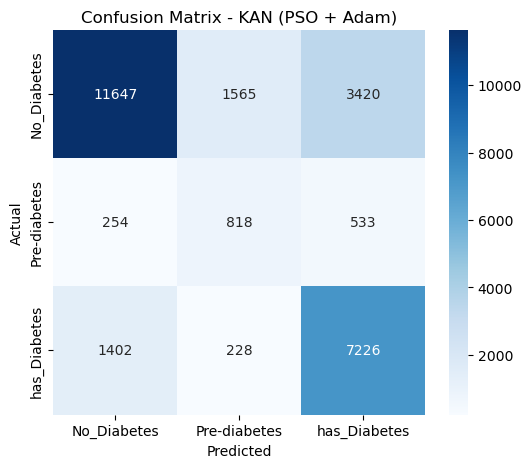

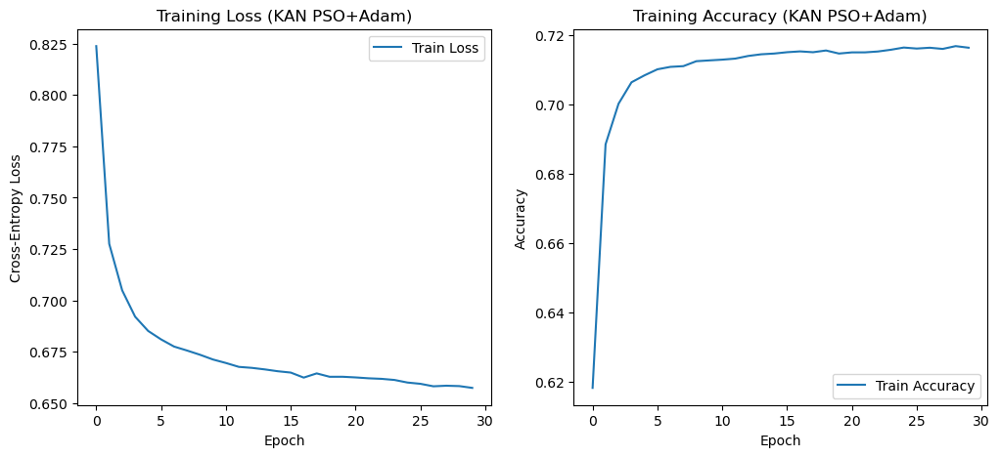

In [5]:

# ================== Load Data ==================
diabetes1 = pd.read_csv("diabetes1.csv")
X = diabetes1.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])
classes = np.unique(y_encoded)

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Balance training set
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Scale
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_test_scaled = scaler.transform(X_test)

# ================== KAN Neural Network ==================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

class KAN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(KAN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.drop1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.drop1(x)
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# ================== Flatten/Unflatten Weights ==================
def flatten_weights(model):
    return np.concatenate([p.detach().cpu().numpy().ravel() for p in model.parameters()])

def unflatten_weights(model, flat_weights):
    pointer = 0
    for p in model.parameters():
        numel = p.numel()
        new_weights = flat_weights[pointer:pointer+numel].reshape(p.shape)
        p.data = torch.tensor(new_weights, dtype=torch.float32, device=device)
        pointer += numel

# ================== Fitness Function for PSO ==================
def fitness_function(flat_weights):
    n_particles = flat_weights.shape[0]
    losses = []
    criterion = nn.CrossEntropyLoss()
    
    for i in range(n_particles):
        model = KAN(input_size, hidden_size, output_size).to(device)
        unflatten_weights(model, flat_weights[i])
        model.eval()
        X_tensor = torch.FloatTensor(X_train_res).to(device)
        y_tensor = torch.LongTensor(y_train_res).to(device)
        with torch.no_grad():
            outputs = model(X_tensor)
            loss = criterion(outputs, y_tensor)
        losses.append(loss.item())
    return np.array(losses)

# ================== Global PSO ==================
input_size = X_train_res.shape[1]
hidden_size = 16
output_size = len(classes)

dummy_model = KAN(input_size, hidden_size, output_size)
dim = len(flatten_weights(dummy_model))

options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=dim, options=options)
best_cost, best_pos = optimizer.optimize(fitness_function, iters=50)

# ================== Local Fine-tuning with Adam ==================
model = KAN(input_size, hidden_size, output_size).to(device)
unflatten_weights(model, best_pos)  # Initialize with PSO weights

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

train_ds = TensorDataset(torch.FloatTensor(X_train_res), torch.LongTensor(y_train_res))
train_loader = DataLoader(train_ds, batch_size=32, shuffle=True)

history = {"train_loss": [], "train_acc": []}
epochs = 30

for epoch in range(epochs):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for xb, yb in train_loader:
        xb, yb = xb.to(device), yb.to(device)
        optimizer.zero_grad()
        outputs = model(xb)
        loss = criterion(outputs, yb)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * xb.size(0)
        _, preds = torch.max(outputs, 1)
        correct += (preds == yb).sum().item()
        total += yb.size(0)
    history["train_loss"].append(total_loss/len(train_ds))
    history["train_acc"].append(correct/total)

# ================== Evaluation ==================
model.eval()
with torch.no_grad():
    X_test_tensor = torch.FloatTensor(X_test_scaled).to(device)
    outputs = model(X_test_tensor)
    y_pred_test = torch.argmax(outputs, axis=1).cpu().numpy()


print("\nClassification Report (Test):")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

cm = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KAN (PSO + Adam)")
plt.show()

# ================== Plot Training Loss/Accuracy ==================
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.plot(history["train_loss"], label="Train Loss")
plt.xlabel("Epoch")
plt.ylabel("Cross-Entropy Loss")
plt.title("Training Loss (KAN PSO+Adam)")
plt.legend()

plt.subplot(1,2,2)
plt.plot(history["train_acc"], label="Train Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training Accuracy (KAN PSO+Adam)")
plt.legend()
plt.show()


In [ ]:

PSO global search: Finds a good starting weight configuration.

Adam fine-tuning: Converges the network efficiently.

Device-safe: All weights and tensors are explicitly moved to device (CPU or GPU).

Includes classification report, confusion matrix, training loss, and accuracy plots.

In [10]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, roc_curve, auc

# ================== Binarize labels for ROC ==================
y_test_bin = label_binarize(y_test, classes=classes)

# ================== Evaluation with AUC ==================
# ================== Evaluation with AUC ==================
model.eval()
with torch.no_grad():
    # --- Train predictions ---
    X_train_tensor = torch.FloatTensor(X_train_scaled).to(device)
    outputs_train = model(X_train_tensor)
    y_proba_train = torch.softmax(outputs_train, dim=1).cpu().numpy()
    y_train_pred = np.argmax(y_proba_train, axis=1)

    # --- Test predictions ---
    X_test_tensor = torch.FloatTensor(X_test_scaled).to(device)
    outputs_test = model(X_test_tensor)
    y_proba_test = torch.softmax(outputs_test, dim=1).cpu().numpy()
    y_pred_test = np.argmax(y_proba_test, axis=1)

# ================== Reports ==================
print("\nTRAIN:")
print(classification_report(y_train_res, y_train_pred, target_names=le.classes_))

print("\nTEST:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

# Confusion matrix
cm = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=le.classes_, yticklabels=le.classes_)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix - KAN (PSO + Adam)")
plt.show()

# ================== ROC and AUC ==================
fpr, tpr, roc_auc = {}, {}, {}
for i, cls in enumerate(classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba_test[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Macro-average
all_fpr = np.unique(np.concatenate([fpr[i] for i in classes]))
mean_tpr = np.zeros_like(all_fpr)
for i in classes:
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
mean_tpr /= len(classes)
macro_auc = auc(all_fpr, mean_tpr)

# Plot ROC curves
plt.figure(figsize=(8,6))
for i, cls in enumerate(classes):
    plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
plt.plot(all_fpr, mean_tpr, color='navy', linestyle='--',
         label=f"Macro-average (AUC = {macro_auc:.2f})", linewidth=2)
plt.plot([0,1],[0,1],'k--', label='Chance')
plt.title("KAN (PSO + Adam) - ROC Curves")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid()
plt.show()


NameError: name 'X_train_scaled' is not defined

# HYPERPARAMETER TUNING

In [30]:

# ==================== Load Data ====================
diabetes1 = pd.read_csv("diabetes1.csv")

# Feature/Target
X = diabetes1.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le = LabelEncoder()
y_encoded = le.fit_transform(diabetes1['Diabetes'])

# Train/Test Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# Balance with SMOTE
smote = SMOTE(random_state=42)
X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

# Scale
scaler = StandardScaler()
X_train_res = scaler.fit_transform(X_train_res)
X_test = scaler.transform(X_test)

# Binarize labels for ROC
classes = np.unique(y_encoded)
y_test_bin = label_binarize(y_test, classes=classes)

# ==================== Classical ML Models ====================
models = {
    #"Logistic Regression": LogisticRegression(max_iter=1000),
    #"KNN": KNeighborsClassifier(),
    #"SVM": SVC(probability=True),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="mlogloss"),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0)#,
    #"Neural Network": nn_model
}

# ==================== PyTorch Neural Network ====================
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

class Net(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(Net, self).__init__()
        self.fc1 = nn.Linear(input_dim, 64)
        self.drop1 = nn.Dropout(0.3)
        self.fc2 = nn.Linear(64, 32)
        self.fc3 = nn.Linear(32, output_dim)

    def forward(self, x):
        x = torch.relu(self.fc1(x))
        x = self.drop1(x)
        x = torch.relu(self.fc2(x))
        return self.fc3(x)

# Training function
def train_pytorch_nn(X_train, y_train, X_val, y_val, input_dim, output_dim, epochs=30, batch_size=32, lr=0.001):
    model = Net(input_dim, output_dim).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_ds = TensorDataset(torch.FloatTensor(X_train), torch.LongTensor(y_train))
    val_ds = TensorDataset(torch.FloatTensor(X_val), torch.LongTensor(y_val))
    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)

    history = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

    for epoch in range(epochs):
        model.train()
        train_loss, correct, total = 0, 0, 0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            outputs = model(xb)
            loss = criterion(outputs, yb)
            loss.backward()
            optimizer.step()

            train_loss += loss.item() * xb.size(0)
            _, preds = torch.max(outputs, 1)
            correct += (preds == yb).sum().item()
            total += yb.size(0)

        train_acc = correct / total
        val_loss, correct, total = 0, 0, 0
        model.eval()
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                outputs = model(xb)
                loss = criterion(outputs, yb)
                val_loss += loss.item() * xb.size(0)
                _, preds = torch.max(outputs, 1)
                correct += (preds == yb).sum().item()
                total += yb.size(0)

        val_acc = correct / total
        history["train_loss"].append(train_loss / len(train_ds))
        history["val_loss"].append(val_loss / len(val_ds))
        history["train_acc"].append(train_acc)
        history["val_acc"].append(val_acc)

    return model, history

# Train PyTorch NN
nn_model, history = train_pytorch_nn(
    X_train_res, y_train_res, X_test, y_test,
    input_dim=X_train_res.shape[1], output_dim=len(classes),
    epochs=30
)

# ==================== Evaluate Models ====================
auc_results = pd.DataFrame(columns=["Macro AUC", "Weighted AUC"])
fpr_dict, tpr_dict = {}, {}

for name, model in models.items():
    print(f"\n=== {name} ===")
    model.fit(X_train_res, y_train_res)
    y_pred_train = model.predict(X_train_res)
    y_pred_test = model.predict(X_test)
    y_proba_test = model.predict_proba(X_test)

    print("\nTRAIN:")
    print(classification_report(y_train_res, y_pred_train, target_names=le.classes_))
    print("TEST:")
    print(classification_report(y_test, y_pred_test, target_names=le.classes_))

    macro_auc = roc_auc_score(y_test_bin, y_proba_test, average="macro", multi_class="ovr")
    weighted_auc = roc_auc_score(y_test_bin, y_proba_test, average="weighted", multi_class="ovr")
    auc_results.loc[name] = [macro_auc, weighted_auc]

    fpr, tpr = {}, {}
    for i in range(len(classes)):
        fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_proba_test[:, i])
    fpr_dict[name], tpr_dict[name] = fpr, tpr

# Evaluate PyTorch NN
nn_model.eval()
with torch.no_grad():
    X_test_tensor = torch.FloatTensor(X_test).to(device)
    outputs = nn_model(X_test_tensor)
    y_proba_test = torch.softmax(outputs, dim=1).cpu().numpy()
    y_pred_test = np.argmax(y_proba_test, axis=1)

print("\n=== Neural Network (PyTorch) ===")
print("\nTRAIN:")

train_pred = np.argmax(
    torch.softmax(nn_model(torch.FloatTensor(X_train_res).to(device)), dim=1).detach().cpu().numpy(), axis=1
)

print(classification_report(y_train_res, train_pred, target_names=le.classes_))
print("TEST:")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

macro_auc = roc_auc_score(y_test_bin, y_proba_test, average="macro", multi_class="ovr")
weighted_auc = roc_auc_score(y_test_bin, y_proba_test, average="weighted", multi_class="ovr")
auc_results.loc["Neural Network (PyTorch)"] = [macro_auc, weighted_auc]




Using device: cuda

=== Random Forest ===

TRAIN:
              precision    recall  f1-score   support

 No_Diabetes       0.96      0.98      0.97     66525
Pre-diabetes       1.00      0.99      0.99     66525
has_Diabetes       0.98      0.96      0.97     66525

    accuracy                           0.98    199575
   macro avg       0.98      0.98      0.98    199575
weighted avg       0.98      0.98      0.98    199575

TEST:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.89      0.86     16632
Pre-diabetes       0.56      0.30      0.39      1605
has_Diabetes       0.76      0.73      0.74      8850

    accuracy                           0.80     27087
   macro avg       0.72      0.64      0.67     27087
weighted avg       0.80      0.80      0.80     27087


=== XGBoost ===


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:36:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



TRAIN:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.88     66525
Pre-diabetes       0.94      0.86      0.90     66525
has_Diabetes       0.84      0.80      0.82     66525

    accuracy                           0.87    199575
   macro avg       0.87      0.87      0.87    199575
weighted avg       0.87      0.87      0.87    199575

TEST:
              precision    recall  f1-score   support

 No_Diabetes       0.84      0.94      0.88     16632
Pre-diabetes       0.84      0.27      0.41      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.83      0.65      0.69     27087
weighted avg       0.83      0.83      0.82     27087


=== LightGBM ===
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012500 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `fo

C:\Users\olika\anaconda3\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\olika\anaconda3\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(
C:\Users\olika\anaconda3\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but LGBMClassifier was fitted with feature names
  warnings.warn(



TRAIN:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.94      0.88     66525
Pre-diabetes       0.92      0.83      0.88     66525
has_Diabetes       0.81      0.78      0.80     66525

    accuracy                           0.85    199575
   macro avg       0.85      0.85      0.85    199575
weighted avg       0.85      0.85      0.85    199575

TEST:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.94      0.88     16632
Pre-diabetes       0.89      0.26      0.40      1605
has_Diabetes       0.82      0.73      0.77      8850

    accuracy                           0.83     27087
   macro avg       0.85      0.64      0.69     27087
weighted avg       0.83      0.83      0.82     27087


=== CatBoost ===

TRAIN:
              precision    recall  f1-score   support

 No_Diabetes       0.83      0.95      0.89     66525
Pre-diabetes       0.94      0.87      0.90     66525
has_Diabetes       0.85      0.80  

C:\Users\olika\AppData\Local\Temp\ipykernel_10604\2635782828.py:142: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\torch\csrc\utils\tensor_numpy.cpp:212.)
  X_test_tensor = torch.FloatTensor(X_test).to(device)


              precision    recall  f1-score   support

 No_Diabetes       0.74      0.75      0.74     66525
Pre-diabetes       0.81      0.66      0.73     66525
has_Diabetes       0.68      0.80      0.73     66525

    accuracy                           0.74    199575
   macro avg       0.74      0.74      0.74    199575
weighted avg       0.74      0.74      0.74    199575

TEST:
              precision    recall  f1-score   support

 No_Diabetes       0.87      0.74      0.80     16632
Pre-diabetes       0.27      0.49      0.35      1605
has_Diabetes       0.69      0.78      0.73      8850

    accuracy                           0.74     27087
   macro avg       0.61      0.67      0.63     27087
weighted avg       0.77      0.74      0.75     27087



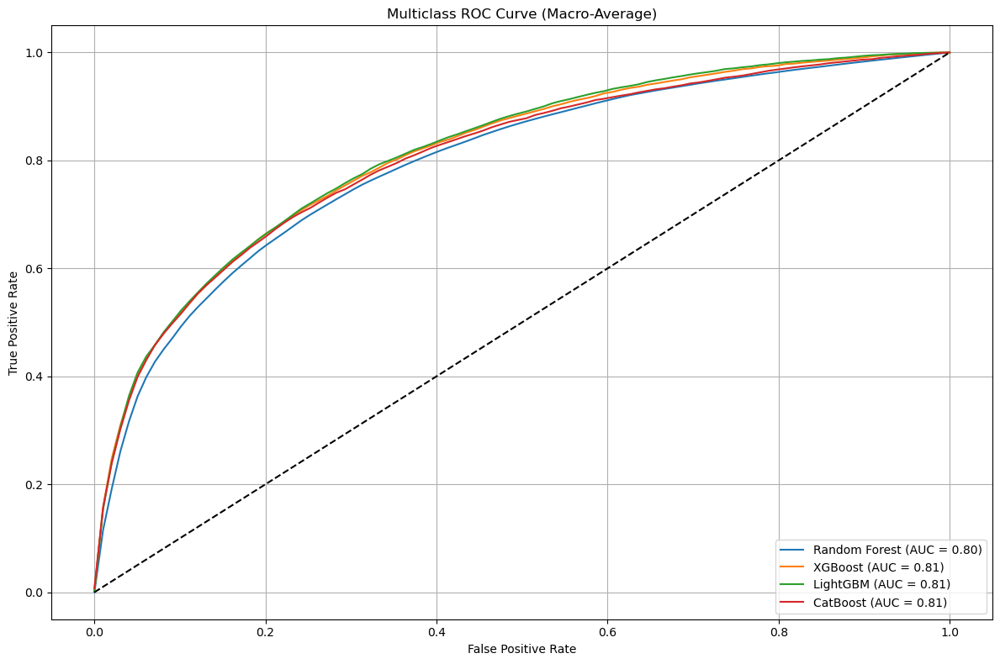

In [5]:

# ==================== Plot ROC Curves ====================
plt.figure(figsize=(12, 8))
for name in auc_results.index:
    fpr, tpr = fpr_dict.get(name, {}), tpr_dict.get(name, {})
    if fpr:
        mean_fpr = np.linspace(0, 1, 100)
        mean_tpr = np.zeros_like(mean_fpr)
        for i in range(len(classes)):
            mean_tpr += np.interp(mean_fpr, fpr[i], tpr[i])
        mean_tpr /= len(classes)
        roc_auc = auc(mean_fpr, mean_tpr)
        plt.plot(mean_fpr, mean_tpr, label=f"{name} (AUC = {roc_auc:.2f})")

plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multiclass ROC Curve (Macro-Average)")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

TRAINING of Neural Network


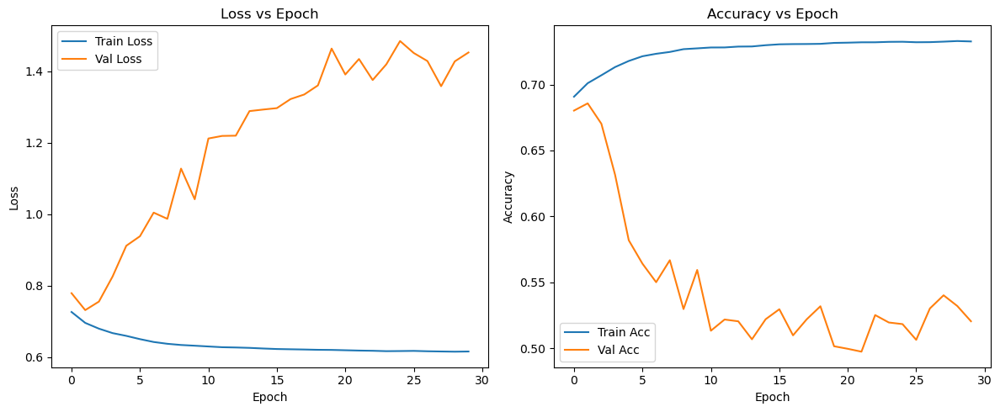


Overfitting Percentage: 28.94%

=== AUC RESULTS ===
                          Macro AUC  Weighted AUC
LightGBM                     0.8152        0.8160
XGBoost                      0.8122        0.8156
CatBoost                     0.8061        0.8148
Random Forest                0.7953        0.7955
Neural Network (PyTorch)     0.7405        0.7211


In [6]:
print("TRAINING of Neural Network")
# ==================== Plot Training History ====================
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(history["train_loss"], label="Train Loss")
plt.plot(history["val_loss"], label="Val Loss")
plt.title("Loss vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history["train_acc"], label="Train Acc")
plt.plot(history["val_acc"], label="Val Acc")
plt.title("Accuracy vs Epoch")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.tight_layout()
plt.show()

# ==================== Overfitting Percentage ====================
final_train_acc = history["train_acc"][-1]
final_val_acc = history["val_acc"][-1]
overfit_pct = ((final_train_acc - final_val_acc) / final_train_acc) * 100
print(f"\nOverfitting Percentage: {overfit_pct:.2f}%")

# ==================== Final AUC Results ====================
auc_results = auc_results.sort_values(by="Macro AUC", ascending=False).round(4)
print("\n=== AUC RESULTS ===")
print(auc_results)


## Grid search using SVC

In [8]:
# Feature/Target
X_b = balanced_df.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le_b = LabelEncoder()
y_encoded_b = le_b.fit_transform(balanced_df['Diabetes'])

# Train/Test Split
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(
    X_b, y_encoded_b, test_size=0.2, stratify=y_encoded_b, random_state=42
)


In [13]:
# Imports
import pandas as pd
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.svm import LinearSVC
from sklearn.experimental import enable_halving_search_cv  # Needed to use HalvingGridSearchCV
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.metrics import classification_report

# Feature/Target Setup
X_b = balanced_df.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le_b = LabelEncoder()
y_encoded_b = le_b.fit_transform(balanced_df['Diabetes'])

# Train/Test Split
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(
    X_b, y_encoded_b, test_size=0.2, stratify=y_encoded_b, random_state=42
)

# Optional: Resample training data (e.g., using SMOTE or RandomOverSampler)
# from imblearn.over_sampling import SMOTE
#smote = SMOTE(random_state=42)
#X_train_res_b, y_train_res_b = smote.fit_resample(X_train_b, y_train_b)

# For now, assuming you're using original training data:
X_train_res_b, y_train_res_b = X_train_b, y_train_b

# Pipeline Components
scaler = StandardScaler()
poly = PolynomialFeatures(interaction_only=True)
svc = LinearSVC(class_weight='balanced', dual=False, max_iter=10000)  # dual=False for better performance

# Pipeline Definition
pipe = Pipeline([
    ('poly', poly),
    ('scaler', scaler),
    ('svc', svc)
])

# Hyperparameter Grid
param_grid = {
    'poly__degree': [1, 2],
    'svc__C': [0.001, 0.01, 0.1, 1]
}

# Cross-Validation Strategy
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=88)

# Grid Search with Successive Halving
grid = HalvingGridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=cv,
    factor=2,
    resource='n_samples',
    max_resources='auto',
    random_state=88,
    n_jobs=-1
)

# Fit Model
grid.fit(X_train_res_b, y_train_res_b)

,estimator,Pipeline(step...iter=10000))])
,param_grid,"{'poly__degree': [1, 2], 'svc__C': [0.001, 0.01, ...]}"
,factor,2
,resource,'n_samples'
,max_resources,'auto'
,min_resources,'exhaust'
,aggressive_elimination,False
,cv,StratifiedKFo... shuffle=True)
,scoring,None
,refit,True
,error_score,nan


In [14]:
# Evaluate on Test Set
y_pred_b = grid.predict(X_test)
print("Best Parameters:", grid.best_params_)
print("Classification Report:\n", classification_report(y_test, y_pred_b, target_names=le_b.classes_))


C:\Users\olika\anaconda3\lib\site-packages\sklearn\utils\validation.py:2749: UserWarning: X does not have valid feature names, but PolynomialFeatures was fitted with feature names
  warnings.warn(


Best Parameters: {'poly__degree': 2, 'svc__C': 1}
Classification Report:
               precision    recall  f1-score   support

 No_Diabetes       0.92      0.61      0.73     51890
Pre-diabetes       0.16      0.25      0.20      1605
has_Diabetes       0.25      0.71      0.37      8856

    accuracy                           0.62     62351
   macro avg       0.44      0.52      0.43     62351
weighted avg       0.80      0.62      0.67     62351



### Using KERNEL TRICK for SVM

In [ ]:
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, StratifiedKFold, GridSearchCV
from sklearn.experimental import enable_halving_search_cv  # optional if you still want halving
import numpy as np

# ===== Feature/Target =====
X_b = balanced_df.drop(columns=['Diabetes', 'DIABTYPE'], errors='ignore')
le_b = LabelEncoder()
y_encoded_b = le_b.fit_transform(balanced_df['Diabetes'])

# Train/Test Split
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(
    X_b, y_encoded_b, test_size=0.2, stratify=y_encoded_b, random_state=42
)

# ===== Pipeline with Kernel SVM =====
scaler = StandardScaler()
svc = SVC(class_weight='balanced', probability=True)  # probability=True for ROC curves

pipe = Pipeline([
    ('scaler', scaler),
    ('svc', svc)
])

# ===== Parameter Grid =====
param_grid = {
    'svc__kernel': ['sigmoid'],#'linear', 'rbf', 'poly'],  # kernel trick
    'svc__C': [0.1, 1, 10],
    'svc__gamma': ['scale', 'auto'],  # only used in rbf, poly, sigmoid
    'svc__degree': [2, 3]             # only used in poly kernel
}

# ===== Cross-Validation =====
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=88)

# ===== Grid Search =====
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=cv,
    n_jobs=-1,
    verbose=2
)

# ===== Fit the model =====
grid.fit(X_train_b, y_train_b)

print("Best Parameters:", grid.best_params_)
print("Best CV Score:", grid.best_score_)


Fitting 3 folds for each of 12 candidates, totalling 36 fits


In [ ]:
But it taking long time to finish fine-tuning process... I stopped it.

In [4]:

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve1(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i],
                 label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

              precision    recall  f1-score   support

           0       0.86      0.96      0.91     51890
           1       0.24      0.01      0.01      1605
           2       0.52      0.24      0.33      8856

    accuracy                           0.84     62351
   macro avg       0.54      0.40      0.42     62351
weighted avg       0.80      0.84      0.80     62351



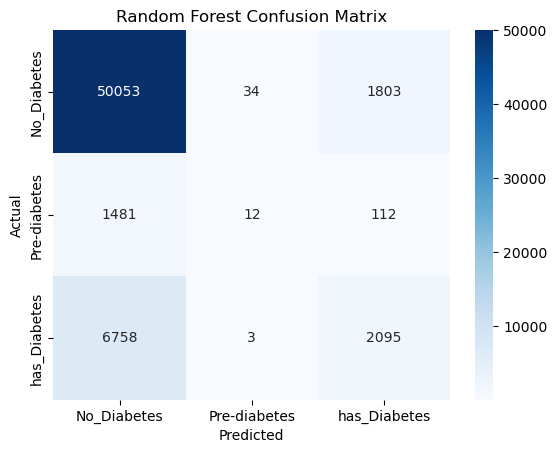

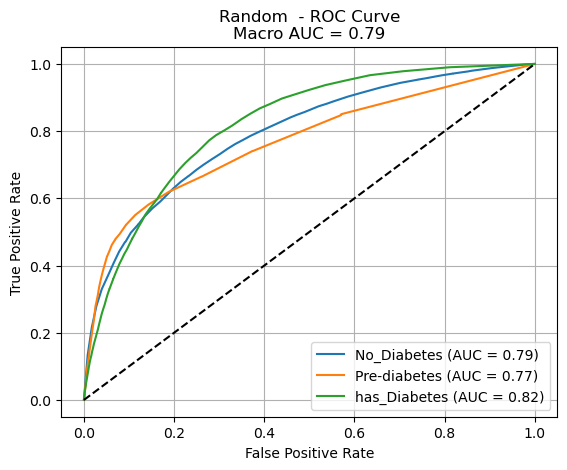

In [5]:

clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Step 6: Evaluate the model
y_pred = clf.predict(X_test)
y_score_rf = clf.predict_proba(X_test)
print(classification_report(y_test, y_pred))
plot_conf_matrix(y_test, y_pred, "Random Forest Confusion Matrix")

plot_roc_curve(y_test, y_score_rf, "Random ")


## ⚙️ 6.2. CatBoost Classifier


CatBoost Results:

              precision    recall  f1-score   support

 No_Diabetes       0.86      0.97      0.91     51890
Pre-diabetes       0.47      0.02      0.03      1605
has_Diabetes       0.58      0.24      0.34      8856

    accuracy                           0.84     62351
   macro avg       0.64      0.41      0.43     62351
weighted avg       0.81      0.84      0.81     62351



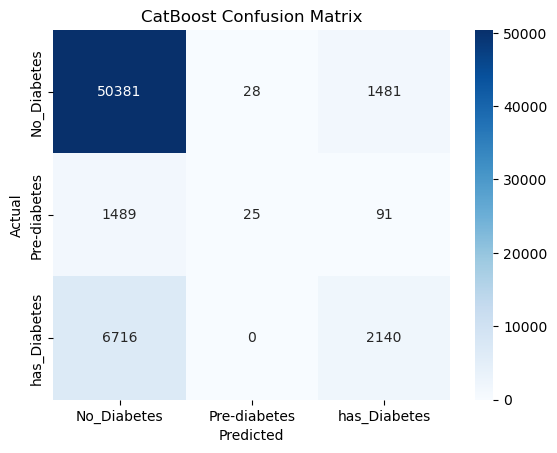

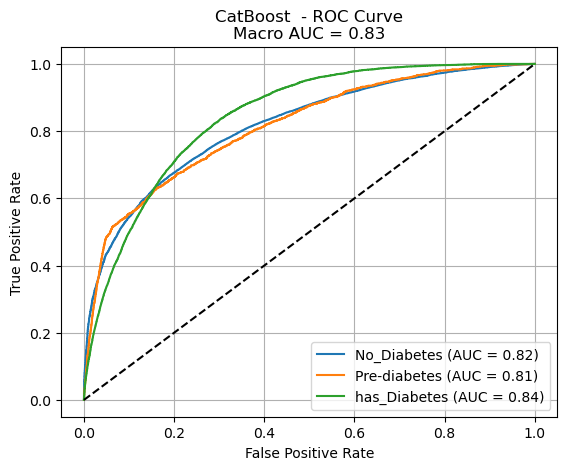

In [80]:
cat_model = CatBoostClassifier(verbose=0, random_seed=42)
cat_model.fit(X_train, y_train)

y_pred_cb = cat_model.predict(X_test)
y_score_cb = cat_model.predict_proba(X_test)
print("CatBoost Results:\n")
print(classification_report(y_test, y_pred_cb, target_names=le.classes_))
plot_conf_matrix(y_test, y_pred_cb, "CatBoost Confusion Matrix")

plot_roc_curve(y_test, y_score_cb, "CatBoost ")


## 6.3. XGBoost

In [81]:
import torch

print(torch.__version__)       # should print PyTorch version
print(torch.version.cuda)      # should print CUDA version (e.g., 12.1)
print(torch.cuda.is_available())  # should return True if GPU works


2.5.1+cu121
12.1
True


C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [10:37:49] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



🔸 XGBoost Results:

              precision    recall  f1-score   support

 No_Diabetes       0.86      0.97      0.91     51890
Pre-diabetes       0.42      0.02      0.04      1605
has_Diabetes       0.57      0.24      0.34      8856

    accuracy                           0.84     62351
   macro avg       0.62      0.41      0.43     62351
weighted avg       0.81      0.84      0.81     62351



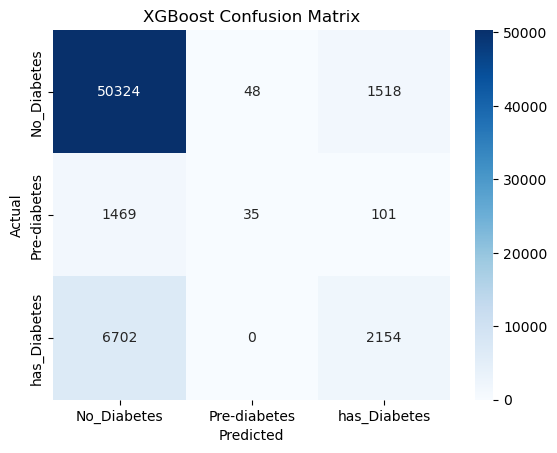

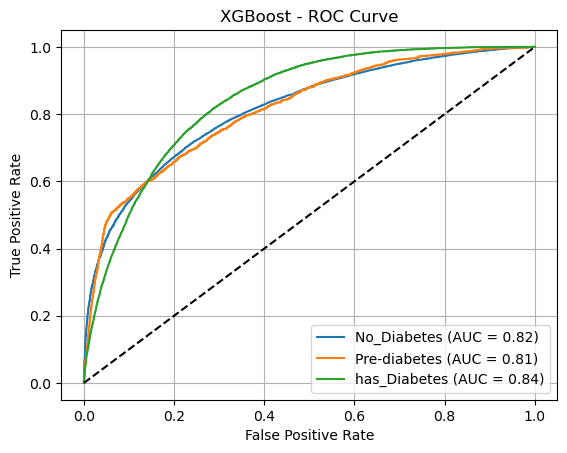

In [82]:
# ======== Preprocessing ========
# Drop target and unnecessary columns
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)

# Encode target
y = diabetes1['Diabetes']
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # This is important

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()
    
# ======== Train XGBoost ========
xgb = XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42)
xgb.fit(X_train, y_train)  # Use y_train (which is encoded!)
y_pred_xgb = xgb.predict(X_test)
y_score_xgb = xgb.predict_proba(X_test)

print("\n🔸 XGBoost Results:\n")
print(classification_report(y_test, y_pred_xgb, target_names=le.classes_))
plot_conf_matrix(y_test, y_pred_xgb, "XGBoost Confusion Matrix")
plot_roc_curve(y_test, y_score_xgb, "XGBoost")

In [83]:
# ======== Preprocessing ========
# Drop target and unnecessary columns
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)

# Encode target
y = diabetes1['Diabetes']
le = LabelEncoder()
y_encoded = le.fit_transform(y)  # This is important

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr = {}
    tpr = {}
    roc_auc = {}

    # Compute ROC and AUC for each class
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # ==== Macro-average (correct way) ====
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)

    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # ==== Plot ====
    plt.figure(figsize=(8, 6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")

    # Macro-average curve
    plt.plot(fpr["macro"], tpr["macro"], color='navy', linestyle='--',
             label=f"Macro-average (AUC = {roc_auc['macro']:.2f})", linewidth=2)

    plt.plot([0, 1], [0, 1], 'k--', label='Chance')
    plt.title(f"{model_name} - ROC Curve with Macro AUC")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid()
    plt.tight_layout()
    plt.show()
    

C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [10:38:26] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



🔸 XGBoost Results:

              precision    recall  f1-score   support

 No_Diabetes       0.86      0.97      0.91     51890
Pre-diabetes       0.42      0.02      0.04      1605
has_Diabetes       0.57      0.24      0.34      8856

    accuracy                           0.84     62351
   macro avg       0.62      0.41      0.43     62351
weighted avg       0.81      0.84      0.81     62351



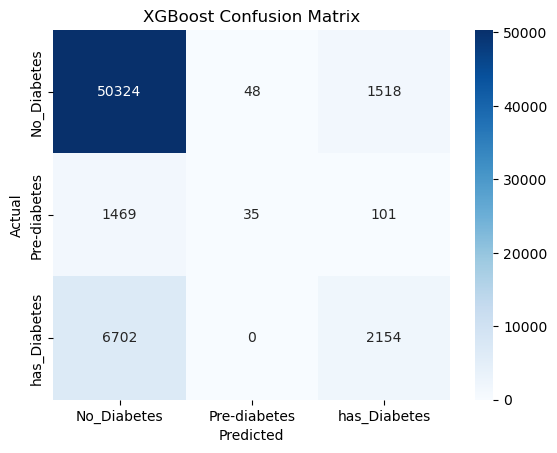

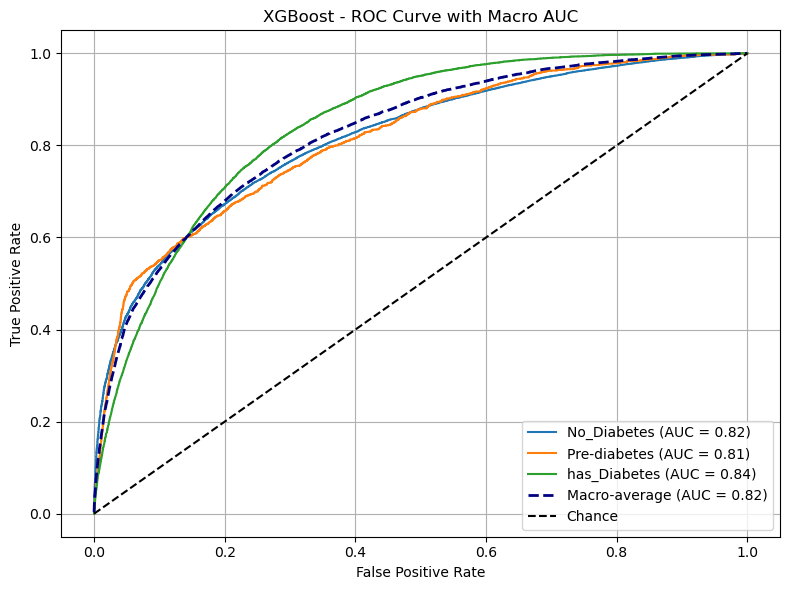

In [84]:
# ======== Train XGBoost ========
xgb = XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42)
xgb.fit(X_train, y_train)  # Use y_train (which is encoded!)
y_pred_xgb = xgb.predict(X_test)
y_score_xgb = xgb.predict_proba(X_test)

print("\n🔸 XGBoost Results:\n")
print(classification_report(y_test, y_pred_xgb, target_names=le.classes_))
plot_conf_matrix(y_test, y_pred_xgb, "XGBoost Confusion Matrix")
plot_roc_curve(y_test, y_score_xgb, "XGBoost")

##### macro - micro - weighted average

In [111]:
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.utils.class_weight import compute_sample_weight

def plot_roc_curve(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr = {}
    tpr = {}
    roc_auc = {}

    # Individual class ROC curves
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Macro-average: Unweighted average of the AUCs
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)

    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # Weighted-average: Weighted average of per-class AUCs based on support
    class_counts = np.sum(y_true_bin, axis=0)
    weighted_auc = np.average([roc_auc[i] for i in range(n_classes)], weights=class_counts)
    roc_auc["weighted"] = weighted_auc

    # Plotting
    plt.figure(figsize=(10, 7))
    colors = ['blue', 'green', 'orange']
    for i, color in zip(range(n_classes), colors):
        plt.plot(fpr[i], tpr[i], color=color, lw=2,
                 label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")

    # Plot averages
    plt.plot(fpr["macro"], tpr["macro"],
             label=f"Macro-average (AUC = {roc_auc['macro']:.2f})", linestyle='--', color='navy', linewidth=2)
    plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier")

    plt.title(f"{model_name} - ROC Curves (One-vs-Rest)")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend(loc='lower right')
    plt.grid()
    plt.tight_layout()
    plt.show()

    # Optionally print weighted AUC
    print(f"Weighted-average AUC = {roc_auc['weighted']:.2f}")



🔸 XGBoost Results:

              precision    recall  f1-score   support

 No_Diabetes       0.78      0.84      0.81        67
Pre-diabetes       0.91      0.91      0.91        67
has_Diabetes       0.87      0.80      0.83        66

    accuracy                           0.85       200
   macro avg       0.85      0.85      0.85       200
weighted avg       0.85      0.85      0.85       200



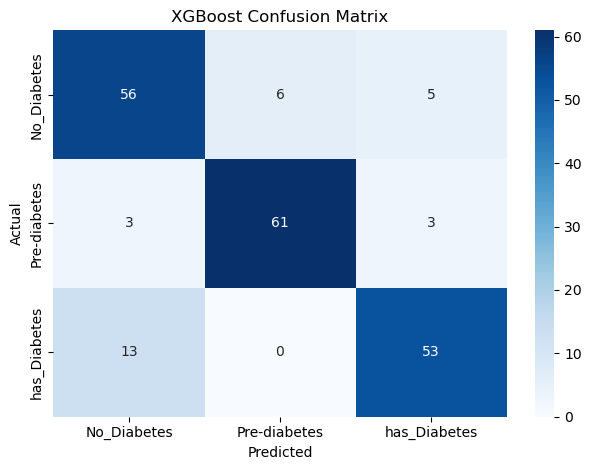

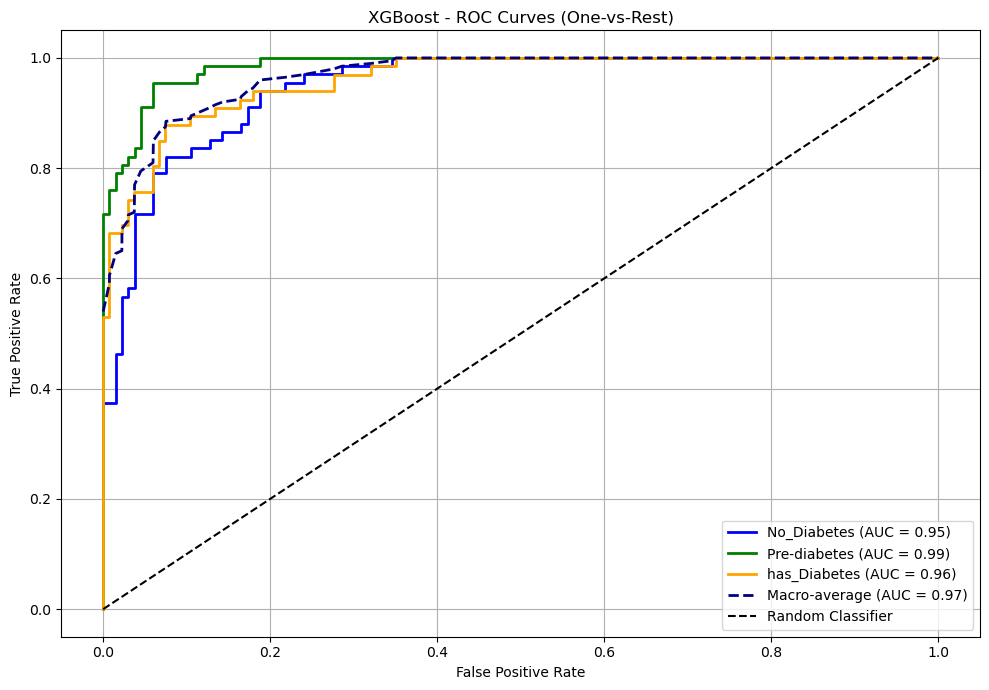

Weighted-average AUC = 0.97


In [112]:
# ======== Train XGBoost ========
xgb = XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42)
xgb.fit(X_train, y_train)  # Use y_train (which is encoded!)
y_pred_xgb = xgb.predict(X_test)
y_score_xgb = xgb.predict_proba(X_test)

print("\n🔸 XGBoost Results:\n")
print(classification_report(y_test, y_pred_xgb, target_names=le.classes_))
plot_conf_matrix(y_test, y_pred_xgb, "XGBoost Confusion Matrix")
plot_roc_curve(y_test, y_score_xgb, "XGBoost")

# 6.4. SMOTE implementation for Oversampling techniques

🔹 Random Forest (Pipeline) - TRAIN SET:
              precision    recall  f1-score   support

 No_Diabetes       1.00      1.00      1.00    207559
Pre-diabetes       1.00      0.99      1.00      6420
has_Diabetes       1.00      0.99      1.00     35422

    accuracy                           1.00    249401
   macro avg       1.00      1.00      1.00    249401
weighted avg       1.00      1.00      1.00    249401


🔹 Random Forest (Pipeline) - TEST SET:
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.96      0.91     51890
Pre-diabetes       0.25      0.01      0.02      1605
has_Diabetes       0.52      0.24      0.33      8856

    accuracy                           0.84     62351
   macro avg       0.54      0.40      0.42     62351
weighted avg       0.80      0.84      0.80     62351



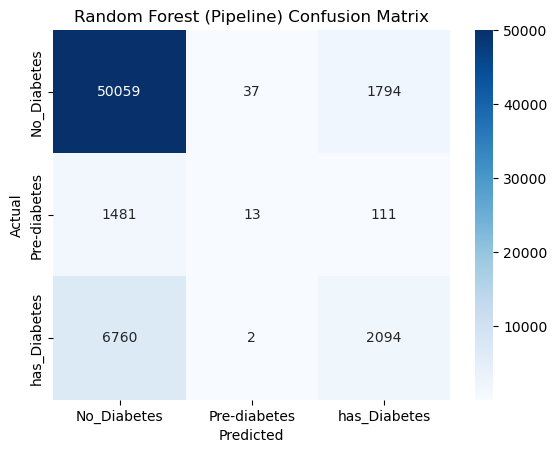

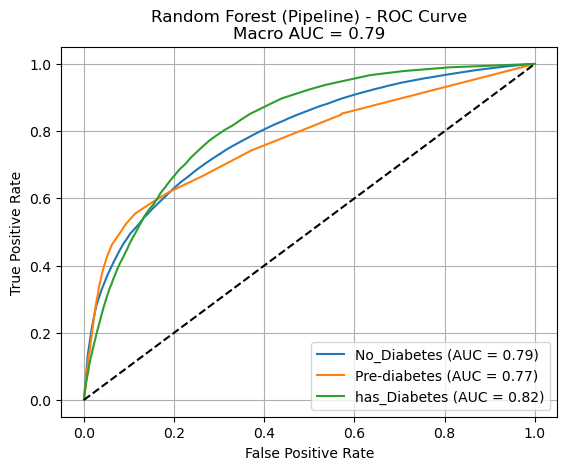

In [99]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder, label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ========== Data Preparation ==========
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(y_true, y_score, classes, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i],
                 label=f"{classes[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

# ========== Unified Evaluation Function ==========
def evaluate_model2(pipe, X_train, y_train, X_test, y_test, classes, model_name="Model"):
    pipe.fit(X_train, y_train)

    # Predictions
    y_pred_train = pipe.predict(X_train)
    y_pred_test = pipe.predict(X_test)
    y_proba_test = pipe.predict_proba(X_test)

    # Classification reports
    print(f"🔹 {model_name} - TRAIN SET:")
    print(classification_report(y_train, y_pred_train, target_names=classes))
    print(f"\n🔹 {model_name} - TEST SET:")
    print(classification_report(y_test, y_pred_test, target_names=classes))

    # Confusion Matrix (test set)
    plot_conf_matrix(y_test, y_pred_test, classes, f"{model_name} Confusion Matrix")

    # ROC Curve (test set)
    plot_roc_curve(y_test, y_proba_test, classes, model_name)

# ========== Example Run with Pipeline ==========
pipe_rf = Pipeline(steps=[
    ('scaler', StandardScaler()),  # optional for RandomForest but keeps structure ready for others
    ('classifier', RandomForestClassifier(random_state=42))
])

evaluate_model2(pipe_rf, X_train, y_train, X_test, y_test, le.classes_, model_name="Random Forest (Pipeline)")


🔹 CatBoost GPU - TRAIN SET:
              precision    recall  f1-score   support

 No_Diabetes       0.87      0.98      0.92    207559
Pre-diabetes       0.95      0.08      0.15      6420
has_Diabetes       0.71      0.30      0.42     35422

    accuracy                           0.86    249401
   macro avg       0.84      0.46      0.50    249401
weighted avg       0.85      0.86      0.83    249401


🔹 CatBoost GPU - TEST SET:
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.97      0.91     51890
Pre-diabetes       0.39      0.01      0.03      1605
has_Diabetes       0.57      0.24      0.34      8856

    accuracy                           0.84     62351
   macro avg       0.61      0.41      0.43     62351
weighted avg       0.81      0.84      0.81     62351



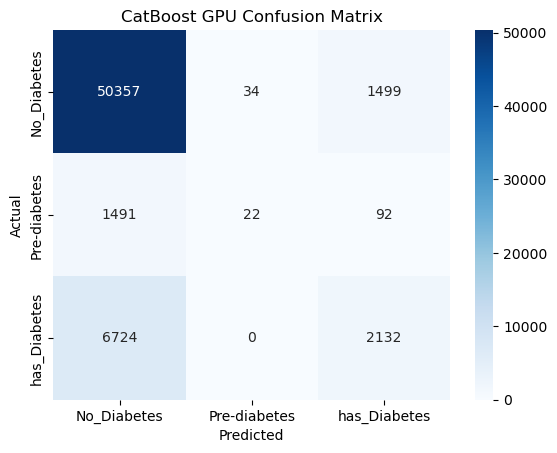

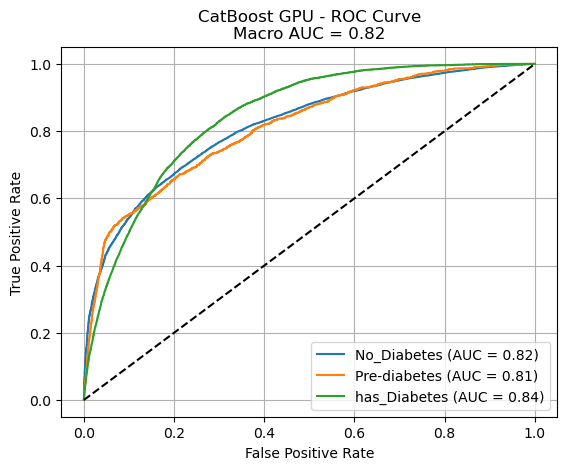

In [100]:
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier  # GPU-enabled
import warnings
warnings.filterwarnings("ignore")

# ========== Data Preparation ==========
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(y_true, y_score, classes, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i],
                 label=f"{classes[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

# ========== Unified Evaluation Function ==========
def evaluate_model2(model, X_train, y_train, X_test, y_test, classes, model_name="Model"):
    model.fit(X_train, y_train)

    # Predictions
    y_pred_train = model.predict(X_train)
    y_pred_test = model.predict(X_test)
    y_proba_test = model.predict_proba(X_test)

    # Classification reports
    print(f"🔹 {model_name} - TRAIN SET:")
    print(classification_report(y_train, y_pred_train, target_names=classes))
    print(f"\n🔹 {model_name} - TEST SET:")
    print(classification_report(y_test, y_pred_test, target_names=classes))

    # Confusion Matrix (test set)
    plot_conf_matrix(y_test, y_pred_test, classes, f"{model_name} Confusion Matrix")

    # ROC Curve (test set)
    plot_roc_curve(y_test, y_proba_test, classes, model_name)

# ========== Example Run ==========
gpu_model = CatBoostClassifier(
    iterations=500,
    depth=8,
    learning_rate=0.1,
    loss_function='MultiClass',
    task_type="GPU",  # <--- enables CUDA
    devices='0',
    verbose=False
)
evaluate_model2(gpu_model, X_train, y_train, X_test, y_test, le.classes_, model_name="CatBoost GPU")


##### Macro

# THIS ACCURACY IS FOR TRAINING but Not for TESTING

# MODIFIED USING PYTORCH

checkpoint directory created: ./model
saving model version 0.0
Epoch [10/100], Loss: 0.9475
Epoch [20/100], Loss: 0.8332
Epoch [30/100], Loss: 0.7513
Epoch [40/100], Loss: 0.7128
Epoch [50/100], Loss: 0.6715
Epoch [60/100], Loss: 0.6230
Epoch [70/100], Loss: 0.5804
Epoch [80/100], Loss: 0.5504
Epoch [90/100], Loss: 0.5292
Epoch [100/100], Loss: 0.5166
✅ KAN Accuracy on Test Set: 0.7766034225593815

📋 KAN Classification Report:
               precision    recall  f1-score   support

 No_Diabetes       0.90      0.83      0.86     51890
Pre-diabetes       0.20      0.39      0.27      1605
has_Diabetes       0.41      0.52      0.46      8856

    accuracy                           0.78     62351
   macro avg       0.50      0.58      0.53     62351
weighted avg       0.81      0.78      0.79     62351



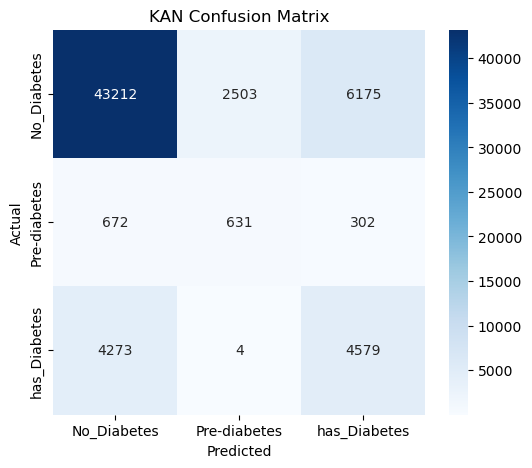

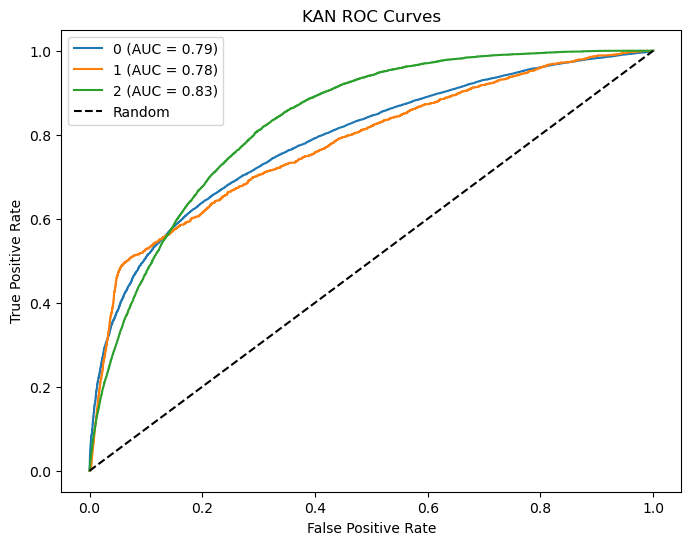

✅ XGBoost Accuracy on Test Set: 0.8397138778848775

📋 XGBoost Classification Report:
               precision    recall  f1-score   support

 No_Diabetes       0.87      0.96      0.91     51890
Pre-diabetes       0.34      0.03      0.06      1605
has_Diabetes       0.54      0.30      0.39      8856

    accuracy                           0.84     62351
   macro avg       0.58      0.43      0.45     62351
weighted avg       0.81      0.84      0.81     62351



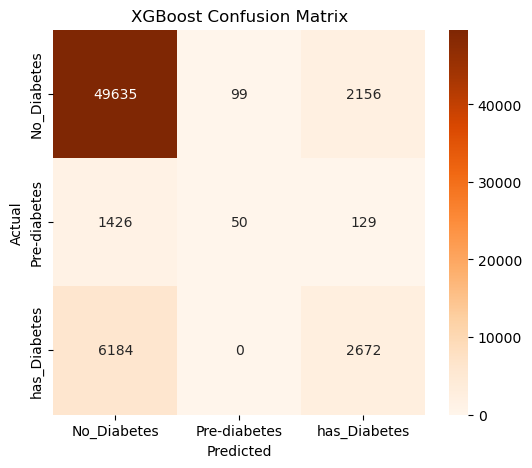

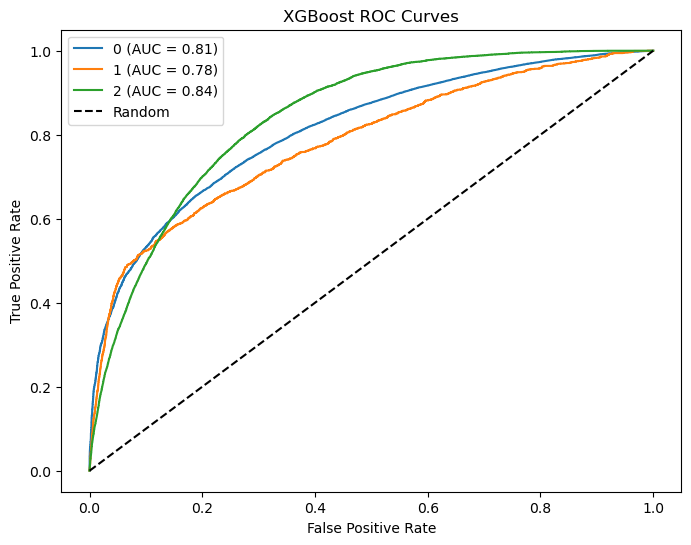

In [108]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from kan import KAN
from sklearn.preprocessing import StandardScaler, LabelBinarizer
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

# ==== Step 1: Standardize the data ====
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# ==== Step 2: Convert to PyTorch tensors ====
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_resampled, dtype=torch.long)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# ==== Step 3: Define the KAN model ====
input_size = X_train_tensor.shape[1]
output_size = len(np.unique(y_train_resampled))
model_kan = KAN(width=[input_size, 10, output_size], grid=3, k=3)

# Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_kan.parameters(), lr=0.01)

# ==== Step 4: Training loop ====
epochs = 100
for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = model_kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# ==== Step 5: Evaluation ====
model_kan.eval()
with torch.no_grad():
    logits = model_kan(X_test_tensor)
    y_pred = torch.argmax(logits, dim=1).numpy()

# Accuracy & classification report
print("✅ KAN Accuracy on Test Set:", accuracy_score(y_test, y_pred))
print("\n📋 KAN Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))

# ==== Step 6: Confusion Matrix ====
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.title("KAN Confusion Matrix")
plt.show()

# ==== Step 7: AUC-ROC Curves ====
# One-hot encode labels for multi-class ROC
lb = LabelBinarizer()
y_test_onehot = lb.fit_transform(y_test)
y_pred_probs = torch.softmax(logits, dim=1).numpy()

plt.figure(figsize=(8,6))
for i, class_name in enumerate(lb.classes_):
    fpr, tpr, _ = roc_curve(y_test_onehot[:, i], y_pred_probs[:, i])
    auc = roc_auc_score(y_test_onehot[:, i], y_pred_probs[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {auc:.2f})")
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("KAN ROC Curves")
plt.legend()
plt.show()

# ==== Step 8: XGBoost baseline ====
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train_scaled, y_train_resampled)
y_pred_xgb = xgb_model.predict(X_test_scaled)
print("✅ XGBoost Accuracy on Test Set:", accuracy_score(y_test, y_pred_xgb))
print("\n📋 XGBoost Classification Report:\n", classification_report(y_test, y_pred_xgb, target_names=le.classes_))

# Confusion matrix for XGBoost
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6,5))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Oranges", xticklabels=le.classes_, yticklabels=le.classes_)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.title("XGBoost Confusion Matrix")
plt.show()

# AUC-ROC for XGBoost
y_pred_probs_xgb = xgb_model.predict_proba(X_test_scaled)
plt.figure(figsize=(8,6))
for i, class_name in enumerate(lb.classes_):
    fpr, tpr, _ = roc_curve(y_test_onehot[:, i], y_pred_probs_xgb[:, i])
    auc = roc_auc_score(y_test_onehot[:, i], y_pred_probs_xgb[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {auc:.2f})")
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("XGBoost ROC Curves")
plt.legend()
plt.show()


🔹 Random Forest - TRAIN SET:
              precision    recall  f1-score   support

 No_Diabetes       1.00      1.00      1.00    207559
Pre-diabetes       1.00      0.99      1.00      6420
has_Diabetes       1.00      0.99      1.00     35422

    accuracy                           1.00    249401
   macro avg       1.00      1.00      1.00    249401
weighted avg       1.00      1.00      1.00    249401


🔹 Random Forest - TEST SET:
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.96      0.91     51890
Pre-diabetes       0.24      0.01      0.01      1605
has_Diabetes       0.52      0.24      0.33      8856

    accuracy                           0.84     62351
   macro avg       0.54      0.40      0.42     62351
weighted avg       0.80      0.84      0.80     62351



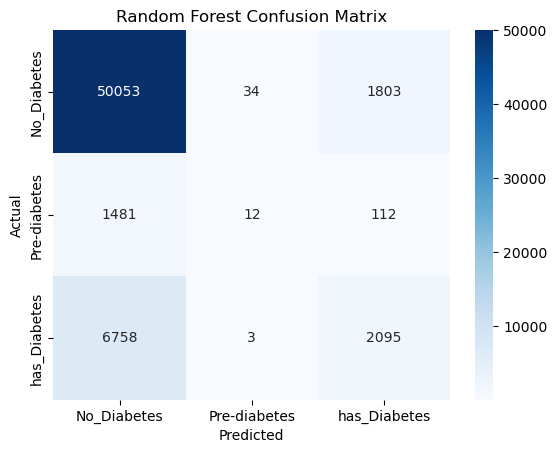

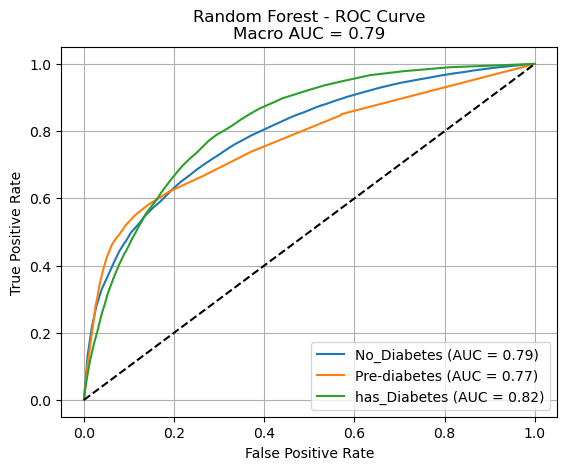

In [101]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ========== Data Preparation ==========
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix(y_true, y_pred, classes, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=classes, yticklabels=classes, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(y_true, y_score, classes, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i],
                 label=f"{classes[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

# ========== Unified Evaluation Function ==========
def evaluate_model2(pipe, X_train, y_train, X_test, y_test, classes, model_name="Model"):
    pipe.fit(X_train, y_train)

    # Predictions
    y_pred_train = pipe.predict(X_train)
    y_pred_test = pipe.predict(X_test)
    y_proba_test = pipe.predict_proba(X_test)

    # Classification reports
    print(f"🔹 {model_name} - TRAIN SET:")
    print(classification_report(y_train, y_pred_train, target_names=classes))
    print(f"\n🔹 {model_name} - TEST SET:")
    print(classification_report(y_test, y_pred_test, target_names=classes))

    # Confusion Matrix (test set)
    plot_conf_matrix(y_test, y_pred_test, classes, f"{model_name} Confusion Matrix")

    # ROC Curve (test set)
    plot_roc_curve(y_test, y_proba_test, classes, model_name)

# ========== Example Run ==========
clf = RandomForestClassifier(random_state=42)
evaluate_model2(clf, X_train, y_train, X_test, y_test, le.classes_, model_name="Random Forest")


# RANDOM FOREST

🔹 Random Forest - TRAINING SET
              precision    recall  f1-score   support

 No_Diabetes       1.00      1.00      1.00    207559
Pre-diabetes       1.00      0.99      1.00      6420
has_Diabetes       1.00      0.99      1.00     35422

    accuracy                           1.00    249401
   macro avg       1.00      1.00      1.00    249401
weighted avg       1.00      1.00      1.00    249401


🔹 Random Forest - TEST SET
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.96      0.91     51890
Pre-diabetes       0.24      0.01      0.01      1605
has_Diabetes       0.52      0.24      0.33      8856

    accuracy                           0.84     62351
   macro avg       0.54      0.40      0.42     62351
weighted avg       0.80      0.84      0.80     62351



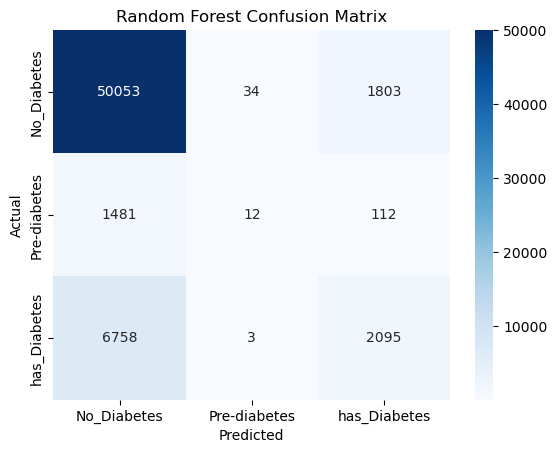

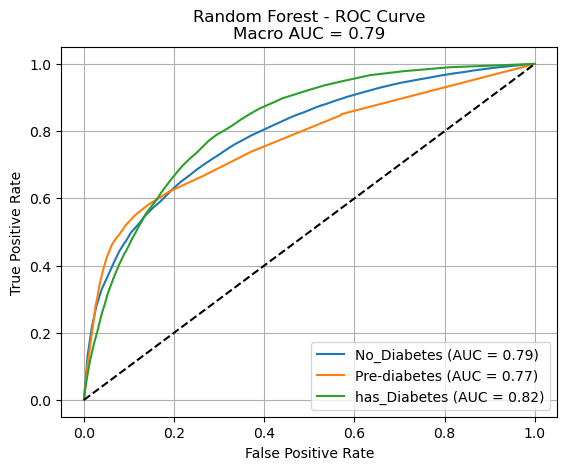

In [98]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# ======== Preprocessing ========
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix1(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve1(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

# ======== Model Training & Evaluation ========
clf = RandomForestClassifier(random_state=42)
clf.fit(X_train, y_train)

# Predictions
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)
y_proba_test = clf.predict_proba(X_test)

# Classification Reports
print("🔹 Random Forest - TRAINING SET")
print(classification_report(y_train, y_pred_train, target_names=le.classes_))

print("\n🔹 Random Forest - TEST SET")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

# Confusion Matrix (test set)
plot_conf_matrix1(y_test, y_pred_test, "Random Forest Confusion Matrix")

# ROC Curve (test set)
plot_roc_curve1(y_test, y_proba_test, "Random Forest")


# XGBOOST

C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [12:13:47] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\olika\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [12:13:48] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\olika\anaconda3\lib\site-packages\xgboost\core.py:2676: UserWarning: [12:13:57] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\common\error_msg.cc:27: The tree method `gpu_hist` is deprecated since 2.0.0. To use GPU training, set the `device` parameter to CUDA instead.

    E.g. tree_method = "hist", device = "cuda"

  if len(data.shape) != 1 an

🔹 XGBoost - TRAINING SET
              precision    recall  f1-score   support

 No_Diabetes       0.87      0.98      0.92    207559
Pre-diabetes       0.96      0.12      0.21      6420
has_Diabetes       0.70      0.30      0.42     35422

    accuracy                           0.86    249401
   macro avg       0.84      0.47      0.52    249401
weighted avg       0.85      0.86      0.83    249401


🔹 XGBoost - TEST SET
              precision    recall  f1-score   support

 No_Diabetes       0.86      0.97      0.91     51890
Pre-diabetes       0.41      0.02      0.04      1605
has_Diabetes       0.57      0.24      0.34      8856

    accuracy                           0.84     62351
   macro avg       0.61      0.41      0.43     62351
weighted avg       0.81      0.84      0.81     62351



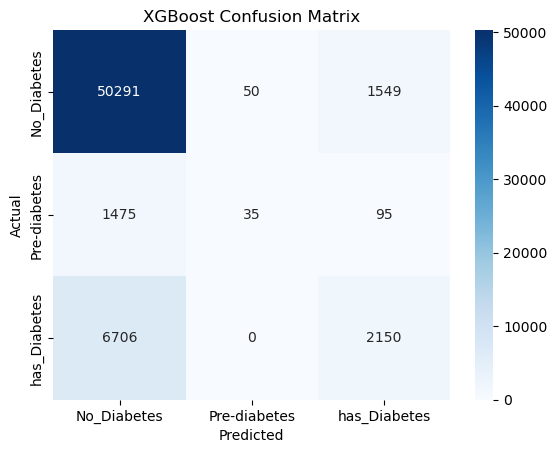

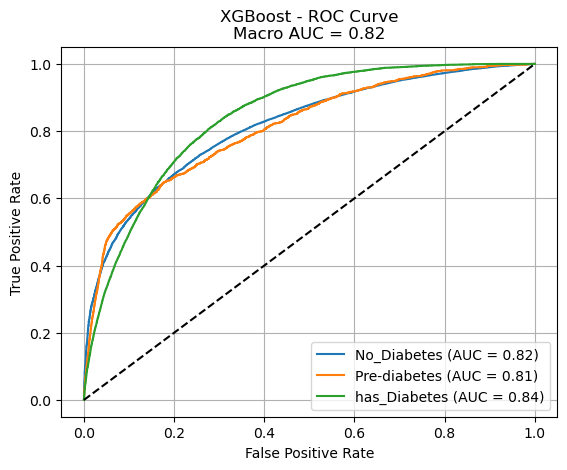

In [97]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import xgboost as xgb

# ======== Preprocessing ========
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1)
y = diabetes1['Diabetes']

# Encode target
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# Split
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, stratify=y_encoded, random_state=42
)

# ======== Evaluation Helpers ========
def plot_conf_matrix1(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', xticklabels=le.classes_, yticklabels=le.classes_, cmap='Blues')
    plt.title(title)
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve1(y_true, y_score, model_name):
    y_true_bin = label_binarize(y_true, classes=np.unique(y_true))
    n_classes = y_true_bin.shape[1]

    fpr, tpr, roc_auc = {}, {}, {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    macro_auc = np.mean(list(roc_auc.values()))

    plt.figure()
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f"{le.classes_[i]} (AUC = {roc_auc[i]:.2f})")
    plt.plot([0, 1], [0, 1], 'k--')
    plt.title(f"{model_name} - ROC Curve\nMacro AUC = {macro_auc:.2f}")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.legend()
    plt.grid()
    plt.show()

# ======== XGBoost Model ========
# For multiclass classification
xgb_model = xgb.XGBClassifier(
    objective='multi:softprob',   # outputs probabilities
    num_class=len(np.unique(y_encoded)),
    n_estimators=500,
    max_depth=6,
    learning_rate=0.1,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    use_label_encoder=False,
    eval_metric='mlogloss',
    tree_method='gpu_hist'  # use 'hist' if GPU is not available
)

# Train
xgb_model.fit(X_train, y_train)

# Predictions
y_pred_train = xgb_model.predict(X_train)
y_pred_test = xgb_model.predict(X_test)
y_proba_test = xgb_model.predict_proba(X_test)

# Classification Reports
print("🔹 XGBoost - TRAINING SET")
print(classification_report(y_train, y_pred_train, target_names=le.classes_))

print("\n🔹 XGBoost - TEST SET")
print(classification_report(y_test, y_pred_test, target_names=le.classes_))

# Confusion Matrix (test set)
plot_conf_matrix1(y_test, y_pred_test, "XGBoost Confusion Matrix")

# ROC Curve (test set)
plot_roc_curve1(y_test, y_proba_test, "XGBoost")


In [110]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

import warnings
warnings.filterwarnings("ignore")

# ========== 1. Data Generation ==========
X, y = make_classification(
    n_samples=1000, n_features=20, n_classes=3,
    n_informative=10, random_state=42
)
X = StandardScaler().fit_transform(X)
classes = np.unique(y)
y_bin = label_binarize(y, classes=classes)
n_classes = len(classes)

# Select device (GPU if available, otherwise CPU)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# ========== 2. PyTorch Neural Network ==========
class SimpleNN(nn.Module):
    def __init__(self, input_dim, output_dim):
        super(SimpleNN, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, output_dim),
        )

    def forward(self, x):
        return self.model(x)

def train_torch_model(X_train, y_train, X_val, epochs=20, batch_size=32, lr=0.001):
    # Convert to tensors and move to device
    X_train_t = torch.tensor(X_train, dtype=torch.float32).to(device)
    y_train_t = torch.tensor(y_train, dtype=torch.long).to(device)
    X_val_t = torch.tensor(X_val, dtype=torch.float32).to(device)

    dataset = TensorDataset(X_train_t, y_train_t)
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

    model = SimpleNN(X_train.shape[1], n_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    model.train()
    for _ in range(epochs):
        for xb, yb in loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            outputs = model(xb)
            loss = criterion(outputs, yb)
            loss.backward()
            optimizer.step()

    # Get probabilities
    model.eval()
    with torch.no_grad():
        logits = model(X_val_t)
        probs = torch.softmax(logits, dim=1).cpu().numpy()  # move back to CPU for sklearn

    return model, probs

# ========== 3. Model Definitions ==========
models = {
    "Logistic Regression": LogisticRegression(max_iter=1000),
    "KNN": KNeighborsClassifier(),
    "SVM": SVC(probability=True),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric='mlogloss'),
    "LightGBM": LGBMClassifier(),
    "CatBoost": CatBoostClassifier(verbose=0),
    "Neural Network (PyTorch)": "torch"  # special handling
}

# ========== 4. Evaluation Loop ==========
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

fold_avg_auc = pd.DataFrame(columns=["Macro AUC", "Micro AUC", "Weighted AUC"])
agg_auc = pd.DataFrame(columns=["Macro AUC", "Micro AUC", "Weighted AUC"])

for name, model in models.items():
    print(f"Evaluating {name}...")
    
    # For fold-averaged AUC
    fold_macro, fold_micro, fold_weighted = [], [], []
    
    # For aggregated predictions
    y_true_full, y_proba_full = [], []
    
    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]
        y_test_bin = label_binarize(y_test, classes=classes)

        if name == "Neural Network (PyTorch)":
            _, y_pred_proba = train_torch_model(X_train, y_train, X_test, epochs=20)
        else:
            model.fit(X_train, y_train)
            y_pred_proba = model.predict_proba(X_test)

        # Fold AUCs
        fold_macro.append(roc_auc_score(y_test_bin, y_pred_proba, average="macro", multi_class="ovr"))
        fold_micro.append(roc_auc_score(y_test_bin, y_pred_proba, average="micro", multi_class="ovr"))
        fold_weighted.append(roc_auc_score(y_test_bin, y_pred_proba, average="weighted", multi_class="ovr"))
        
        # For aggregation
        y_true_full.append(y_test)
        y_proba_full.append(y_pred_proba)

    # Average across folds (Fold-Averaged AUC)
    fold_avg_auc.loc[name] = [
        np.mean(fold_macro),
        np.mean(fold_micro),
        np.mean(fold_weighted)
    ]

    # Aggregated predictions (Aggregated AUC)
    y_true_full = np.concatenate(y_true_full)
    y_proba_full = np.vstack(y_proba_full)
    y_bin_full = label_binarize(y_true_full, classes=classes)

    agg_auc.loc[name] = [
        roc_auc_score(y_bin_full, y_proba_full, average="macro", multi_class="ovr"),
        roc_auc_score(y_bin_full, y_proba_full, average="micro", multi_class="ovr"),
        roc_auc_score(y_bin_full, y_proba_full, average="weighted", multi_class="ovr")
    ]

# ========== 5. Results Summary ==========
print("\nFold-Averaged AUC Scores:")
display(fold_avg_auc.round(4))

print("Aggregated AUC Scores:")
display(agg_auc.round(4))

# ========== 6. Compare Side-by-Side ==========
comparison = pd.concat([
    fold_avg_auc.add_suffix(" (Fold Avg)"),
    agg_auc.add_suffix(" (Aggregated)")
], axis=1).round(4)

print("\n🔍 Comparison of AUC Approaches (Fold-Averaged vs Aggregated):")
display(comparison)


Using device: cuda
Evaluating Logistic Regression...
Evaluating KNN...
Evaluating SVM...
Evaluating Random Forest...
Evaluating XGBoost...
Evaluating LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000250 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 20
[LightGBM] [Info] Start training from score -1.093625
[LightGBM] [Info] Start training from score -1.101115
[LightGBM] [Info] Start training from score -1.101115
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Wa

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000256 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train s

,Macro AUC,Micro AUC,Weighted AUC
Logistic Regression,0.8631,0.8681,0.8628
KNN,0.8750,0.8761,0.8750
SVM,0.9398,0.9424,0.9397
Random Forest,0.9378,0.9372,0.9377
XGBoost,0.9475,0.9468,0.9474
LightGBM,0.9509,0.9507,0.9509
CatBoost,0.9582,0.9582,0.9581
Neural Network (PyTorch),0.9409,0.9431,0.9408


Aggregated AUC Scores:


,Macro AUC,Micro AUC,Weighted AUC
Logistic Regression,0.8609,0.8677,0.8607
KNN,0.8750,0.8768,0.8749
SVM,0.9374,0.9422,0.9373
Random Forest,0.9348,0.9371,0.9347
XGBoost,0.9452,0.9466,0.9451
LightGBM,0.9491,0.9505,0.9490
CatBoost,0.9564,0.9578,0.9564
Neural Network (PyTorch),0.9398,0.9430,0.9398



🔍 Comparison of AUC Approaches (Fold-Averaged vs Aggregated):


,Macro AUC (Fold Avg),Micro AUC (Fold Avg),Weighted AUC (Fold Avg),Macro AUC (Aggregated),Micro AUC (Aggregated),Weighted AUC (Aggregated)
Logistic Regression,0.8631,0.8681,0.8628,0.8609,0.8677,0.8607
KNN,0.8750,0.8761,0.8750,0.8750,0.8768,0.8749
SVM,0.9398,0.9424,0.9397,0.9374,0.9422,0.9373
Random Forest,0.9378,0.9372,0.9377,0.9348,0.9371,0.9347
XGBoost,0.9475,0.9468,0.9474,0.9452,0.9466,0.9451
LightGBM,0.9509,0.9507,0.9509,0.9491,0.9505,0.9490
CatBoost,0.9582,0.9582,0.9581,0.9564,0.9578,0.9564
Neural Network (PyTorch),0.9409,0.9431,0.9408,0.9398,0.9430,0.9398


checkpoint directory created: ./model
saving model version 0.0
Epoch [10/100], Loss: 0.9475
Epoch [20/100], Loss: 0.8332
Epoch [30/100], Loss: 0.7513
Epoch [40/100], Loss: 0.7128
Epoch [50/100], Loss: 0.6715
Epoch [60/100], Loss: 0.6230
Epoch [70/100], Loss: 0.5804
Epoch [80/100], Loss: 0.5504
Epoch [90/100], Loss: 0.5292
Epoch [100/100], Loss: 0.5166
✅ KAN Accuracy on Test Set: 0.7766034225593815

📋 KAN Classification Report:
               precision    recall  f1-score   support

 No_Diabetes       0.90      0.83      0.86     51890
Pre-diabetes       0.20      0.39      0.27      1605
has_Diabetes       0.41      0.52      0.46      8856

    accuracy                           0.78     62351
   macro avg       0.50      0.58      0.53     62351
weighted avg       0.81      0.78      0.79     62351



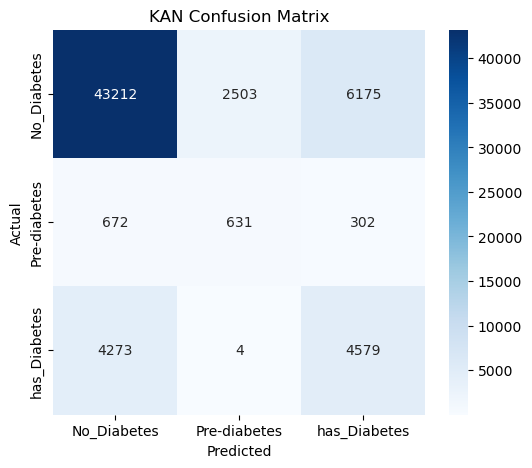

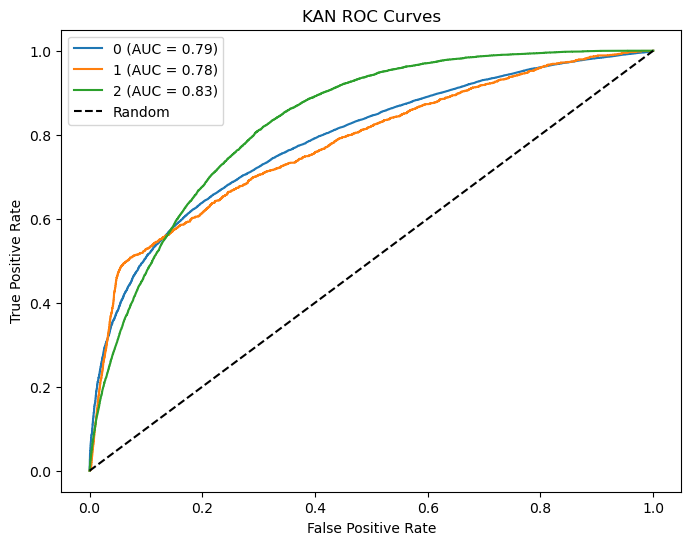

✅ XGBoost Accuracy on Test Set: 0.8397138778848775

📋 XGBoost Classification Report:
               precision    recall  f1-score   support

 No_Diabetes       0.87      0.96      0.91     51890
Pre-diabetes       0.34      0.03      0.06      1605
has_Diabetes       0.54      0.30      0.39      8856

    accuracy                           0.84     62351
   macro avg       0.58      0.43      0.45     62351
weighted avg       0.81      0.84      0.81     62351



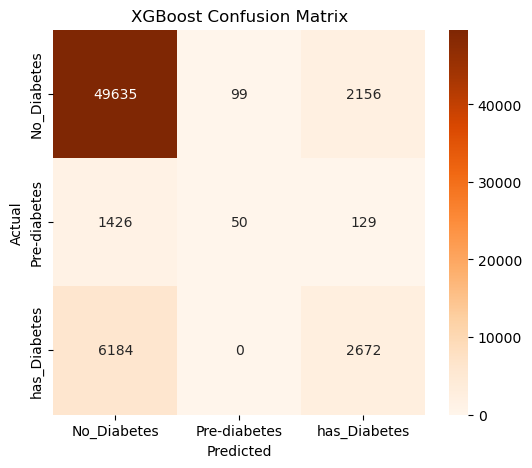

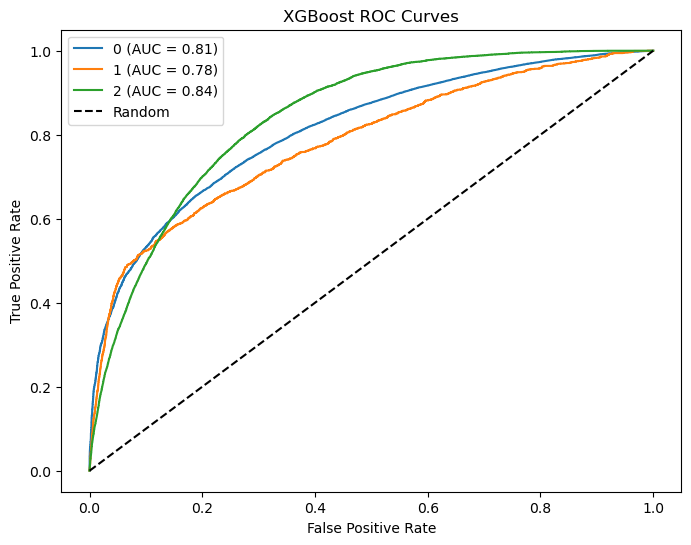

In [107]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from kan import KAN
from sklearn.preprocessing import StandardScaler, LabelBinarizer
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, roc_auc_score, roc_curve
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

# ==== Step 1: Standardize the data ====
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_resampled)
X_test_scaled = scaler.transform(X_test)

# ==== Step 2: Convert to PyTorch tensors ====
X_train_tensor = torch.tensor(X_train_scaled, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train_resampled, dtype=torch.long)

X_test_tensor = torch.tensor(X_test_scaled, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

# ==== Step 3: Define the KAN model ====
input_size = X_train_tensor.shape[1]
output_size = len(np.unique(y_train_resampled))
model_kan = KAN(width=[input_size, 10, output_size], grid=3, k=3)

# Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model_kan.parameters(), lr=0.01)

# ==== Step 4: Training loop ====
epochs = 100
for epoch in range(epochs):
    optimizer.zero_grad()
    outputs = model_kan(X_train_tensor)
    loss = criterion(outputs, y_train_tensor)
    loss.backward()
    optimizer.step()
    
    if (epoch+1) % 10 == 0:
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {loss.item():.4f}")

# ==== Step 5: Evaluation ====
model_kan.eval()
with torch.no_grad():
    logits = model_kan(X_test_tensor)
    y_pred = torch.argmax(logits, dim=1).numpy()

# Accuracy & classification report
print("✅ KAN Accuracy on Test Set:", accuracy_score(y_test, y_pred))
print("\n📋 KAN Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_))

# ==== Step 6: Confusion Matrix ====
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=le.classes_, yticklabels=le.classes_)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.title("KAN Confusion Matrix")
plt.show()

# ==== Step 7: AUC-ROC Curves ====
# One-hot encode labels for multi-class ROC
lb = LabelBinarizer()
y_test_onehot = lb.fit_transform(y_test)
y_pred_probs = torch.softmax(logits, dim=1).numpy()

plt.figure(figsize=(8,6))
for i, class_name in enumerate(lb.classes_):
    fpr, tpr, _ = roc_curve(y_test_onehot[:, i], y_pred_probs[:, i])
    auc = roc_auc_score(y_test_onehot[:, i], y_pred_probs[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {auc:.2f})")
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("KAN ROC Curves")
plt.legend()
plt.show()

# ==== Step 8: XGBoost baseline ====
xgb_model = xgb.XGBClassifier(use_label_encoder=False, eval_metric='mlogloss')
xgb_model.fit(X_train_scaled, y_train_resampled)
y_pred_xgb = xgb_model.predict(X_test_scaled)
print("✅ XGBoost Accuracy on Test Set:", accuracy_score(y_test, y_pred_xgb))
print("\n📋 XGBoost Classification Report:\n", classification_report(y_test, y_pred_xgb, target_names=le.classes_))

# Confusion matrix for XGBoost
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6,5))
sns.heatmap(cm_xgb, annot=True, fmt="d", cmap="Oranges", xticklabels=le.classes_, yticklabels=le.classes_)
plt.ylabel("Actual")
plt.xlabel("Predicted")
plt.title("XGBoost Confusion Matrix")
plt.show()

# AUC-ROC for XGBoost
y_pred_probs_xgb = xgb_model.predict_proba(X_test_scaled)
plt.figure(figsize=(8,6))
for i, class_name in enumerate(lb.classes_):
    fpr, tpr, _ = roc_curve(y_test_onehot[:, i], y_pred_probs_xgb[:, i])
    auc = roc_auc_score(y_test_onehot[:, i], y_pred_probs_xgb[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {auc:.2f})")
plt.plot([0,1], [0,1], 'k--', label='Random')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("XGBoost ROC Curves")
plt.legend()
plt.show()


## 6.5. NEURAL NETWORK with TensorFlow/Keras

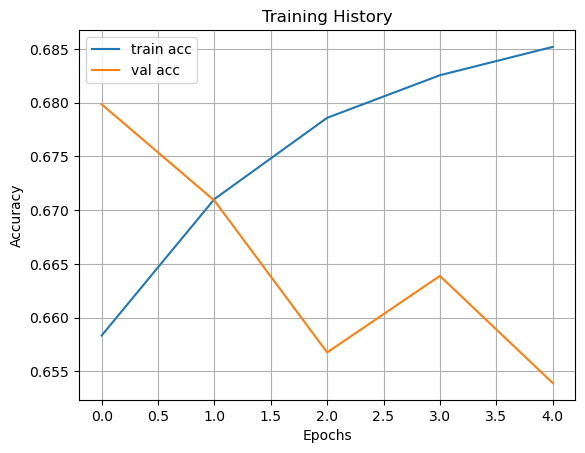

In [116]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import classification_report, confusion_matrix


# Assume your DataFrame is called `diabetes1` and target column is 'DIABETE4'
df = train_df1.copy()

# Drop rows with missing target
df = df[df['Diabetes'].notna()]

# Encode target labels (e.g., 1: Diabetes, 3: No Diabetes, 4: Pre-diabetes)
le = LabelEncoder()
y = le.fit_transform(df['Diabetes'])

# One-hot encoding for NN
y_cat = to_categorical(y)

# Drop target from features
X = diabetes1.drop(['Diabetes', 'DIABTYPE'], axis=1, errors='ignore')
#X = pd.get_dummies(X)  # For categorical vars

# Fill any remaining NaNs with column median
#X = X.fillna(X.median())

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


✅ 2. Train-Test Split + SMOTE (Optional)

# Split before SMOTE to prevent leakage
X_train, X_test, y_train, y_test, y_cat_train, y_cat_test = train_test_split(
    X_scaled, y, y_cat, test_size=0.2, stratify=y, random_state=42)

# Apply SMOTE on training set only
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)
y_cat_train_sm = to_categorical(y_train_sm)


✅ 3. Define the Neural Network Model

def create_nn(input_dim, output_dim):
    model = Sequential()
    model.add(Dense(128, activation='relu', input_dim=input_dim))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(output_dim, activation='softmax'))  # softmax for multi-class

    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model


✅ 4. Train the Model

model = create_nn(input_dim=X_train_sm.shape[1], output_dim=y_cat_train_sm.shape[1])

history = model.fit(
    X_train_sm, y_cat_train_sm,
    validation_data=(X_test, y_cat_test),
    epochs=5,
    batch_size=32,
    verbose=1
)


✅ 5. Evaluate the Model

# Predictions
y_pred_prob = model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

# Classification report
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_.astype(str)))

# Confusion matrix
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


Plot Training History

import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='train acc')
plt.plot(history.history['val_accuracy'], label='val acc')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training History')
plt.grid()
plt.show()


In [131]:
from sklearn.model_selection import cross_val_score
for name, model in models.items():
    score = cross_val_score(model, X_train_bal, y_train_bal, cv=5, scoring='f1_macro')
    print(f"{name}: Mean F1-macro = {score.mean():.4f}")


NameError: name 'X_train_bal' is not defined

# 7. Cross-Validation & Hyperparameter Tuning

from sklearn.model_selection import cross_val_score

for name, model in models.items():

    score = cross_val_score(model, X_train_bal, y_train_bal, cv=5, scoring='f1_macro')
    
    print(f"{name}: Mean F1-macro = {score.mean():.4f}")
    
✅ Use Optuna, GridSearchCV, or RandomizedSearchCV for tuning best models.

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from tensorflow.keras.utils import to_categorical
from imblearn.over_sampling import SMOTE

# Assuming diabetes1 is already cleaned
df = train_df1.copy()

# Encode target
le = LabelEncoder()
y = le.fit_transform(df['Diabetes'])
y_cat = to_categorical(y)

# Prepare features
X = df.drop(['Diabetes', 'DIABTYPE'], axis=1, errors='ignore')
X = pd.get_dummies(X)
X = X.fillna(X.median())

# Normalize features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train-test split
X_train, X_test, y_train, y_test, y_cat_train, y_cat_test = train_test_split(
    X_scaled, y, y_cat, test_size=0.2, stratify=y, random_state=42)

# SMOTE
smote = SMOTE(random_state=42)
X_train_sm, y_train_sm = smote.fit_resample(X_train, y_train)
y_cat_train_sm = to_categorical(y_train_sm)


In [ ]:
import optuna
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

def create_model(trial, input_dim, output_dim):
    model = Sequential()
    n_layers = trial.suggest_int('n_layers', 1, 3)
    
    for i in range(n_layers):
        num_hidden = trial.suggest_int(f'n_units_{i}', 32, 256, step=32)
        dropout_rate = trial.suggest_float(f'dropout_{i}', 0.1, 0.5)
        if i == 0:
            model.add(Dense(num_hidden, activation='relu', input_dim=input_dim))
        else:
            model.add(Dense(num_hidden, activation='relu'))
        model.add(Dropout(dropout_rate))

    model.add(Dense(output_dim, activation='softmax'))
    
    learning_rate = trial.suggest_loguniform('learning_rate', 1e-4, 1e-2)
    model.compile(optimizer=Adam(learning_rate=learning_rate),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

def objective(trial):
    model = create_model(trial, input_dim=X_train_sm.shape[1], output_dim=y_cat_train_sm.shape[1])
    
    es = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    history = model.fit(X_train_sm, y_cat_train_sm,
                        validation_split=0.2,
                        epochs=5,
                        batch_size=trial.suggest_categorical('batch_size', [32, 64, 128]),
                        callbacks=[es],
                        verbose=0)
    
    val_accuracy = max(history.history['val_accuracy'])
    return val_accuracy


In [118]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5)

print("Best trial:")
print("  Value: ", study.best_trial.value)
print("  Params: ")
for key, value in study.best_trial.params.items():
    print(f"    {key}: {value}")


NameError: name 'optuna' is not defined

In [119]:
best_params = study.best_trial.params

# Manually reconstruct the best model
final_model = Sequential()
for i in range(best_params['n_layers']):
    units = best_params[f'n_units_{i}']
    dropout = best_params[f'dropout_{i}']
    if i == 0:
        final_model.add(Dense(units, activation='relu', input_dim=X_train_sm.shape[1]))
    else:
        final_model.add(Dense(units, activation='relu'))
    final_model.add(Dropout(dropout))

final_model.add(Dense(y_cat_train_sm.shape[1], activation='softmax'))

final_model.compile(optimizer=Adam(learning_rate=best_params['learning_rate']),
                    loss='categorical_crossentropy',
                    metrics=['accuracy'])

final_model.fit(X_train_sm, y_cat_train_sm,
                validation_split=0.2,
                epochs=5,
                batch_size=best_params['batch_size'],
                callbacks=[EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)],
                verbose=1)


NameError: name 'study' is not defined

In [120]:
from sklearn.metrics import classification_report, confusion_matrix

y_pred_prob = final_model.predict(X_test)
y_pred = np.argmax(y_pred_prob, axis=1)

print("Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_.astype(str)))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))


NameError: name 'final_model' is not defined

# Visualize Optuna results, Save the best model and Compare tuned NN against others (XGBoost, etc.) 

In [121]:
import optuna.visualization as vis

# Visualize optimization history
vis.plot_optimization_history(study).show()

# Visualize parameter importance
vis.plot_param_importances(study).show()

# Visualize parallel coordinate plot
vis.plot_parallel_coordinate(study).show()


NameError: name 'study' is not defined

In [ ]:
# Save the best model
final_model.save("best_neural_net_model.h5")

# Load it later
from tensorflow.keras.models import load_model
loaded_model = load_model("best_neural_net_model.h5")

# Evaluate on test set
loaded_model.evaluate(X_test, y_cat_test, verbose=2)


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score, classification_report
import warnings
warnings.filterwarnings("ignore")

models = {
    "Logistic Regression": LogisticRegression(max_iter=3000, random_state=42),
    #"KNN": KNeighborsClassifier(random_state=42),
    #"SVM": SVC(probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Naive Bayes": GaussianNB(),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

In [122]:
results = {}
for name, model in models.items():
    model.fit(X_train_sm, y_train_sm)
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc
    print(f"\n=== {name} ===")
    print("Accuracy:", acc)
    print("Classification Report:\n", classification_report(y_test, y_pred, target_names=le.classes_.astype(str)))


NameError: name 'accuracy_score' is not defined

In [ ]:
# NN Accuracy
nn_accuracy = accuracy_score(y_test, np.argmax(final_model.predict(X_test), axis=1))
results["Neural Network (Keras)"] = nn_accuracy

# Plot results
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.bar(results.keys(), results.values(), color='skyblue')
plt.ylabel("Accuracy")
plt.title("Model Comparison")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.grid(axis='y')
plt.tight_layout()
plt.show()


In [ ]:
pd.DataFrame(results.items(), columns=['Model', 'Accuracy']).sort_values(by="Accuracy", ascending=False)

# AUC/ROC comparison for each model and
Cross-validation integration

In [123]:
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
from sklearn.base import clone
import numpy as np
import pandas as pd
from tensorflow.keras.utils import to_categorical

# Class names
class_names = le.classes_

# Binarize y for AUC
y_test_bin = label_binarize(y_test, classes=range(len(class_names)))


In [124]:
def evaluate_models_cv_auc(models, X, y, n_splits=5):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    roc_auc_scores = {}
    plt.figure(figsize=(10, 7))

    for name, model in models.items():
        aucs = []
        tpr_list = []
        mean_fpr = np.linspace(0, 1, 100)

        for train_idx, test_idx in skf.split(X, y):
            X_train, X_test = X[train_idx], X[test_idx]
            y_train, y_test_fold = y[train_idx], y[test_idx]

            model_clone = clone(model)
            model_clone.fit(X_train, y_train)
            y_score = model_clone.predict_proba(X_test)

            y_test_bin = label_binarize(y_test_fold, classes=np.unique(y))
            fpr, tpr, _ = roc_curve(y_test_bin.ravel(), y_score.ravel())
            tpr_interp = np.interp(mean_fpr, fpr, tpr)
            tpr_list.append(tpr_interp)

            auc_score = roc_auc_score(y_test_bin, y_score, average='macro')
            aucs.append(auc_score)

        mean_tpr = np.mean(tpr_list, axis=0)
        mean_auc = np.mean(aucs)
        roc_auc_scores[name] = mean_auc

        plt.plot(mean_fpr, mean_tpr, label=f'{name} (AUC = {mean_auc:.3f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Macro-Averaged ROC Curves (CV)")
    plt.legend(loc="lower right")
    plt.grid(True)
    plt.show()

    return pd.DataFrame.from_dict(roc_auc_scores, orient='index', columns=["Mean AUC"]).sort_values(by="Mean AUC", ascending=False)


In [125]:
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

# Define models (ensure use of predict_proba)
models = {
    "Logistic Regression": LogisticRegression(max_iter=3000, random_state=42),
    #"KNN": KNeighborsClassifier(random_state=42),
    #"SVM": SVC(probability=True, random_state=42),
    "Random Forest": RandomForestClassifier(random_state=42),
    "Naive Bayes": GaussianNB(),
    "XGBoost": XGBClassifier(eval_metric='mlogloss', use_label_encoder=False, random_state=42),
    "LightGBM": LGBMClassifier(random_state=42),
    "CatBoost": CatBoostClassifier(verbose=0, random_state=42)
}

# Ensure input is array
X_array = np.array(X_train_sm)
y_array = np.array(y_train_sm)


C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [15:25:37] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [15:25:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [15:26:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [15:26:25] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtr

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.057794 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6258
[LightGBM] [Info] Number of data points in the train set: 502185, number of used features: 27
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.041878 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6265
[LightGBM] [Info] Number of data points in the train set: 502185, number of used features: 27
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Start training from score -1.098612
[LightGBM] [Info] Star

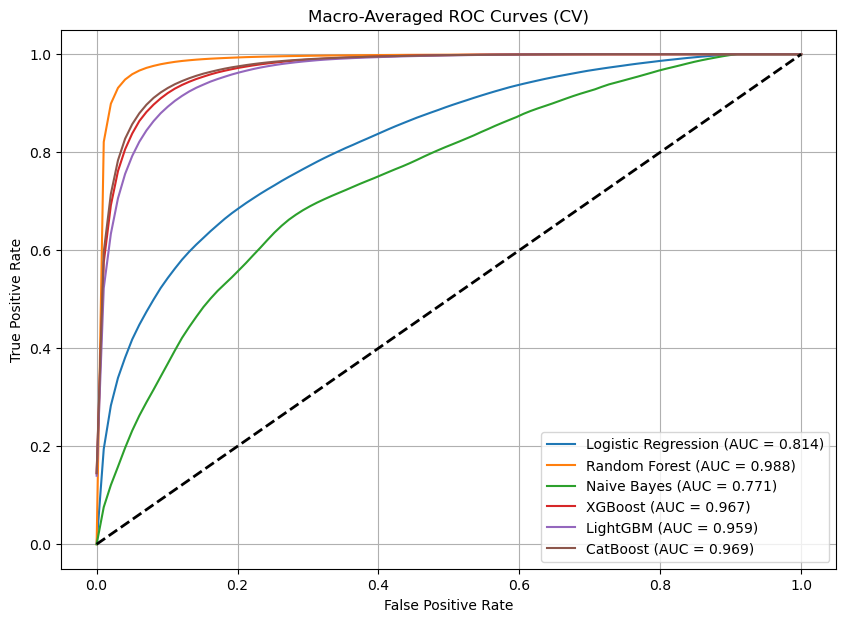

                     Mean AUC
Random Forest        0.988195
CatBoost             0.969458
XGBoost              0.966820
LightGBM             0.958989
Logistic Regression  0.814384
Naive Bayes          0.771412


In [126]:
auc_df = evaluate_models_cv_auc(models, X_array, y_array)
print(auc_df)


In [127]:
def evaluate_nn_auc_cv(model_builder, X, y, n_splits=5, epochs=10, batch_size=32):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    tprs = []

    for train_idx, test_idx in skf.split(X, y):
        X_train, X_test = X[train_idx], X[test_idx]
        y_train, y_test_fold = y[train_idx], y[test_idx]

        y_train_cat = to_categorical(y_train)
        y_test_cat = to_categorical(y_test_fold)

        model = model_builder()
        model.fit(X_train, y_train_cat, epochs=epochs, batch_size=batch_size, verbose=0)

        y_pred_prob = model.predict(X_test)
        fpr, tpr, _ = roc_curve(y_test_cat.ravel(), y_pred_prob.ravel())
        tpr_interp = np.interp(mean_fpr, fpr, tpr)
        tprs.append(tpr_interp)

        auc_score = roc_auc_score(y_test_cat, y_pred_prob, average='macro') # USE OF MACRO
        aucs.append(auc_score)

    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = np.mean(aucs)

    plt.plot(mean_fpr, mean_tpr, label=f'Neural Network (AUC = {mean_auc:.3f})')
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Neural Network ROC Curve (CV)")
    plt.legend()
    plt.grid()
    plt.show()

    return mean_auc
#Ensure your model_builder() is a function that returns a compiled model.



In [128]:
def build_model():
    model = Sequential()
    model.add(Dense(128, activation='relu', input_shape=(X_array.shape[1],)))
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(Dropout(0.3))
    model.add(Dense(len(np.unique(y_array)), activation='softmax'))  # multi-class

    model.compile(
        loss='sparse_categorical_crossentropy',  # or 'categorical_crossentropy' if one-hot
        optimizer='adam',
        metrics=['accuracy']
    )
    return model


In [129]:
nn_auc = evaluate_nn_auc_cv(build_model, X_array, y_array, epochs=20)
auc_df.loc["Neural Network (Keras)"] = nn_auc
print(auc_df.sort_values(by="Mean AUC", ascending=False))


InvalidArgumentError: Graph execution error:

Detected at node 'sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits' defined at (most recent call last):
    File "C:\Users\43197\anaconda3\lib\runpy.py", line 196, in _run_module_as_main
      return _run_code(code, main_globals, None,
    File "C:\Users\43197\anaconda3\lib\runpy.py", line 86, in _run_code
      exec(code, run_globals)
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel_launcher.py", line 17, in <module>
      app.launch_new_instance()
    File "C:\Users\43197\anaconda3\lib\site-packages\traitlets\config\application.py", line 992, in launch_instance
      app.start()
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\kernelapp.py", line 711, in start
      self.io_loop.start()
    File "C:\Users\43197\anaconda3\lib\site-packages\tornado\platform\asyncio.py", line 199, in start
      self.asyncio_loop.run_forever()
    File "C:\Users\43197\anaconda3\lib\asyncio\base_events.py", line 603, in run_forever
      self._run_once()
    File "C:\Users\43197\anaconda3\lib\asyncio\base_events.py", line 1906, in _run_once
      handle._run()
    File "C:\Users\43197\anaconda3\lib\asyncio\events.py", line 80, in _run
      self._context.run(self._callback, *self._args)
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 510, in dispatch_queue
      await self.process_one()
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 499, in process_one
      await dispatch(*args)
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 406, in dispatch_shell
      await result
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\kernelbase.py", line 729, in execute_request
      reply_content = await reply_content
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\ipkernel.py", line 411, in do_execute
      res = shell.run_cell(
    File "C:\Users\43197\anaconda3\lib\site-packages\ipykernel\zmqshell.py", line 531, in run_cell
      return super().run_cell(*args, **kwargs)
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 2961, in run_cell
      result = self._run_cell(
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3016, in _run_cell
      result = runner(coro)
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\async_helpers.py", line 129, in _pseudo_sync_runner
      coro.send(None)
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3221, in run_cell_async
      has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3400, in run_ast_nodes
      if await self.run_code(code, result, async_=asy):
    File "C:\Users\43197\anaconda3\lib\site-packages\IPython\core\interactiveshell.py", line 3460, in run_code
      exec(code_obj, self.user_global_ns, self.user_ns)
    File "C:\Users\43197\AppData\Local\Temp\ipykernel_2808\1107317518.py", line 1, in <module>
      nn_auc = evaluate_nn_auc_cv(build_model, X_array, y_array, epochs=20)
    File "C:\Users\43197\AppData\Local\Temp\ipykernel_2808\3780684696.py", line 15, in evaluate_nn_auc_cv
      model.fit(X_train, y_train_cat, epochs=epochs, batch_size=batch_size, verbose=0)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\utils\traceback_utils.py", line 65, in error_handler
      return fn(*args, **kwargs)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 1564, in fit
      tmp_logs = self.train_function(iterator)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 1160, in train_function
      return step_function(self, iterator)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 1146, in step_function
      outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 1135, in run_step
      outputs = model.train_step(data)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 994, in train_step
      loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\training.py", line 1052, in compute_loss
      return self.compiled_loss(
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\engine\compile_utils.py", line 265, in __call__
      loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\losses.py", line 152, in __call__
      losses = call_fn(y_true, y_pred)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\losses.py", line 272, in call
      return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\losses.py", line 2084, in sparse_categorical_crossentropy
      return backend.sparse_categorical_crossentropy(
    File "C:\Users\43197\anaconda3\lib\site-packages\keras\backend.py", line 5630, in sparse_categorical_crossentropy
      res = tf.nn.sparse_softmax_cross_entropy_with_logits(
Node: 'sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits'
logits and labels must have the same first dimension, got logits shape [32,3] and labels shape [96]
	 [[{{node sparse_categorical_crossentropy/SparseSoftmaxCrossEntropyWithLogits/SparseSoftmaxCrossEntropyWithLogits}}]] [Op:__inference_train_function_464906]

# 8. Model Selection
Choose the best model based on:

Accuracy

F1-Score (Macro for multi-class)

Confusion Matrix

ROC-AUC (One-vs-rest)

✅ Prefer generalization over pure accuracy (avoid overfitting).



# 9. Model Evaluation on Test Set

Once you've trained your models, visualize their performance:

🔍 a. Confusion Matrix
📈 b. ROC Curves (One-vs-Rest for Multi-class)
📊 c. Feature Importance (Tree Models)




# 10. Save Model & Encoder


# 11. Deployment Pipeline


In [ ]:
from flask import Flask, request, jsonify
import joblib
import pandas as pd

app = Flask(__name__)
model = joblib.load("best_model.pkl")
encoder = joblib.load("label_encoder.pkl")

@app.route('/predict', methods=['POST'])
def predict():
    input_data = pd.DataFrame([request.json])
    prediction = model.predict(input_data)[0]
    return jsonify({"class": encoder.inverse_transform([prediction])[0]})

app.run(port=5000)


# 12. CONCLUSION

# HYBRIDISATION OF MODEL

## 🏗️  Stacked Models (Stacking/Blending)


In [ ]:
Model: Logistic Regression + SVM + XGBoost → Meta Learner (e.g., Neural Net)
Idea: Train multiple different base models → combine their predictions using a meta-learner.

                     +--> Logistic Regression
                     |
Features → Stacking  +--> XGBoost
                     |
                     +--> SVM
                           ↓
                  Meta-Learner (e.g. Neural Net)
Use Case: Any tabular or structured data problem with multi-class outputs.

# Hyperparameters to tune using Optuna 


In [60]:
import optuna
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score
from xgboost import XGBClassifier
from imblearn.over_sampling import ADASYN

# ----------------------------
# 1️⃣ Prepare Data
# ----------------------------
# Assuming diabetes1 already exists

X = diabetes2.drop(['DIABETE4', 'DIABTYPE'], axis=1, errors='ignore')
le = LabelEncoder()
y = le.fit_transform(diabetes2['DIABETE4'])

# ----------------------------
# 2️⃣ Optuna Objective Function
# ----------------------------
def objective(trial):
    # Suggest hyperparameters
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'use_label_encoder': False,
        'eval_metric': 'mlogloss',
        'random_state': 42
    }

    # Cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1_scores = []

    for train_idx, val_idx in cv.split(X, y):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        # Balance training fold
        X_res, y_res = ADASYN(random_state=42).fit_resample(X_train, y_train)

        # Train and predict
        model = XGBClassifier(**params)
        model.fit(X_res, y_res)
        y_pred = model.predict(X_val)

        score = f1_score(y_val, y_pred, average='macro')
        f1_scores.append(score)

    return np.mean(f1_scores)

# ----------------------------
# 3️⃣ Run Optimization
# ----------------------------
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30, timeout=600)

# ----------------------------
# 4️⃣ Results
# ----------------------------
print("\n✅ Best Parameters:")
print(study.best_params)

print(f"\n🏆 Best Macro F1-Score: {study.best_value:.4f}")


[I 2025-07-15 19:06:37,206] A new study created in memory with name: no-name-ffe9297d-f7e2-4ff5-a5f1-7b6bd8d615af
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:07:11] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:10:46] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:13:54] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:17:09] WARNING: C:\actions-run


✅ Best Parameters:
{'n_estimators': 385, 'max_depth': 10, 'learning_rate': 0.03326626587280272, 'subsample': 0.9693999619563811, 'colsample_bytree': 0.6487636725634947, 'gamma': 0.7393457651959118, 'min_child_weight': 2}

🏆 Best Macro F1-Score: 0.4274


In [61]:
import optuna
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import f1_score
from xgboost import XGBClassifier

# ----------------------------
# 1️⃣ Load and Prepare Data
# ----------------------------
# Assuming diabetes2 is your raw DataFrame

# Features and encoded labels
X = diabetes2.drop(['DIABETE4', 'DIABTYPE'], axis=1, errors='ignore')
le = LabelEncoder()
y = le.fit_transform(diabetes2['DIABETE4'])

# ----------------------------
# 2️⃣ Optuna Objective Function
# ----------------------------
def objective(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.6, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.6, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'use_label_encoder': False,
        'eval_metric': 'mlogloss',
        'random_state': 42
    }

    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    f1_scores = []

    for train_idx, val_idx in skf.split(X, y):
        X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        model = XGBClassifier(**params)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_val)

        score = f1_score(y_val, y_pred, average='macro')
        f1_scores.append(score)

    return np.mean(f1_scores)

# ----------------------------
# 3️⃣ Run the Optimization
# ----------------------------
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=30, timeout=600)

# ----------------------------
# 4️⃣ Show Best Results
# ----------------------------
print("\n✅ Best Parameters:")
print(study.best_params)

print(f"\n🏆 Best Macro F1-Score: {study.best_value:.4f}")


[I 2025-07-15 19:23:08,853] A new study created in memory with name: no-name-7c76472a-fc18-46e9-81ec-8b49fb33b603
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:23:09] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:23:31] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:23:53] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\43197\anaconda3\lib\site-packages\xgboost\training.py:183: UserWarning: [19:24:15] WARNING: C:\actions-run


✅ Best Parameters:
{'n_estimators': 368, 'max_depth': 8, 'learning_rate': 0.11206194365029354, 'subsample': 0.9296227392885426, 'colsample_bytree': 0.9872441826722, 'gamma': 1.878651709072453, 'min_child_weight': 5}

🏆 Best Macro F1-Score: 0.4240
